# Real Time Dataset creation

In this notebook, we will start by doing the same thing we did in the Asset Selection notebook retrieving the historical data but this time in <b>real-time</b> which means until current date. This data will be used to create our dataset.

## I.Importing Libraries

We will begin by importing the necessary libraries for our analysis.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pandas_datareader as web
import yfinance as yf
import datetime as dt
import requests
import statistics
import ta
import seaborn as sns
from bs4 import BeautifulSoup
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from tensorflow.keras.models import load_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from matplotlib.patches import Ellipse
from sklearn.metrics import confusion_matrix, classification_report, f1_score

## II.Data Understanding

- We are using a CSV file that contains a list of existing stocks. Its purpose is solely to retrieve the symbols, making it easier to obtain the historical data for each stock by looping through them.

In [2]:
df_stocks = pd.read_csv("stocks_list.csv")

In [3]:
df_stocks

,Symbol,Name,Last Sale,Net Change,% Change,Market Cap,Country,IPO Year,Volume,Sector,Industry
0,A,Agilent Technologies Inc. Common Stock,$133.42,1.6400,1.244%,3.892674e+10,United States,1999.0,2009367,Industrials,Biotechnology: Laboratory Analytical Instruments
1,AA,Alcoa Corporation Common Stock,$34.53,-0.3900,-1.117%,6.200196e+09,United States,2016.0,6116269,Industrials,Aluminum
2,AACG,ATA Creativity Global American Depositary Shares,$0.65,-0.0007,-0.108%,2.080008e+07,China,2008.0,21195,Real Estate,Other Consumer Services
3,AACI,Armada Acquisition Corp. I Common Stock,$11.35,-0.0400,-0.351%,0.000000e+00,United States,2021.0,15673,Finance,Blank Checks
4,AACIW,Armada Acquisition Corp. I Warrant,$0.1448,0.0248,20.667%,0.000000e+00,United States,2021.0,52174,Finance,Blank Checks
...,...,...,...,...,...,...,...,...,...,...,...
7077,ZVRA,Zevra Therapeutics Inc. Common Stock,$6.34,0.2900,4.793%,2.653512e+08,United States,NaN,339052,Health Care,Biotechnology: Pharmaceutical Preparations
7078,ZVSA,ZyVersa Therapeutics Inc. Common Stock,$3.86,-0.0500,-1.279%,3.222699e+06,United States,2022.0,54535,Health Care,Biotechnology: Pharmaceutical Preparations
7079,ZWS,Zurn Elkay Water Solutions Corporation Common ...,$31.35,0.3900,1.26%,5.414046e+09,United States,2012.0,551722,Industrials,Industrial Machinery/Components
7080,ZYME,Zymeworks Inc. Common Stock,$10.26,0.4800,4.908%,7.254322e+08,United States,NaN,763023,Health Care,Biotechnology: Pharmaceutical Preparations


In [4]:
df_stocks = df_stocks[['Symbol','Market Cap','Net Change']]

In [5]:
df_stocks

,Symbol,Market Cap,Net Change
0,A,3.892674e+10,1.6400
1,AA,6.200196e+09,-0.3900
2,AACG,2.080008e+07,-0.0007
3,AACI,0.000000e+00,-0.0400
4,AACIW,0.000000e+00,0.0248
...,...,...,...
7077,ZVRA,2.653512e+08,0.2900
7078,ZVSA,3.222699e+06,-0.0500
7079,ZWS,5.414046e+09,0.3900
7080,ZYME,7.254322e+08,0.4800


- This code retrieves historical data for up to <b>100 selected stocks</b> from a list. 
It iterates through the list of stock symbols, downloads data for each symbol 
from January 1, 2019, to the current date using the <b>yfinance library</b>, and stores 
the data in a list. If data is unavailable for a symbol, it skips that symbol and 
continues until 100 valid stocks are selected.

In [6]:
start = dt.datetime(2019, 1, 1)
end = dt.datetime.today()

stocks = df_stocks['Symbol'].tolist()

num_symbols_to_take = 100 
selected_stocks = []
dfs = []

i = 0
while len(selected_stocks) < num_symbols_to_take and i < len(stocks):
    company = stocks[i]
    try:
        data = yf.download(company, start=start, end=end)
        if not data.empty:
            selected_stocks.append(company)
            dfs.append(data)
        else:
            print(f"No data for symbol: {company}")
    except Exception as e:
        print(f"Error downloading data for symbol: {company}. Error: {e}")
    i += 1

print(f"Selected stocks: {selected_stocks}")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['AACIW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
[*********************100%%**********************]  1 of 1 completed

No data for symbol: AACIW



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['AAGRW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


No data for symbol: AAGRW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

No data for symbol: ABLLW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ABR^D']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ABR^D


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ABR^E']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ABR^E


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ABR^F']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ABR^F


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ABVEW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
[*********************100%%**********************]  1 of 1 completed


No data for symbol: ABVEW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ACACW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


No data for symbol: ACACW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

No data for symbol: ACONW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ACP^A']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ACP^A


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ACR^C']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ACR^C


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ACR^D']: YFTzMissingError('$%ticker%: possibly delisted; No timezone found')


No data for symbol: ACR^D


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

No data for symbol: ADC^A


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ADNWW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


No data for symbol: ADNWW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['ADSEW']: YFInvalidPeriodError("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


No data for symbol: ADSEW


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Selected stocks: ['A', 'AA', 'AACG', 'AACI', 'AACT', 'AADI', 'AAGR', 'AAL', 'AAMC', 'AAME', 'AAN', 'AAOI', 'AAON', 'AAP', 'AAPL', 'AAT', 'AB', 'ABAT', 'ABBV', 'ABCB', 'ABCL', 'ABEO', 'ABEV', 'ABG', 'ABIO', 'ABL', 'ABLLL', 'ABLV', 'ABM', 'ABNB', 'ABOS', 'ABR', 'ABSI', 'ABT', 'ABTS', 'ABUS', 'ABVC', 'ABVE', 'ABVX', 'AC', 'ACA', 'ACAB', 'ACAC', 'ACAD', 'ACB', 'ACCD', 'ACCO', 'ACDC', 'ACEL', 'ACET', 'ACGL', 'ACGLN', 'ACGLO', 'ACHC', 'ACHL', 'ACHR', 'ACHV', 'ACI', 'ACIC', 'ACIU', 'ACIW', 'ACLS', 'ACLX', 'ACM', 'ACMR', 'ACN', 'ACNB', 'ACNT', 'ACON', 'ACP', 'ACR', 'ACRE', 'ACRS', 'ACRV', 'ACST', 'ACT', 'ACTG', 'ACU', 'ACV', 'ACVA', 'ACXP', 'ADAG', 'ADAP', 'ADBE', 'ADC', 'ADCT', 'ADD', 'ADEA', 'ADI', 'ADIL', 'ADM', 'ADMA', 'ADN', 'ADNT', 'ADP', 'ADPT', 'ADRT', 'ADSE', 'ADSK', 'ADT']


In [7]:
dfs_yf = []

for i in range(0,num_symbols_to_take):
    dfs_yf.append(dfs[i])

In [8]:
print("#"*80)
for i in range(0,num_symbols_to_take):
    print("Stock : ",selected_stocks[i])
    display(dfs[i])
    print("#"*80)

################################################################################
Stock :  A


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,66.500000,66.570000,65.300003,65.690002,63.161701,2113300
2019-01-03,65.529999,65.779999,62.000000,63.270000,60.834835,5383900
2019-01-04,64.089996,65.949997,64.089996,65.459999,62.940529,3123700
2019-01-07,65.639999,67.430000,65.610001,66.849998,64.277046,3235100
2019-01-08,67.589996,68.209999,66.699997,67.830002,65.219330,1578100
...,...,...,...,...,...,...
2024-08-19,140.550003,141.289993,139.279999,140.509995,140.509995,1714000
2024-08-20,140.600006,141.539993,139.429993,139.750000,139.750000,1227700
2024-08-21,139.979996,140.789993,139.149994,139.990005,139.990005,2263000


################################################################################
Stock :  AA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,25.955000,26.847000,25.480000,26.240000,25.445898,3067000
2019-01-03,26.120001,26.850000,25.530001,26.240000,25.445898,2979900
2019-01-04,26.840000,28.610001,26.650000,28.340000,27.482349,5653300
2019-01-07,28.530001,28.910000,28.146000,28.420000,27.559927,2441000
2019-01-08,28.730000,28.847000,27.650000,28.250000,27.395075,2218300
...,...,...,...,...,...,...
2024-08-19,32.509998,34.139999,32.310001,34.000000,34.000000,7297900
2024-08-20,34.099998,34.750000,33.680000,33.759998,33.759998,5105200
2024-08-21,34.040001,34.049999,32.919998,33.290001,33.290001,4287700


################################################################################
Stock :  AACG


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,0.91,1.00,0.90,0.94,0.94,30600
2019-01-03,0.99,1.00,0.94,0.94,0.94,43300
2019-01-04,0.98,1.00,0.93,0.93,0.93,6900
2019-01-07,0.93,0.98,0.93,0.94,0.94,21600
2019-01-08,0.97,1.00,0.94,0.99,0.99,15000
...,...,...,...,...,...,...
2024-08-19,0.50,0.61,0.50,0.60,0.60,92100
2024-08-20,0.57,0.68,0.52,0.65,0.65,158200
2024-08-21,0.65,0.65,0.62,0.62,0.62,17800


################################################################################
Stock :  AACI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-11-10,9.77,9.78,9.75,9.75,9.75,373293
2021-11-11,9.76,9.82,9.75,9.78,9.78,24405
2021-11-12,9.78,9.80,9.72,9.75,9.75,943316
2021-11-15,9.78,9.79,9.73,9.79,9.79,13630
2021-11-16,9.75,9.78,9.73,9.75,9.75,190750
...,...,...,...,...,...,...
2024-08-19,9.75,9.75,9.75,9.75,9.75,0
2024-08-20,9.75,9.75,9.75,9.75,9.75,0
2024-08-21,9.75,9.75,9.75,9.75,9.75,0


################################################################################
Stock :  AACT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-06-13,10.14,10.14,10.110,10.11,10.11,5500
2023-06-14,10.11,10.13,10.095,10.10,10.10,143900
2023-06-15,10.11,10.11,10.100,10.11,10.11,2061100
2023-06-16,10.12,10.12,10.110,10.11,10.11,251000
2023-06-20,10.13,10.13,10.110,10.12,10.12,102800
...,...,...,...,...,...,...
2024-08-19,10.77,10.77,10.760,10.76,10.76,9800
2024-08-20,10.76,10.77,10.760,10.76,10.76,103900
2024-08-21,10.75,10.77,10.750,10.75,10.75,6600


################################################################################
Stock :  AADI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,26.400000,30.600000,26.400000,29.850000,29.850000,5640
2019-01-03,30.450001,32.250000,28.500000,31.049999,31.049999,5187
2019-01-04,32.250000,32.250000,31.049999,31.875000,31.875000,4660
2019-01-07,32.250000,33.450001,30.900000,31.950001,31.950001,5867
2019-01-08,32.250000,36.599998,30.180000,36.000000,36.000000,9260
...,...,...,...,...,...,...
2024-08-19,1.490000,1.560000,1.481000,1.560000,1.560000,91100
2024-08-20,1.550000,1.630000,1.550000,1.620000,1.620000,664100
2024-08-21,1.440000,1.570000,1.400000,1.550000,1.550000,3815800


################################################################################
Stock :  AAGR


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-10-05,6.860215,7.025090,6.860215,7.025090,7.025090,800312
2021-10-06,6.939068,7.010753,6.936918,7.000000,7.000000,125690
2021-10-07,6.996416,7.025090,6.974910,6.996416,6.996416,420732
2021-10-08,6.977061,7.017921,6.977061,6.989247,6.989247,33201
2021-10-11,6.989247,6.996416,6.974910,6.989247,6.989247,54266
...,...,...,...,...,...,...
2024-08-19,0.123000,0.129000,0.123000,0.128000,0.128000,78800
2024-08-20,0.112000,0.159000,0.112000,0.148000,0.148000,1359300
2024-08-21,0.140000,0.140000,0.133000,0.135000,0.135000,205300


################################################################################
Stock :  AAL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,31.459999,32.650002,31.049999,32.480000,31.963156,5229500
2019-01-03,31.690001,31.850000,28.809999,30.059999,29.581663,16822000
2019-01-04,30.440001,32.090000,30.400000,32.040001,31.530159,9369600
2019-01-07,31.990000,33.480000,31.240000,32.950001,32.425678,8010700
2019-01-08,33.360001,33.650002,32.200001,32.419998,31.904110,7107700
...,...,...,...,...,...,...
2024-08-19,10.150000,10.380000,10.120000,10.310000,10.310000,30380100
2024-08-20,10.310000,10.450000,10.210000,10.290000,10.290000,23537400
2024-08-21,10.370000,10.450000,10.300000,10.400000,10.400000,20233700


################################################################################
Stock :  AAMC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-03-21,9.935294,11.000000,8.235294,9.264706,9.264706,123760
2022-03-22,8.655882,10.247059,8.352941,8.647059,8.647059,143820
2022-03-23,8.764706,9.352941,8.147059,8.264706,8.264706,102170
2022-03-24,8.326471,8.558824,8.294118,8.394118,8.394118,12580
2022-03-25,8.352941,9.250000,8.352941,8.958824,8.958824,56610
...,...,...,...,...,...,...
2024-08-19,2.330000,2.390000,2.310000,2.310000,2.310000,1200
2024-08-20,2.310000,2.350000,2.310000,2.340000,2.340000,9700
2024-08-21,2.310000,2.340000,2.310000,2.310000,2.310000,3700


################################################################################
Stock :  AAME


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,2.43,2.49,2.43,2.49,2.395549,1800
2019-01-03,2.51,2.72,2.50,2.65,2.549481,6900
2019-01-04,2.65,3.06,2.65,2.95,2.838101,1300
2019-01-07,2.41,3.06,2.41,2.77,2.664928,2600
2019-01-08,2.89,2.89,2.43,2.65,2.549481,6200
...,...,...,...,...,...,...
2024-08-19,1.51,1.55,1.50,1.55,1.550000,6100
2024-08-20,1.60,1.60,1.51,1.51,1.510000,12400
2024-08-21,1.55,1.60,1.52,1.53,1.530000,3500


################################################################################
Stock :  AAN


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-11-25,30.000000,31.000000,26.500000,26.500000,23.394470,1200
2020-11-27,26.350000,26.350000,22.299999,22.299999,19.686668,5200
2020-11-30,23.288000,23.500000,19.190001,19.190001,16.941126,65100
2020-12-01,21.700001,22.110001,16.740000,18.410000,16.252537,8782600
2020-12-02,18.129999,18.600000,17.260000,18.250000,16.111286,2105400
...,...,...,...,...,...,...
2024-08-19,10.080000,10.100000,10.070000,10.080000,10.080000,1036000
2024-08-20,10.090000,10.090000,10.080000,10.080000,10.080000,484900
2024-08-21,10.090000,10.100000,10.080000,10.090000,10.090000,376900


################################################################################
Stock :  AAOI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,15.00,16.290001,14.850,15.88,15.88,478300
2019-01-03,15.51,15.800000,15.015,15.06,15.06,398400
2019-01-04,15.33,15.770000,15.160,15.54,15.54,765400
2019-01-07,15.68,16.033001,15.330,15.68,15.68,546300
2019-01-08,15.90,16.389999,15.770,16.01,16.01,477500
...,...,...,...,...,...,...
2024-08-19,8.35,8.750000,8.220,8.60,8.60,1563200
2024-08-20,8.59,8.860000,8.540,8.78,8.78,1539100
2024-08-21,8.85,8.945000,8.430,8.92,8.92,1502900


################################################################################
Stock :  AAON


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,23.046667,23.600000,22.913334,23.379999,22.643108,187200
2019-01-03,23.299999,23.386667,22.346666,22.513332,21.803757,247500
2019-01-04,22.879999,23.866667,22.806667,23.740000,22.991760,368550
2019-01-07,23.733334,24.213333,23.453333,24.100000,23.340416,171000
2019-01-08,24.366667,24.606667,23.926666,24.219999,23.456633,212250
...,...,...,...,...,...,...
2024-08-19,89.019997,91.160004,89.019997,90.930000,90.930000,337800
2024-08-20,91.150002,91.150002,89.360001,89.559998,89.559998,271500
2024-08-21,89.690002,92.010002,89.570000,91.949997,91.949997,281300


################################################################################
Stock :  AAP


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,156.160004,159.919998,153.820007,157.919998,143.991592,1291000
2019-01-03,158.229996,164.070007,157.740005,162.850006,148.486771,1514700
2019-01-04,164.169998,164.500000,158.479996,158.809998,144.803116,1423000
2019-01-07,161.679993,163.570007,156.830002,161.139999,146.927628,2088300
2019-01-08,162.009995,162.949997,157.179993,160.020004,145.906372,1604700
...,...,...,...,...,...,...
2024-08-19,62.189999,62.220001,60.520000,60.900002,60.900002,1295000
2024-08-20,60.849998,61.180000,60.279999,60.810001,60.810001,967400
2024-08-21,61.480000,61.970001,60.810001,61.919998,61.919998,1875800


################################################################################
Stock :  AAPL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,38.722500,39.712502,38.557499,39.480000,37.750084,148158800
2019-01-03,35.994999,36.430000,35.500000,35.547501,33.989891,365248800
2019-01-04,36.132500,37.137501,35.950001,37.064999,35.440895,234428400
2019-01-07,37.174999,37.207500,36.474998,36.982498,35.362022,219111200
2019-01-08,37.389999,37.955002,37.130001,37.687500,36.036129,164101200
...,...,...,...,...,...,...
2024-08-19,225.720001,225.990005,223.039993,225.889999,225.889999,40687800
2024-08-20,225.770004,227.169998,225.449997,226.509995,226.509995,30299000
2024-08-21,226.520004,227.979996,225.050003,226.399994,226.399994,34765500


################################################################################
Stock :  AAT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,39.689999,39.689999,38.939999,39.299999,31.443974,235000
2019-01-03,39.369999,39.959999,39.040001,39.310001,31.451981,166400
2019-01-04,39.509998,40.070000,39.220001,39.630001,31.708010,240000
2019-01-07,39.820000,40.619999,39.750000,40.250000,32.204071,191300
2019-01-08,40.400002,41.230000,40.400002,41.080002,32.868160,324700
...,...,...,...,...,...,...
2024-08-19,25.530001,25.930000,25.469999,25.920000,25.920000,168400
2024-08-20,25.820000,25.820000,25.440001,25.629999,25.629999,196500
2024-08-21,25.709999,26.080000,25.530001,26.030001,26.030001,181900


################################################################################
Stock :  AB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,26.959999,28.049999,26.910000,27.270000,16.823788,859500
2019-01-03,27.230000,28.000000,26.969999,27.469999,16.947178,532200
2019-01-04,27.940001,28.670000,27.900000,28.100000,17.335850,504100
2019-01-07,28.090000,28.540001,27.799999,27.959999,17.249474,492500
2019-01-08,28.219999,28.450001,27.799999,28.100000,17.335850,497400
...,...,...,...,...,...,...
2024-08-19,34.830002,34.959999,34.380001,34.580002,34.580002,450200
2024-08-20,34.450001,34.680000,34.310001,34.340000,34.340000,219300
2024-08-21,34.529999,35.070000,34.150002,35.070000,35.070000,265100


################################################################################
Stock :  ABAT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,4.425,4.800,4.185,4.395,4.395,38360
2019-01-03,4.500,4.500,4.200,4.485,4.485,19153
2019-01-04,4.920,5.250,4.500,4.950,4.950,54580
2019-01-07,5.085,5.385,4.815,5.385,5.385,37600
2019-01-08,5.385,5.685,5.025,5.175,5.175,68200
...,...,...,...,...,...,...
2024-08-19,1.030,1.070,1.030,1.060,1.060,230100
2024-08-20,1.050,1.070,1.031,1.070,1.070,167600
2024-08-21,1.050,1.070,1.040,1.055,1.055,191600


################################################################################
Stock :  ABBV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,91.239998,91.260002,88.419998,89.230003,68.699387,6908400
2019-01-03,88.639999,88.800003,86.080002,86.290001,66.435829,7653200
2019-01-04,87.750000,89.139999,86.269997,89.070000,68.576187,8910600
2019-01-07,90.070000,90.760002,89.199997,90.370003,69.577065,7281500
2019-01-08,91.199997,92.300003,90.400002,90.790001,69.900436,7478300
...,...,...,...,...,...,...
2024-08-19,193.399994,197.179993,193.350006,196.869995,196.869995,4309300
2024-08-20,197.119995,197.479996,194.130005,196.149994,196.149994,3631800
2024-08-21,196.440002,197.339996,195.669998,196.529999,196.529999,4250400


################################################################################
Stock :  ABCB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,31.270000,32.549999,31.270000,31.950001,29.379932,488700
2019-01-03,31.730000,32.470001,31.420000,31.840000,29.278780,434500
2019-01-04,32.310001,33.200001,32.070000,33.080002,30.419033,316500
2019-01-07,33.200001,34.450001,32.869999,34.389999,31.623659,581500
2019-01-08,34.849998,34.889999,33.570000,34.310001,31.550087,339300
...,...,...,...,...,...,...
2024-08-19,58.380001,58.840000,57.959999,58.730000,58.730000,227500
2024-08-20,58.430000,58.459999,57.509998,57.720001,57.720001,249300
2024-08-21,58.049999,58.220001,57.410000,58.099998,58.099998,201200


################################################################################
Stock :  ABCL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-12-11,61.000000,71.910004,48.980000,58.900002,58.900002,9249200
2020-12-14,56.925999,60.691002,50.000000,50.009998,50.009998,1487300
2020-12-15,50.810001,52.209999,45.259998,46.990002,46.990002,3958000
2020-12-16,47.130001,49.730000,42.150002,47.529999,47.529999,1688700
2020-12-17,48.540001,50.500000,48.139999,48.599998,48.599998,636300
...,...,...,...,...,...,...
2024-08-19,2.630000,2.800000,2.630000,2.710000,2.710000,2466700
2024-08-20,2.640000,2.650000,2.560000,2.600000,2.600000,2679600
2024-08-21,2.640000,2.668000,2.580000,2.640000,2.640000,1207100


################################################################################
Stock :  ABEO


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,175.00,179.50,170.25,175.75,175.75,16636
2019-01-03,175.75,177.75,162.75,165.50,165.50,21540
2019-01-04,169.25,178.00,163.75,175.50,175.50,19528
2019-01-07,177.25,189.00,175.50,187.75,187.75,27528
2019-01-08,190.25,192.00,181.00,182.75,182.75,18572
...,...,...,...,...,...,...
2024-08-19,5.00,5.25,4.91,5.23,5.23,286400
2024-08-20,5.20,5.34,5.05,5.13,5.13,307300
2024-08-21,5.17,5.27,5.07,5.24,5.24,198000


################################################################################
Stock :  ABEV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,4.00,4.24,3.97,4.20,3.439977,20573600
2019-01-03,4.26,4.29,4.17,4.24,3.472739,21264400
2019-01-04,4.29,4.44,4.27,4.42,3.620167,25632200
2019-01-07,4.41,4.43,4.31,4.35,3.562834,29566800
2019-01-08,4.42,4.45,4.29,4.33,3.546453,28894000
...,...,...,...,...,...,...
2024-08-19,2.40,2.44,2.39,2.42,2.420000,30750500
2024-08-20,2.39,2.40,2.37,2.37,2.370000,22764300
2024-08-21,2.39,2.40,2.33,2.36,2.360000,32674000


################################################################################
Stock :  ABG


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,65.709999,68.459999,65.709999,68.120003,68.120003,252900
2019-01-03,67.699997,68.500000,66.769997,67.839996,67.839996,154100
2019-01-04,68.570000,69.180000,67.669998,68.470001,68.470001,227200
2019-01-07,67.900002,71.070000,67.900002,70.660004,70.660004,321300
2019-01-08,71.199997,71.199997,69.099998,69.830002,69.830002,459200
...,...,...,...,...,...,...
2024-08-19,230.380005,231.500000,228.660004,230.029999,230.029999,85600
2024-08-20,229.029999,230.369995,224.970001,226.259995,226.259995,100500
2024-08-21,230.889999,235.619995,229.669998,235.039993,235.039993,139900


################################################################################
Stock :  ABIO


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,5.58,6.30,5.58,5.94,5.94,7250
2019-01-03,5.94,6.30,5.94,6.12,6.12,7922
2019-01-04,6.30,7.56,5.94,6.84,6.84,19650
2019-01-07,6.84,7.38,6.66,6.84,6.84,4728
2019-01-08,7.20,7.20,6.48,6.66,6.66,6367
...,...,...,...,...,...,...
2024-08-19,3.10,3.67,3.08,3.58,3.58,600900
2024-08-20,3.73,3.80,3.58,3.67,3.67,178300
2024-08-21,3.70,3.99,3.70,3.87,3.87,207600


################################################################################
Stock :  ABL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-09-14,9.80,9.80,9.710,9.71,9.71,7400
2020-09-15,9.80,9.84,9.700,9.70,9.70,511600
2020-09-16,9.70,9.80,9.700,9.80,9.80,471100
2020-09-17,9.80,9.80,9.770,9.78,9.78,463000
2020-09-18,9.81,10.00,9.755,9.76,9.76,1154700
...,...,...,...,...,...,...
2024-08-19,10.23,10.62,10.000,10.51,10.51,95900
2024-08-20,10.54,11.00,10.490,10.98,10.98,81600
2024-08-21,10.95,10.95,10.000,10.21,10.21,72500


################################################################################
Stock :  ABLLL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-11-24,25.000000,25.000,24.900000,24.900000,23.710764,2400
2023-11-27,24.809999,24.900,24.799999,24.900000,23.710764,1300
2023-11-28,24.790001,24.850,24.750000,24.750000,23.567926,3300
2023-11-29,24.760000,24.760,24.680000,24.680000,23.501272,2700
2023-11-30,24.760000,24.760,24.670000,24.670000,23.491749,800
...,...,...,...,...,...,...
2024-08-19,25.200001,25.400,25.200001,25.400000,25.400000,15600
2024-08-20,25.360001,25.490,25.360001,25.490000,25.490000,2700
2024-08-21,25.475000,25.475,25.120001,25.350000,25.350000,6300


################################################################################
Stock :  ABLV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-09-05,4.15,4.15,3.465,3.50,3.50,162700
2023-09-06,3.59,3.59,3.000,3.00,3.00,74600
2023-09-07,2.91,3.00,2.820,2.89,2.89,45300
2023-09-08,2.82,2.88,2.710,2.82,2.82,35500
2023-09-11,2.82,2.88,2.781,2.85,2.85,15500
...,...,...,...,...,...,...
2024-08-19,1.70,1.82,1.453,1.73,1.73,21100
2024-08-20,1.83,1.90,1.540,1.73,1.73,17600
2024-08-21,1.75,1.76,1.730,1.73,1.73,4400


################################################################################
Stock :  ABM


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,31.510000,31.629999,30.660000,31.280001,28.090826,1039300
2019-01-03,31.219999,31.809999,30.790001,30.950001,27.794477,720600
2019-01-04,31.290001,32.009998,31.049999,32.009998,28.746397,1242800
2019-01-07,32.119999,33.630001,31.580000,33.480000,30.066521,881400
2019-01-08,34.029999,35.889999,33.860001,34.980000,31.413593,1673300
...,...,...,...,...,...,...
2024-08-19,54.110001,54.619999,54.029999,54.610001,54.610001,188300
2024-08-20,54.580002,54.650002,54.110001,54.250000,54.250000,239400
2024-08-21,54.369999,54.770000,54.150002,54.630001,54.630001,182600


################################################################################
Stock :  ABNB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-12-10,146.000000,165.000000,141.250000,144.710007,144.710007,70447500
2020-12-11,146.550003,151.500000,135.100006,139.250000,139.250000,26980800
2020-12-14,135.000000,135.300003,125.160004,130.000000,130.000000,16966100
2020-12-15,126.690002,127.599998,121.500000,124.800003,124.800003,10914400
2020-12-16,125.830002,142.000000,124.910004,137.990005,137.990005,20409600
...,...,...,...,...,...,...
2024-08-19,116.930000,119.300003,116.440002,119.139999,119.139999,4184700
2024-08-20,118.940002,119.279999,117.175003,117.379997,117.379997,3940000
2024-08-21,118.040001,118.269997,116.699997,117.680000,117.680000,5028500


################################################################################
Stock :  ABOS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-07-01,26.000000,26.980000,18.900000,20.100000,20.100000,2246700
2021-07-02,19.500000,20.990000,16.927999,20.280001,20.280001,414600
2021-07-06,19.309999,20.590000,18.010000,20.200001,20.200001,151600
2021-07-07,20.040001,20.068001,18.360001,18.750000,18.750000,169200
2021-07-08,18.549999,18.620001,17.030001,17.780001,17.780001,120800
...,...,...,...,...,...,...
2024-08-19,2.590000,2.850000,2.565000,2.830000,2.830000,159600
2024-08-20,2.860000,3.100000,2.720000,2.830000,2.830000,262600
2024-08-21,2.890000,2.890000,2.760000,2.850000,2.850000,119700


################################################################################
Stock :  ABR


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,10.00,10.19,9.94,10.18,5.705213,715900
2019-01-03,10.14,10.37,10.13,10.34,5.794880,853600
2019-01-04,10.48,10.64,10.36,10.62,5.951801,1302000
2019-01-07,10.65,10.94,10.61,10.88,6.097516,1519200
2019-01-08,10.94,11.05,10.83,11.05,6.192787,1307600
...,...,...,...,...,...,...
2024-08-19,13.34,13.34,13.02,13.16,13.160000,4724100
2024-08-20,13.10,13.12,12.89,12.89,12.890000,2874200
2024-08-21,12.95,13.18,12.95,13.15,13.150000,2711000


################################################################################
Stock :  ABSI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-07-22,21.000000,22.893999,20.879999,21.590000,21.590000,2545400
2021-07-23,22.000000,24.000000,21.500000,22.889999,22.889999,664300
2021-07-26,23.200001,24.809999,23.000000,23.490000,23.490000,642500
2021-07-27,23.629999,23.777000,22.000000,23.200001,23.200001,584300
2021-07-28,23.100000,24.750000,22.850000,24.500000,24.500000,1213500
...,...,...,...,...,...,...
2024-08-19,4.090000,4.240000,3.980000,4.170000,4.170000,1137800
2024-08-20,4.180000,4.300000,4.060000,4.230000,4.230000,848400
2024-08-21,4.260000,4.370000,4.136000,4.350000,4.350000,741800


################################################################################
Stock :  ABT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,70.389999,70.959999,69.070000,69.500000,62.953064,8737200
2019-01-03,68.739998,68.879997,65.500000,66.220001,59.982048,10570700
2019-01-04,67.120003,68.580002,66.989998,68.110001,61.694008,8299100
2019-01-07,68.190002,69.860001,68.180000,69.129997,62.617905,9503000
2019-01-08,69.550003,69.639999,67.000000,68.300003,61.866123,8905100
...,...,...,...,...,...,...
2024-08-19,111.000000,112.250000,110.839996,111.900002,111.900002,3495800
2024-08-20,111.820000,112.089996,110.330002,110.769997,110.769997,5822400
2024-08-21,110.970001,111.449997,110.680000,111.389999,111.389999,4081400


################################################################################
Stock :  ABTS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,1.700,1.700,1.700,1.700,1.700,2020
2019-01-03,1.800,2.125,1.700,1.750,1.750,4620
2019-01-04,1.950,2.000,1.600,1.600,1.600,5180
2019-01-07,1.600,1.875,1.600,1.875,1.875,40
2019-01-08,1.875,2.450,1.800,2.000,2.000,1540
...,...,...,...,...,...,...
2024-08-19,0.530,0.550,0.489,0.495,0.495,13100
2024-08-20,0.490,0.557,0.490,0.540,0.540,7300
2024-08-21,0.540,0.545,0.499,0.530,0.530,21900


################################################################################
Stock :  ABUS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,3.74,4.03,3.71,4.00,4.00,479500
2019-01-03,3.97,4.06,3.76,3.77,3.77,464100
2019-01-04,3.86,4.17,3.78,4.10,4.10,465800
2019-01-07,4.14,4.35,4.13,4.20,4.20,326300
2019-01-08,4.26,4.26,4.02,4.05,4.05,102100
...,...,...,...,...,...,...
2024-08-19,3.72,3.80,3.68,3.78,3.78,488400
2024-08-20,3.76,3.85,3.76,3.83,3.83,1102900
2024-08-21,3.85,3.94,3.80,3.87,3.87,1065600


################################################################################
Stock :  ABVC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,378.000,378.000,378.000,378.000,378.000,1
2019-01-03,360.000,360.000,360.000,360.000,360.000,1
2019-01-04,360.000,360.000,360.000,360.000,360.000,0
2019-01-07,360.000,360.000,360.000,360.000,360.000,1
2019-01-08,360.000,360.000,360.000,360.000,360.000,3
...,...,...,...,...,...,...
2024-08-19,0.691,0.712,0.660,0.695,0.695,57900
2024-08-20,0.695,0.738,0.695,0.738,0.738,21600
2024-08-21,0.700,0.740,0.700,0.731,0.731,37900


################################################################################
Stock :  ABVE


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2024-07-02,4.07,4.070,3.160,3.730,3.730,211400
2024-07-03,3.57,3.705,2.900,2.990,2.990,182500
2024-07-05,2.80,3.295,2.430,3.220,3.220,139700
2024-07-08,2.95,3.220,2.340,2.520,2.520,96700
2024-07-09,2.35,2.567,2.180,2.330,2.330,85200
2024-07-10,2.20,2.890,2.100,2.408,2.408,108800
2024-07-11,2.49,2.600,2.230,2.254,2.254,68200
2024-07-12,2.30,2.400,2.060,2.300,2.300,2130000
2024-07-15,2.27,2.270,1.931,2.010,2.010,210000


################################################################################
Stock :  ABVX


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-10-20,11.60,11.600,8.000,8.30,8.30,2992200
2023-10-23,8.14,8.160,7.995,8.10,8.10,777700
2023-10-24,8.50,8.850,8.320,8.74,8.74,405000
2023-10-25,8.91,9.155,8.520,9.10,9.10,511500
2023-10-26,9.00,9.100,8.750,9.05,9.05,230500
...,...,...,...,...,...,...
2024-08-19,10.92,11.160,10.860,11.12,11.12,38800
2024-08-20,11.20,11.790,10.970,11.38,11.38,103600
2024-08-21,11.27,11.840,11.270,11.55,11.55,58200


################################################################################
Stock :  AC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,34.676617,35.641792,34.676617,35.462688,34.419231,7638
2019-01-03,35.343285,36.318409,35.343285,35.980099,34.921413,8543
2019-01-04,36.338306,36.338306,35.781094,35.820896,34.766891,7638
2019-01-07,35.910446,37.860699,34.845772,37.860699,36.746677,10954
2019-01-08,37.850746,39.004974,37.850746,38.059700,36.939823,9547
...,...,...,...,...,...,...
2024-08-19,32.410000,32.689999,31.860001,32.419998,32.419998,3400
2024-08-20,32.200001,32.650002,31.770000,32.384998,32.384998,6100
2024-08-21,32.349998,32.509998,32.169998,32.500000,32.500000,3300


################################################################################
Stock :  ACA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,27.480000,28.270000,26.569000,28.260000,27.616245,334500
2019-01-03,28.049999,28.600000,27.959999,28.280001,27.635788,309600
2019-01-04,28.500000,29.350000,28.389999,29.010000,28.349163,223000
2019-01-07,29.000000,30.510000,28.629999,30.450001,29.756359,723600
2019-01-08,30.790001,31.000000,29.990000,30.219999,29.531591,598200
...,...,...,...,...,...,...
2024-08-19,83.750000,86.750000,83.750000,86.669998,86.669998,377900
2024-08-20,86.410004,87.169998,85.129997,86.019997,86.019997,298500
2024-08-21,86.629997,87.379997,85.519997,87.370003,87.370003,181100


################################################################################
Stock :  ACAB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-03-09,9.92,9.920,9.900,9.900,9.900,1600
2022-03-10,9.92,9.920,9.920,9.920,9.920,1700
2022-03-11,9.88,9.895,9.870,9.871,9.871,1200
2022-03-14,9.88,9.880,9.880,9.880,9.880,200
2022-03-15,9.88,9.880,9.880,9.880,9.880,0
...,...,...,...,...,...,...
2024-08-19,11.10,11.100,11.100,11.100,11.100,700
2024-08-20,11.10,11.100,11.100,11.100,11.100,0
2024-08-21,11.05,11.100,10.925,11.100,11.100,9300


################################################################################
Stock :  ACAC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-08-08,10.060,10.06,10.032,10.045,10.045,4100
2022-08-09,10.050,10.05,10.010,10.030,10.030,1700
2022-08-10,10.001,10.03,10.000,10.030,10.030,800
2022-08-11,10.030,10.03,9.990,10.000,10.000,3100
2022-08-12,10.010,10.03,10.010,10.030,10.030,1200
...,...,...,...,...,...,...
2024-08-19,11.530,11.53,11.520,11.530,11.530,169400
2024-08-20,11.535,11.60,11.535,11.590,11.590,51100
2024-08-21,11.650,11.65,11.600,11.640,11.640,15900


################################################################################
Stock :  ACAD


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,15.840000,16.750000,15.730000,16.650000,16.650000,1649400
2019-01-03,16.799999,17.270000,16.150000,16.170000,16.170000,1847600
2019-01-04,16.440001,17.650000,16.440001,17.570000,17.570000,2198400
2019-01-07,17.879999,18.400000,17.299999,18.230000,18.230000,2200500
2019-01-08,18.410000,18.540001,17.600000,18.540001,18.540001,1765200
...,...,...,...,...,...,...
2024-08-19,15.280000,15.780000,15.280000,15.760000,15.760000,1393400
2024-08-20,15.660000,15.840000,15.520000,15.570000,15.570000,1105200
2024-08-21,15.660000,15.970000,15.660000,15.930000,15.930000,1253400


################################################################################
Stock :  ACB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,586.799988,633.599976,579.599976,628.799988,628.799988,74403
2019-01-03,621.599976,634.799988,609.599976,616.799988,616.799988,52063
2019-01-04,625.200012,642.000000,617.039978,626.400024,626.400024,69827
2019-01-07,636.000000,642.000000,625.200012,631.200012,631.200012,52155
2019-01-08,638.400024,642.000000,600.000000,603.599976,603.599976,115852
...,...,...,...,...,...,...
2024-08-19,6.970000,7.050000,6.730000,6.800000,6.800000,1267700
2024-08-20,6.800000,6.800000,6.320000,6.340000,6.340000,1447500
2024-08-21,6.320000,6.480000,6.315000,6.390000,6.390000,838400


################################################################################
Stock :  ACCD


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-07-01,0.550000,0.550000,0.550000,0.550000,0.550000,100
2020-07-02,35.000000,36.889999,29.110001,29.700001,29.700001,8507600
2020-07-06,31.000000,31.179001,28.680000,30.000000,30.000000,1781400
2020-07-07,30.299999,30.850000,29.440001,30.150000,30.150000,852100
2020-07-08,30.250000,34.570000,30.080000,34.310001,34.310001,1392800
...,...,...,...,...,...,...
2024-08-19,4.140000,4.315000,4.120000,4.270000,4.270000,1793900
2024-08-20,4.250000,4.290000,4.125000,4.180000,4.180000,539900
2024-08-21,4.210000,4.390000,4.140000,4.330000,4.330000,561500


################################################################################
Stock :  ACCO


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,6.69,7.41,6.69,7.17,5.601398,1173400
2019-01-03,7.10,7.35,7.04,7.20,5.624835,1030100
2019-01-04,7.20,7.70,7.20,7.68,5.999823,961100
2019-01-07,7.62,7.90,7.59,7.76,6.062322,883100
2019-01-08,7.83,7.92,7.74,7.90,6.171693,917100
...,...,...,...,...,...,...
2024-08-19,5.08,5.28,5.08,5.28,5.280000,629600
2024-08-20,5.25,5.30,5.22,5.27,5.270000,446000
2024-08-21,5.34,5.35,5.25,5.31,5.310000,356700


################################################################################
Stock :  ACDC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-05-13,17.600000,18.950001,17.60,18.110001,18.110001,6325600
2022-05-16,18.000000,18.590000,17.16,17.990000,17.990000,1283600
2022-05-17,18.219999,18.370001,17.68,18.080000,18.080000,898000
2022-05-18,18.049999,18.299999,17.77,17.980000,17.980000,790800
2022-05-19,17.820000,18.000000,16.75,16.879999,16.879999,2122300
...,...,...,...,...,...,...
2024-08-19,6.560000,6.850000,6.51,6.590000,6.590000,789500
2024-08-20,6.530000,6.720000,6.39,6.510000,6.510000,1012900
2024-08-21,6.600000,6.640000,6.20,6.350000,6.350000,1118100


################################################################################
Stock :  ACEL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,9.98,10.010,9.980,10.01,10.01,42100
2019-01-03,9.98,10.001,9.980,10.00,10.00,3000
2019-01-04,10.05,10.050,9.990,10.00,10.00,25900
2019-01-07,10.02,10.050,10.020,10.05,10.05,300
2019-01-08,10.00,10.050,10.000,10.05,10.05,36900
...,...,...,...,...,...,...
2024-08-19,11.11,11.270,11.089,11.27,11.27,92300
2024-08-20,11.22,11.280,11.140,11.15,11.15,141800
2024-08-21,11.24,11.330,11.160,11.27,11.27,108500


################################################################################
Stock :  ACET


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,58.520000,63.139999,56.349998,62.299999,62.299999,9471
2019-01-03,62.230000,62.230000,56.630001,58.029999,58.029999,5771
2019-01-04,59.220001,62.160000,58.099998,61.459999,61.459999,5243
2019-01-07,62.160000,64.330002,59.570000,62.369999,62.369999,6443
2019-01-08,63.209999,63.209999,55.650002,59.360001,59.360001,6171
...,...,...,...,...,...,...
2024-08-19,1.500000,1.640000,1.500000,1.550000,1.550000,688500
2024-08-20,1.580000,1.600000,1.450000,1.470000,1.470000,336300
2024-08-21,1.490000,1.620000,1.480000,1.570000,1.570000,423400


################################################################################
Stock :  ACGL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,26.370001,26.520000,26.040001,26.190001,26.190001,818400
2019-01-03,25.969999,26.160000,25.750000,25.780001,25.780001,897000
2019-01-04,25.980000,26.480000,25.070000,26.389999,26.389999,913200
2019-01-07,26.379999,26.719999,26.260000,26.330000,26.330000,766800
2019-01-08,26.420000,26.500000,25.850000,26.430000,26.430000,1098900
...,...,...,...,...,...,...
2024-08-19,102.540001,103.470001,102.360001,103.000000,103.000000,865200
2024-08-20,102.970001,103.290001,102.279999,102.800003,102.800003,700600
2024-08-21,103.199997,104.720001,102.970001,104.599998,104.599998,1013200


################################################################################
Stock :  ACGLN


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-06-03,25.000000,25.040001,24.980000,25.000000,21.058868,3787900
2021-06-04,25.100000,25.400000,25.010000,25.270000,21.286304,843000
2021-06-07,25.200001,25.350000,25.190001,25.270000,21.286304,728300
2021-06-08,25.299999,25.299999,25.150000,25.250000,21.269453,364400
2021-06-09,25.270000,25.389999,25.250000,25.320000,21.328423,413400
...,...,...,...,...,...,...
2024-08-19,19.990000,20.100000,19.988001,20.000000,20.000000,24800
2024-08-20,20.070000,20.122000,19.980000,20.010000,20.010000,14700
2024-08-21,20.010000,20.020000,19.900000,19.950001,19.950001,67100


################################################################################
Stock :  ACGLO


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,20.299999,20.886000,20.270000,20.809999,15.226488,63800
2019-01-03,20.870001,21.040001,20.459999,20.770000,15.197218,35200
2019-01-04,20.980000,21.604000,20.980000,21.480000,15.716722,71900
2019-01-07,21.580000,22.059999,21.580000,21.850000,15.987448,80100
2019-01-08,21.990000,22.170000,21.930000,22.129999,16.192318,41600
...,...,...,...,...,...,...
2024-08-19,23.209999,23.389999,23.209999,23.334999,23.334999,8200
2024-08-20,23.270000,23.430000,23.270000,23.410000,23.410000,6000
2024-08-21,23.370001,23.520000,23.370001,23.480000,23.480000,8000


################################################################################
Stock :  ACHC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,25.420000,26.100000,25.129999,25.860001,25.860001,796800
2019-01-03,25.700001,26.270000,25.190001,25.400000,25.400000,1172600
2019-01-04,25.620001,26.430000,25.420000,26.139999,26.139999,2271900
2019-01-07,25.990000,26.820000,25.790001,26.299999,26.299999,809700
2019-01-08,26.610001,27.030001,26.190001,26.990000,26.990000,713800
...,...,...,...,...,...,...
2024-08-19,74.320000,75.290001,72.519997,75.190002,75.190002,540400
2024-08-20,75.209999,75.870003,74.129997,74.949997,74.949997,440900
2024-08-21,74.980003,77.040001,72.959999,76.730003,76.730003,841300


################################################################################
Stock :  ACHL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-03-31,18.000000,18.948000,16.059999,16.549999,16.549999,2110800
2021-04-01,16.299999,17.344000,15.060000,16.000000,16.000000,506500
2021-04-05,15.630000,15.950000,14.730000,14.920000,14.920000,169200
2021-04-06,14.870000,17.990000,14.729000,17.860001,17.860001,447200
2021-04-07,17.510000,17.790001,15.550000,15.610000,15.610000,173300
...,...,...,...,...,...,...
2024-08-19,0.750000,0.750000,0.730000,0.736000,0.736000,67500
2024-08-20,0.730000,0.756000,0.725000,0.737000,0.737000,22600
2024-08-21,0.750000,0.760000,0.720000,0.749000,0.749000,59300


################################################################################
Stock :  ACHR


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-12-18,10.15,10.150,9.96,9.97,9.97,54500
2020-12-21,10.34,10.340,9.83,10.07,10.07,23700
2020-12-22,10.09,10.120,9.96,10.02,10.02,186000
2020-12-23,10.14,10.230,9.73,10.06,10.06,30500
2020-12-24,10.05,10.190,9.95,10.03,10.03,254300
...,...,...,...,...,...,...
2024-08-19,3.87,3.880,3.65,3.78,3.78,9796000
2024-08-20,3.79,3.830,3.62,3.62,3.62,7468300
2024-08-21,3.66,3.855,3.62,3.82,3.82,8851500


################################################################################
Stock :  ACHV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,25.200001,27.200001,25.000000,25.600000,25.600000,5675
2019-01-03,25.400000,27.200001,23.200001,26.200001,26.200001,12235
2019-01-04,26.000000,29.000000,25.200001,27.000000,27.000000,8595
2019-01-07,27.400000,28.600000,24.600000,27.000000,27.000000,6000
2019-01-08,29.200001,29.200001,26.200001,26.600000,26.600000,2935
...,...,...,...,...,...,...
2024-08-19,4.530000,4.660000,4.520000,4.630000,4.630000,92000
2024-08-20,4.610000,4.610000,4.350000,4.410000,4.410000,84000
2024-08-21,4.450000,4.480000,4.350000,4.440000,4.440000,93600


################################################################################
Stock :  ACI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-06-26,15.500000,16.500000,15.310000,15.450000,10.656266,37289500
2020-06-29,15.890000,16.010000,15.500000,15.570000,10.739036,7374000
2020-06-30,15.570000,15.900000,15.450000,15.770000,10.876983,5047200
2020-07-01,15.790000,15.890000,15.550000,15.760000,10.870085,3415200
2020-07-02,15.820000,15.890000,15.600000,15.810000,10.904572,7213100
...,...,...,...,...,...,...
2024-08-19,20.860001,20.975000,20.760000,20.920000,20.920000,3301100
2024-08-20,20.840000,20.924999,20.700001,20.750000,20.750000,2123100
2024-08-21,20.900000,20.900000,20.170000,20.290001,20.290001,2689900


################################################################################
Stock :  ACIC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,16.459999,16.459999,16.059999,16.219999,14.425932,92600
2019-01-03,16.190001,16.190001,15.910000,15.910000,14.150221,62100
2019-01-04,16.090000,16.250000,16.070000,16.170000,14.381464,90100
2019-01-07,16.120001,16.280001,16.049999,16.110001,14.328102,67600
2019-01-08,16.129999,16.160000,15.950000,16.059999,14.283629,79900
...,...,...,...,...,...,...
2024-08-19,11.550000,11.660000,11.190000,11.290000,11.290000,163900
2024-08-20,11.200000,11.460000,11.200000,11.260000,11.260000,158200
2024-08-21,11.340000,11.480000,11.070000,11.230000,11.230000,138500


################################################################################
Stock :  ACIU


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,9.38,10.22,9.20,10.220,10.220,44700
2019-01-03,10.20,10.57,9.43,9.430,9.430,56800
2019-01-04,9.91,10.69,9.91,10.050,10.050,119600
2019-01-07,10.37,10.90,10.37,10.500,10.500,186200
2019-01-08,10.68,10.99,10.42,10.710,10.710,509100
...,...,...,...,...,...,...
2024-08-19,3.37,3.42,3.26,3.410,3.410,98900
2024-08-20,3.46,3.46,3.35,3.380,3.380,81800
2024-08-21,3.42,3.44,3.31,3.360,3.360,67100


################################################################################
Stock :  ACIW


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,27.389999,27.530001,26.629999,27.139999,27.139999,772400
2019-01-03,26.219999,26.559999,25.120001,25.160000,25.160000,939000
2019-01-04,25.680000,26.450001,25.590000,26.170000,26.170000,692300
2019-01-07,26.280001,27.370001,26.190001,26.510000,26.510000,666000
2019-01-08,26.809999,27.430000,26.530001,27.389999,27.389999,676500
...,...,...,...,...,...,...
2024-08-19,47.669998,47.970001,47.160000,47.849998,47.849998,524100
2024-08-20,47.790001,47.970001,47.459999,47.799999,47.799999,382800
2024-08-21,47.889999,48.439999,47.759998,48.080002,48.080002,755700


################################################################################
Stock :  ACLS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,17.480000,18.139999,16.920000,17.790001,17.790001,284300
2019-01-03,17.389999,17.430000,16.549999,16.570000,16.570000,210800
2019-01-04,16.820000,17.639999,16.740000,17.610001,17.610001,296700
2019-01-07,17.690001,18.080000,17.450001,17.850000,17.850000,140000
2019-01-08,18.129999,18.209999,17.350000,17.780001,17.780001,221200
...,...,...,...,...,...,...
2024-08-19,115.599998,116.099998,113.699997,116.089996,116.089996,383200
2024-08-20,115.440002,115.480003,111.769997,112.360001,112.360001,352800
2024-08-21,114.389999,116.290001,113.230003,115.610001,115.610001,331500


################################################################################
Stock :  ACLX


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-02-04,19.000000,19.000000,15.793000,16.799999,16.799999,1093100
2022-02-07,18.049999,18.049999,15.650000,17.840000,17.840000,451400
2022-02-08,16.980000,18.136999,16.750000,17.780001,17.780001,132300
2022-02-09,18.070000,18.490000,16.370001,16.400000,16.400000,137800
2022-02-10,16.990000,17.340000,16.190001,16.860001,16.860001,111600
...,...,...,...,...,...,...
2024-08-19,65.099998,66.889999,64.711998,66.370003,66.370003,392300
2024-08-20,65.879997,66.669998,64.987999,65.889999,65.889999,368700
2024-08-21,66.320000,67.750000,66.010002,66.639999,66.639999,402700


################################################################################
Stock :  ACM


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,26.090000,27.100000,25.980000,26.879999,26.234102,1041300
2019-01-03,26.799999,27.150000,26.320000,26.370001,25.736362,1027700
2019-01-04,26.870001,27.770000,26.660000,27.740000,27.073439,862900
2019-01-07,27.549999,28.520000,27.549999,28.270000,27.590706,1207900
2019-01-08,28.549999,28.900000,28.400000,28.610001,27.922533,815700
...,...,...,...,...,...,...
2024-08-19,96.529999,97.730003,96.169998,97.620003,97.620003,433200
2024-08-20,97.309998,97.309998,95.699997,96.430000,96.430000,330200
2024-08-21,96.599998,97.830002,96.169998,97.209999,97.209999,454400


################################################################################
Stock :  ACMR


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,3.590000,3.663333,3.540000,3.623333,3.623333,78900
2019-01-03,3.600000,3.600000,3.437000,3.456667,3.456667,63900
2019-01-04,3.457333,3.600000,3.452333,3.566667,3.566667,68100
2019-01-07,3.505667,3.620000,3.330667,3.583333,3.583333,81600
2019-01-08,3.600000,3.600000,3.476667,3.576667,3.576667,37200
...,...,...,...,...,...,...
2024-08-19,19.959999,20.340000,19.580000,20.290001,20.290001,636900
2024-08-20,20.320000,20.344999,19.610001,19.889999,19.889999,661100
2024-08-21,20.100000,20.200001,19.631001,19.940001,19.940001,725400


################################################################################
Stock :  ACN


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,138.929993,141.190002,138.279999,140.589996,129.528763,2059300
2019-01-03,139.130005,139.570007,135.580002,135.789993,125.106400,2801300
2019-01-04,138.119995,141.339996,137.500000,141.070007,129.970993,2296400
2019-01-07,140.830002,142.369995,139.850006,141.559998,130.422440,2315600
2019-01-08,144.630005,146.809998,142.690002,145.139999,133.720779,2647800
...,...,...,...,...,...,...
2024-08-19,327.559998,330.429993,327.000000,329.440002,329.440002,1678200
2024-08-20,329.929993,330.570007,328.049988,330.369995,330.369995,1790100
2024-08-21,330.839996,333.660004,330.540009,333.600006,333.600006,1233900


################################################################################
Stock :  ACNB


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,39.250000,39.250000,38.270000,38.650002,32.160164,7000
2019-01-03,38.500000,39.200001,38.500000,39.150002,32.576210,6000
2019-01-04,39.250000,39.250000,38.500000,38.840000,32.318268,12500
2019-01-07,38.570000,39.250000,37.480000,38.270000,31.843977,8500
2019-01-08,38.889999,38.980000,37.610001,38.580002,32.101929,7100
...,...,...,...,...,...,...
2024-08-19,39.930000,40.500000,39.000000,40.220001,40.220001,24200
2024-08-20,40.389999,40.389999,39.009998,39.250000,39.250000,11200
2024-08-21,39.250000,39.639999,39.250000,39.400002,39.400002,5900


################################################################################
Stock :  ACNT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,16.50,16.500000,15.40,15.83,15.83,14200
2019-01-03,15.71,15.950000,15.50,15.50,15.50,11700
2019-01-04,15.75,16.799999,15.02,15.46,15.46,19700
2019-01-07,15.46,15.800000,15.32,15.47,15.47,25900
2019-01-08,15.69,16.270000,15.55,15.92,15.92,15000
...,...,...,...,...,...,...
2024-08-19,10.45,10.450000,10.00,10.10,10.10,11100
2024-08-20,9.99,10.200000,9.95,10.00,10.00,27600
2024-08-21,10.00,10.130000,9.95,10.00,10.00,34800


################################################################################
Stock :  ACON


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-04-22,46.400002,52.639999,34.560001,43.520000,43.520000,106569
2022-04-25,41.119999,52.320000,37.759998,40.799999,40.799999,184806
2022-04-26,36.000000,40.959999,34.240002,39.200001,39.200001,58450
2022-04-27,34.400002,64.800003,33.599998,37.439999,37.439999,991925
2022-04-28,36.160000,44.000000,34.560001,34.720001,34.720001,119556
...,...,...,...,...,...,...
2024-08-19,0.230000,0.250000,0.222000,0.243000,0.243000,379500
2024-08-20,0.240000,0.249000,0.230000,0.232000,0.232000,122800
2024-08-21,0.230000,0.240000,0.211000,0.231000,0.231000,5662600


################################################################################
Stock :  ACP


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,9.899327,10.099795,9.803865,10.071157,4.480878,133353
2019-01-03,10.071157,10.185710,10.071157,10.176164,4.527594,106012
2019-01-04,10.185710,10.405271,10.185710,10.328902,4.595551,85689
2019-01-07,10.367087,10.538917,10.338448,10.376633,4.616787,217156
2019-01-08,10.433909,10.529371,10.309810,10.481640,4.663506,169179
...,...,...,...,...,...,...
2024-08-19,6.410000,6.450000,6.400000,6.420000,6.320000,811100
2024-08-20,6.440000,6.450000,6.400000,6.420000,6.320000,759000
2024-08-21,6.420000,6.470000,6.420000,6.460000,6.359377,726100


################################################################################
Stock :  ACR


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,29.730000,30.570000,29.700001,30.540001,28.069115,45467
2019-01-03,30.420000,30.660000,29.910000,29.940001,27.517658,51733
2019-01-04,30.270000,30.690001,30.150000,30.450001,27.986397,32533
2019-01-07,30.360001,30.870001,30.330000,30.750000,28.262123,75333
2019-01-08,30.900000,31.320000,30.719999,30.930000,28.427561,61533
...,...,...,...,...,...,...
2024-08-19,15.450000,15.650000,15.300000,15.630000,15.630000,8700
2024-08-20,15.710000,15.850000,15.670000,15.810000,15.810000,13300
2024-08-21,15.810000,15.930000,15.810000,15.880000,15.880000,11300


################################################################################
Stock :  ACRE


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,12.89,13.14,12.82,13.13,6.893963,103900
2019-01-03,13.09,13.24,13.01,13.05,6.851957,132100
2019-01-04,13.15,13.39,13.09,13.33,6.998973,109100
2019-01-07,13.38,13.98,13.30,13.92,7.308756,388600
2019-01-08,13.94,14.09,13.83,13.96,7.329757,241100
...,...,...,...,...,...,...
2024-08-19,6.85,6.95,6.83,6.94,6.940000,278800
2024-08-20,6.91,6.93,6.80,6.82,6.820000,241800
2024-08-21,6.88,6.89,6.77,6.87,6.870000,246800


################################################################################
Stock :  ACRS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,7.26,7.77,7.001,7.66,7.66,431400
2019-01-03,7.64,7.67,7.250,7.34,7.34,626700
2019-01-04,7.41,7.71,7.340,7.63,7.63,284200
2019-01-07,7.70,7.95,7.610,7.84,7.84,528900
2019-01-08,7.88,8.19,7.660,7.71,7.71,357500
...,...,...,...,...,...,...
2024-08-19,1.20,1.28,1.180,1.28,1.28,443500
2024-08-20,1.28,1.28,1.230,1.25,1.25,211800
2024-08-21,1.25,1.28,1.230,1.27,1.27,226600


################################################################################
Stock :  ACRV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-11-15,13.350000,17.090000,12.708,16.639999,16.639999,528000
2022-11-16,15.900000,20.702999,15.060,16.750000,16.750000,222800
2022-11-17,16.530001,19.500000,14.880,15.720000,15.720000,312200
2022-11-18,15.720000,18.950001,15.590,15.780000,15.780000,215700
2022-11-21,15.770000,16.849001,12.500,12.510000,12.510000,95500
...,...,...,...,...,...,...
2024-08-19,7.720000,8.400000,7.450,8.330000,8.330000,50400
2024-08-20,8.350000,9.230000,8.350,9.030000,9.030000,81300
2024-08-21,9.100000,9.420000,8.810,9.190000,9.190000,72100


################################################################################
Stock :  ACST


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,39.840000,46.080002,38.880001,43.200001,43.200001,15981
2019-01-03,43.200001,43.200001,40.320000,41.759998,41.759998,6123
2019-01-04,39.840000,43.680000,39.840000,43.200001,43.200001,5696
2019-01-07,43.680000,46.080002,43.200001,44.160000,44.160000,11998
2019-01-08,45.119999,45.119999,44.160000,44.160000,44.160000,6410
...,...,...,...,...,...,...
2024-08-19,2.410000,2.530000,2.410000,2.490000,2.490000,13300
2024-08-20,2.460000,2.510000,2.440000,2.440000,2.440000,12700
2024-08-21,2.500000,2.500000,2.400000,2.460000,2.460000,5000


################################################################################
Stock :  ACT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-09-16,20.000000,21.349001,19.510000,20.490000,17.152693,3415200
2021-09-17,20.290001,20.940001,20.000000,20.000000,16.742504,664000
2021-09-20,19.480000,20.420000,19.250000,19.850000,16.616936,1069200
2021-09-21,20.240000,20.733999,19.934999,20.010000,16.750874,261100
2021-09-22,20.049999,21.580000,19.900000,21.340000,17.864252,332500
...,...,...,...,...,...,...
2024-08-19,34.070000,34.470001,34.070000,34.410000,34.410000,173100
2024-08-20,34.490002,34.490002,33.980000,34.040001,34.040001,143800
2024-08-21,34.240002,34.869999,33.919998,34.820000,34.820000,287500


################################################################################
Stock :  ACTG


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,2.95,3.13,2.94,3.10,3.10,132400
2019-01-03,3.07,3.13,2.97,3.00,3.00,163000
2019-01-04,3.02,3.10,2.97,2.99,2.99,182700
2019-01-07,3.01,3.09,2.97,3.07,3.07,170100
2019-01-08,3.07,3.18,3.01,3.14,3.14,136000
...,...,...,...,...,...,...
2024-08-19,4.76,4.77,4.70,4.76,4.76,306600
2024-08-20,4.73,4.80,4.69,4.76,4.76,174700
2024-08-21,4.80,4.82,4.73,4.74,4.74,181000


################################################################################
Stock :  ACU


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,14.000000,14.950000,14.000000,14.950000,13.333952,8100
2019-01-03,14.870000,14.870000,14.870000,14.870000,13.262599,600
2019-01-04,15.200000,15.750000,15.200000,15.750000,14.047477,4900
2019-01-07,15.770000,15.930000,15.750000,15.750000,14.155326,5000
2019-01-08,15.750000,16.000000,15.750000,16.000000,14.380012,600
...,...,...,...,...,...,...
2024-08-19,40.700001,42.000000,40.070000,42.000000,42.000000,28700
2024-08-20,42.040001,42.040001,41.250000,41.880001,41.880001,16700
2024-08-21,42.299999,42.349998,40.770000,42.349998,42.349998,9000


################################################################################
Stock :  ACV


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,18.490000,18.980000,18.299999,18.950001,9.483837,63900
2019-01-03,18.879999,18.920000,18.570000,18.709999,9.363719,67200
2019-01-04,18.740000,19.309999,18.740000,19.200001,9.608953,30800
2019-01-07,19.280001,19.930000,19.280001,19.830000,9.924246,39100
2019-01-08,20.010000,20.280001,19.830000,20.190001,10.104417,36600
...,...,...,...,...,...,...
2024-08-19,21.090000,21.145000,20.930000,20.940001,20.940001,39900
2024-08-20,20.900000,21.030001,20.830000,20.980000,20.980000,24200
2024-08-21,20.930000,21.100000,20.820000,21.020000,21.020000,14100


################################################################################
Stock :  ACVA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-03-24,32.000000,34.500000,29.000000,31.250000,31.250000,11332700
2021-03-25,30.237000,34.991001,26.490000,30.000000,30.000000,3092600
2021-03-26,30.110001,32.000000,29.000000,30.270000,30.270000,1067900
2021-03-29,30.000000,33.730999,29.795000,32.360001,32.360001,1517300
2021-03-30,33.000000,35.779999,32.400002,33.480000,33.480000,1988800
...,...,...,...,...,...,...
2024-08-19,18.540001,18.809999,18.410999,18.620001,18.620001,1004600
2024-08-20,18.700001,19.084999,18.620001,18.920000,18.920000,1891500
2024-08-21,18.940001,18.940001,18.454000,18.660000,18.660000,1531500


################################################################################
Stock :  ACXP


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-06-25,5.95,8.74,5.600,7.89,7.89,14615500
2021-06-28,7.10,7.40,6.000,6.24,6.24,3006000
2021-06-29,6.16,7.00,6.152,6.26,6.26,2179700
2021-06-30,6.37,6.62,5.650,6.38,6.38,2016900
2021-07-01,6.74,6.84,5.820,6.18,6.18,2720600
...,...,...,...,...,...,...
2024-08-19,2.05,2.12,2.045,2.12,2.12,51500
2024-08-20,2.17,2.27,2.130,2.20,2.20,79700
2024-08-21,2.24,2.36,2.170,2.33,2.33,63700


################################################################################
Stock :  ADAG


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-02-09,20.400,31.000000,20.209999,29.990000,29.990000,5135300
2021-02-10,27.618,28.500000,26.010000,26.200001,26.200001,1014900
2021-02-11,26.000,31.830000,26.000000,29.600000,29.600000,499800
2021-02-12,28.010,28.740000,26.209999,27.660000,27.660000,309300
2021-02-16,26.500,26.950001,25.379999,25.559999,25.559999,187300
...,...,...,...,...,...,...
2024-08-19,2.520,2.650000,2.520000,2.630000,2.630000,4900
2024-08-20,2.640,2.650000,2.570000,2.590000,2.590000,5800
2024-08-21,2.605,2.630000,2.500000,2.520000,2.520000,5200


################################################################################
Stock :  ADAP


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,5.63,5.70,5.310,5.54,5.54,414400
2019-01-03,5.45,5.66,5.190,5.34,5.34,399800
2019-01-04,5.43,6.02,5.420,5.72,5.72,943900
2019-01-07,5.79,6.17,5.690,6.06,6.06,288700
2019-01-08,6.22,6.31,5.690,5.80,5.80,371100
...,...,...,...,...,...,...
2024-08-19,1.08,1.12,1.050,1.12,1.12,1630500
2024-08-20,1.11,1.13,1.020,1.06,1.06,2089400
2024-08-21,1.08,1.19,1.079,1.19,1.19,1902000


################################################################################
Stock :  ADBE


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,219.910004,226.169998,219.000000,224.570007,224.570007,2784100
2019-01-03,220.880005,223.630005,215.149994,215.699997,215.699997,3663500
2019-01-04,219.839996,227.649994,217.479996,226.190002,226.190002,4043400
2019-01-07,229.949997,232.600006,227.289993,229.259995,229.259995,3638500
2019-01-08,232.649994,233.770004,228.330002,232.679993,232.679993,3685900
...,...,...,...,...,...,...
2024-08-19,550.590027,563.770020,550.590027,563.119995,563.119995,1423300
2024-08-20,564.479980,568.179993,559.609985,562.250000,562.250000,1219600
2024-08-21,562.130005,566.599976,557.909973,565.789978,565.789978,1401700


################################################################################
Stock :  ADC


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,58.610001,58.740002,56.610001,57.610001,46.010620,460300
2019-01-03,57.880001,59.099998,57.880001,58.900002,47.040882,373200
2019-01-04,58.980000,59.770000,58.549999,58.700001,46.881165,333500
2019-01-07,58.770000,59.490002,58.410000,58.990002,47.112774,314800
2019-01-08,59.889999,60.410000,59.090000,60.369999,48.214920,404600
...,...,...,...,...,...,...
2024-08-19,71.540001,72.419998,71.540001,72.300003,72.300003,908300
2024-08-20,72.400002,72.500000,71.879997,72.169998,72.169998,767800
2024-08-21,72.410004,72.779999,72.050003,72.750000,72.750000,611700


################################################################################
Stock :  ADCT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-05-18,30.000000,30.990000,29.730000,30.000000,30.000000,819800
2020-05-19,30.030001,31.879999,29.799999,31.139999,31.139999,837000
2020-05-20,31.610001,34.689999,31.250000,32.380001,32.380001,259900
2020-05-21,32.790001,35.000000,32.700001,34.330002,34.330002,445200
2020-05-22,34.779999,36.279999,34.000000,35.299999,35.299999,380200
...,...,...,...,...,...,...
2024-08-19,2.790000,2.940000,2.760000,2.930000,2.930000,287600
2024-08-20,2.930000,2.980000,2.730000,2.850000,2.850000,371000
2024-08-21,2.890000,2.990000,2.800000,2.940000,2.940000,481700


################################################################################
Stock :  ADD


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,103.199997,115.199997,88.00,115.199997,115.199997,1790
2019-01-03,114.000000,126.000000,104.00,126.000000,126.000000,1823
2019-01-04,135.199997,144.000000,100.00,112.000000,112.000000,4800
2019-01-07,112.000000,124.000000,108.00,124.000000,124.000000,940
2019-01-08,122.000000,130.800003,114.00,120.000000,120.000000,1888
...,...,...,...,...,...,...
2024-08-19,0.720000,0.740000,0.67,0.740000,0.740000,2500200
2024-08-20,0.740000,0.830000,0.72,0.770000,0.770000,2118300
2024-08-21,0.750000,0.920000,0.68,0.850000,0.850000,4404800


################################################################################
Stock :  ADEA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,7.824807,8.350224,7.824807,8.298117,6.487072,1711043
2019-01-03,8.154821,8.154821,7.842176,8.037579,6.283396,1462552
2019-01-04,8.163506,8.528258,8.163506,8.489178,6.636433,1700213
2019-01-07,8.549970,8.871299,8.510889,8.745373,6.836715,1776391
2019-01-08,8.806165,8.971172,8.638248,8.932091,6.982682,1391436
...,...,...,...,...,...,...
2024-08-19,11.880000,12.085000,11.769000,11.830000,11.830000,315685
2024-08-20,11.810000,11.950000,11.730000,11.920000,11.920000,482094
2024-08-21,11.990000,11.990000,11.775000,11.970000,11.970000,369469


################################################################################
Stock :  ADI


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,84.029999,86.430000,83.959999,85.919998,77.463654,2523900
2019-01-03,82.989998,84.349998,80.550003,80.730003,72.784470,4376600
2019-01-04,81.459999,83.010002,80.459999,82.690002,74.551552,3470000
2019-01-07,82.540001,84.190002,82.080002,83.209999,75.020378,2656300
2019-01-08,84.269997,85.279999,82.669998,85.239998,76.850578,3993500
...,...,...,...,...,...,...
2024-08-19,222.429993,226.080002,221.490005,225.949997,225.949997,2803100
2024-08-20,223.960007,226.020004,221.389999,223.490005,223.490005,3994200
2024-08-21,229.520004,236.860001,224.809998,227.500000,227.500000,5595100


################################################################################
Stock :  ADIL


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,123.50,162.50,116.25,162.50,162.50,40128
2019-01-03,157.25,179.50,151.25,168.75,168.75,85380
2019-01-04,169.50,178.75,152.75,160.00,160.00,30792
2019-01-07,160.00,163.75,142.50,150.00,150.00,10416
2019-01-08,147.25,157.25,144.50,157.25,157.25,6880
...,...,...,...,...,...,...
2024-08-19,0.99,1.01,0.95,0.98,0.98,227200
2024-08-20,0.99,0.99,0.96,0.98,0.98,106400
2024-08-21,0.97,0.99,0.97,0.98,0.98,121600


################################################################################
Stock :  ADM


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,40.570000,41.150002,40.529999,40.950001,34.914417,2497000
2019-01-03,40.790001,41.340000,40.400002,40.770000,34.760948,3273000
2019-01-04,41.169998,41.810001,41.090000,41.709999,35.562405,3117100
2019-01-07,41.540001,42.439999,41.470001,41.919998,35.741455,3970100
2019-01-08,42.230000,42.740002,42.029999,42.700001,36.406483,5096800
...,...,...,...,...,...,...
2024-08-19,59.099998,59.840000,59.099998,59.680000,59.174324,2301100
2024-08-20,59.599998,59.740002,58.990002,59.009998,58.509998,1833800
2024-08-21,58.740002,59.270000,58.619999,59.220001,59.220001,1875900


################################################################################
Stock :  ADMA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,2.380000,2.680000,2.340000,2.620000,2.620000,260300
2019-01-03,2.610000,3.110000,2.610000,2.810000,2.810000,421100
2019-01-04,2.850000,2.960000,2.810000,2.950000,2.950000,218800
2019-01-07,3.080000,3.390000,3.000000,3.140000,3.140000,522800
2019-01-08,3.300000,3.410000,3.200000,3.410000,3.410000,528600
...,...,...,...,...,...,...
2024-08-19,17.610001,18.424999,17.530001,18.219999,18.219999,3937800
2024-08-20,18.120001,18.230000,17.639999,17.930000,17.930000,2243900
2024-08-21,18.000000,18.100000,17.653999,17.840000,17.840000,2736300


################################################################################
Stock :  ADN


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-23,288.299988,290.700012,288.299988,290.700012,290.700012,8333
2019-01-24,290.700012,290.700012,290.700012,290.700012,290.700012,3333
2019-01-25,290.700012,290.700012,290.700012,290.700012,290.700012,0
2019-01-28,289.500000,290.700012,288.899994,290.700012,290.700012,10830
2019-01-29,290.700012,291.000000,290.399994,290.399994,290.399994,4187
...,...,...,...,...,...,...
2024-08-19,3.200000,3.296000,2.960000,2.960000,2.960000,13800
2024-08-20,2.960000,3.225000,2.850000,2.900000,2.900000,17700
2024-08-21,3.000000,3.590000,3.000000,3.220000,3.220000,37800


################################################################################
Stock :  ADNT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,14.890000,15.940000,14.880000,15.650000,15.650000,3680700
2019-01-03,15.550000,16.129999,15.240000,15.290000,15.290000,2204100
2019-01-04,14.800000,15.780000,14.800000,15.180000,15.180000,2989000
2019-01-07,15.210000,16.490000,14.518000,16.370001,16.370001,5124900
2019-01-08,16.879999,18.120001,16.879999,17.889999,17.889999,6358100
...,...,...,...,...,...,...
2024-08-19,22.450001,22.700001,22.245001,22.320000,22.320000,1016600
2024-08-20,22.209999,22.260000,21.450001,21.469999,21.469999,995300
2024-08-21,21.690001,21.799999,21.480000,21.629999,21.629999,1216600


################################################################################
Stock :  ADP


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,129.160004,130.779999,128.610001,130.139999,115.881454,2190100
2019-01-03,128.509995,129.300003,126.059998,126.209999,112.382004,3854000
2019-01-04,128.389999,131.389999,127.540001,131.240005,116.860909,2161300
2019-01-07,130.990005,132.149994,129.500000,130.529999,116.228691,3455800
2019-01-08,131.479996,132.429993,129.059998,131.300003,116.914337,2275600
...,...,...,...,...,...,...
2024-08-19,264.630005,265.880005,262.880005,264.649994,264.649994,998100
2024-08-20,263.869995,265.000000,263.420013,264.540009,264.540009,913300
2024-08-21,265.790009,268.109985,264.730011,267.850006,267.850006,1305100


################################################################################
Stock :  ADPT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-06-27,39.009998,40.619999,36.209999,40.299999,40.299999,11245600
2019-06-28,42.099998,48.825001,41.250000,48.299999,48.299999,5403800
2019-07-01,51.000000,51.000000,39.580002,40.099998,40.099998,4300600
2019-07-02,40.000000,40.400002,37.950001,38.889999,38.889999,1877700
2019-07-03,39.549999,39.549999,38.599998,39.160000,39.160000,1010600
...,...,...,...,...,...,...
2024-08-19,4.890000,4.890000,4.680000,4.810000,4.810000,1664600
2024-08-20,4.800000,4.830000,4.555000,4.590000,4.590000,1290500
2024-08-21,4.630000,4.820000,4.540000,4.610000,4.610000,1320200


################################################################################
Stock :  ADRT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-02-09,9.800,9.850,9.800,9.850,9.850,2000
2022-02-10,9.920,9.920,9.900,9.900,9.900,1400
2022-02-11,9.900,9.940,9.900,9.900,9.900,2000
2022-02-14,9.930,9.930,9.930,9.930,9.930,1000
2022-02-15,9.900,9.900,9.900,9.900,9.900,100000
...,...,...,...,...,...,...
2024-08-19,13.920,13.920,11.800,12.295,12.295,7900
2024-08-20,12.300,13.040,12.300,12.517,12.517,8300
2024-08-21,12.517,12.517,12.517,12.517,12.517,400


################################################################################
Stock :  ADSE


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-03-10,10.370,10.370,9.89,9.93,9.93,35400
2021-03-11,9.930,9.950,9.81,9.89,9.89,70400
2021-03-12,9.800,9.840,9.80,9.84,9.84,8700
2021-03-15,9.820,9.900,9.82,9.86,9.86,41000
2021-03-16,9.857,9.857,9.84,9.84,9.84,3500
...,...,...,...,...,...,...
2024-08-19,12.840,13.000,12.72,12.95,12.95,189200
2024-08-20,12.610,13.050,12.61,13.00,13.00,216600
2024-08-21,12.960,13.000,12.85,13.00,13.00,129700


################################################################################
Stock :  ADSK


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,125.389999,129.639999,124.650002,128.960007,128.960007,1517500
2019-01-03,126.489998,127.500000,121.120003,121.849998,121.849998,2564700
2019-01-04,124.370003,129.369995,121.809998,128.279999,128.279999,2480600
2019-01-07,128.270004,133.399994,128.149994,132.720001,132.720001,1634600
2019-01-08,134.259995,135.699997,132.250000,133.869995,133.869995,1324800
...,...,...,...,...,...,...
2024-08-19,248.500000,251.440002,248.000000,251.110001,251.110001,1050200
2024-08-20,250.770004,251.889999,249.779999,250.130005,250.130005,871200
2024-08-21,250.309998,252.929993,250.009995,252.059998,252.059998,1055900


################################################################################
Stock :  ADT


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,5.94,6.45,5.879,6.41,5.286597,2066600
2019-01-03,6.40,6.45,6.250,6.32,5.212370,2306500
2019-01-04,6.39,6.76,6.330,6.67,5.501030,4152300
2019-01-07,6.68,6.91,6.610,6.79,5.599999,2198500
2019-01-08,6.90,6.97,6.680,6.95,5.731958,1751000
...,...,...,...,...,...,...
2024-08-19,7.48,7.60,7.450,7.59,7.590000,2806400
2024-08-20,7.58,7.62,7.350,7.37,7.370000,3546900
2024-08-21,7.39,7.44,7.310,7.41,7.410000,2787500


################################################################################


=> These are The historical data for each stock.

- After retrieving the data, we'll focus on the 'Adjusted Close' column. Using this column, we can begin creating our dataset by adding various indicators for each stock.

In [9]:
for i in range(0,num_symbols_to_take):
    dfs[i] = dfs[i][['Adj Close']]

In [10]:
dfs[0]

,Adj Close
Date,
2019-01-02,63.161701
2019-01-03,60.834835
2019-01-04,62.940529
2019-01-07,64.277046
2019-01-08,65.219330
...,...
2024-08-19,140.509995
2024-08-20,139.750000
2024-08-21,139.990005


## III.Data Preparation

### Indicators Calculations

Our goal is to classify stocks based on the <b>client's objectives</b>, such as seeking higher returns with low risk or maintaining returns with minimal risk. To achieve this, we need meaningful and useful features, such as <b>indicators</b> like return, risk, beta value, and Sharpe ratio...

### 1.Return 

Starting with a stock's return, it's essentially the price change from the previous day to today (for daily returns).

#### Simple Daily Return

In [11]:
log_returns = pd.DataFrame()

for i in range(0,num_symbols_to_take):
    log_returns = dfs[i]['Adj Close'].pct_change()
    dfs[i]['Simple Daily Returns'] = log_returns

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\2228388729.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['Simple Daily Returns'] = log_returns
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\2228388729.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['Simple Daily Returns'] = log_returns
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\2228388729.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

In [12]:
dfs[0]

,Adj Close,Simple Daily Returns
Date,,
2019-01-02,63.161701,NaN
2019-01-03,60.834835,-0.036840
2019-01-04,62.940529,0.034613
2019-01-07,64.277046,0.021235
2019-01-08,65.219330,0.014660
...,...,...
2024-08-19,140.509995,0.003356
2024-08-20,139.750000,-0.005409
2024-08-21,139.990005,0.001717


To calculate the percentage change over the entire period, we need to compute the cumulative daily returns.

#### Cumulative Daily Return

In [13]:
for i in range(0,num_symbols_to_take):
    df_cum_daily_returns = (1 + dfs[i]['Simple Daily Returns']).cumprod() - 1 
    dfs[i]['Cum Daily Returns'] = df_cum_daily_returns

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\3782098163.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['Cum Daily Returns'] = df_cum_daily_returns
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\3782098163.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['Cum Daily Returns'] = df_cum_daily_returns
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\3782098163.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

In [14]:
dfs[0]

,Adj Close,Simple Daily Returns,Cum Daily Returns
Date,,,
2019-01-02,63.161701,NaN,NaN
2019-01-03,60.834835,-0.036840,-0.036840
2019-01-04,62.940529,0.034613,-0.003502
2019-01-07,64.277046,0.021235,0.017659
2019-01-08,65.219330,0.014660,0.032577
...,...,...,...
2024-08-19,140.509995,0.003356,1.224608
2024-08-20,139.750000,-0.005409,1.212575
2024-08-21,139.990005,0.001717,1.216375


Last record of the dataframe multiplied by 100 is giving us <b>the percentage change</b> of the stock prices for our entire period <b>(2019-01-02 to 2024-07-30)</b>.

In [15]:
dfs[0].iloc[-1]['Cum Daily Returns']*100

123.03071708880941

Looks like <b>'A'</b> stock price increased by 115% during the period

Notice that we got the same results as when we applied formula (b).

- Percentage Return
$$
\text{Percentage Return} = \left(\frac{\text{Current Price} - \text{Initial Price}}{\text{Initial Price}}\right) \times 100
$$


In [16]:
df_ret_0 = dfs[0]['Adj Close']
cum_return = ((df_ret_0.iloc[-1] - df_ret_0.iloc[0]) / df_ret_0.iloc[0])*100

In [17]:
cum_return

123.03071708880968

In [18]:
perc_returns = []

for i in range(0,num_symbols_to_take):
    df_ret = dfs[i]['Adj Close']
    value = ((df_ret.iloc[-1] - df_ret.iloc[0]) / df_ret.iloc[0])*100
    perc_returns.append(value)

perc_returns

[123.03071708880968,
 33.30242105920412,
 -31.914894966153124,
 0.0,
 6.330369585127133,
 -94.70686759556567,
 -98.03561246519811,
 -67.49382186871993,
 -74.4190482347046,
 -35.71411936428594,
 -56.95564121629554,
 -38.85390448255151,
 317.56635844976756,
 -65.8660615497074,
 500.89931667050325,
 -15.277885109869171,
 107.80100016892446,
 -75.65415114685575,
 187.55715711340224,
 110.65398837384586,
 -95.56876090410785,
 -96.85917497529076,
 -30.23209232404904,
 254.932456005264,
 -29.966333209789163,
 6.076211640267763,
 7.756963508713391,
 -51.714284079415464,
 97.32420911014992,
 -19.25230249960063,
 -85.52238790744785,
 133.64596134010557,
 -79.20333608436788,
 79.0063824444481,
 -71.47058819404522,
 -2.74999737739563,
 -99.81084656778467,
 -69.7050941165326,
 39.7590375289219,
 -1.9443531632936355,
 231.0008394303808,
 12.121220294729687,
 16.475855852674076,
 -4.2642645910741805,
 -98.96469459999015,
 703.636360089641,
 -2.7028559335495705,
 -64.10822870826055,
 14.48551224885544

In [19]:
dfs_ind = []

for i in range(0,num_symbols_to_take):
    df = pd.DataFrame({ 'Percentage Return': perc_returns[i] }, index=[selected_stocks[i]])
    dfs_ind.append(df)

In [20]:
print("-"*80)
for i in range(0,num_symbols_to_take):
    print("Stock :",selected_stocks[i])
    display(dfs_ind[i])
    print("-"*80)


--------------------------------------------------------------------------------
Stock : A


,Percentage Return
A,123.030717


--------------------------------------------------------------------------------
Stock : AA


,Percentage Return
AA,33.302421


--------------------------------------------------------------------------------
Stock : AACG


,Percentage Return
AACG,-31.914895


--------------------------------------------------------------------------------
Stock : AACI


,Percentage Return
AACI,0.0


--------------------------------------------------------------------------------
Stock : AACT


,Percentage Return
AACT,6.33037


--------------------------------------------------------------------------------
Stock : AADI


,Percentage Return
AADI,-94.706868


--------------------------------------------------------------------------------
Stock : AAGR


,Percentage Return
AAGR,-98.035612


--------------------------------------------------------------------------------
Stock : AAL


,Percentage Return
AAL,-67.493822


--------------------------------------------------------------------------------
Stock : AAMC


,Percentage Return
AAMC,-74.419048


--------------------------------------------------------------------------------
Stock : AAME


,Percentage Return
AAME,-35.714119


--------------------------------------------------------------------------------
Stock : AAN


,Percentage Return
AAN,-56.955641


--------------------------------------------------------------------------------
Stock : AAOI


,Percentage Return
AAOI,-38.853904


--------------------------------------------------------------------------------
Stock : AAON


,Percentage Return
AAON,317.566358


--------------------------------------------------------------------------------
Stock : AAP


,Percentage Return
AAP,-65.866062


--------------------------------------------------------------------------------
Stock : AAPL


,Percentage Return
AAPL,500.899317


--------------------------------------------------------------------------------
Stock : AAT


,Percentage Return
AAT,-15.277885


--------------------------------------------------------------------------------
Stock : AB


,Percentage Return
AB,107.801


--------------------------------------------------------------------------------
Stock : ABAT


,Percentage Return
ABAT,-75.654151


--------------------------------------------------------------------------------
Stock : ABBV


,Percentage Return
ABBV,187.557157


--------------------------------------------------------------------------------
Stock : ABCB


,Percentage Return
ABCB,110.653988


--------------------------------------------------------------------------------
Stock : ABCL


,Percentage Return
ABCL,-95.568761


--------------------------------------------------------------------------------
Stock : ABEO


,Percentage Return
ABEO,-96.859175


--------------------------------------------------------------------------------
Stock : ABEV


,Percentage Return
ABEV,-30.232092


--------------------------------------------------------------------------------
Stock : ABG


,Percentage Return
ABG,254.932456


--------------------------------------------------------------------------------
Stock : ABIO


,Percentage Return
ABIO,-29.966333


--------------------------------------------------------------------------------
Stock : ABL


,Percentage Return
ABL,6.076212


--------------------------------------------------------------------------------
Stock : ABLLL


,Percentage Return
ABLLL,7.756964


--------------------------------------------------------------------------------
Stock : ABLV


,Percentage Return
ABLV,-51.714284


--------------------------------------------------------------------------------
Stock : ABM


,Percentage Return
ABM,97.324209


--------------------------------------------------------------------------------
Stock : ABNB


,Percentage Return
ABNB,-19.252302


--------------------------------------------------------------------------------
Stock : ABOS


,Percentage Return
ABOS,-85.522388


--------------------------------------------------------------------------------
Stock : ABR


,Percentage Return
ABR,133.645961


--------------------------------------------------------------------------------
Stock : ABSI


,Percentage Return
ABSI,-79.203336


--------------------------------------------------------------------------------
Stock : ABT


,Percentage Return
ABT,79.006382


--------------------------------------------------------------------------------
Stock : ABTS


,Percentage Return
ABTS,-71.470588


--------------------------------------------------------------------------------
Stock : ABUS


,Percentage Return
ABUS,-2.749997


--------------------------------------------------------------------------------
Stock : ABVC


,Percentage Return
ABVC,-99.810847


--------------------------------------------------------------------------------
Stock : ABVE


,Percentage Return
ABVE,-69.705094


--------------------------------------------------------------------------------
Stock : ABVX


,Percentage Return
ABVX,39.759038


--------------------------------------------------------------------------------
Stock : AC


,Percentage Return
AC,-1.944353


--------------------------------------------------------------------------------
Stock : ACA


,Percentage Return
ACA,231.000839


--------------------------------------------------------------------------------
Stock : ACAB


,Percentage Return
ACAB,12.12122


--------------------------------------------------------------------------------
Stock : ACAC


,Percentage Return
ACAC,16.475856


--------------------------------------------------------------------------------
Stock : ACAD


,Percentage Return
ACAD,-4.264265


--------------------------------------------------------------------------------
Stock : ACB


,Percentage Return
ACB,-98.964695


--------------------------------------------------------------------------------
Stock : ACCD


,Percentage Return
ACCD,703.63636


--------------------------------------------------------------------------------
Stock : ACCO


,Percentage Return
ACCO,-2.702856


--------------------------------------------------------------------------------
Stock : ACDC


,Percentage Return
ACDC,-64.108229


--------------------------------------------------------------------------------
Stock : ACEL


,Percentage Return
ACEL,14.485512


--------------------------------------------------------------------------------
Stock : ACET


,Percentage Return
ACET,-97.608347


--------------------------------------------------------------------------------
Stock : ACGL


,Percentage Return
ACGL,316.265729


--------------------------------------------------------------------------------
Stock : ACGLN


,Percentage Return
ACGLN,-4.173387


--------------------------------------------------------------------------------
Stock : ACGLO


,Percentage Return
ACGLO,54.270634


--------------------------------------------------------------------------------
Stock : ACHC


,Percentage Return
ACHC,209.010061


--------------------------------------------------------------------------------
Stock : ACHL


,Percentage Return
ACHL,-95.516616


--------------------------------------------------------------------------------
Stock : ACHR


,Percentage Return
ACHR,-61.685057


--------------------------------------------------------------------------------
Stock : ACHV


,Percentage Return
ACHV,-82.382812


--------------------------------------------------------------------------------
Stock : ACI


,Percentage Return
ACI,96.410261


--------------------------------------------------------------------------------
Stock : ACIC


,Percentage Return
ACIC,-21.738159


--------------------------------------------------------------------------------
Stock : ACIU


,Percentage Return
ACIU,-69.863015


--------------------------------------------------------------------------------
Stock : ACIW


,Percentage Return
ACIW,82.31393


--------------------------------------------------------------------------------
Stock : ACLS


,Percentage Return
ACLS,542.046067


--------------------------------------------------------------------------------
Stock : ACLX


,Percentage Return
ACLX,312.976193


--------------------------------------------------------------------------------
Stock : ACM


,Percentage Return
ACM,274.169479


--------------------------------------------------------------------------------
Stock : ACMR


,Percentage Return
ACMR,437.90253


--------------------------------------------------------------------------------
Stock : ACN


,Percentage Return
ACN,157.294196


--------------------------------------------------------------------------------
Stock : ACNB


,Percentage Return
ACNB,31.622469


--------------------------------------------------------------------------------
Stock : ACNT


,Percentage Return
ACNT,-35.88124


--------------------------------------------------------------------------------
Stock : ACON


,Percentage Return
ACON,-99.448529


--------------------------------------------------------------------------------
Stock : ACP


,Percentage Return
ACP,41.266959


--------------------------------------------------------------------------------
Stock : ACR


,Percentage Return
ACR,-44.137888


--------------------------------------------------------------------------------
Stock : ACRE


,Percentage Return
ACRE,1.828225


--------------------------------------------------------------------------------
Stock : ACRS


,Percentage Return
ACRS,-84.203655


--------------------------------------------------------------------------------
Stock : ACRV


,Percentage Return
ACRV,-43.75


--------------------------------------------------------------------------------
Stock : ACST


,Percentage Return
ACST,-94.328704


--------------------------------------------------------------------------------
Stock : ACT


,Percentage Return
ACT,105.215596


--------------------------------------------------------------------------------
Stock : ACTG


,Percentage Return
ACTG,54.516133


--------------------------------------------------------------------------------
Stock : ACU


,Percentage Return
ACU,227.659788


--------------------------------------------------------------------------------
Stock : ACV


,Percentage Return
ACV,122.694681


--------------------------------------------------------------------------------
Stock : ACVA


,Percentage Return
ACVA,-39.328003


--------------------------------------------------------------------------------
Stock : ACXP


,Percentage Return
ACXP,-71.229404


--------------------------------------------------------------------------------
Stock : ADAG


,Percentage Return
ADAG,-90.163388


--------------------------------------------------------------------------------
Stock : ADAP


,Percentage Return
ADAP,-78.158844


--------------------------------------------------------------------------------
Stock : ADBE


,Percentage Return
ADBE,148.608438


--------------------------------------------------------------------------------
Stock : ADC


,Percentage Return
ADC,58.441684


--------------------------------------------------------------------------------
Stock : ADCT


,Percentage Return
ADCT,-89.766667


--------------------------------------------------------------------------------
Stock : ADD


,Percentage Return
ADD,-99.244792


--------------------------------------------------------------------------------
Stock : ADEA


,Percentage Return
ADEA,86.062381


--------------------------------------------------------------------------------
Stock : ADI


,Percentage Return
ADI,194.835047


--------------------------------------------------------------------------------
Stock : ADIL


,Percentage Return
ADIL,-99.403077


--------------------------------------------------------------------------------
Stock : ADM


,Percentage Return
ADM,73.280853


--------------------------------------------------------------------------------
Stock : ADMA


,Percentage Return
ADMA,602.290092


--------------------------------------------------------------------------------
Stock : ADN


,Percentage Return
ADN,-98.888889


--------------------------------------------------------------------------------
Stock : ADNT


,Percentage Return
ADNT,39.297123


--------------------------------------------------------------------------------
Stock : ADP


,Percentage Return
ADP,132.651555


--------------------------------------------------------------------------------
Stock : ADPT


,Percentage Return
ADPT,-87.940446


--------------------------------------------------------------------------------
Stock : ADRT


,Percentage Return
ADRT,30.456852


--------------------------------------------------------------------------------
Stock : ADSE


,Percentage Return
ADSE,24.974818


--------------------------------------------------------------------------------
Stock : ADSK


,Percentage Return
ADSK,97.93733


--------------------------------------------------------------------------------
Stock : ADT


,Percentage Return
ADT,41.679044


--------------------------------------------------------------------------------


These are the percentage returns for each stock. For example, Stock A's price increased by 115%, Stock AA's price rose by 22%, while Stock AACG's price decreased by 37% during the period.

### 2.Risk

For risk calculation, we first compute the daily volatility, which measures the standard deviation of daily returns. Next, we annualize this daily volatility by multiplying it by the square root of 252, assuming 252 trading days in a year. This provides an estimate of the annualized volatility, which we then convert to a percentage to express the risk in percentage terms.

1. **Calculate Daily Volatility:**

To calculate the Daily Volatility for each stock, we used the following formula:

   $$
   \text{Volatility}_{\text{daily}} = \sqrt{\frac{1}{N-1} \sum_{t=1}^N (r_t - \bar{r})^2}
   $$

   where:
   - \( r_t \) is the return on day \( t \)
   - \( \bar{r} \) is the average return
   - \( N \) is the number of days

In [21]:
daily_volatility = []

for i in range(0,num_symbols_to_take):
    volatility_daily = statistics.stdev(dfs[i]['Simple Daily Returns'][1:])
    daily_volatility.append(volatility_daily)

daily_volatility

[0.018338971185752,
 0.03815762787217117,
 0.26253358848735137,
 0.02204061629279408,
 0.0012919858864506631,
 0.0572973858697439,
 0.05674731269410219,
 0.037486090515196045,
 0.07261056328377805,
 0.055183797188564636,
 0.037756781654878835,
 0.05764022019107299,
 0.023458852383964245,
 0.02498771991200691,
 0.01980940937955083,
 0.023155352108689815,
 0.02364436663855829,
 0.09182200326975637,
 0.015675889135037563,
 0.027055654887779126,
 0.04270726653238796,
 0.06527194141467604,
 0.023985049452012623,
 0.029793757214044418,
 0.1152427809268573,
 0.025983668644159918,
 0.006582812416619759,
 0.05812951808143697,
 0.023402219311839185,
 0.03172726894825019,
 0.06625092737940125,
 0.029904475483112102,
 0.06100103513071743,
 0.01613070981954634,
 0.0977305915371689,
 0.0631633058485372,
 0.365688337456361,
 0.09547792015967173,
 0.027262891810532836,
 0.028695191018901285,
 0.02553478718317736,
 0.00992554922596269,
 0.004210097016425976,
 0.041706948552441656,
 0.06786147653697637,

In [22]:
print("-"*80)
for i in range(0,num_symbols_to_take):
    print("Stock : ",selected_stocks[i])
    display(daily_volatility[i])
    print("-"*80)

--------------------------------------------------------------------------------
Stock :  A


0.018338971185752

--------------------------------------------------------------------------------
Stock :  AA


0.03815762787217117

--------------------------------------------------------------------------------
Stock :  AACG


0.26253358848735137

--------------------------------------------------------------------------------
Stock :  AACI


0.02204061629279408

--------------------------------------------------------------------------------
Stock :  AACT


0.0012919858864506631

--------------------------------------------------------------------------------
Stock :  AADI


0.0572973858697439

--------------------------------------------------------------------------------
Stock :  AAGR


0.05674731269410219

--------------------------------------------------------------------------------
Stock :  AAL


0.037486090515196045

--------------------------------------------------------------------------------
Stock :  AAMC


0.07261056328377805

--------------------------------------------------------------------------------
Stock :  AAME


0.055183797188564636

--------------------------------------------------------------------------------
Stock :  AAN


0.037756781654878835

--------------------------------------------------------------------------------
Stock :  AAOI


0.05764022019107299

--------------------------------------------------------------------------------
Stock :  AAON


0.023458852383964245

--------------------------------------------------------------------------------
Stock :  AAP


0.02498771991200691

--------------------------------------------------------------------------------
Stock :  AAPL


0.01980940937955083

--------------------------------------------------------------------------------
Stock :  AAT


0.023155352108689815

--------------------------------------------------------------------------------
Stock :  AB


0.02364436663855829

--------------------------------------------------------------------------------
Stock :  ABAT


0.09182200326975637

--------------------------------------------------------------------------------
Stock :  ABBV


0.015675889135037563

--------------------------------------------------------------------------------
Stock :  ABCB


0.027055654887779126

--------------------------------------------------------------------------------
Stock :  ABCL


0.04270726653238796

--------------------------------------------------------------------------------
Stock :  ABEO


0.06527194141467604

--------------------------------------------------------------------------------
Stock :  ABEV


0.023985049452012623

--------------------------------------------------------------------------------
Stock :  ABG


0.029793757214044418

--------------------------------------------------------------------------------
Stock :  ABIO


0.1152427809268573

--------------------------------------------------------------------------------
Stock :  ABL


0.025983668644159918

--------------------------------------------------------------------------------
Stock :  ABLLL


0.006582812416619759

--------------------------------------------------------------------------------
Stock :  ABLV


0.05812951808143697

--------------------------------------------------------------------------------
Stock :  ABM


0.023402219311839185

--------------------------------------------------------------------------------
Stock :  ABNB


0.03172726894825019

--------------------------------------------------------------------------------
Stock :  ABOS


0.06625092737940125

--------------------------------------------------------------------------------
Stock :  ABR


0.029904475483112102

--------------------------------------------------------------------------------
Stock :  ABSI


0.06100103513071743

--------------------------------------------------------------------------------
Stock :  ABT


0.01613070981954634

--------------------------------------------------------------------------------
Stock :  ABTS


0.0977305915371689

--------------------------------------------------------------------------------
Stock :  ABUS


0.0631633058485372

--------------------------------------------------------------------------------
Stock :  ABVC


0.365688337456361

--------------------------------------------------------------------------------
Stock :  ABVE


0.09547792015967173

--------------------------------------------------------------------------------
Stock :  ABVX


0.027262891810532836

--------------------------------------------------------------------------------
Stock :  AC


0.028695191018901285

--------------------------------------------------------------------------------
Stock :  ACA


0.02553478718317736

--------------------------------------------------------------------------------
Stock :  ACAB


0.00992554922596269

--------------------------------------------------------------------------------
Stock :  ACAC


0.004210097016425976

--------------------------------------------------------------------------------
Stock :  ACAD


0.041706948552441656

--------------------------------------------------------------------------------
Stock :  ACB


0.06786147653697637

--------------------------------------------------------------------------------
Stock :  ACCD


1.641943625248617

--------------------------------------------------------------------------------
Stock :  ACCO


0.027399475595397058

--------------------------------------------------------------------------------
Stock :  ACDC


0.04029968095782271

--------------------------------------------------------------------------------
Stock :  ACEL


0.0274301073387007

--------------------------------------------------------------------------------
Stock :  ACET


0.061256876511387046

--------------------------------------------------------------------------------
Stock :  ACGL


0.02017296148859172

--------------------------------------------------------------------------------
Stock :  ACGLN


0.010709167473350633

--------------------------------------------------------------------------------
Stock :  ACGLO


0.011337696311675492

--------------------------------------------------------------------------------
Stock :  ACHC


0.02909119601206634

--------------------------------------------------------------------------------
Stock :  ACHL


0.042438474841412104

--------------------------------------------------------------------------------
Stock :  ACHR


0.04955927381150995

--------------------------------------------------------------------------------
Stock :  ACHV


0.054507725439758535

--------------------------------------------------------------------------------
Stock :  ACI


0.020449425496773213

--------------------------------------------------------------------------------
Stock :  ACIC


0.05659858786710207

--------------------------------------------------------------------------------
Stock :  ACIU


0.05250202512755092

--------------------------------------------------------------------------------
Stock :  ACIW


0.024129532957893825

--------------------------------------------------------------------------------
Stock :  ACLS


0.035671191983930844

--------------------------------------------------------------------------------
Stock :  ACLX


0.04417376777446253

--------------------------------------------------------------------------------
Stock :  ACM


0.020533898994972877

--------------------------------------------------------------------------------
Stock :  ACMR


0.05445488408623512

--------------------------------------------------------------------------------
Stock :  ACN


0.017557200829454812

--------------------------------------------------------------------------------
Stock :  ACNB


0.030080488417837434

--------------------------------------------------------------------------------
Stock :  ACNT


0.03560745183287893

--------------------------------------------------------------------------------
Stock :  ACON


0.10065194244487202

--------------------------------------------------------------------------------
Stock :  ACP


0.016098443699548177

--------------------------------------------------------------------------------
Stock :  ACR


0.047596638077490004

--------------------------------------------------------------------------------
Stock :  ACRE


0.03437939968850866

--------------------------------------------------------------------------------
Stock :  ACRS


0.08265341397158808

--------------------------------------------------------------------------------
Stock :  ACRV


0.06574767506748297

--------------------------------------------------------------------------------
Stock :  ACST


0.066382704127278

--------------------------------------------------------------------------------
Stock :  ACT


0.0165626373720603

--------------------------------------------------------------------------------
Stock :  ACTG


0.028110078510745238

--------------------------------------------------------------------------------
Stock :  ACU


0.028880677420114218

--------------------------------------------------------------------------------
Stock :  ACV


0.01937593654681503

--------------------------------------------------------------------------------
Stock :  ACVA


0.037534379207511535

--------------------------------------------------------------------------------
Stock :  ACXP


0.057176403636455306

--------------------------------------------------------------------------------
Stock :  ADAG


0.05394573670416873

--------------------------------------------------------------------------------
Stock :  ADAP


0.0828111474458457

--------------------------------------------------------------------------------
Stock :  ADBE


0.02316541597384169

--------------------------------------------------------------------------------
Stock :  ADC


0.016944214886612158

--------------------------------------------------------------------------------
Stock :  ADCT


0.05616237133389007

--------------------------------------------------------------------------------
Stock :  ADD


0.08843314915861378

--------------------------------------------------------------------------------
Stock :  ADEA


0.02823042589389753

--------------------------------------------------------------------------------
Stock :  ADI


0.021843145152376935

--------------------------------------------------------------------------------
Stock :  ADIL


0.08273037680400155

--------------------------------------------------------------------------------
Stock :  ADM


0.01844697957912794

--------------------------------------------------------------------------------
Stock :  ADMA


0.04549832726295511

--------------------------------------------------------------------------------
Stock :  ADN


0.08290564625965322

--------------------------------------------------------------------------------
Stock :  ADNT


0.04278720432197659

--------------------------------------------------------------------------------
Stock :  ADP


0.016897166447421702

--------------------------------------------------------------------------------
Stock :  ADPT


0.04818677977056467

--------------------------------------------------------------------------------
Stock :  ADRT


0.09758285708890452

--------------------------------------------------------------------------------
Stock :  ADSE


0.037016996747956894

--------------------------------------------------------------------------------
Stock :  ADSK


0.024207922611809866

--------------------------------------------------------------------------------
Stock :  ADT


0.032933660759118806

--------------------------------------------------------------------------------


2. **Annualize the Daily Volatility:**

- starting with the <b>trading days</b>: </br>
we need to know how much of trading days there are in each year in order to determine the annualized daily volatility

In [23]:
tr_days_per_year = []

for i in range(0,num_symbols_to_take):
    tr_dys_pr_year = dfs[i]['Adj Close'].groupby([dfs[i]['Adj Close'].index.year]).agg('count')
    tr_dys_pr_year = pd.DataFrame([tr_dys_pr_year], index = [f"For {selected_stocks[i]} stock"])
    tr_days_per_year.append(tr_dys_pr_year)

    
print('='*50)
for i in range(0,num_symbols_to_take):
    display(tr_days_per_year[i])
    print('='*50)

Date,2019,2020,2021,2022,2023,2024
For A stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AA stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AACG stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For AACI stock,36,251,250,163


Date,2023,2024
For AACT stock,139,163


Date,2019,2020,2021,2022,2023,2024
For AADI stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For AAGR stock,62,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAL stock,252,253,252,251,250,163


Date,2022,2023,2024
For AAMC stock,198,250,163


Date,2019,2020,2021,2022,2023,2024
For AAME stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For AAN stock,25,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAOI stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAON stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAP stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAPL stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AAT stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For AB stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABAT stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABBV stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABCB stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ABCL stock,14,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABEO stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABEV stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABG stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABIO stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ABL stock,77,252,251,250,163


Date,2023,2024
For ABLLL stock,25,163


Date,2023,2024
For ABLV stock,82,163


Date,2019,2020,2021,2022,2023,2024
For ABM stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ABNB stock,15,252,251,250,163


Date,2021,2022,2023,2024
For ABOS stock,128,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABR stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For ABSI stock,114,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABT stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABTS stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABUS stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ABVC stock,252,253,252,251,250,163


Date,2024
For ABVE stock,38


Date,2023,2024
For ABVX stock,49,163


Date,2019,2020,2021,2022,2023,2024
For AC stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACA stock,252,253,252,251,250,163


Date,2022,2023,2024
For ACAB stock,206,250,163


Date,2022,2023,2024
For ACAC stock,102,250,163


Date,2019,2020,2021,2022,2023,2024
For ACAD stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACB stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ACCD stock,128,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACCO stock,252,253,252,251,250,163


Date,2022,2023,2024
For ACDC stock,160,250,163


Date,2019,2020,2021,2022,2023,2024
For ACEL stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACET stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACGL stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For ACGLN stock,148,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACGLO stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACHC stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For ACHL stock,192,251,250,163


Date,2020,2021,2022,2023,2024
For ACHR stock,9,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACHV stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ACI stock,131,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACIC stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACIU stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACIW stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACLS stock,252,253,252,251,250,163


Date,2022,2023,2024
For ACLX stock,228,250,163


Date,2019,2020,2021,2022,2023,2024
For ACM stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACMR stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACN stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACNB stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACNT stock,252,253,252,251,250,163


Date,2022,2023,2024
For ACON stock,175,250,163


Date,2019,2020,2021,2022,2023,2024
For ACP stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACR stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACRE stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACRS stock,252,253,252,251,250,163


Date,2022,2023,2024
For ACRV stock,32,250,163


Date,2019,2020,2021,2022,2023,2024
For ACST stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For ACT stock,75,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACTG stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACU stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ACV stock,252,253,252,251,250,163


Date,2021,2022,2023,2024
For ACVA stock,197,251,250,163


Date,2021,2022,2023,2024
For ACXP stock,132,251,250,163


Date,2021,2022,2023,2024
For ADAG stock,227,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADAP stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADBE stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADC stock,252,253,252,251,250,163


Date,2020,2021,2022,2023,2024
For ADCT stock,159,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADD stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADEA stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADI stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADIL stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADM stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADMA stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADN stock,238,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADNT stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADP stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADPT stock,130,253,252,251,250,163


Date,2022,2023,2024
For ADRT stock,225,250,163


Date,2021,2022,2023,2024
For ADSE stock,207,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADSK stock,252,253,252,251,250,163


Date,2019,2020,2021,2022,2023,2024
For ADT stock,252,253,252,251,250,163


I decided to work with 252 days as trading days for each year cause it seems to be the most suitable one

In [24]:
AnnualizedDailyVolatilityTradingDays = volatility_daily*np.sqrt(252)
print("The annualized daily volatility of 'A' Stock measured in trading days is: {:.2%}".format(AnnualizedDailyVolatilityTradingDays))

The annualized daily volatility of 'A' Stock measured in trading days is: 52.28%


- To calculate the Annualized volatility for each stock, we used the following formulas:
   $$
   \text{Annualized Volatility} = \text{Volatility}_{\text{daily}} \times \sqrt{252}
   $$

3. **Convert to Percentage:**

$$
   \text{perc_risk} = \text{Annualized Volatility} \times 100
   $$

In [25]:
perc_risks = []

for i in range(0,num_symbols_to_take):
    volatility_daily_value = statistics.stdev(dfs[i]['Simple Daily Returns'][1:])
    AnnualizedDailyVolatilityTradingDays_value = volatility_daily_value*np.sqrt(252)
    perc_risks.append(AnnualizedDailyVolatilityTradingDays_value*100)

perc_risks

[29.112214234967464,
 60.57335638194699,
 416.75915156334094,
 34.98839367199891,
 2.050964011772274,
 90.95678027126921,
 90.08356617588788,
 59.50732387635951,
 115.26569580311651,
 87.60156225670042,
 59.937032738985096,
 91.50101288434983,
 37.239773670566464,
 39.66677563062424,
 31.446462502417084,
 36.757981919836986,
 37.53426841995448,
 145.762911321321,
 24.884702538677285,
 42.94952063463163,
 67.79568385203022,
 103.61599474416619,
 38.07508562016687,
 47.296123326358874,
 182.94224323677727,
 41.2477952289324,
 10.449890749058396,
 92.27774920530882,
 37.149871455671764,
 50.365478049799094,
 105.1700867839775,
 47.47188312968566,
 96.83614120403568,
 25.60670799208032,
 155.14250441434956,
 100.26863955596461,
 580.5122389597185,
 151.5664994641031,
 43.2784990506776,
 45.55220355570417,
 40.53521800058808,
 15.756320926576153,
 6.683321820550889,
 66.20772828787557,
 107.72675431109052,
 2606.5046995174052,
 43.495319087402414,
 63.97376023778649,
 43.543945472405895,
 9

In [26]:
df_rind = []

for i in range(0,num_symbols_to_take):
    df_risk = pd.DataFrame({'Volatility percentage': perc_risks[i] }, index=[selected_stocks[i]])
    df_rind.append(df_risk)
    
    
df_rind[0]

,Volatility percentage
A,29.112214


- Here, we begin constructing our dataset: each row represents a stock, and we add each calculated indicator as a new column.

In [27]:
dfs_merge = []

for i in range(0,num_symbols_to_take):
    df = pd.concat([dfs_ind[i], df_rind[i]], axis=1)
    dfs_merge.append(df)

dfs_merge[0]

,Percentage Return,Volatility percentage
A,123.030717,29.112214


### 3.Beta

We are now adding another column to our dataset, which will contain the <b>beta</b> value. This will help us determine whether a stock is <b>more or less volatile</b> compared to the <b>market</b>.

- Starting to import the <b>S&P 500</b> dataset to work with.

In [28]:
sp500_ticker = '^GSPC'

start = dt.datetime(2019, 1, 1)
end = dt.datetime.today()

sp500_data = yf.download(sp500_ticker, start=start, end=end)

[*********************100%%**********************]  1 of 1 completed


In [29]:
sp500_data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,2476.959961,2519.489990,2467.469971,2510.030029,2510.030029,3733160000
2019-01-03,2491.919922,2493.139893,2443.959961,2447.889893,2447.889893,3858830000
2019-01-04,2474.330078,2538.070068,2474.330078,2531.939941,2531.939941,4234140000
2019-01-07,2535.610107,2566.159912,2524.560059,2549.689941,2549.689941,4133120000
2019-01-08,2568.110107,2579.820068,2547.560059,2574.409912,2574.409912,4120060000
...,...,...,...,...,...,...
2024-08-19,5557.229980,5608.299805,5550.740234,5608.250000,5608.250000,3222050000
2024-08-20,5602.879883,5620.509766,5585.500000,5597.120117,5597.120117,2994420000
2024-08-21,5603.089844,5632.680176,5591.569824,5620.850098,5620.850098,3119670000


- We will apply the same approach to this data, keeping only the <b>'Adj Close'</b> column. This will allow us to calculate the <b>daily market returns</b>, which will be used to compute the <b>beta</b> value.

In [30]:
sp500_data = sp500_data[['Adj Close']]

In [31]:
market_returns = pd.DataFrame()
market_returns['Market Returns'] = sp500_data['Adj Close'].pct_change()

In [32]:
market_returns

,Market Returns
Date,
2019-01-02,NaN
2019-01-03,-0.024757
2019-01-04,0.034336
2019-01-07,0.007010
2019-01-08,0.009695
...,...
2024-08-19,0.009722
2024-08-20,-0.001985
2024-08-21,0.004240


The beta value (β) is calculated using the formula:

$$
\beta = \frac{\text{Cov}(\text{Stock Returns}, \text{Market Returns})}{\text{Var}(\text{Market Returns})}
$$


where:
- $$ (\text{Cov}(\text{Stock Returns}, \text{Market Returns})) $$ is the covariance between the stock's daily returns and the market's daily returns.  
- $$ (\text{Var}(\text{Market Returns})) $$ is the variance of the market's daily returns.


In [33]:
beta = []

for i in range(0,num_symbols_to_take):
    value = dfs[i]['Simple Daily Returns'].cov(market_returns['Market Returns']) / market_returns['Market Returns'].var()
    df = pd.DataFrame({'Beta': value }, index=[selected_stocks[i]])
    beta.append(df)

beta 

[       Beta
 A  0.974865,
         Beta
 AA  1.554146,
           Beta
 AACG  0.741773,
          Beta
 AACI -0.00748,
           Beta
 AACT  0.005158,
          Beta
 AADI  0.57847,
           Beta
 AAGR  0.058335,
          Beta
 AAL  1.394638,
           Beta
 AAMC  0.626241,
           Beta
 AAME  0.329102,
          Beta
 AAN  0.758989,
           Beta
 AAOI  1.375419,
           Beta
 AAON  0.904807,
          Beta
 AAP  0.917987,
           Beta
 AAPL  1.208004,
          Beta
 AAT  1.050357,
         Beta
 AB  1.176099,
           Beta
 ABAT  1.140712,
           Beta
 ABBV  0.572155,
           Beta
 ABCB  1.255777,
          Beta
 ABCL  0.84038,
           Beta
 ABEO  1.087339,
           Beta
 ABEV  0.809311,
          Beta
 ABG  1.263327,
           Beta
 ABIO  0.427787,
          Beta
 ABL  0.068185,
            Beta
 ABLLL  0.011584,
           Beta
 ABLV  0.206794,
         Beta
 ABM  1.02585,
           Beta
 ABNB  1.065835,
           Beta
 ABOS  1.011893,
          B

- A beta of 1 indicates that the stock moves with the market.
- A beta greater than 1 indicates more volatility than the market.
- A beta less than 1 indicates less volatility than the market.

In [34]:
beta[0]

,Beta
A,0.974865


- Now we add this column to our dataset along with the other columns.

In [35]:
dfs_merge_b = []

for i in range(0,num_symbols_to_take):
    df = pd.concat([dfs_merge[i], beta[i]], axis=1)
    dfs_merge_b.append(df)

dfs_merge_b[0]

,Percentage Return,Volatility percentage,Beta
A,123.030717,29.112214,0.974865


### 4.Sharpe Ratio

Another value we will include in our dataset is the <b>Sharpe ratio</b>. This metric helps us determine whether the stocks offer better risk-adjusted returns.

- The Formula used:

$$
\left(\frac{\text{Return} - \text{Risk Free Rate}}{\text{Volatility}}\right)
$$

the <strong>risk free rate</strong> is the return on an investment with zero risk, meaning it's the theoretical return expected from an absolutely risk-free investment over a specific period.

In [36]:
sharpe_ratio = []

for i in range(0,num_symbols_to_take):
    value = (dfs_merge_b[i]['Percentage Return']/100)/(dfs_merge_b[i]['Volatility percentage']/100)
    df = pd.DataFrame({'Sharpe ratio': value }, index=[selected_stocks[i]])
    sharpe_ratio.append(df)

sharpe_ratio

[   Sharpe ratio
 A      4.226086,
     Sharpe ratio
 AA      0.549787,
       Sharpe ratio
 AACG     -0.076579,
       Sharpe ratio
 AACI           0.0,
       Sharpe ratio
 AACT      3.086534,
       Sharpe ratio
 AADI     -1.041229,
       Sharpe ratio
 AAGR     -1.088274,
      Sharpe ratio
 AAL      -1.13421,
       Sharpe ratio
 AAMC      -0.64563,
       Sharpe ratio
 AAME     -0.407688,
      Sharpe ratio
 AAN     -0.950258,
       Sharpe ratio
 AAOI     -0.424628,
       Sharpe ratio
 AAON      8.527612,
      Sharpe ratio
 AAP     -1.660484,
       Sharpe ratio
 AAPL     15.928638,
      Sharpe ratio
 AAT     -0.415634,
     Sharpe ratio
 AB      2.872069,
       Sharpe ratio
 ABAT     -0.519022,
       Sharpe ratio
 ABBV      7.537046,
       Sharpe ratio
 ABCB      2.576373,
       Sharpe ratio
 ABCL     -1.409658,
       Sharpe ratio
 ABEO      -0.93479,
       Sharpe ratio
 ABEV     -0.794012,
      Sharpe ratio
 ABG      5.390134,
       Sharpe ratio
 ABIO     -0.163802,

- <strong>Negative Sharpe Ratio (Less than 0) </strong></br>
The investment has underperformed relative to the risk-free rate. It indicates that the investor would have been better off investing in a risk-free asset than in the risky asset. </br>
- <strong>Sharpe Ratio of 0 </strong></br>
The investment's return equals the risk-free rate. There is no additional return for taking on risk. </br>
- <strong>Positive but Low Sharpe Ratio (Between 0 and 1) </strong></br>
The investment has a positive return above the risk-free rate, but the return is not significantly higher than the risk-free rate when considering the risk taken. </br>
- <strong>Sharpe Ratio between 1 and 2 </strong></br>
The investment is generating good risk-adjusted returns. It provides a decent return for the level of risk taken. </br>
- <strong>Sharpe Ratio between 2 and 3 </strong></br>
The investment is generating very good risk-adjusted returns. It provides a high return for the level of risk taken. </br>
- <strong>Sharpe Ratio above 3 </strong></br>
The investment is generating exceptional risk-adjusted returns. It provides an extremely high return for the level of risk taken. </br>


In [37]:
sharpe_ratio[0]

,Sharpe ratio
A,4.226086


In [38]:
dfs_merge_sr = []

for i in range(0,num_symbols_to_take):
    df = pd.concat([dfs_merge_b[i], sharpe_ratio[i]], axis=1)
    dfs_merge_sr.append(df)

dfs_merge_sr[0]

,Percentage Return,Volatility percentage,Beta,Sharpe ratio
A,123.030717,29.112214,0.974865,4.226086


### 5.Williams %R

<b>Williams %R</b> is a momentum indicator that measures overbought and oversold levels. It is used to identify potential reversal points by comparing the closing price to the high-low range over a specific period.

The formula for Williams %R is:

$$
\text{Williams \%R} = -100 \times \frac{\text{Highest High} - \text{Close}}{\text{Highest High} - \text{Lowest Low}}
$$

Where:
- **Highest High** is the highest price over the look-back period.
- **Lowest Low** is the lowest price over the look-back period.
- **Close** is the most recent closing price.

The Williams %R value ranges from -100 to 0:
- **-20 to 0** indicates overbought conditions.
- **-80 to -100** indicates oversold conditions.
- **-50** is the midpoint, representing a neutral level.

In [39]:
def williams_r_func(high, low, close, period):
    """Calculate Williams %R"""
    highest_high = high.rolling(window=period).max()
    lowest_low = low.rolling(window=period).min()
    wr = -100 * ((highest_high - close) / (highest_high - lowest_low)).fillna(0)
    return wr

williams_r = []

for i in range(num_symbols_to_take):
    df = dfs_yf[i]
    df['WR3'] = williams_r_func(df['High'], df['Low'], df['Close'], 3)
    df['WR7'] = williams_r_func(df['High'], df['Low'], df['Close'], 7)
    df['WR14'] = williams_r_func(df['High'], df['Low'], df['Close'], 14)
    
    
    wr3_last = df['WR3'].iloc[-1]
    wr7_last = df['WR7'].iloc[-1]
    wr14_last = df['WR14'].iloc[-1]
    
    df_williams_r = pd.DataFrame({
        'WR3': [wr3_last],
        'WR7': [wr7_last],
        'WR14': [wr14_last]
    }, index=[selected_stocks[i]])
    
    williams_r.append(df_williams_r)
    
williams_r[0]

,WR3,WR7,WR14
A,-62.739725,-58.793399,-38.945612


In this analysis, we calculate Williams %R over three different periods (3, 7, and 14 days) to assess the stock's momentum across different timeframes.

In [40]:
williams = pd.concat(williams_r)

In [41]:
williams

,WR3,WR7,WR14
A,-62.739725,-58.793399,-38.945612
AA,-10.374677,-26.948112,-12.671785
AACG,-15.384640,-22.222233,-22.222233
AACI,-0.000000,-85.910647,-81.896862
AACT,-85.713896,-85.713896,-59.999237
...,...,...,...
ADPT,-8.928521,-26.086929,-19.889490
ADRT,-63.888861,-77.124175,-83.064513
ADSE,-20.996444,-23.183391,-30.625008
ADSK,-8.534614,-5.602529,-2.002263


- Values closer to 0 indicate that the stock is overbought, while values closer to -100 indicate that the stock is oversold.

In [42]:
dfs_merge_w = []

for i in range(0,num_symbols_to_take):
    df = pd.concat([dfs_merge_sr[i], williams_r[i]], axis=1)
    dfs_merge_w.append(df)

dfs_merge_w[0]

,Percentage Return,Volatility percentage,Beta,Sharpe ratio,WR3,WR7,WR14
A,123.030717,29.112214,0.974865,4.226086,-62.739725,-58.793399,-38.945612


### 6.Rate of Change (ROC)

<b>ROC</b> measures the percentage change in price over a specified time period. It helps in identifying the speed and magnitude of price movements, which can signal potential trend changes.

The formula for calculating ROC is:

$$
\text{ROC} = \frac{\text{Close}_t - \text{Close}_{t-n}}{\text{Close}_{t-n}} \times 100
$$

Where:
- **Close\(_t\)** is the closing price at the current time.
- **Close\(_{t-n}\)** is the closing price n periods ago.
- **n** is the number of periods used in the calculation.

The ROC value can help identify:
- **Positive ROC**: Indicates upward momentum, suggesting increasing buying pressure.
- **Negative ROC**: Indicates downward momentum, suggesting increasing selling pressure.
- **ROC near 0**: Suggests a flat or sideways market, with little momentum.

In [43]:
def calculate_roc(close, period):
    """Calculate Rate of Change (ROC)"""
    roc = (close.diff(periods=period) / close.shift(periods=period)) * 100
    return roc

roc_results = []

for i in range(num_symbols_to_take):
    df = dfs_yf[i].copy()
    df['ROC5'] = calculate_roc(df['Close'], 5)
    df['ROC10'] = calculate_roc(df['Close'], 10)
    
    # Get the last value for each ROC period
    roc5_last = df['ROC5'].iloc[-1]
    roc10_last = df['ROC10'].iloc[-1]
    
    df_roc = pd.DataFrame({
        'ROC5': [roc5_last],
        'ROC10': [roc10_last]
    }, index=[selected_stocks[i]])
    
    roc_results.append(df_roc)
    
roc_results[0]

,ROC5,ROC10
A,0.592689,2.899928


In this analysis, we calculate the ROC over two different periods (5 and 10 days) to capture short-term momentum in the stock's price.

In [44]:
roc = pd.concat(roc_results)

In [45]:
roc

,ROC5,ROC10
A,0.592689,2.899928
AA,5.603983,10.994760
AACG,6.666660,-3.030309
AACI,0.000000,-14.398598
AACT,-0.092939,0.093112
...,...,...
ADPT,0.621122,8.724840
ADRT,1.741887,-5.722669
ADSE,-4.391369,0.730521
ADSK,2.832050,6.163697


- Positive values indicate an upward momentum, while negative values indicate a downward momentum.

In [46]:
dfs_merge_roc = []

for i in range(0,num_symbols_to_take):
    df = pd.concat([dfs_merge_w[i], roc_results[i]], axis=1)
    dfs_merge_roc.append(df)

dfs_merge_roc[0]

,Percentage Return,Volatility percentage,Beta,Sharpe ratio,WR3,WR7,WR14,ROC5,ROC10
A,123.030717,29.112214,0.974865,4.226086,-62.739725,-58.793399,-38.945612,0.592689,2.899928


### 7.Integrate LSTM future values

In this section, we introduce a new indicator called the 'Future Rate'. This column can only be created using the LSTM predictions we previously generated and calculated in a separate notebook, <b>'stocks_pred_lstm.ipynb'</b>. To obtain these values, we need to first load the LSTM model.

In [47]:
model = load_model('keras_model.h5')

**Stock Price Prediction and Forecast**

we will use the pre-trained LSTM model to predict and forecast stock prices. We’ll prepare the data by scaling the <b>'Close'</b> prices, creating sequences for training, and splitting the data into training and testing sets. We’ll then <b>generate future price predictions</b> for each stock and visualize the results. If there’s insufficient data for a stock, we will skip it and record the details.

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


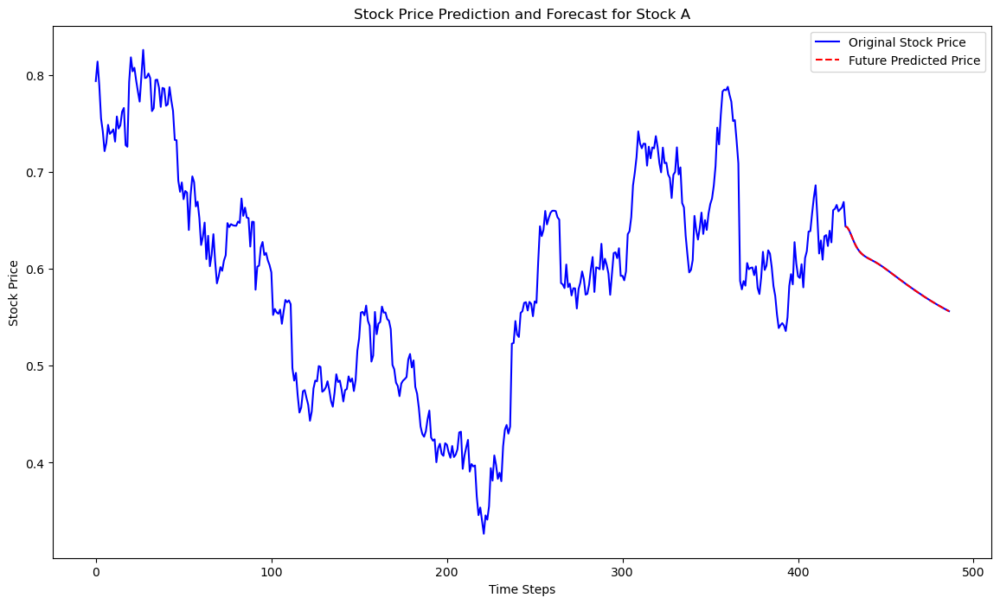

 8/14 [================>.............] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


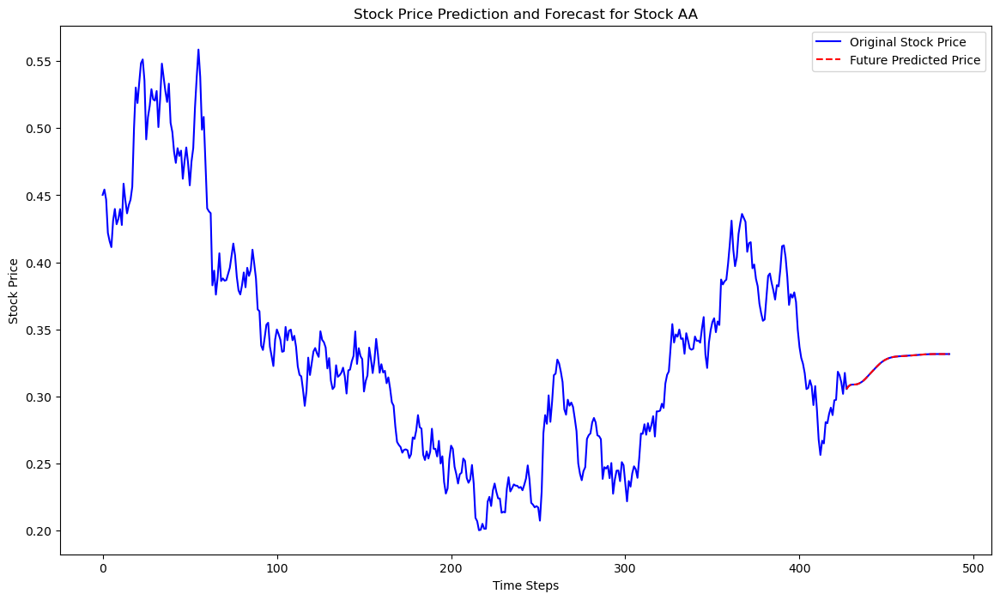

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


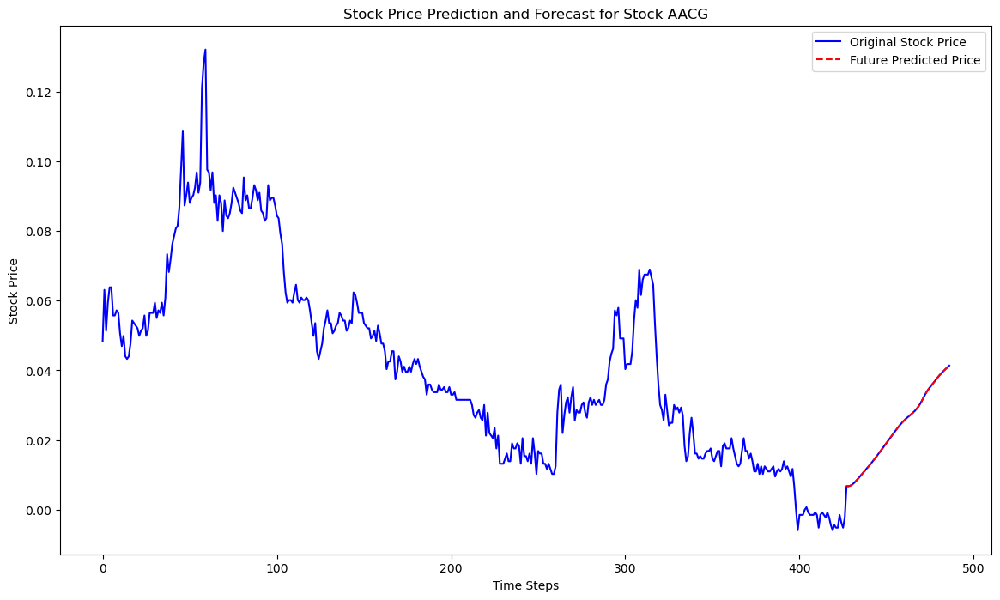

7/7 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


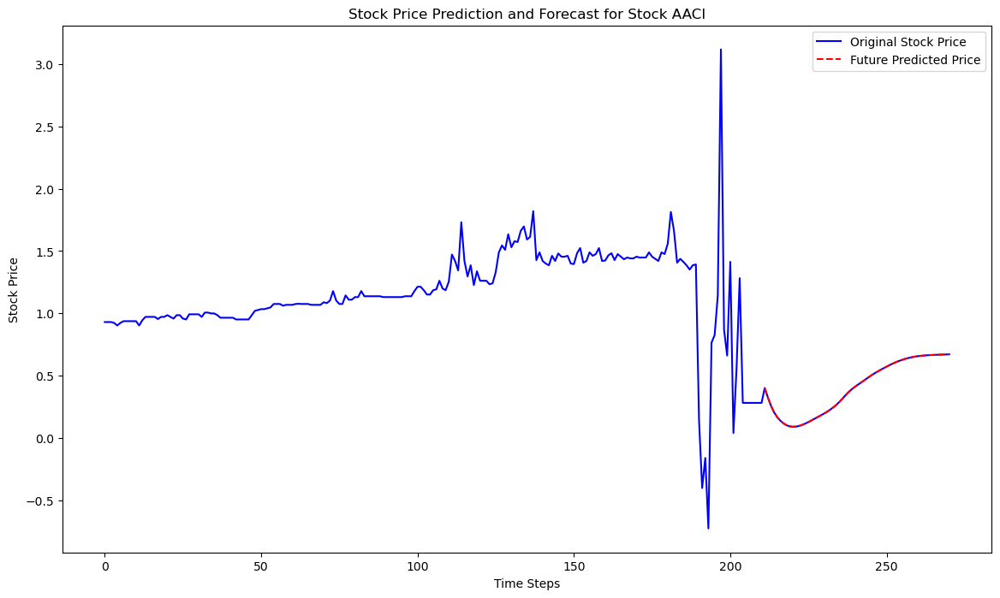

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


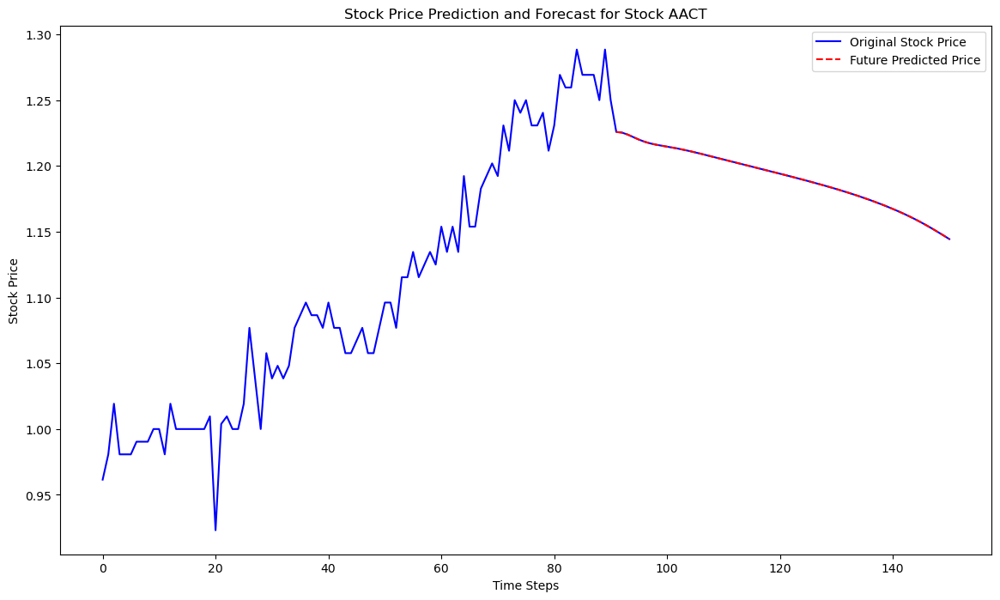

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


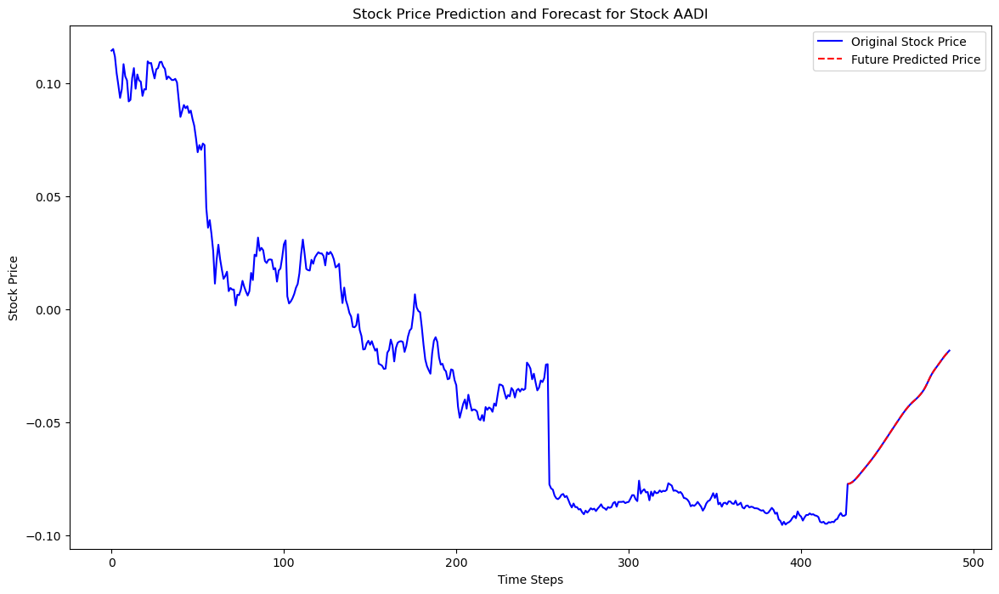

7/7 [==============================] - 0s 16ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 26ms/step


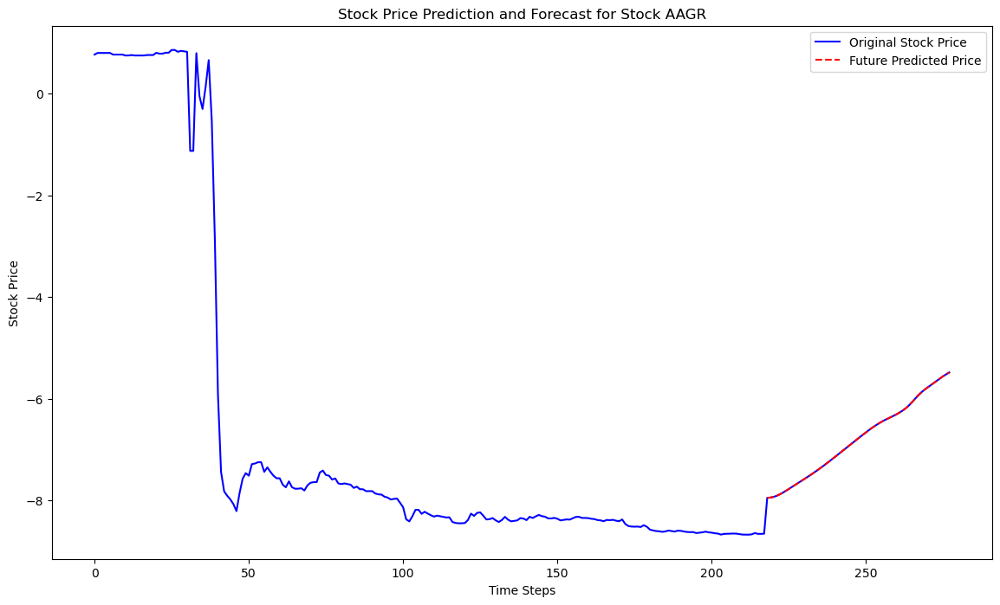

 5/14 [=========>....................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


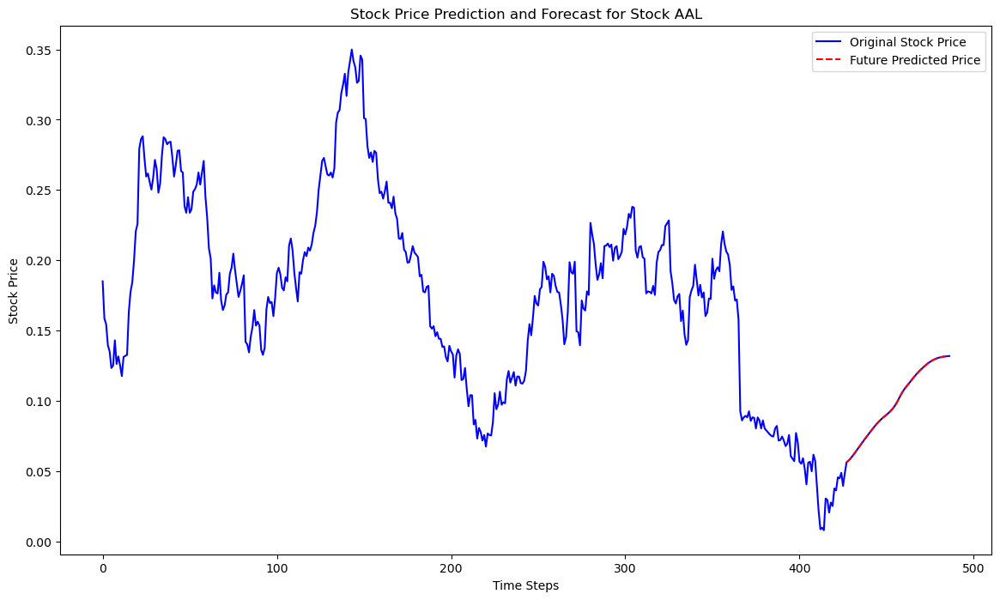

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 23ms/step


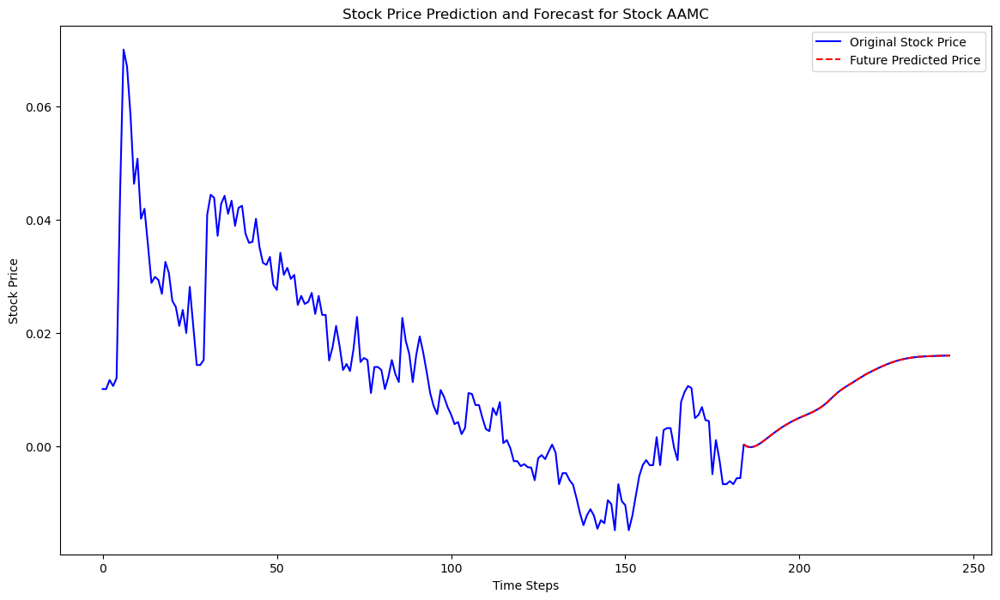

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


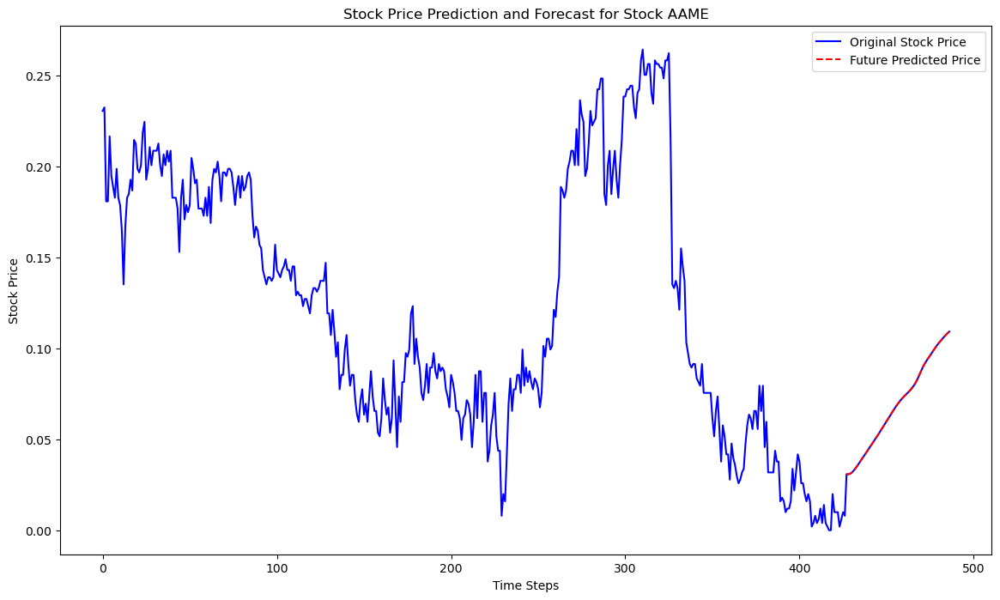

9/9 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


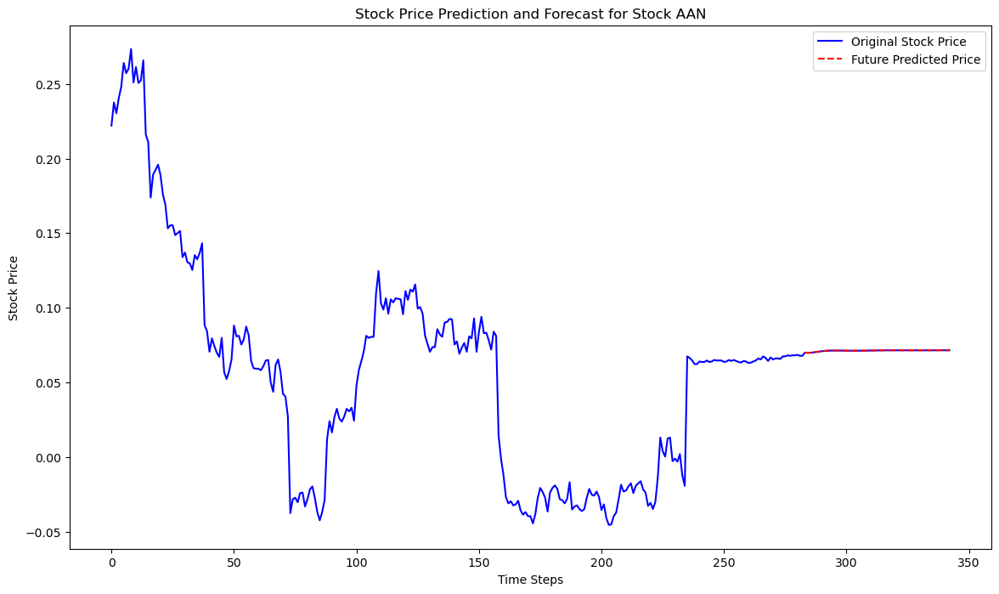

 5/14 [=========>....................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


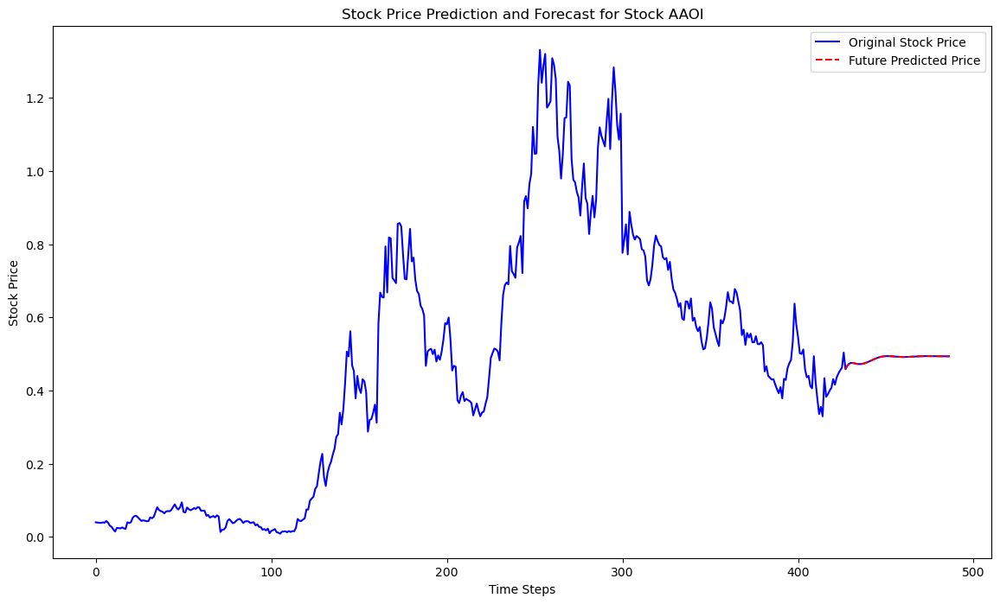

 5/14 [=========>....................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


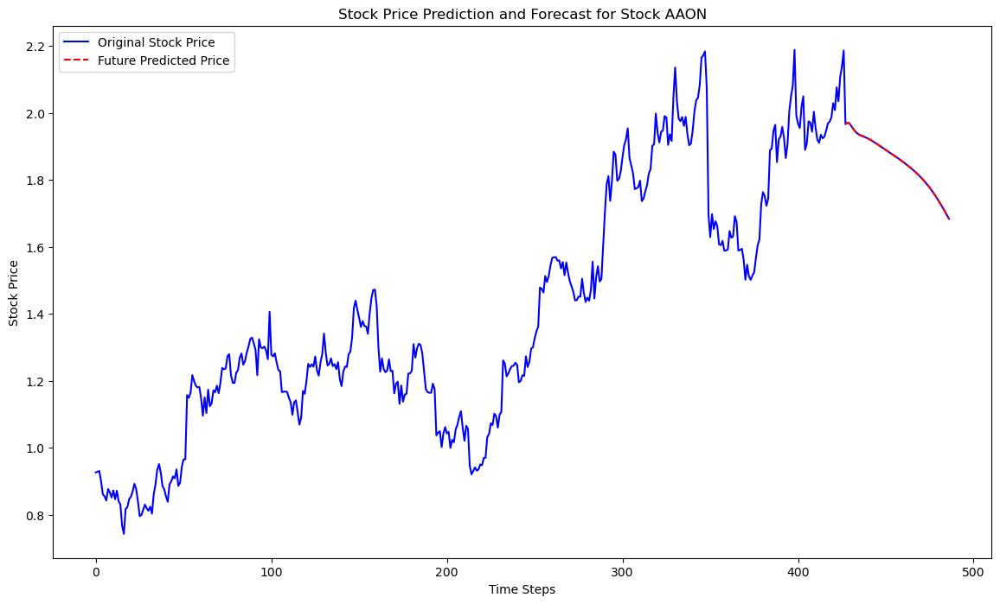

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


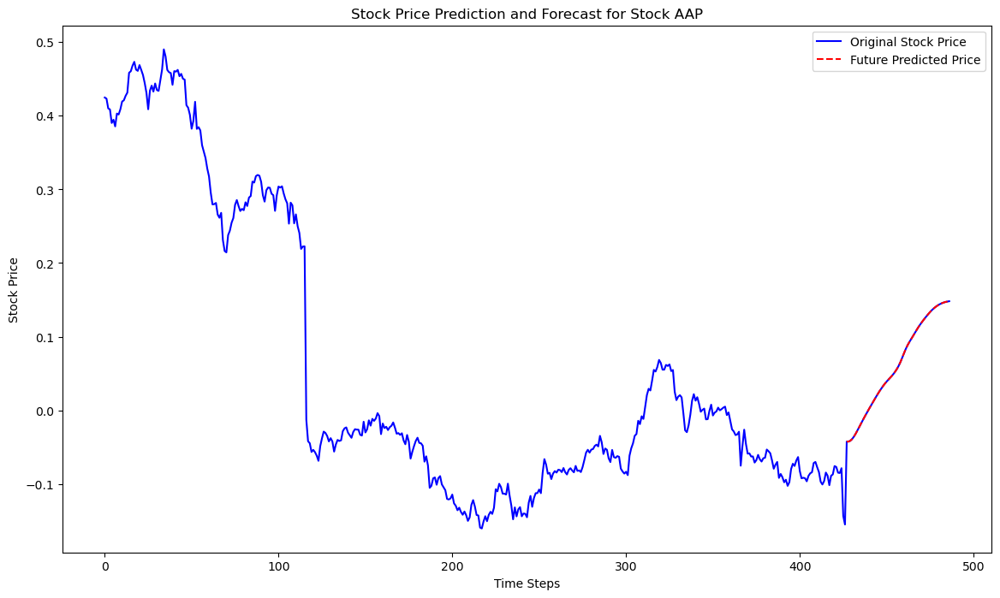

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


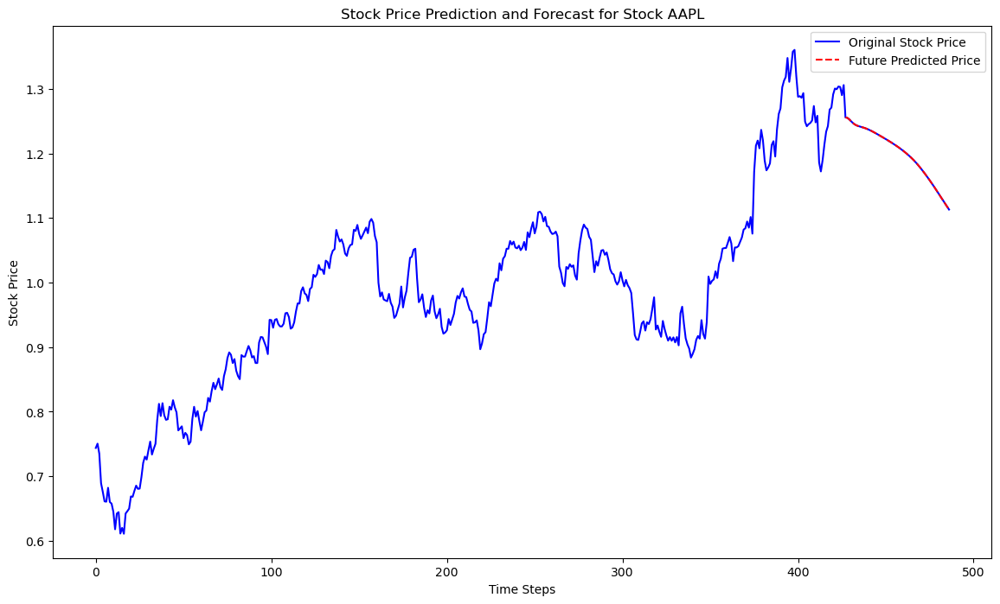

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


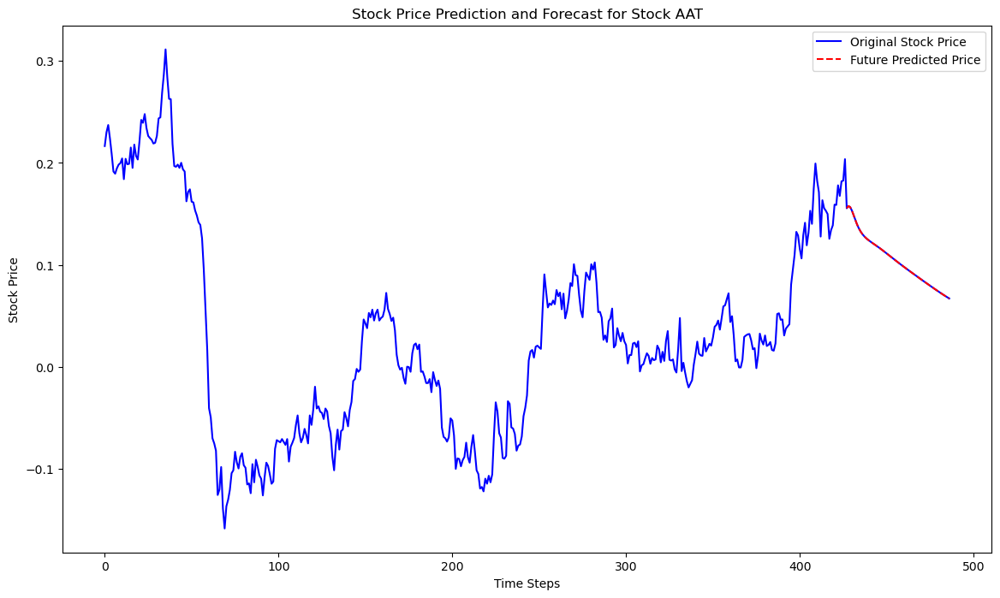

 1/14 [=>............................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


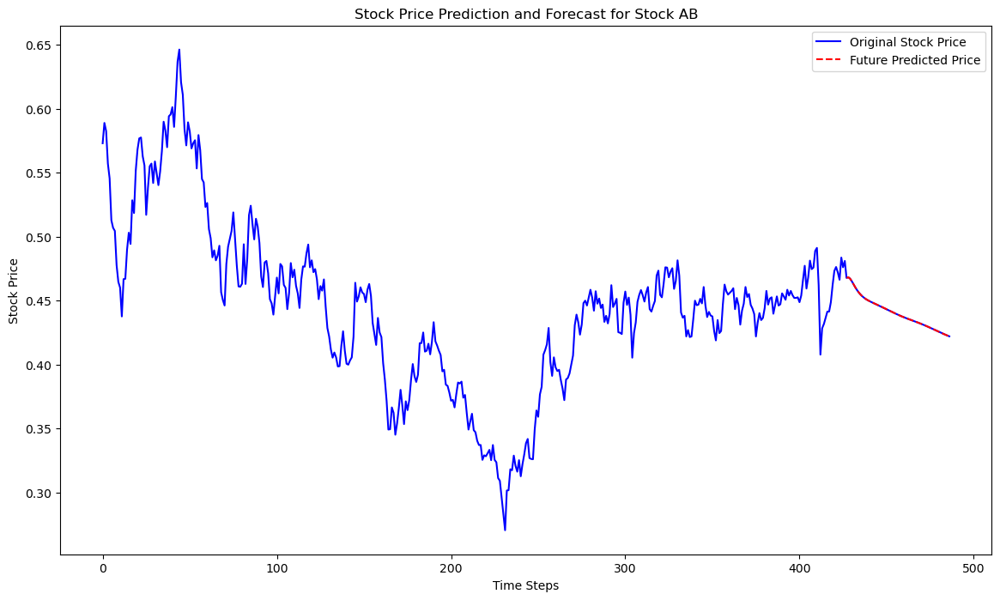

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 25ms/step


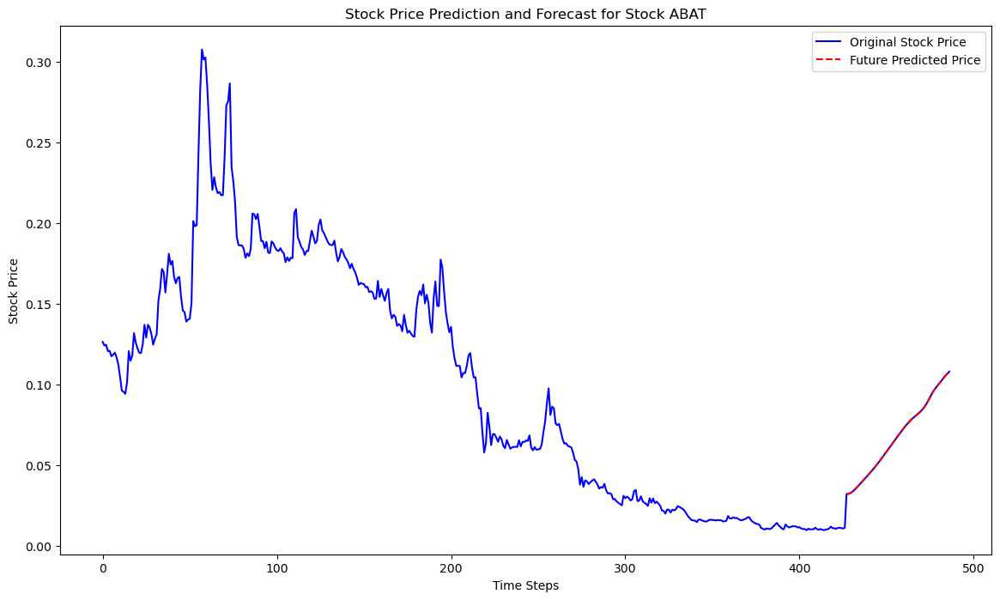

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


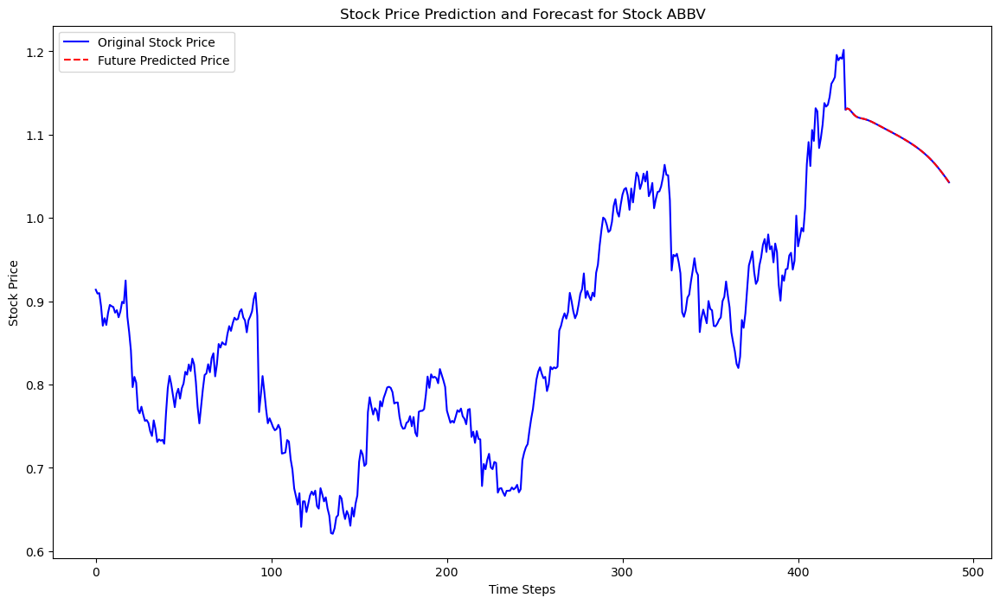

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


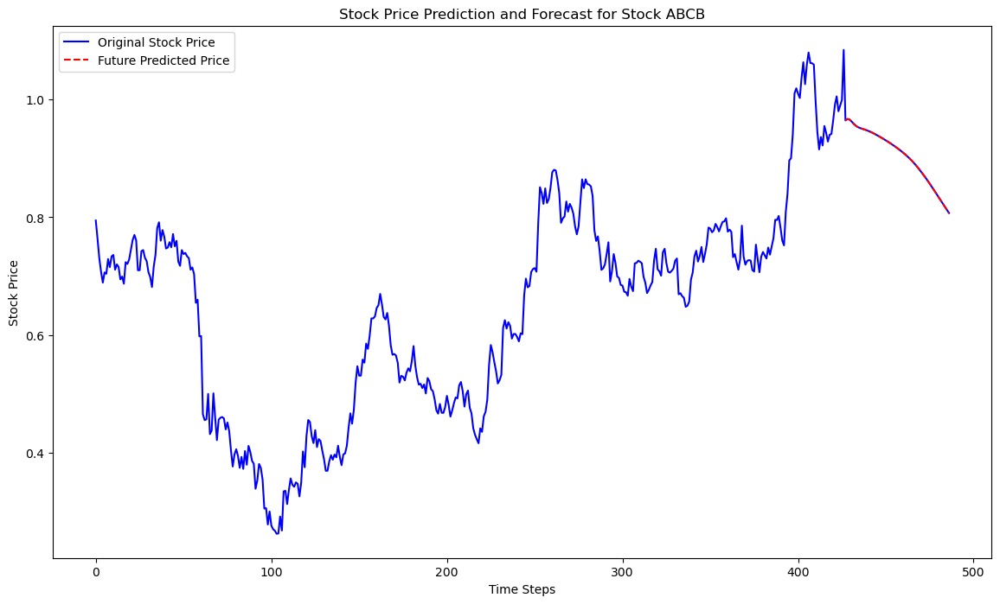

1/9 [==>...........................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


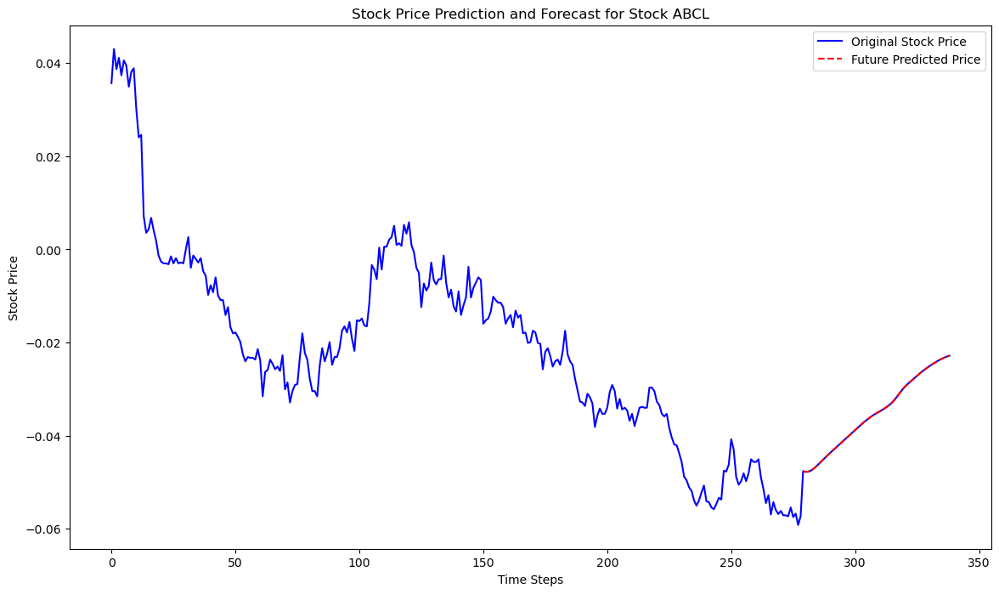

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


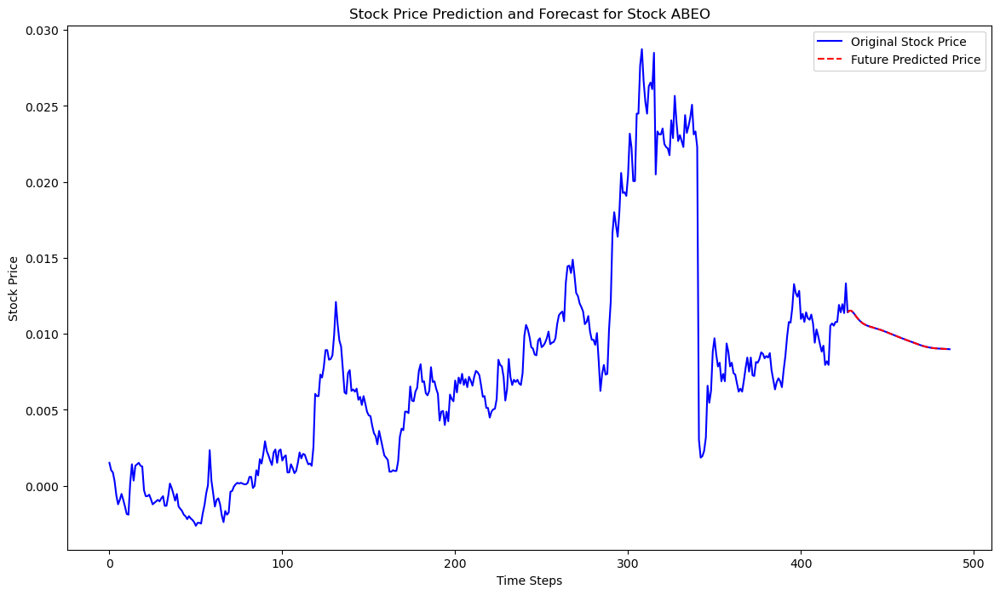

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 25ms/step


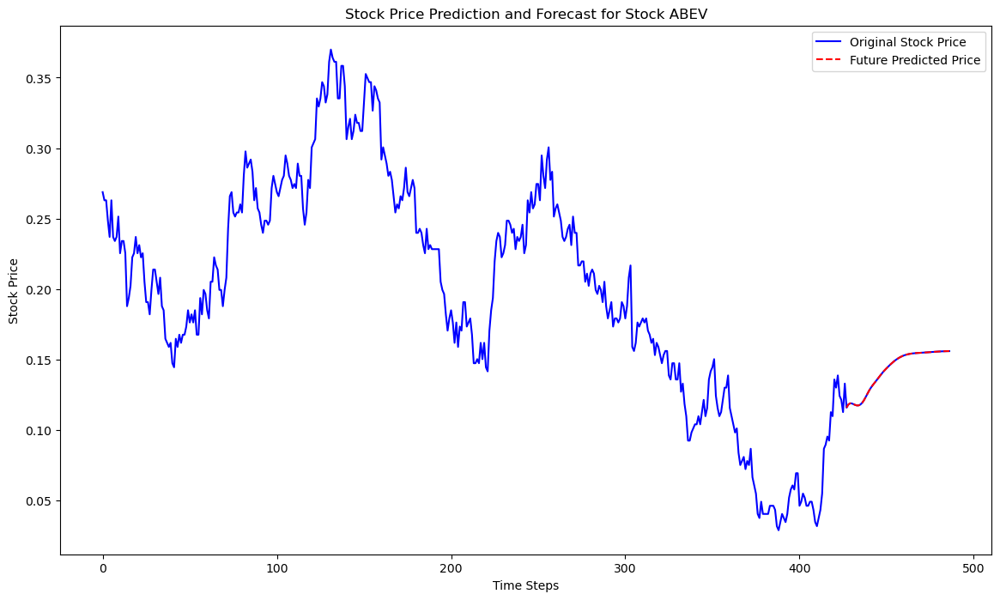

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


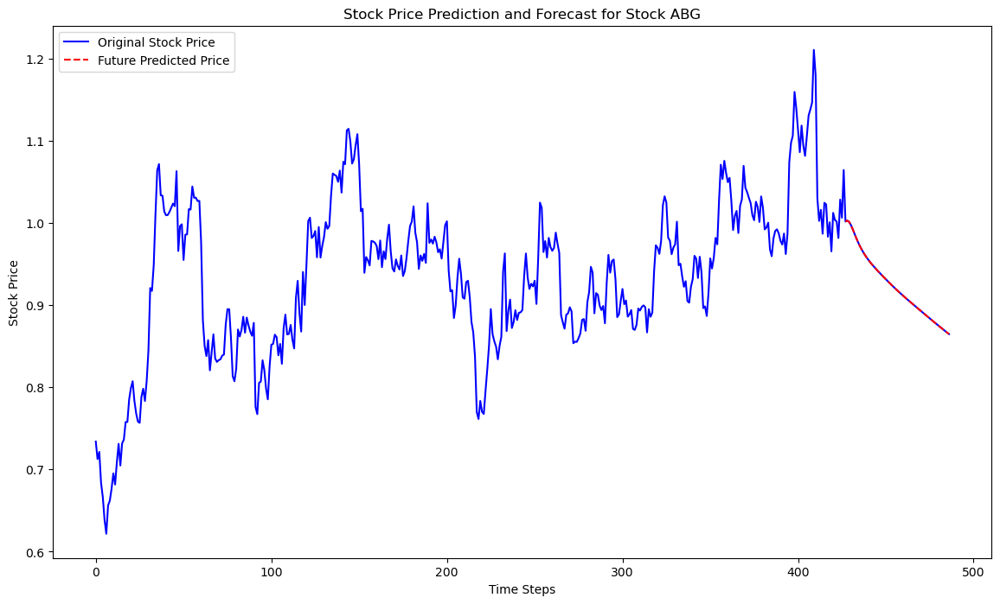

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


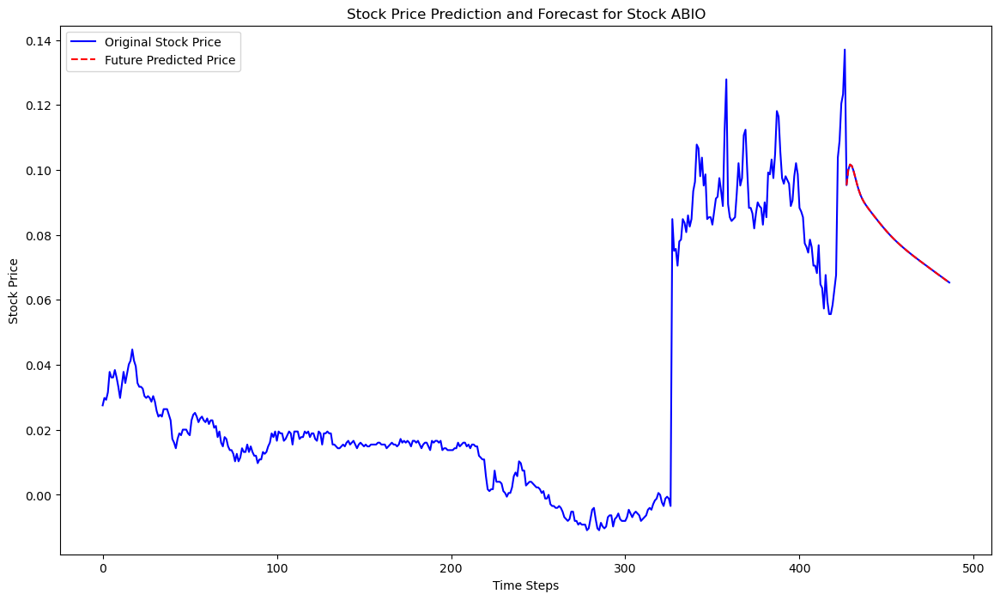

10/10 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


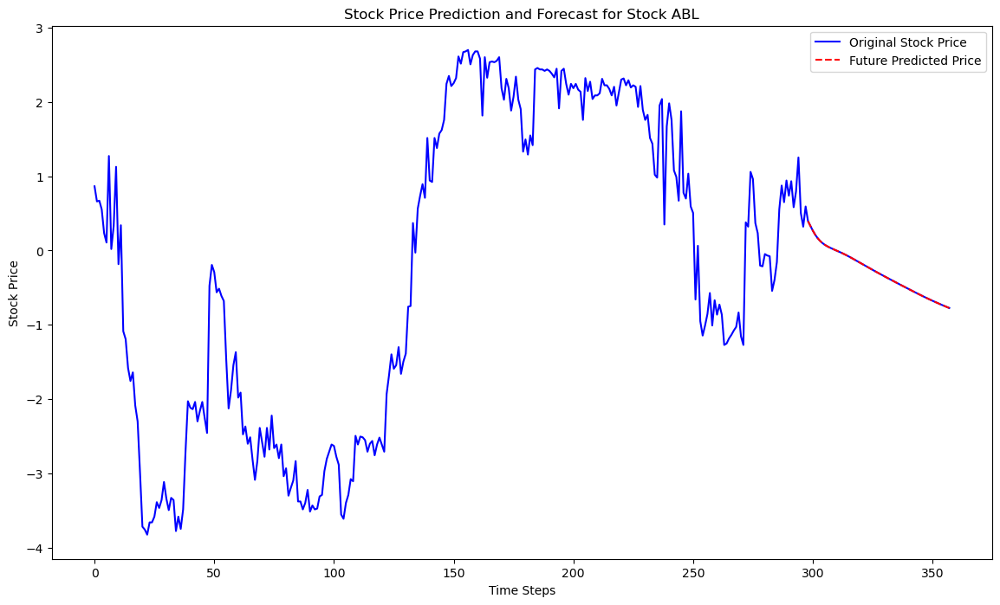

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


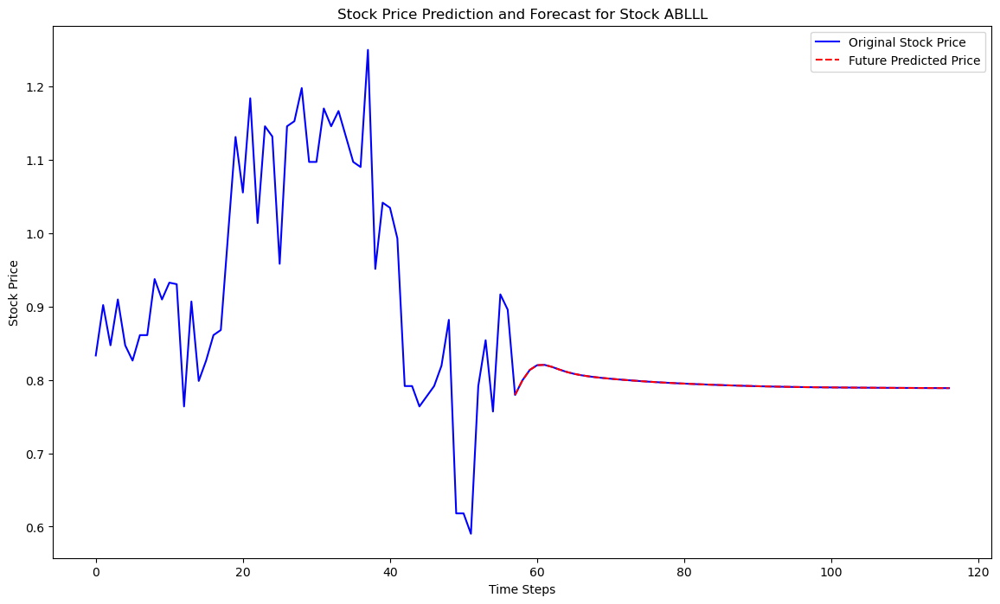

1/1 [==============================] - 0s 20ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


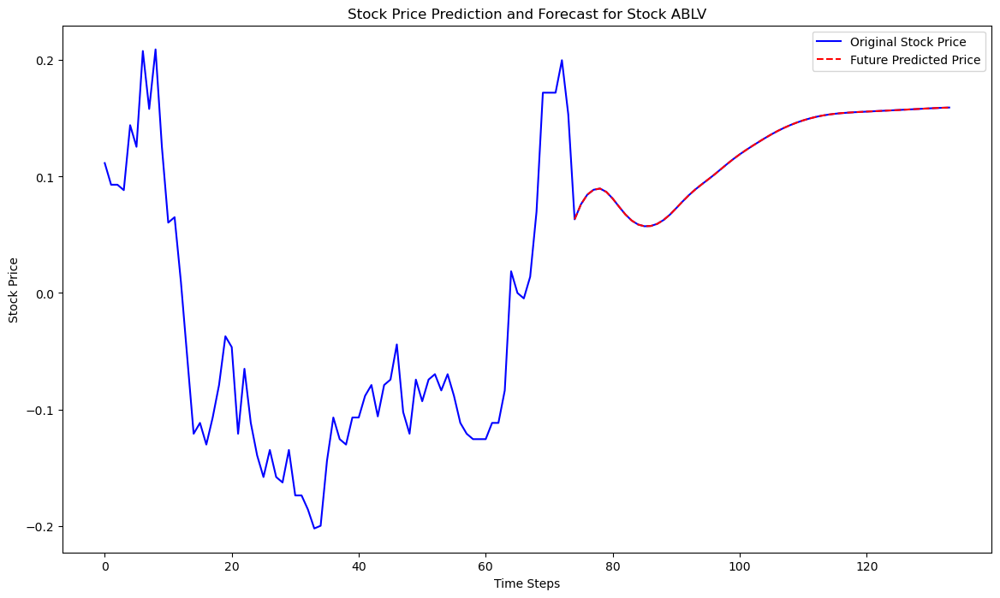

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


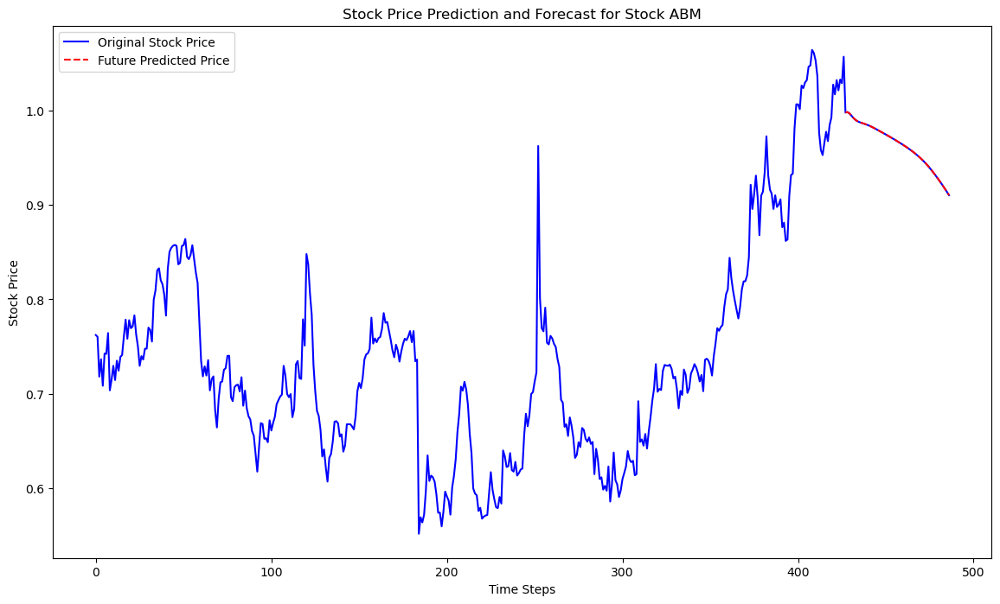

9/9 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


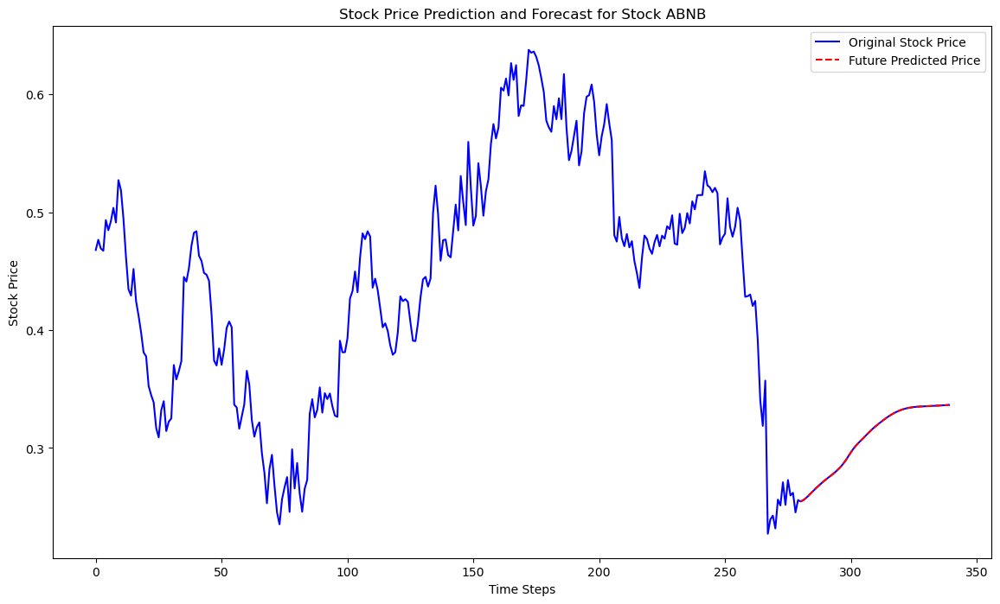

1/8 [==>...........................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 18ms/step


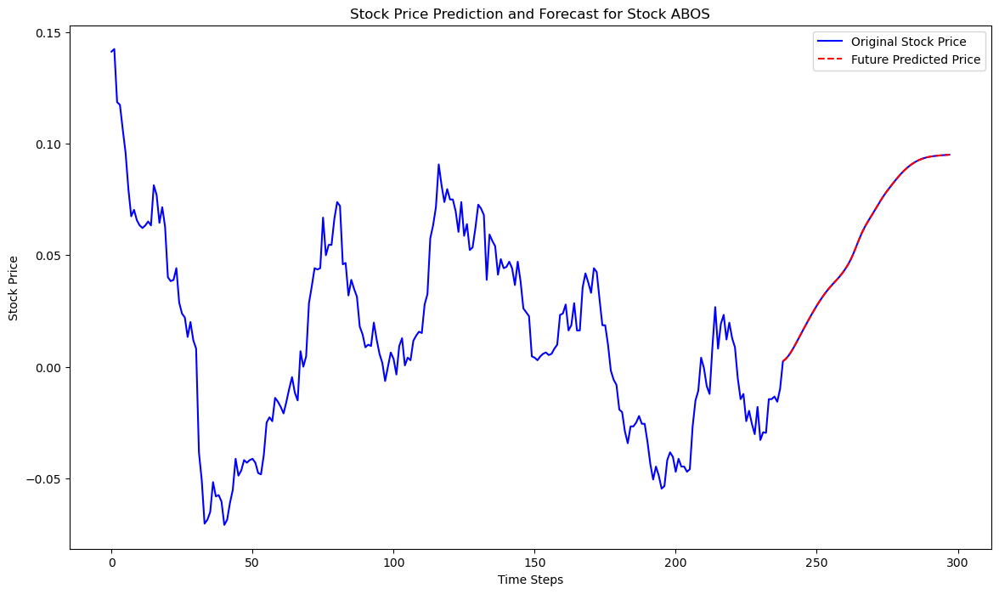

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


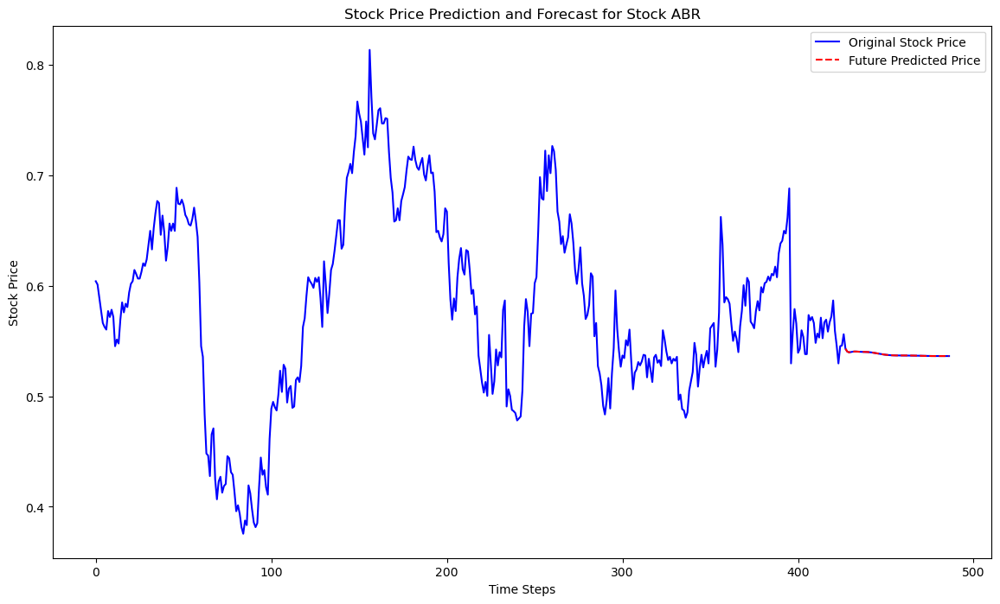

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


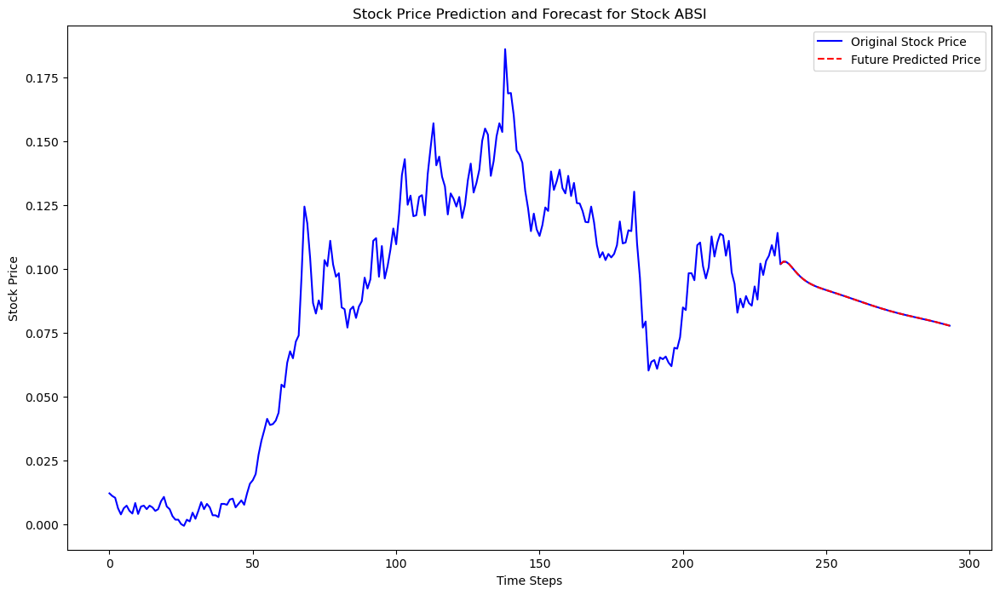

 1/14 [=>............................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


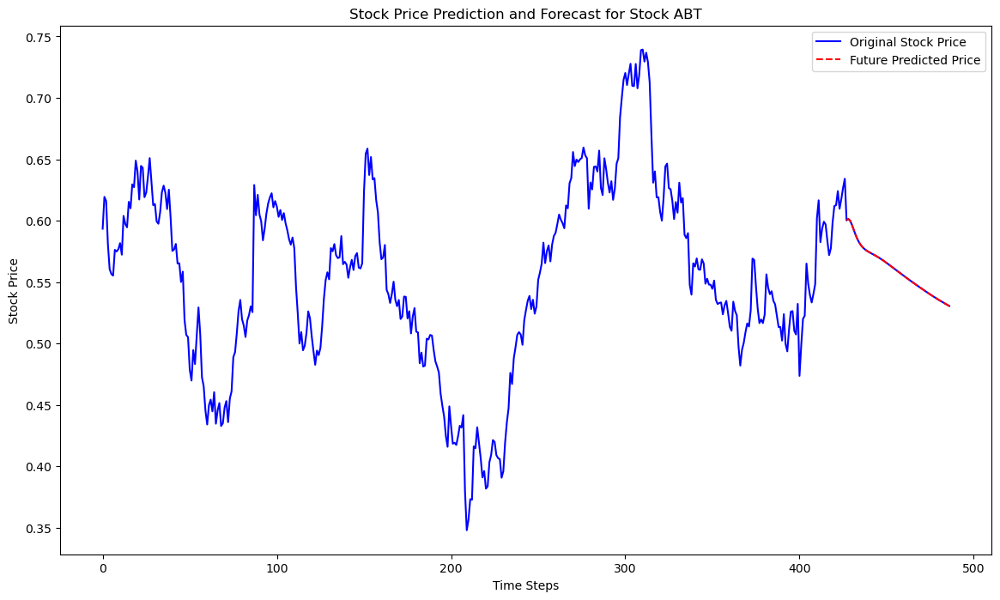

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


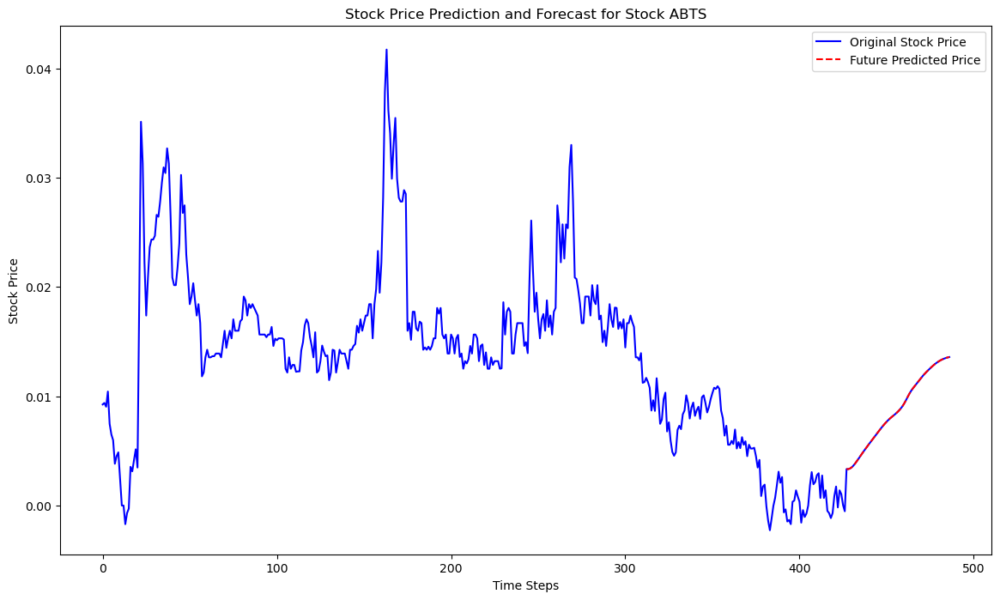

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


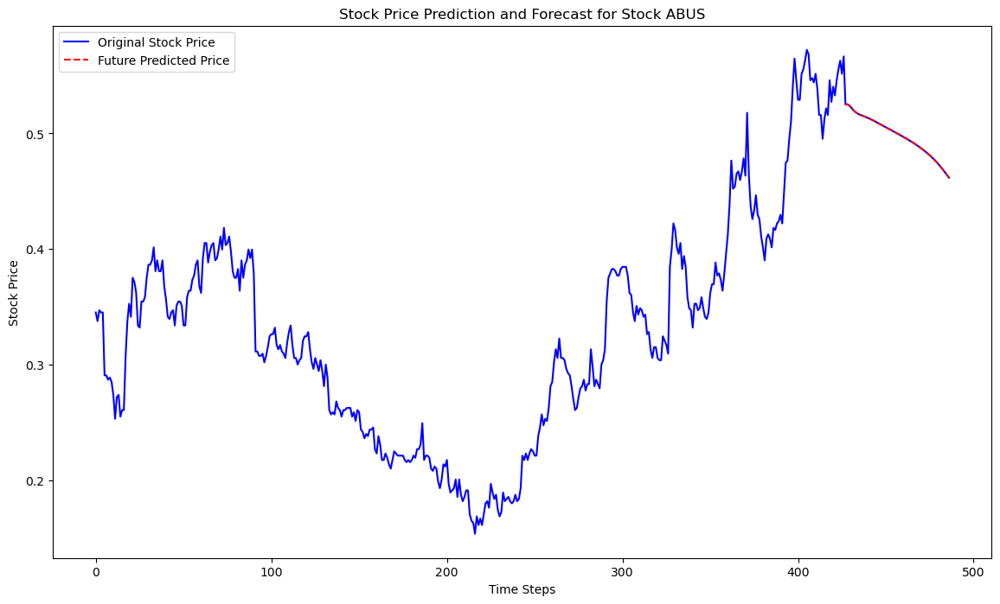

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


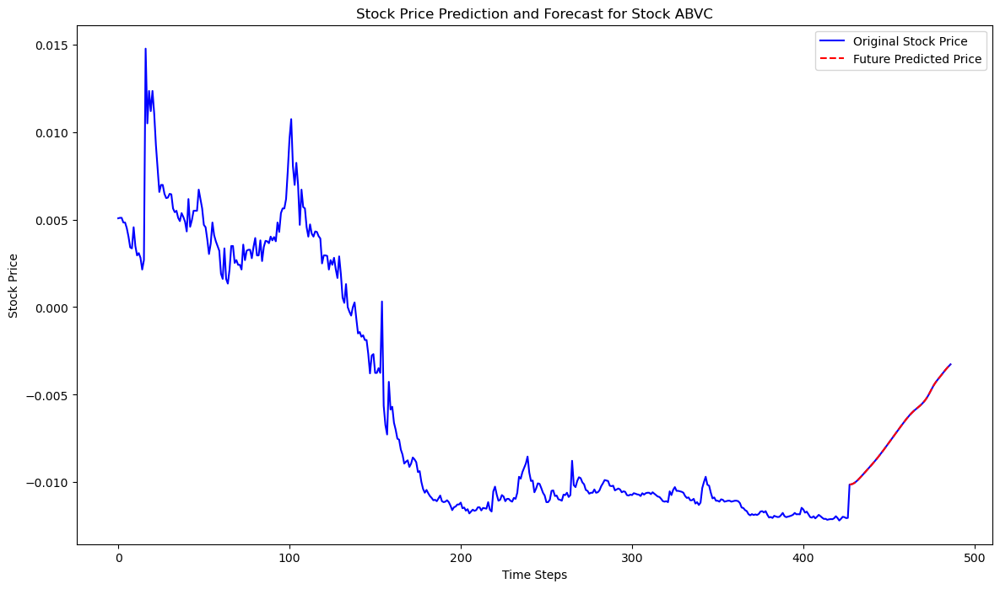

No data available for prediction for Stock ABVE. Skipping this stock.
1/1 [==============================] - 0s 22ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sli

1/1 [==============================] - 0s 28ms/step


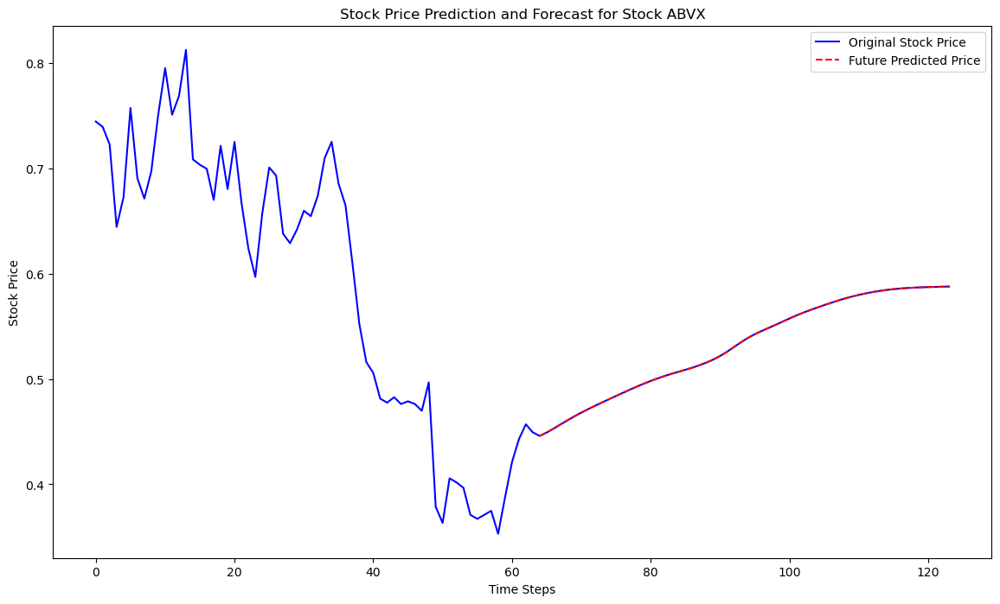

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


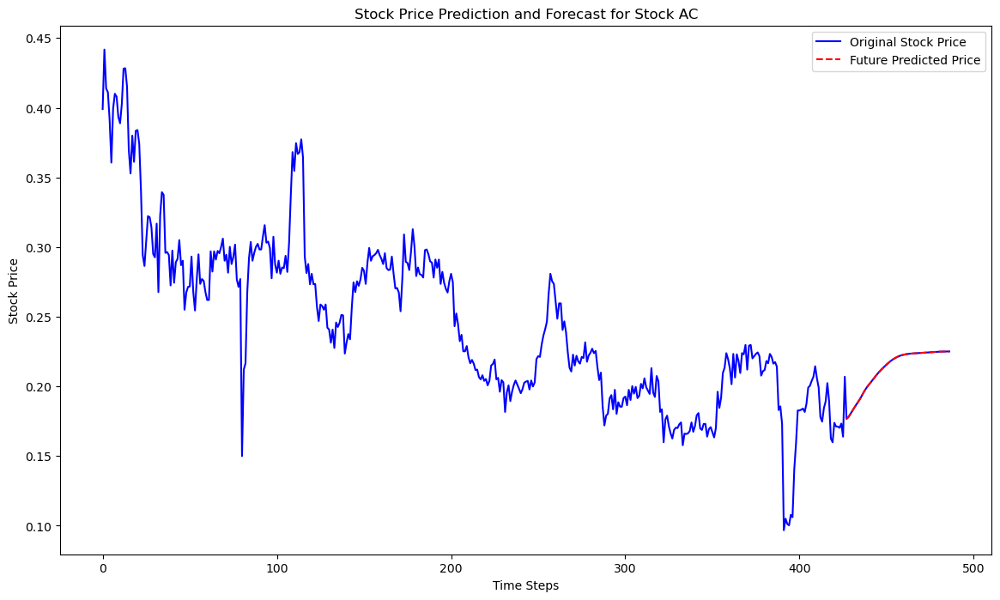

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


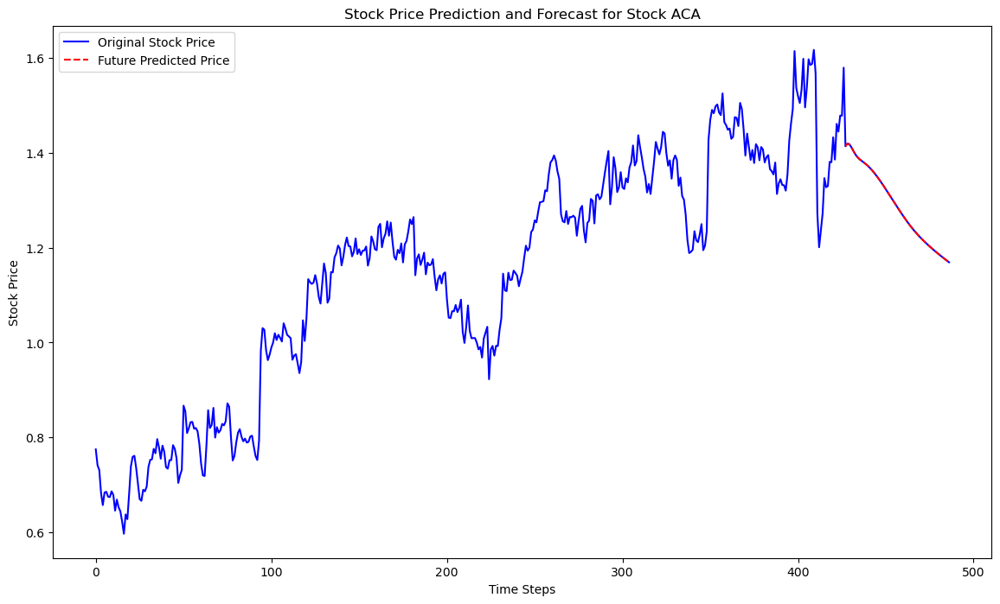

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


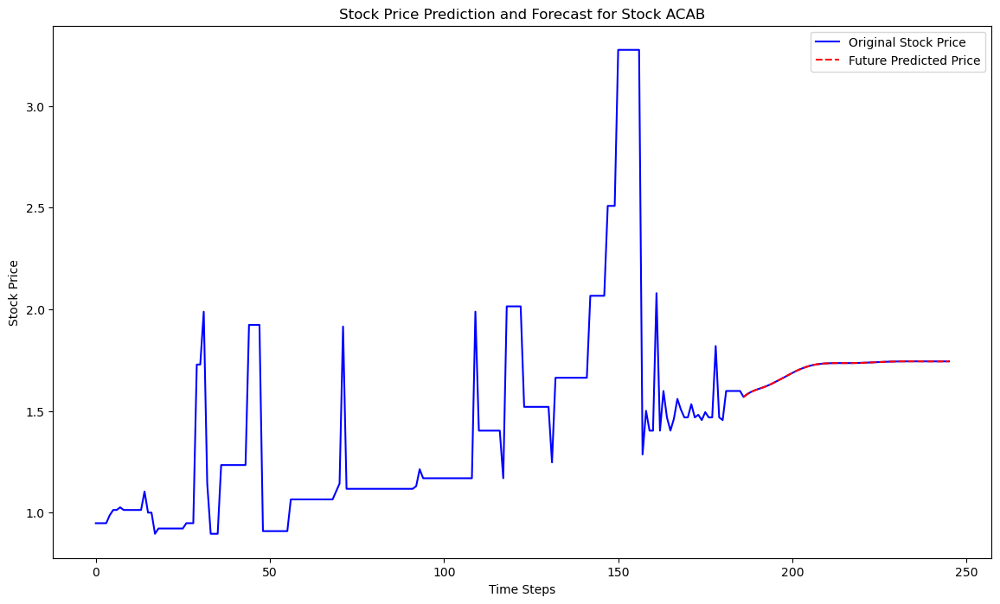

1/1 [==============================] - 0s 20ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


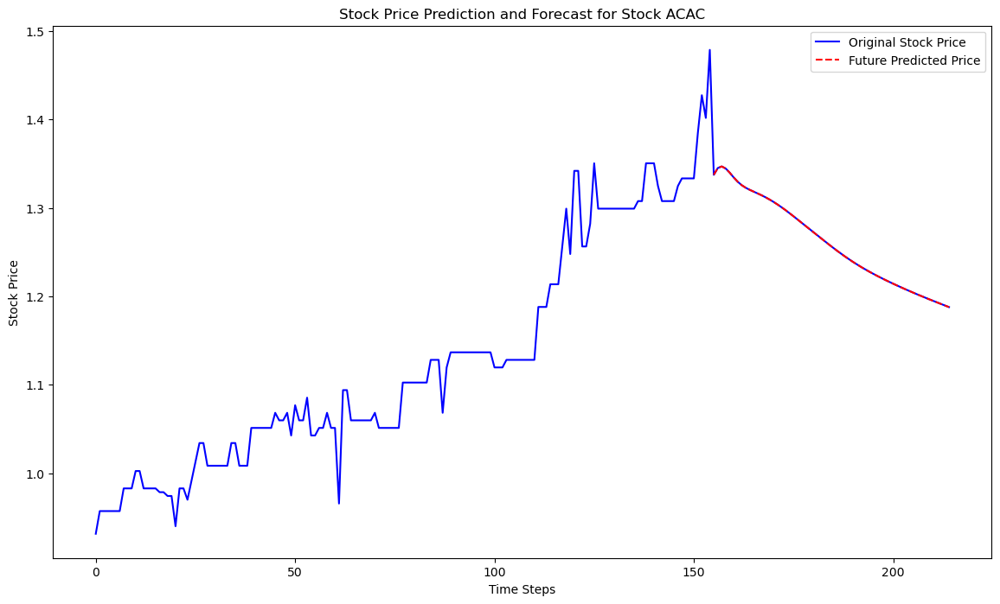

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


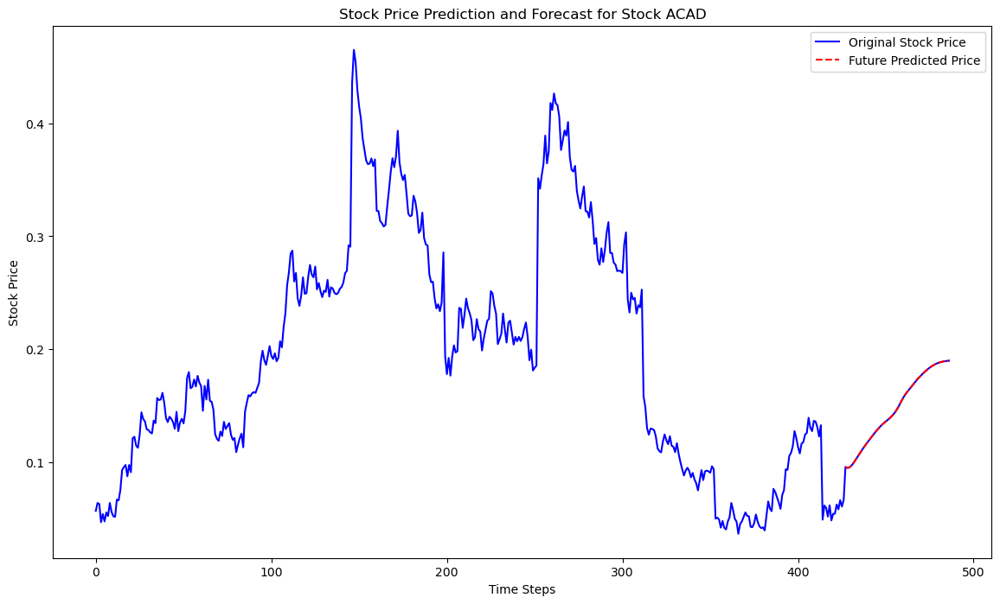

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


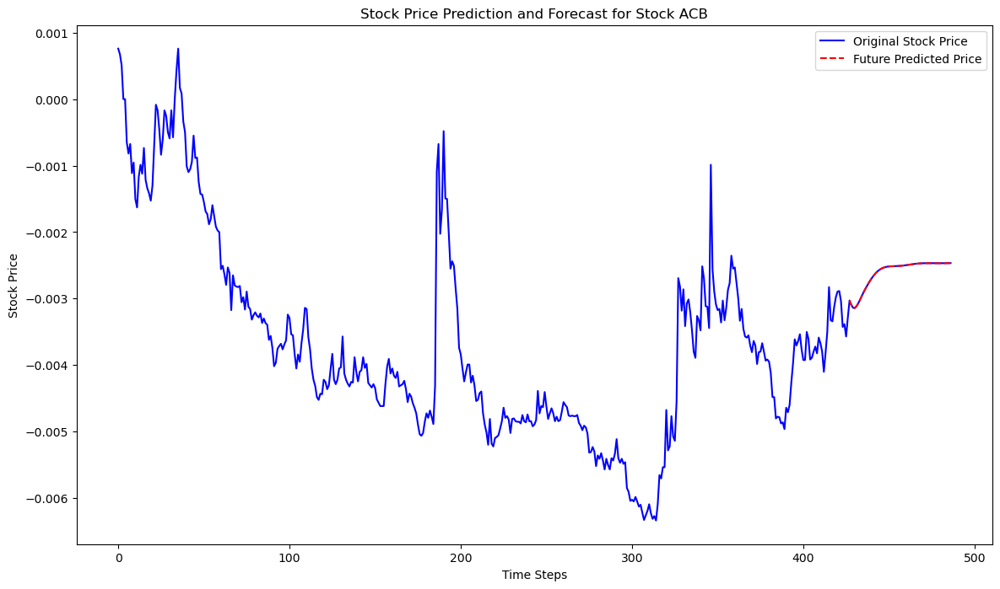

 1/10 [==>...........................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


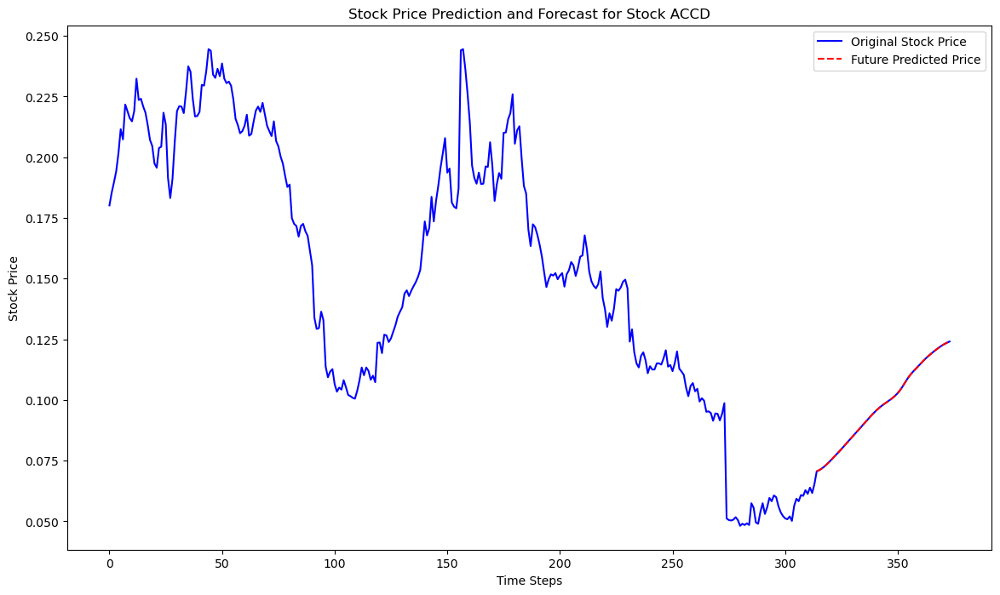

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


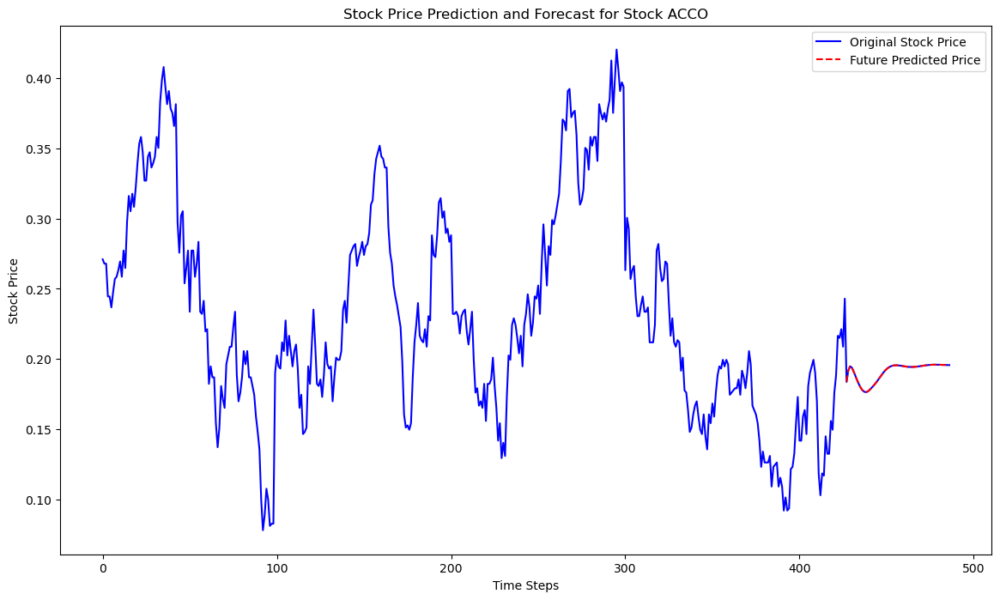

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


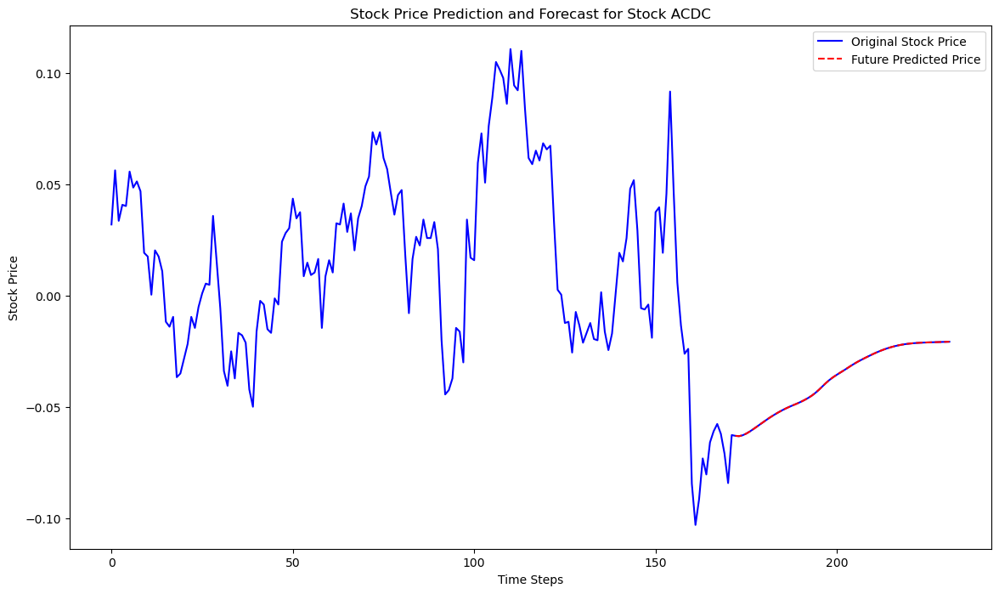

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


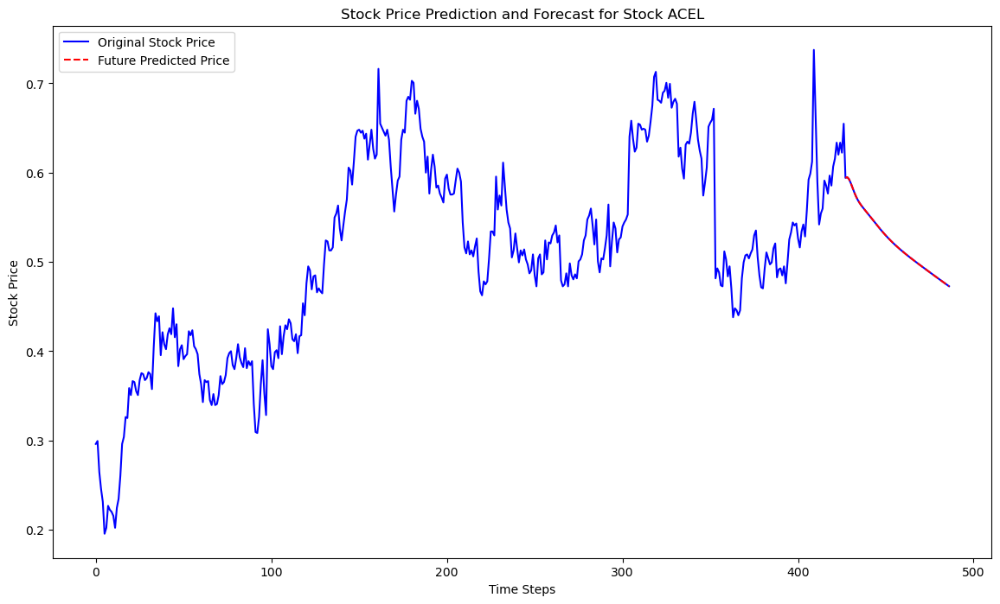

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


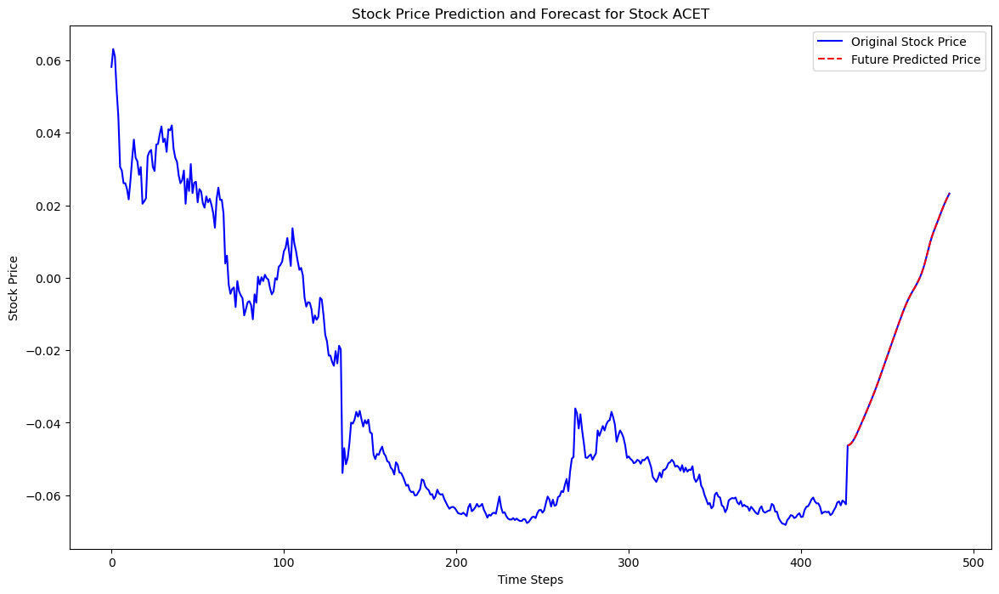

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


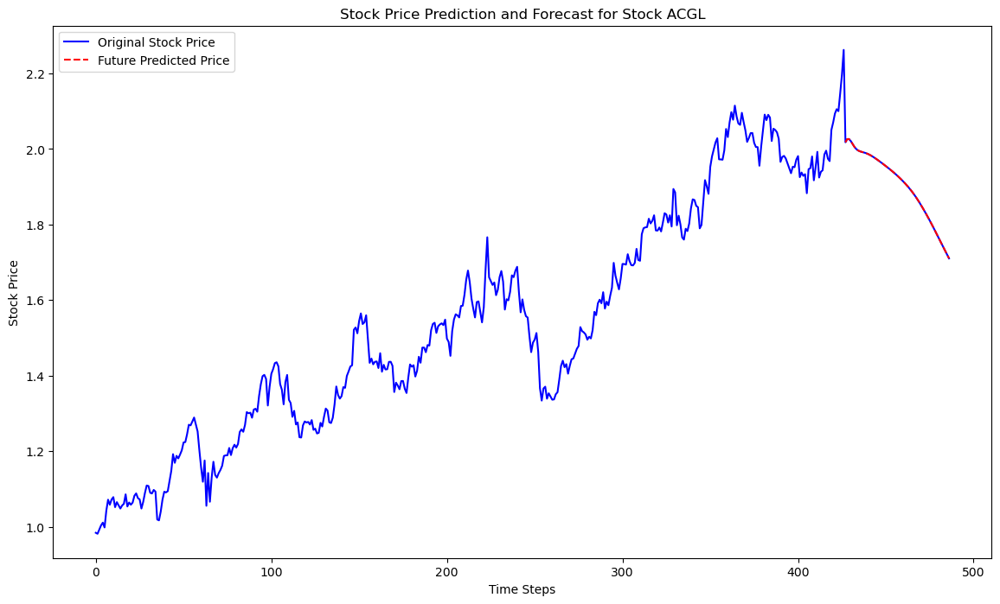

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


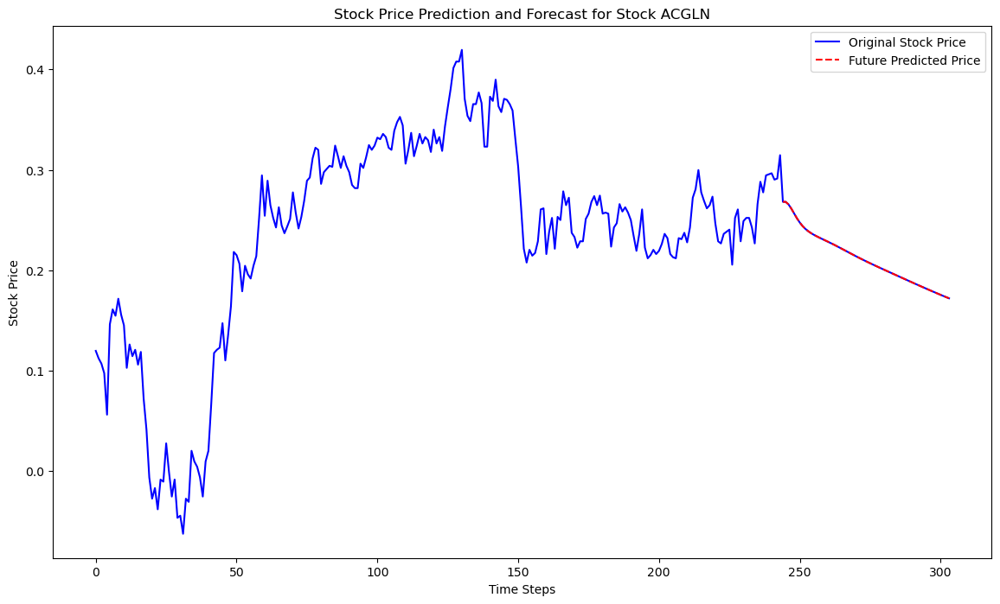

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


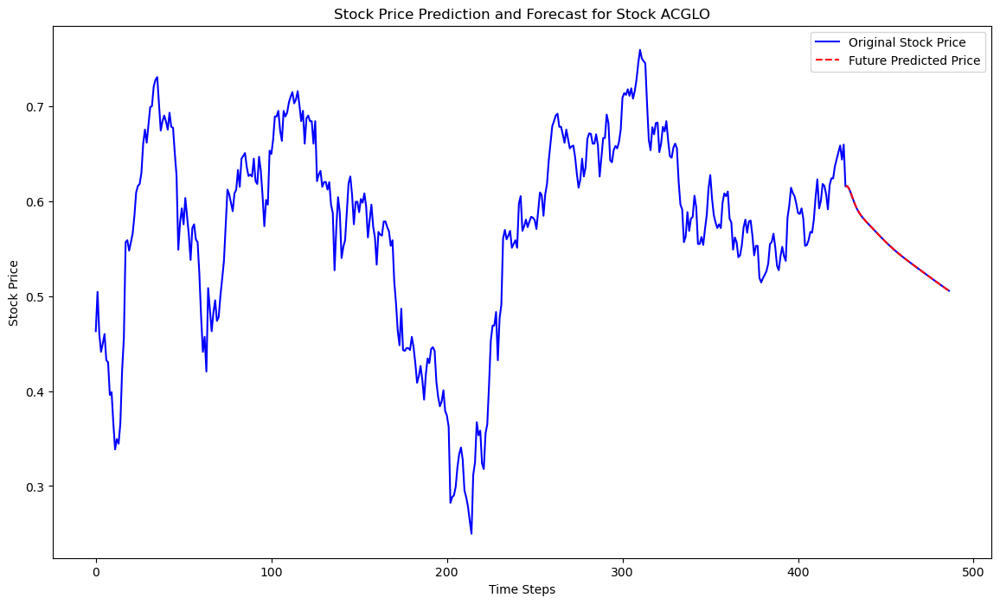

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


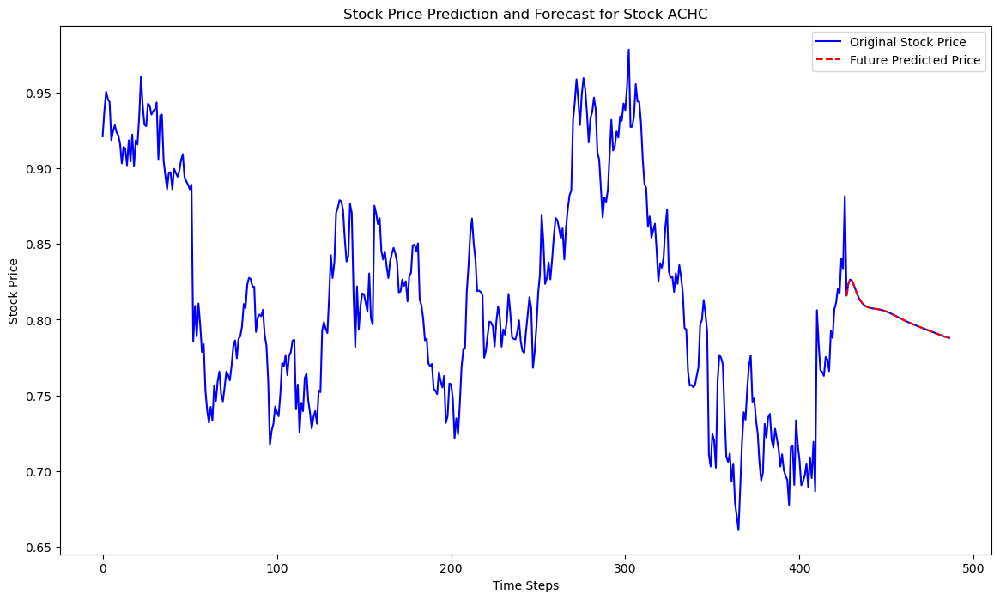

9/9 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


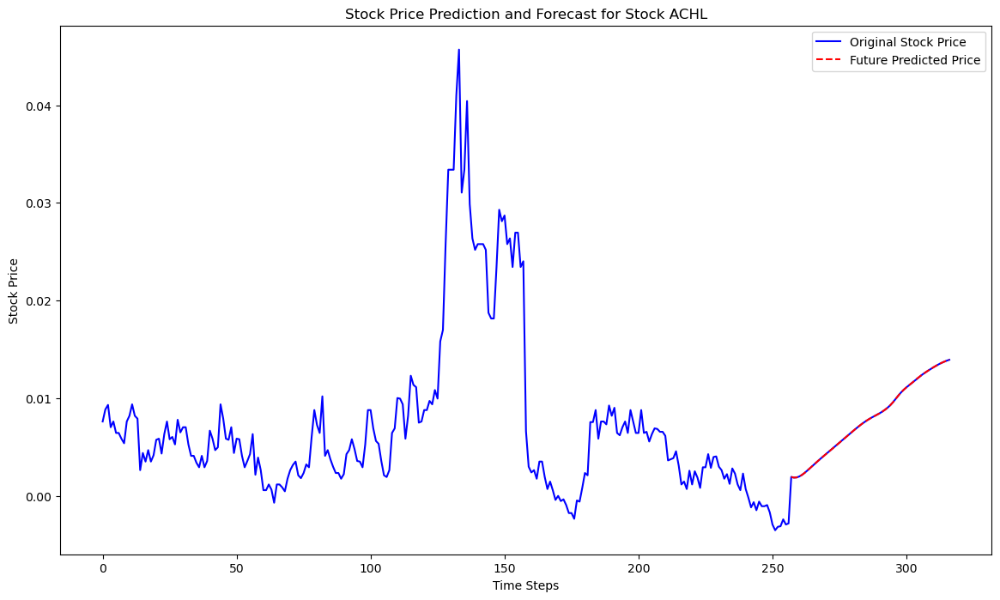

9/9 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


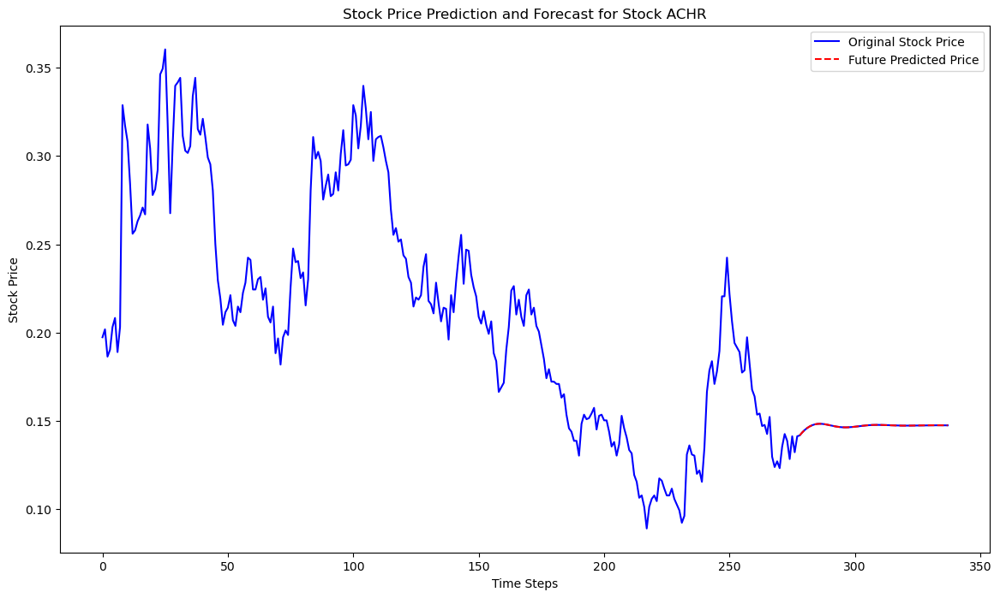

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


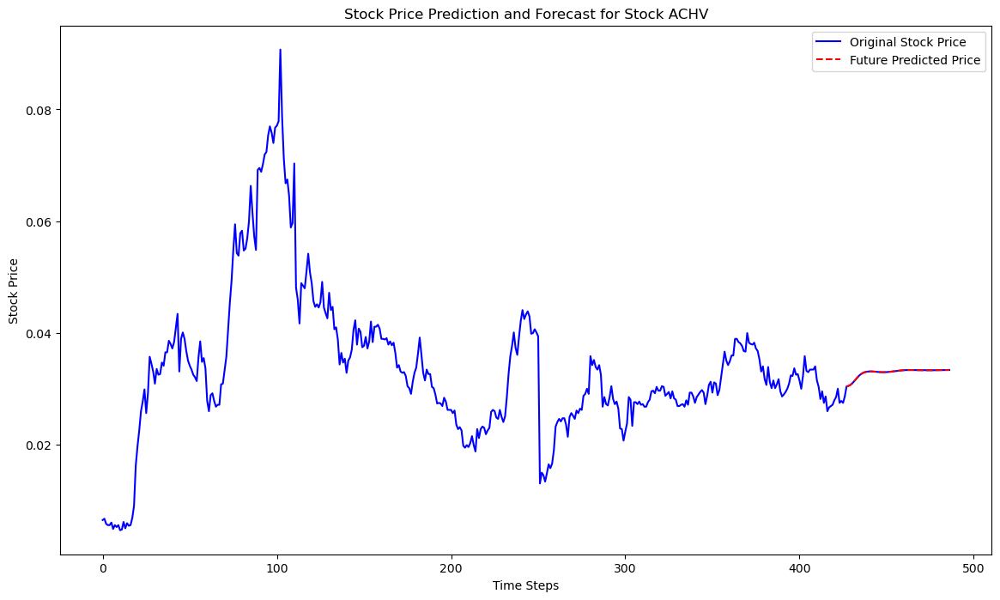

10/10 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


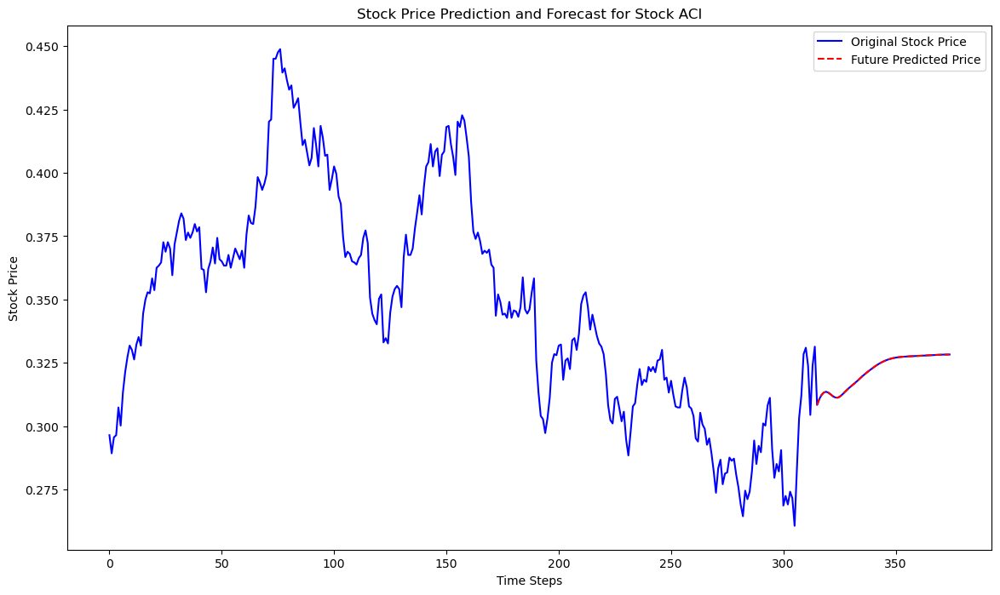

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


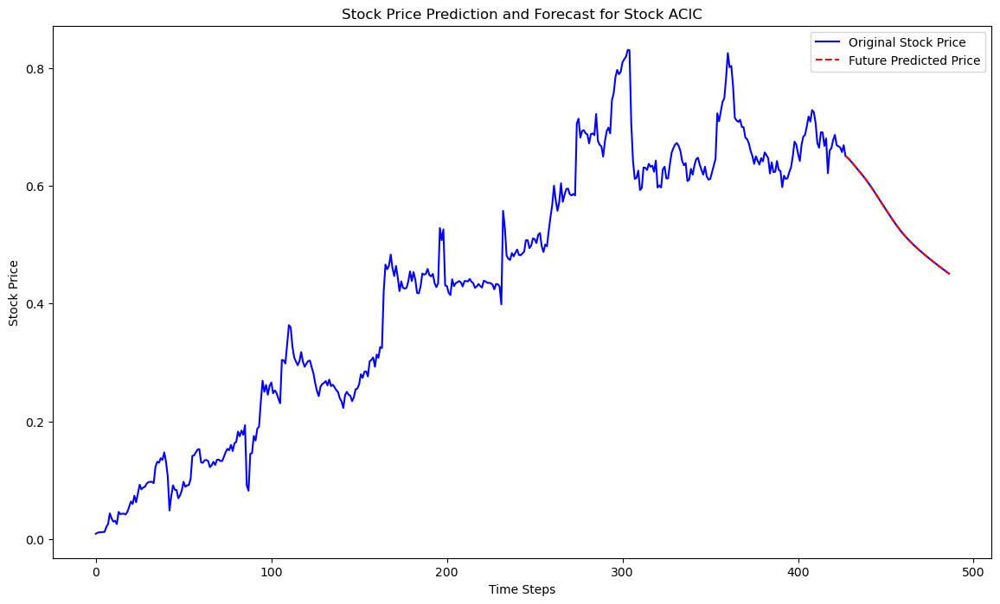

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


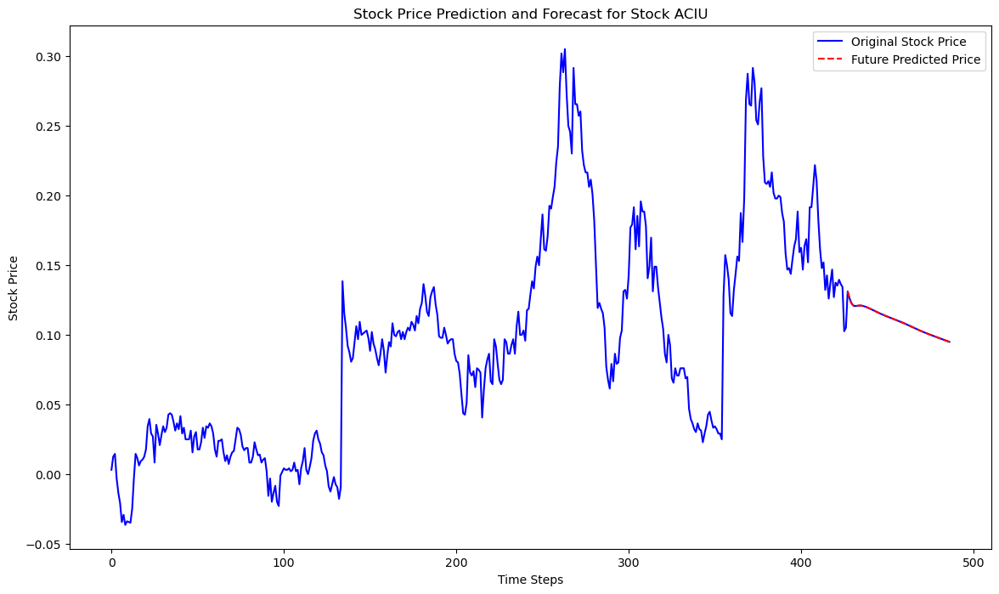

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 24ms/step


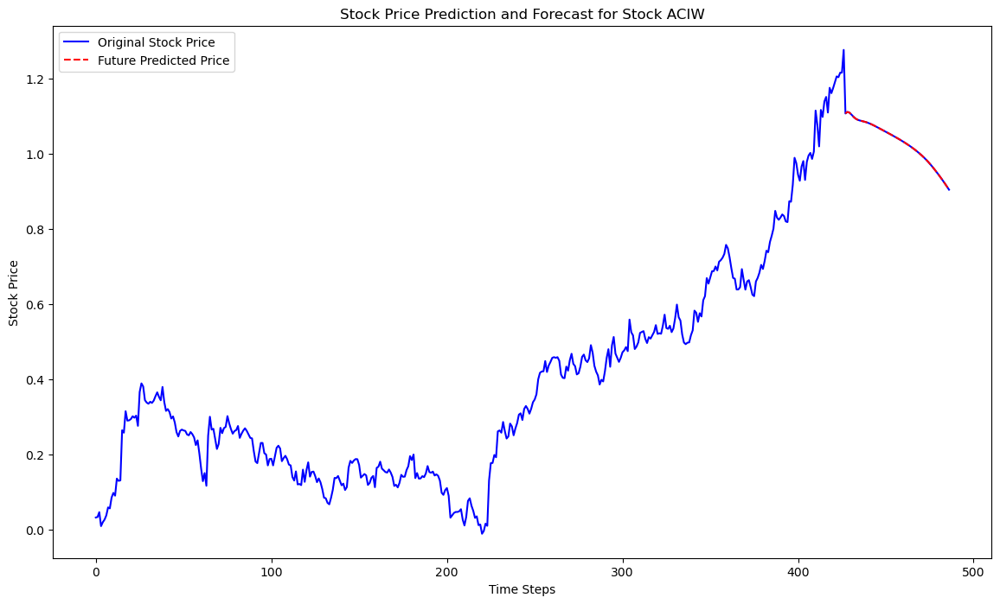

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


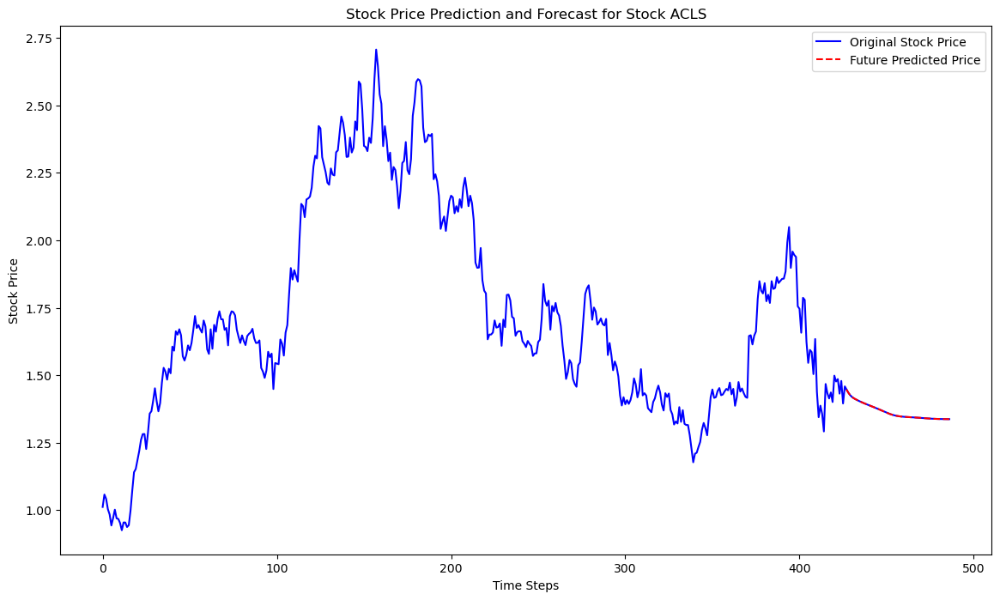

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 18ms/step


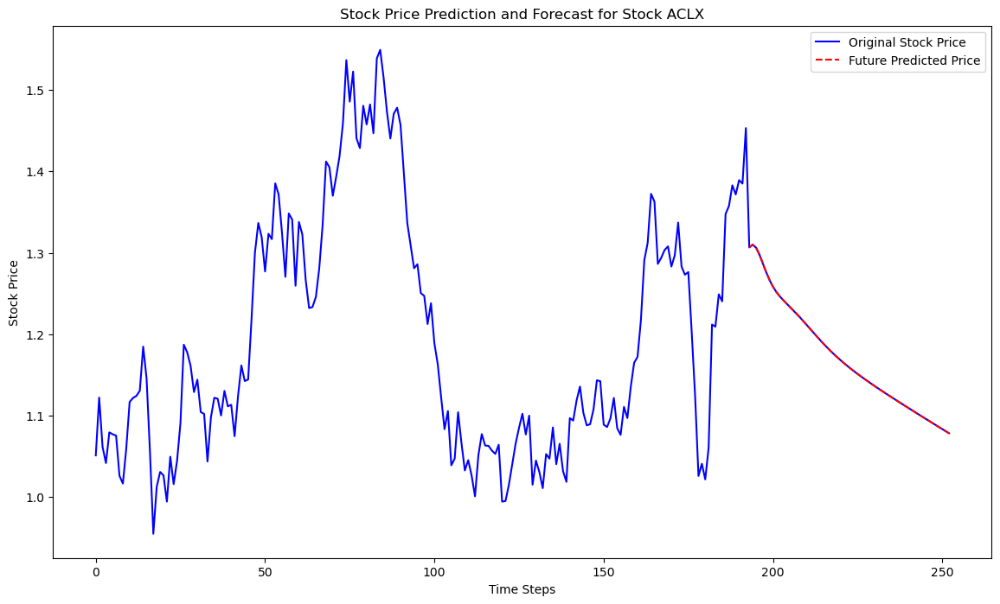

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


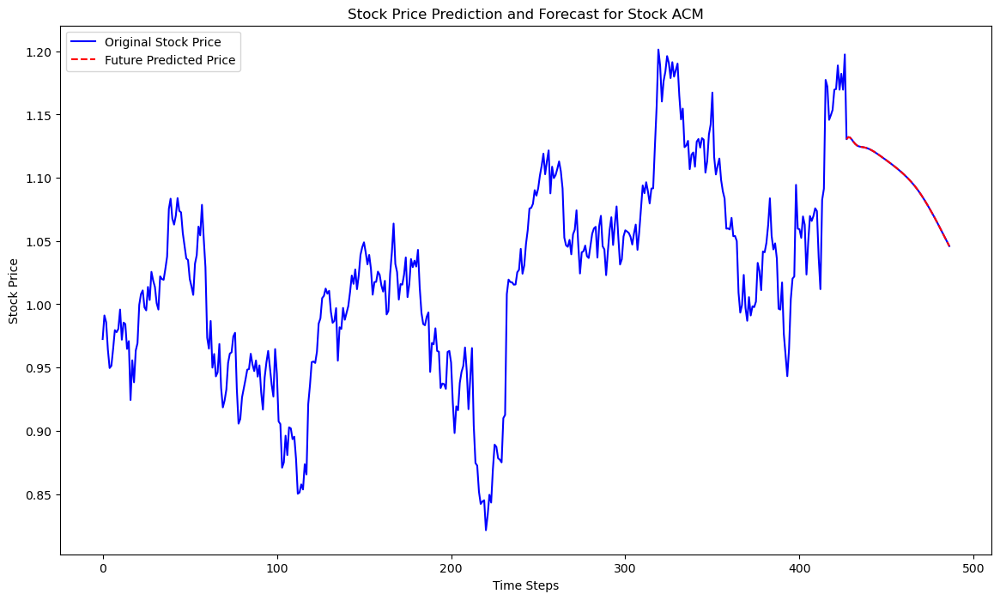

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


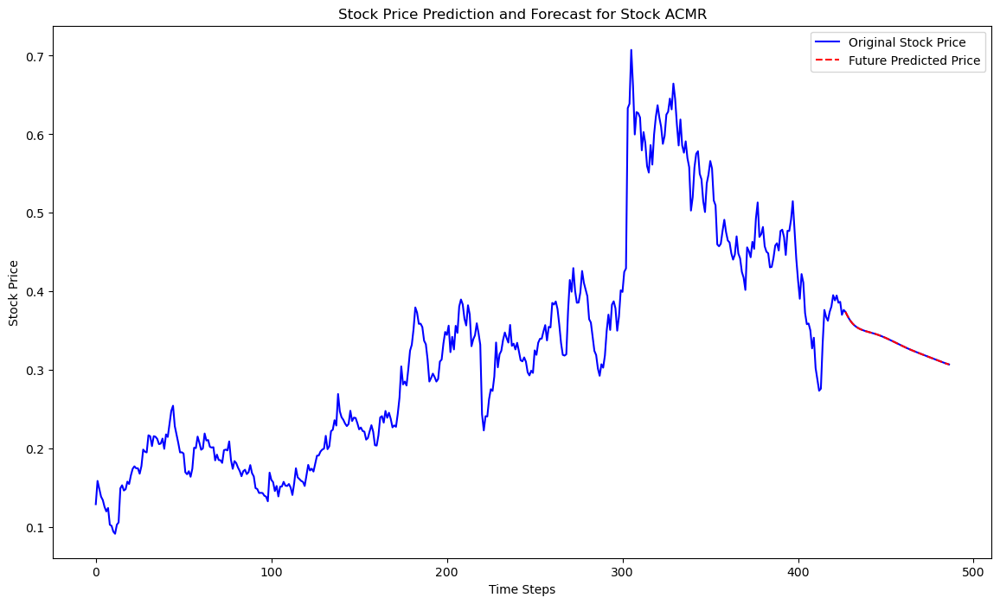

 5/14 [=========>....................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


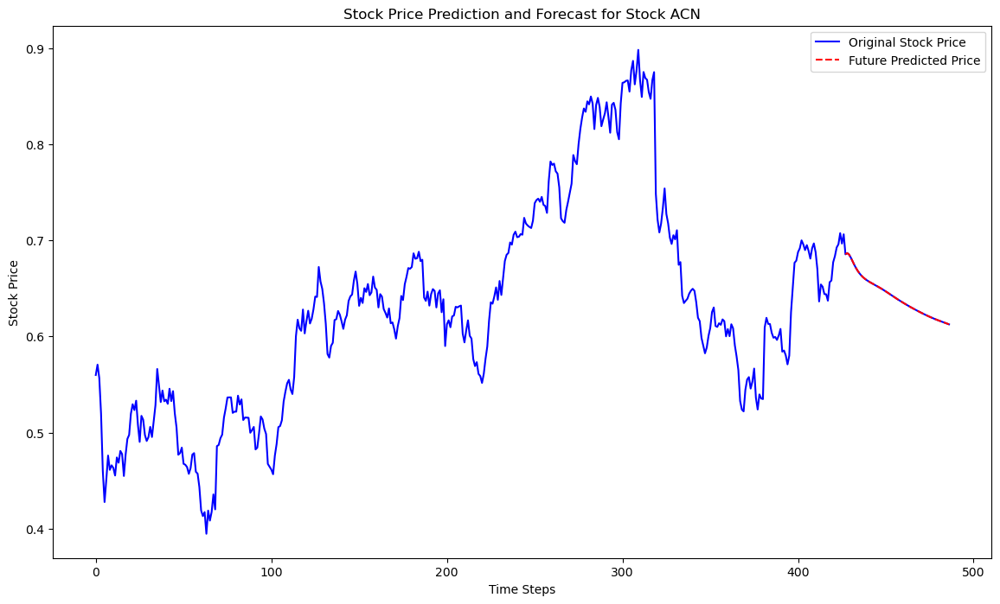

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


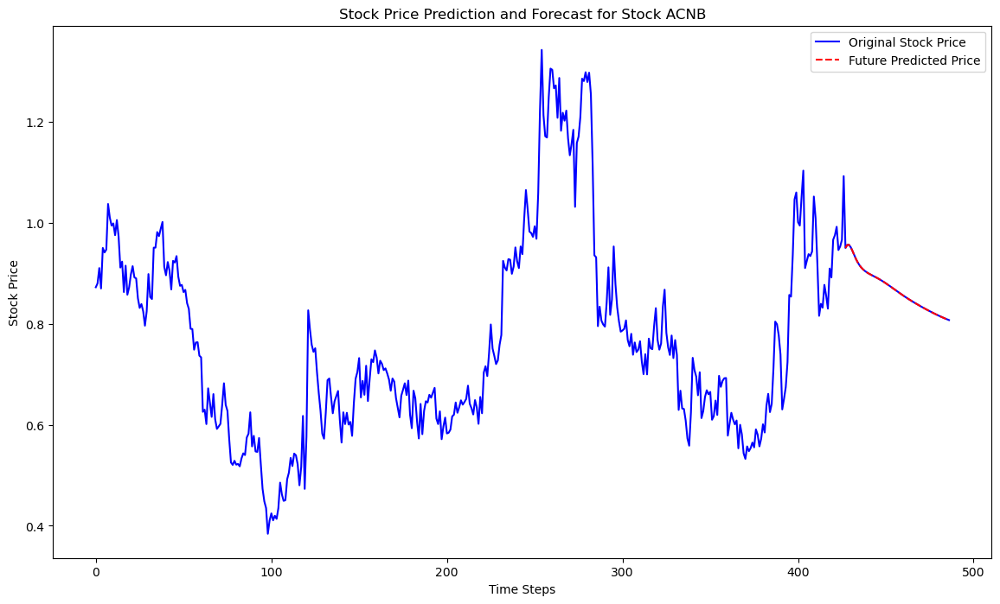

 1/14 [=>............................] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


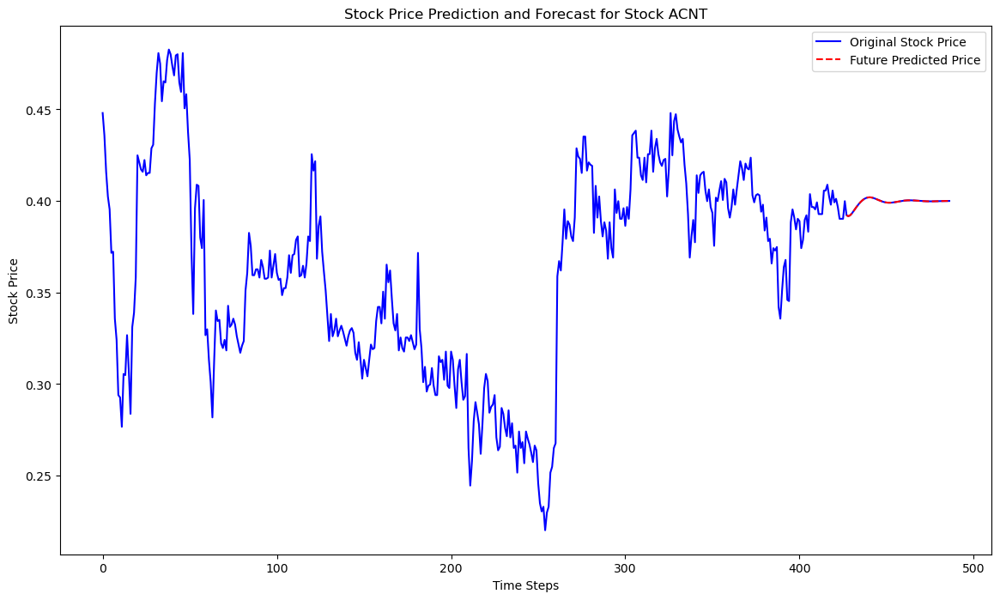

1/1 [==============================] - 0s 21ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


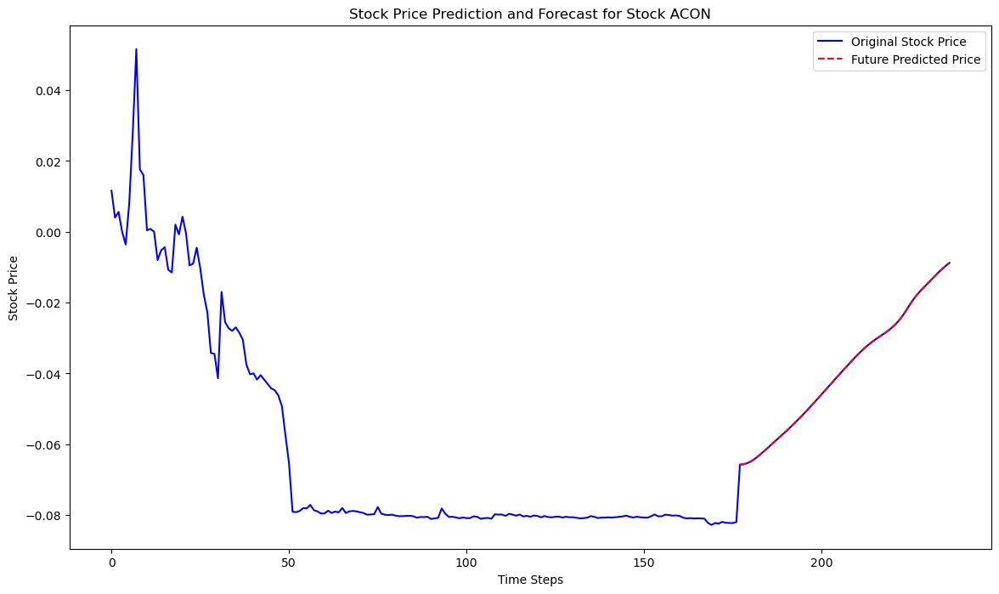

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


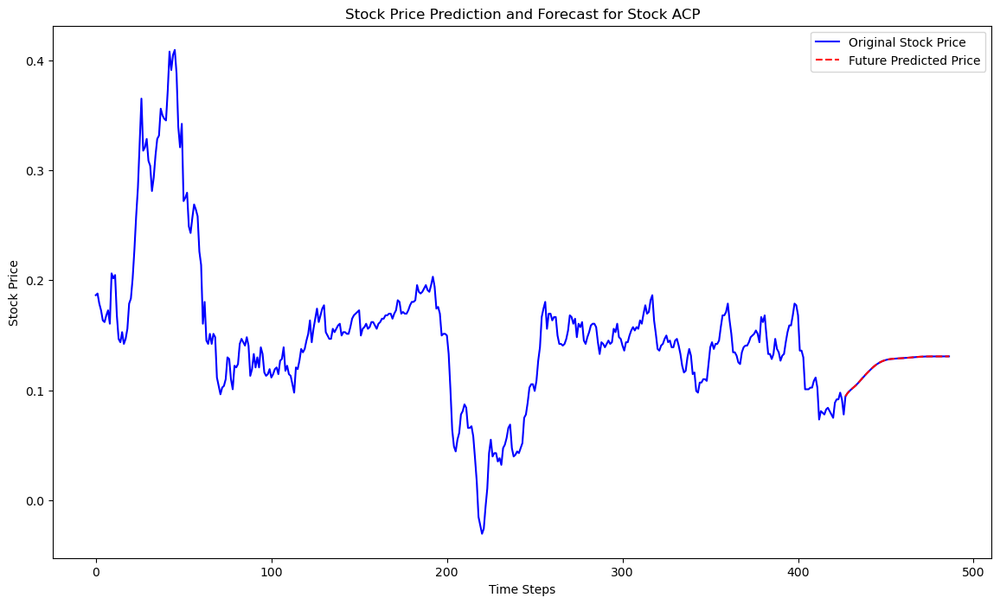

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


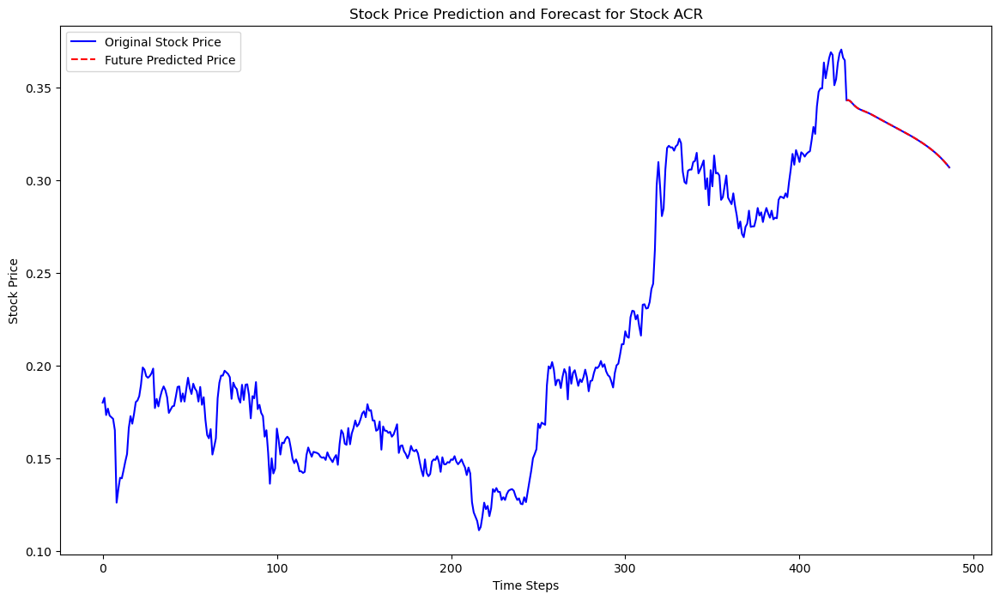

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


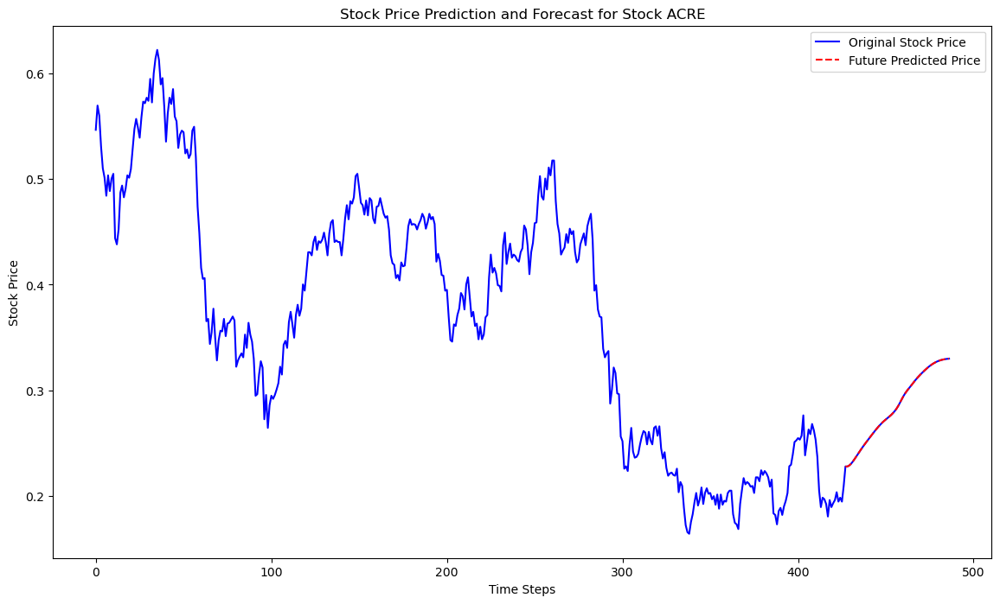

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


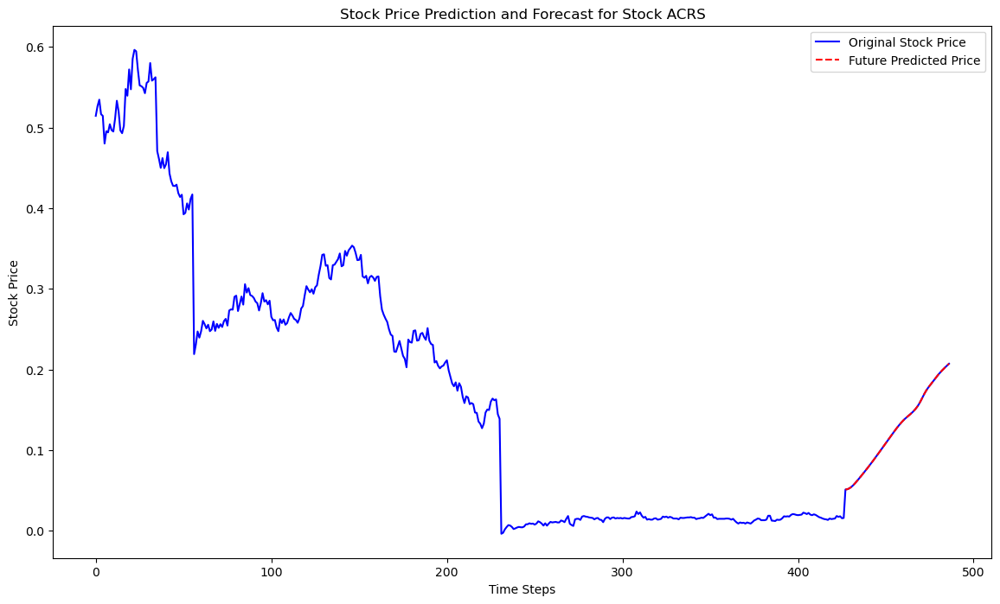

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


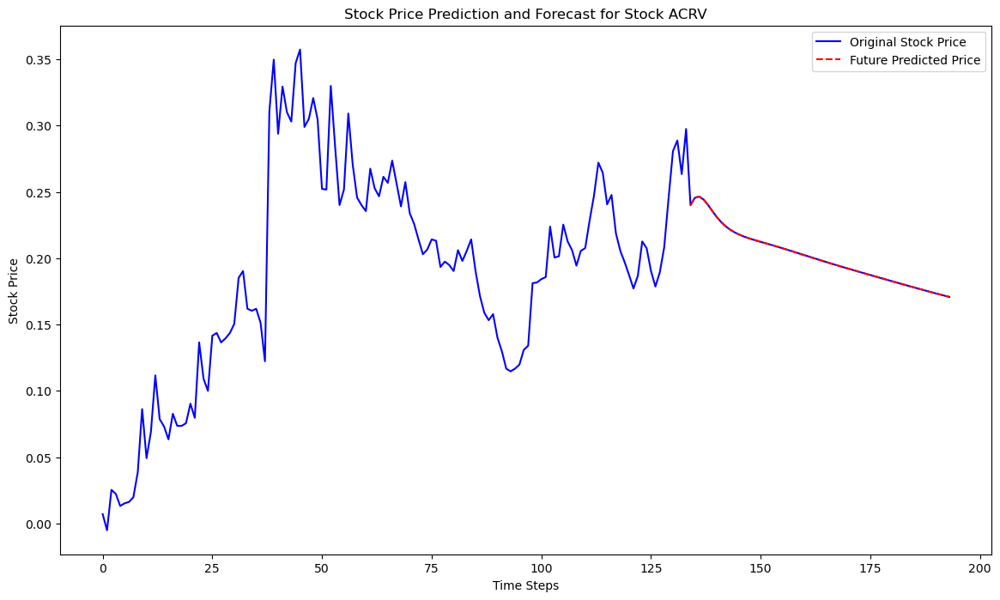

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


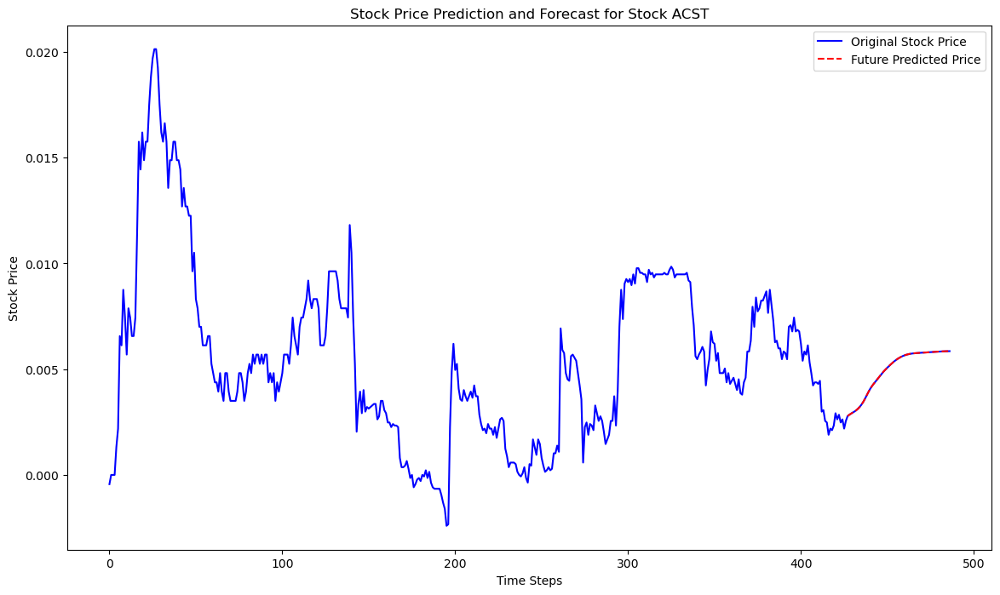

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


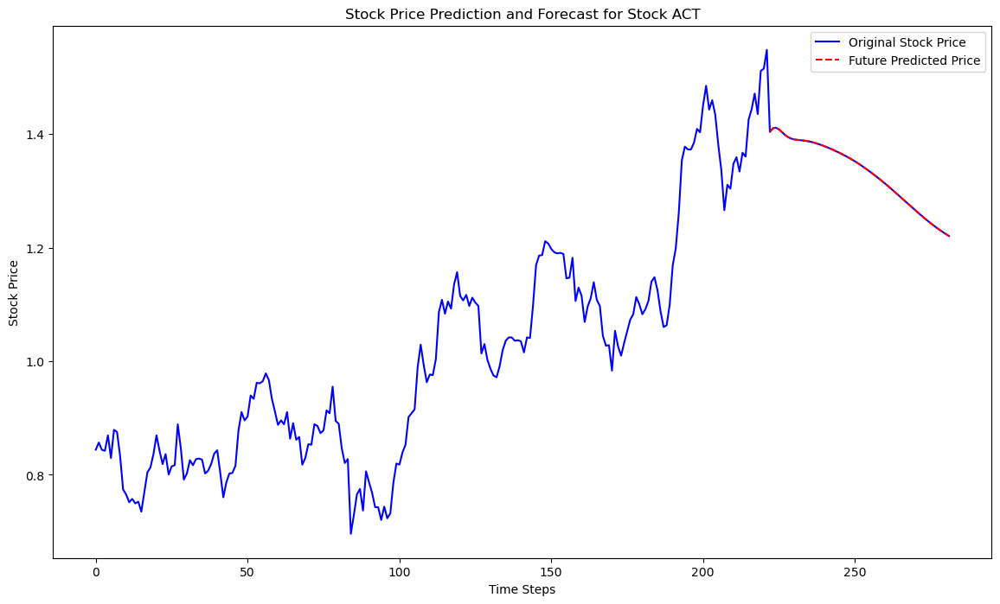

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


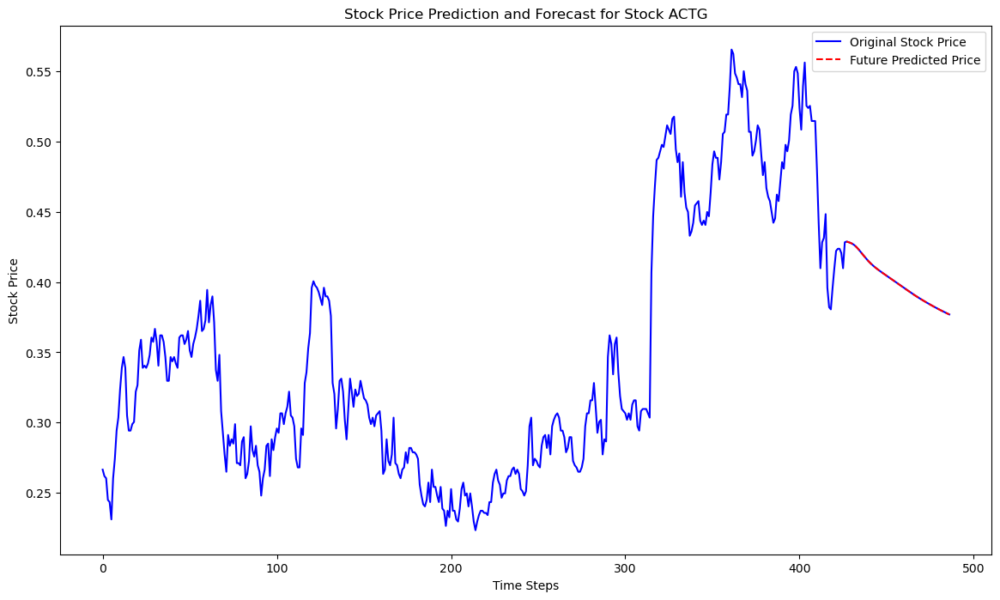

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


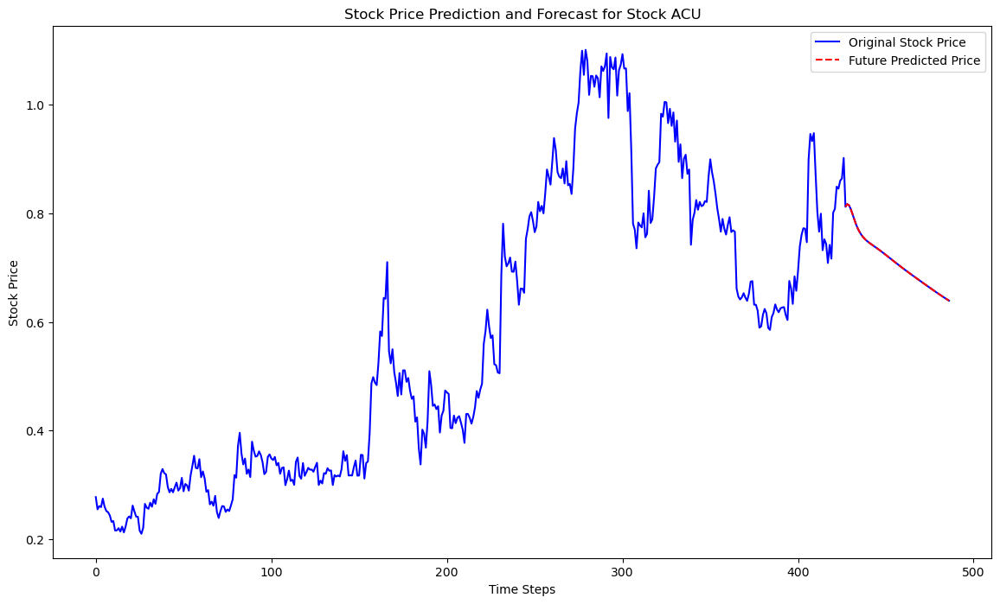

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


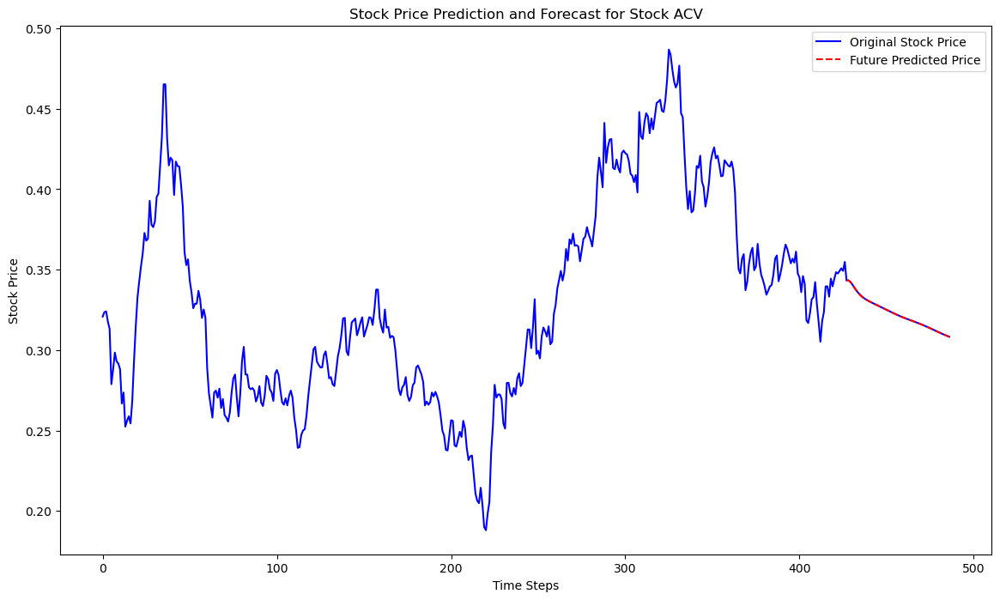

9/9 [==============================] - 0s 15ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


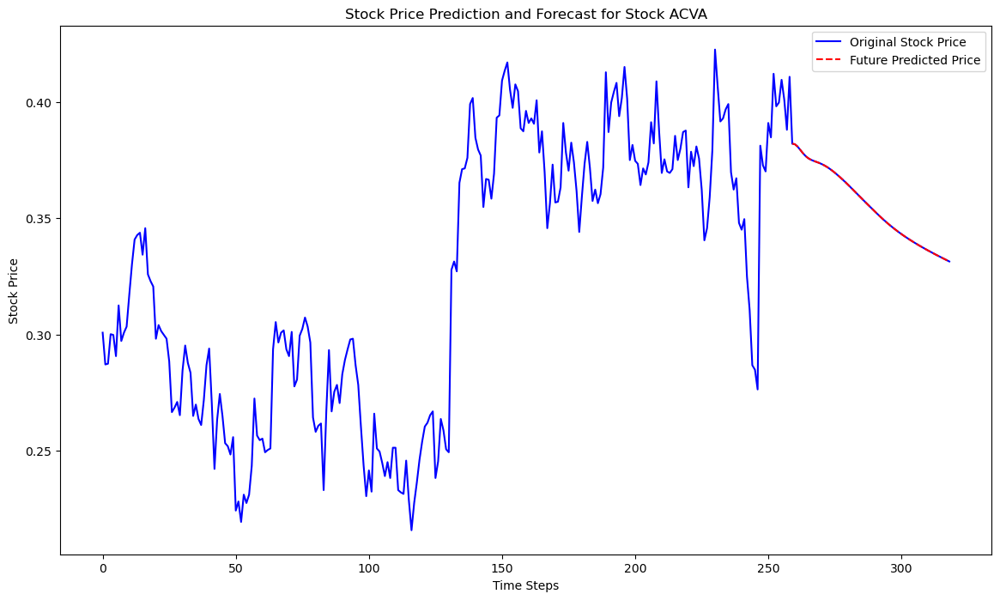

8/8 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


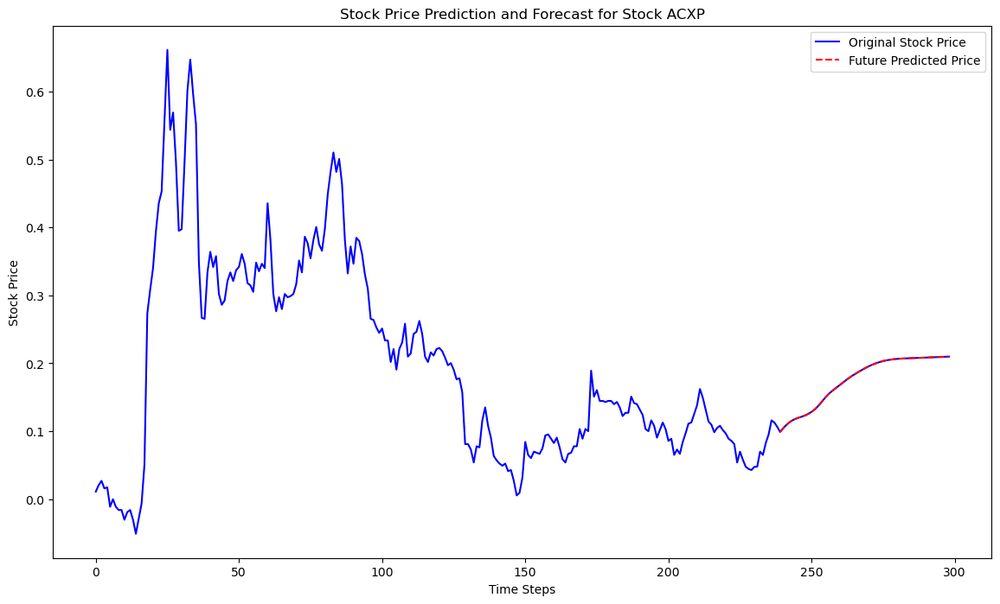

9/9 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


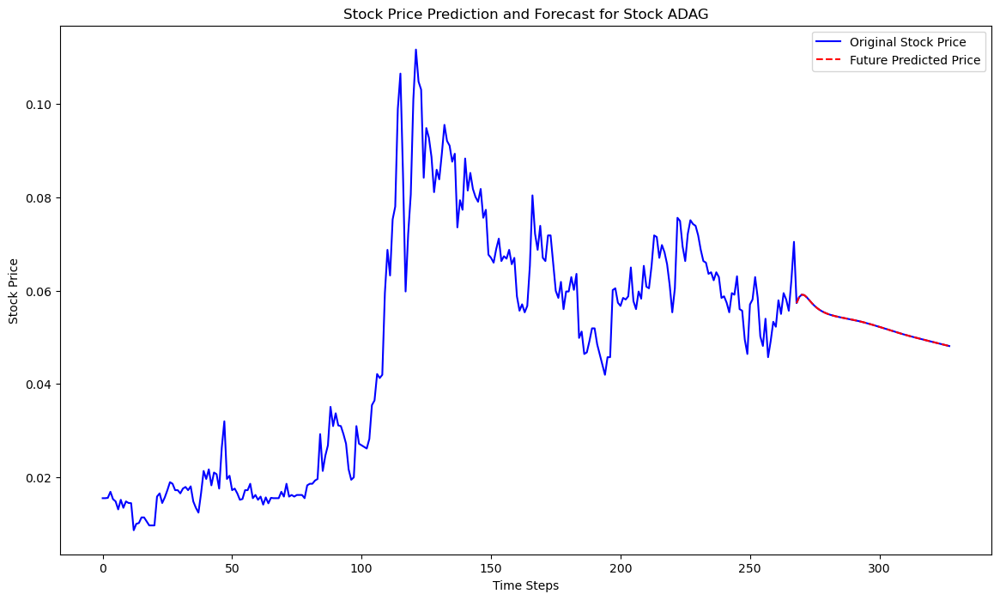

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


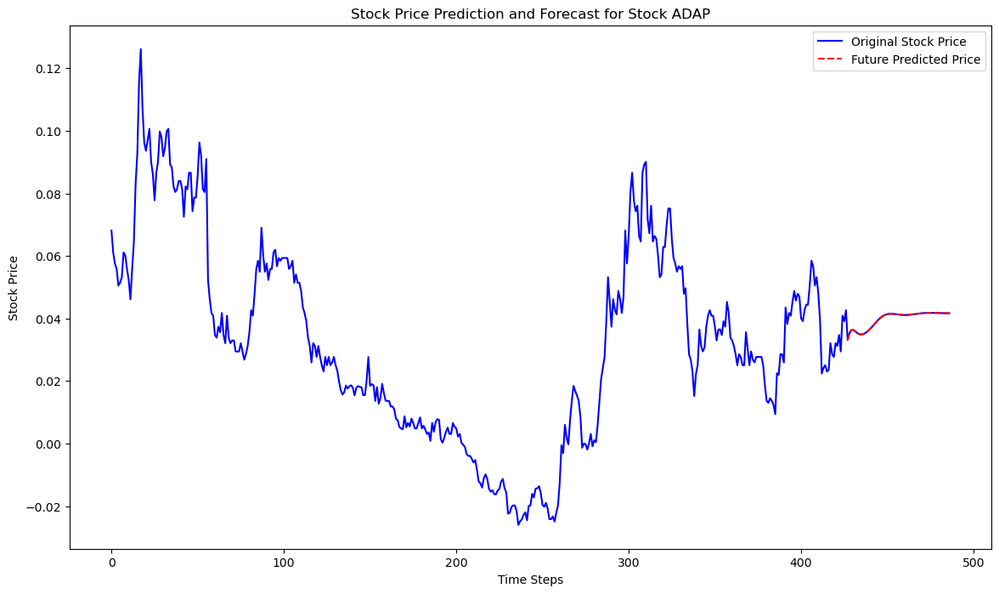

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


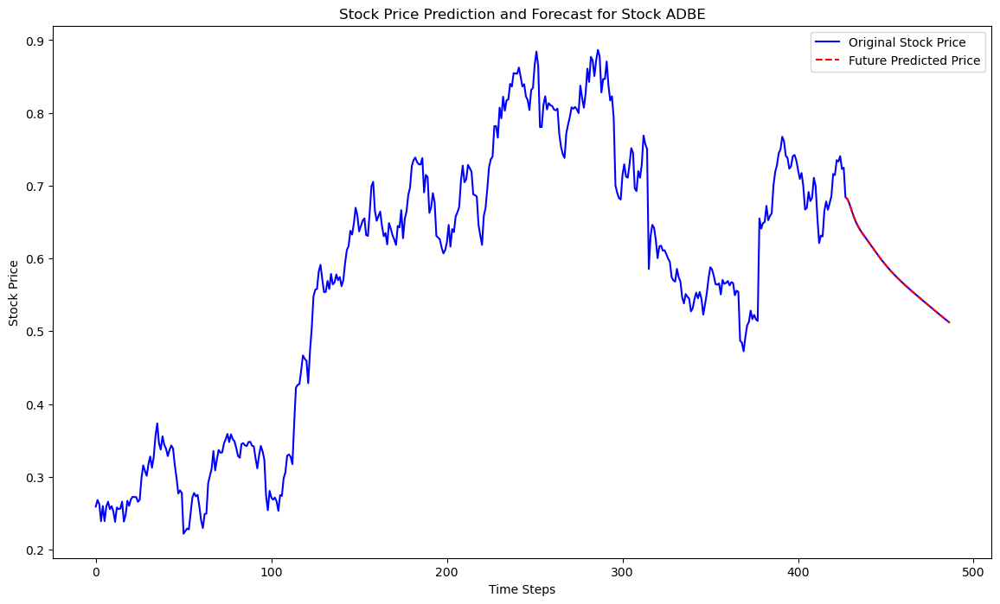

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


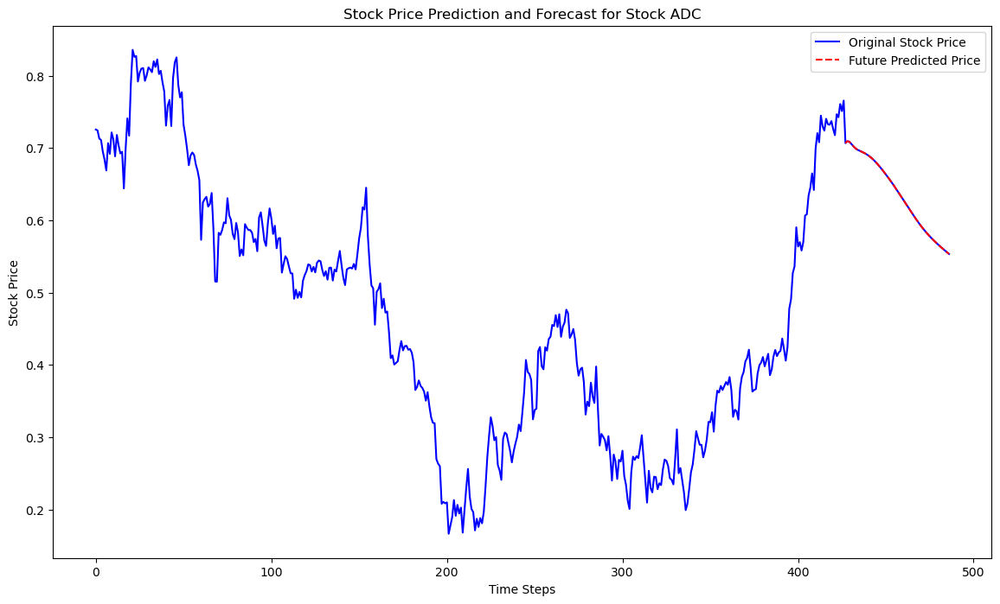

11/11 [==============================] - 0s 14ms/step


C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


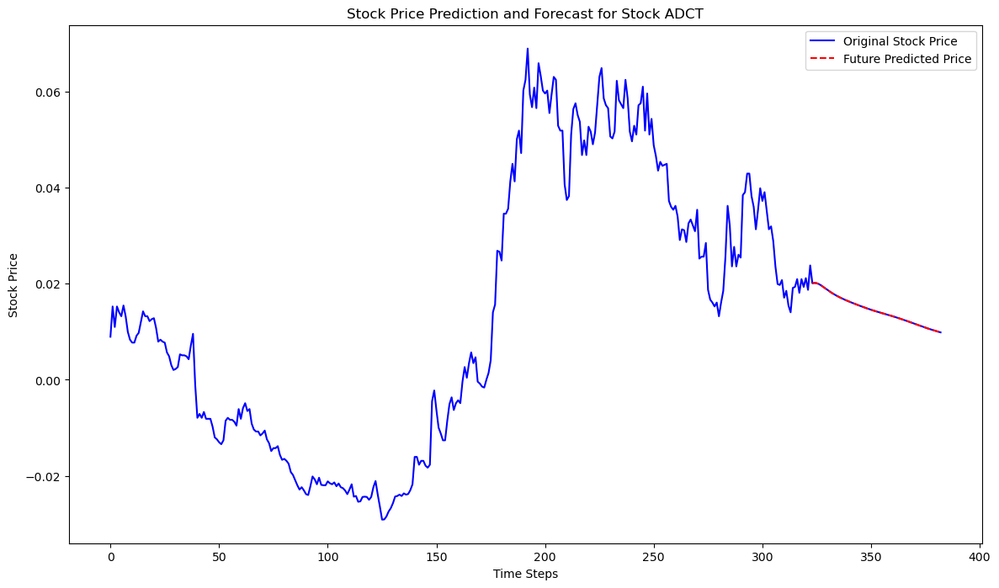

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 18ms/step


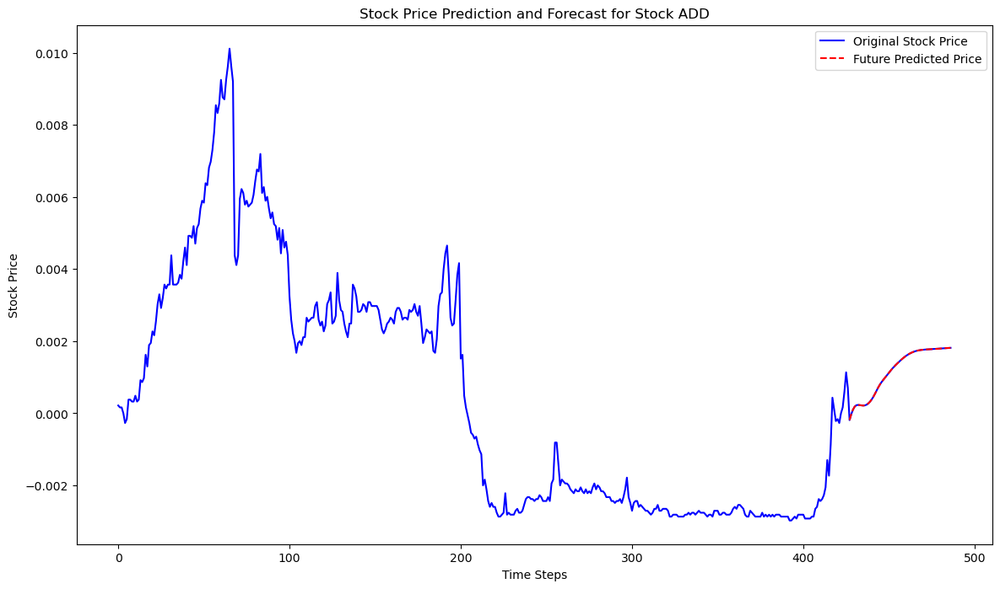

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


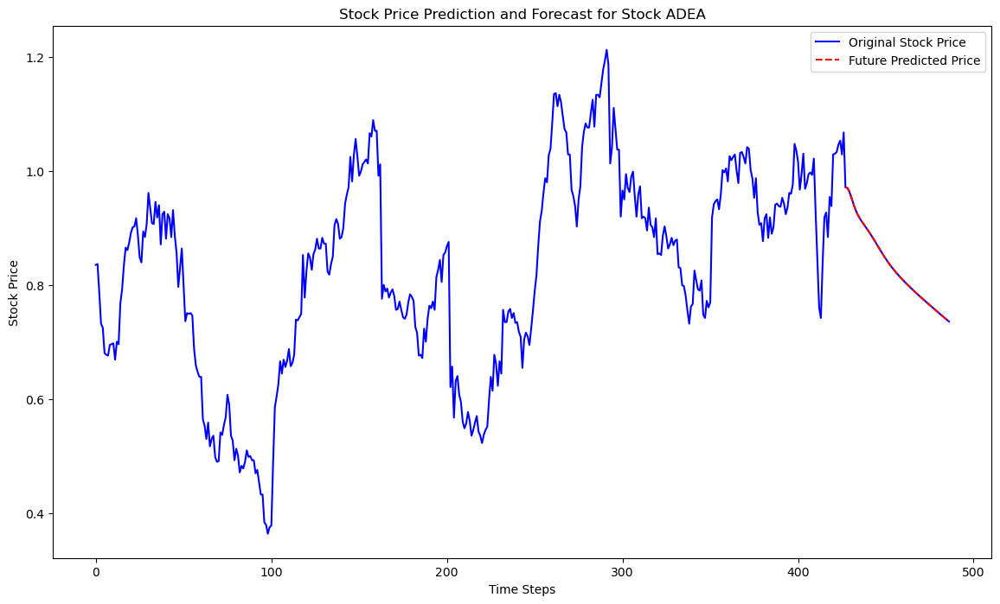

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 18ms/step


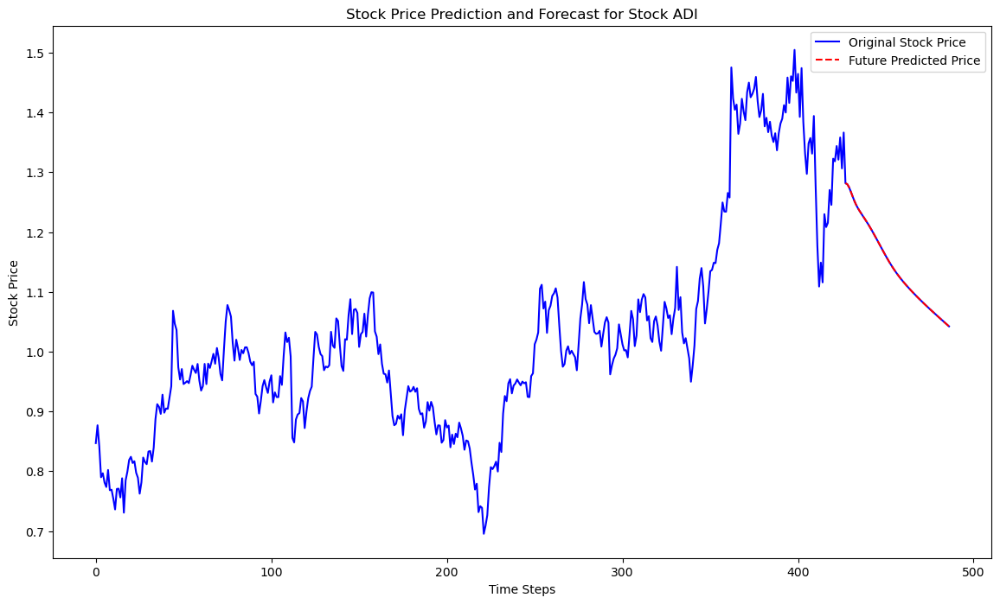

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


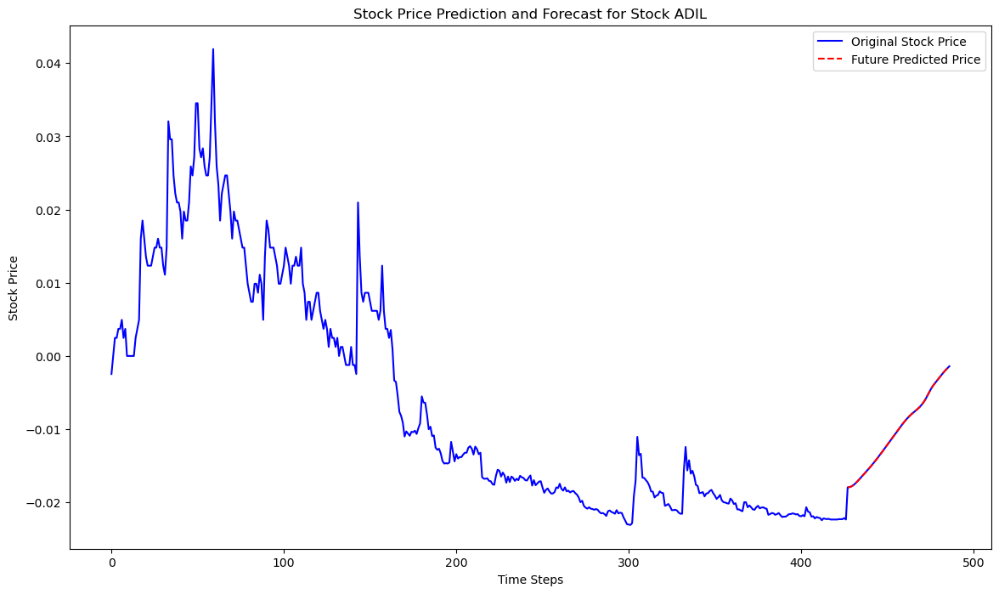

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


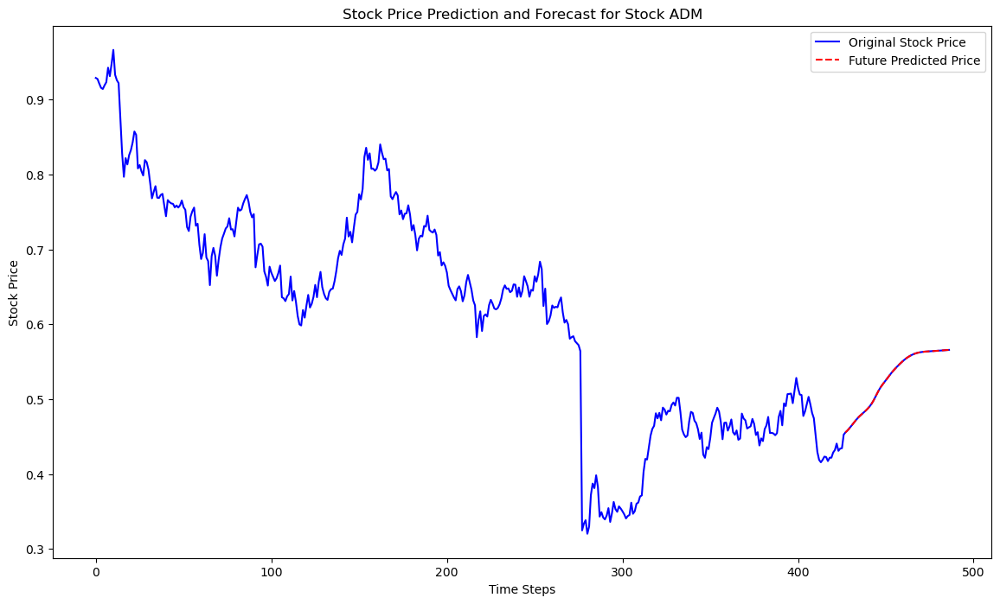

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


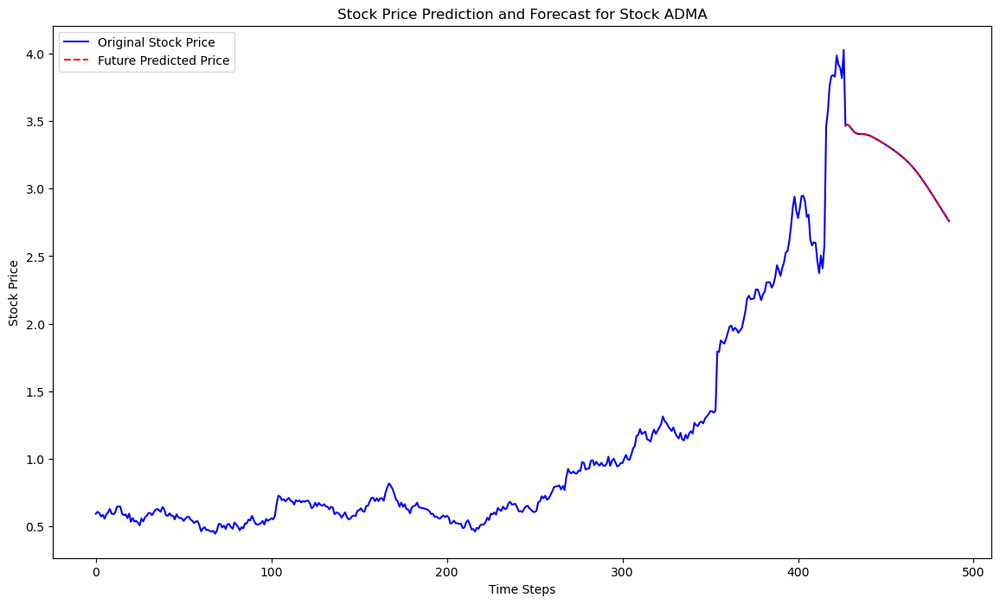

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


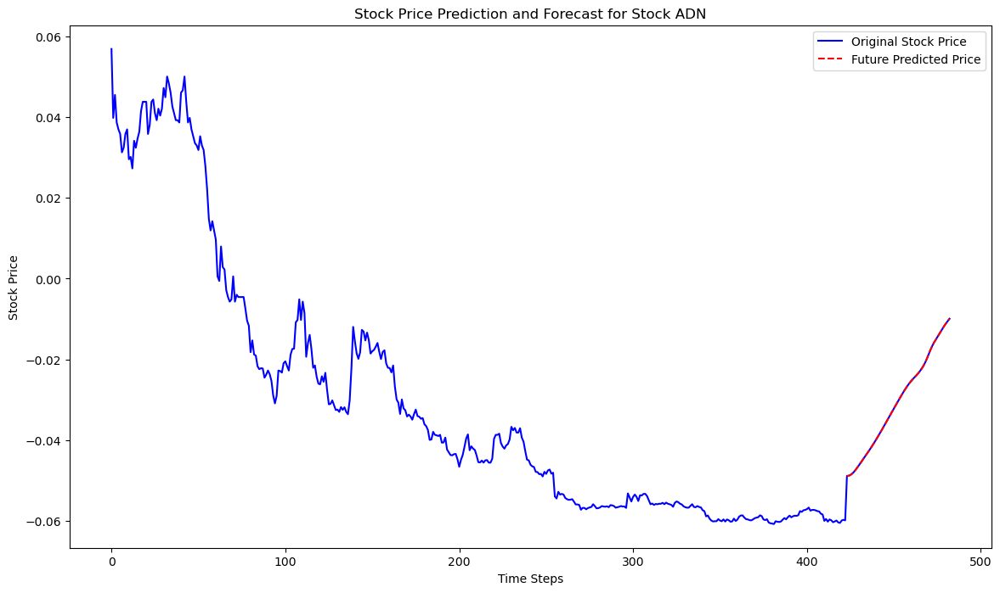

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 20ms/step


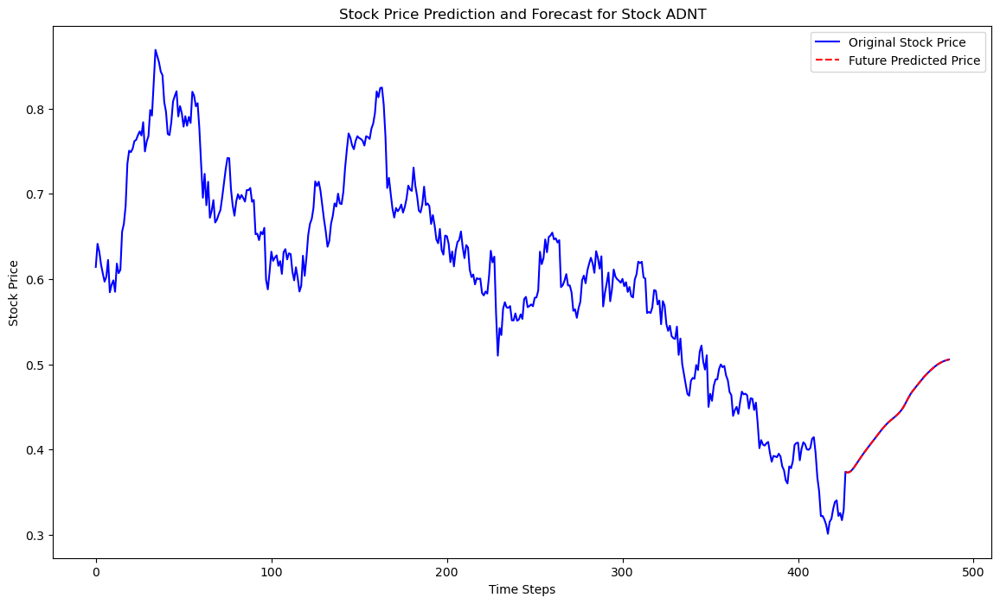

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


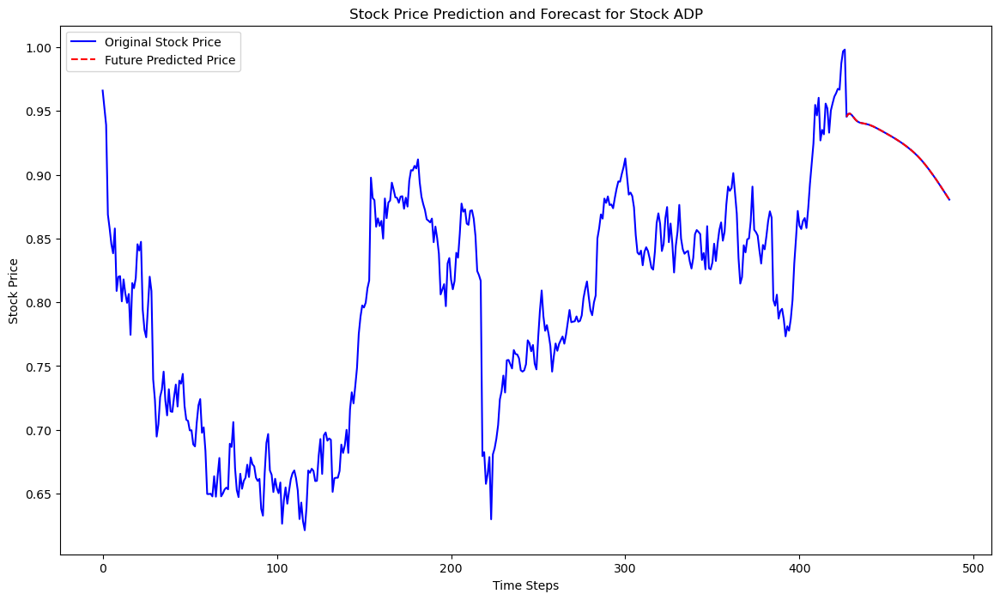

 9/13 [===================>..........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 22ms/step


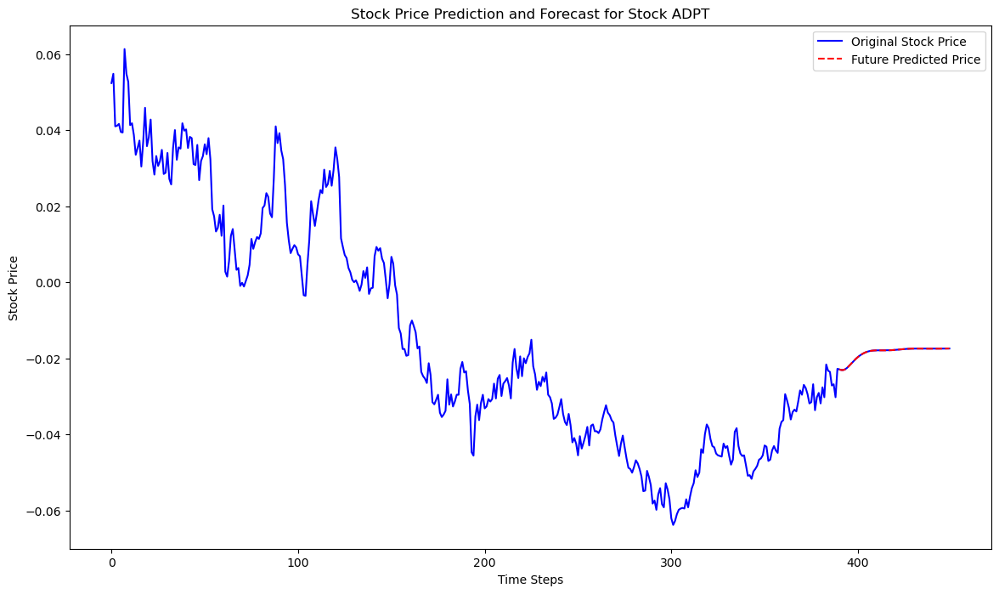

1/1 [==============================] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


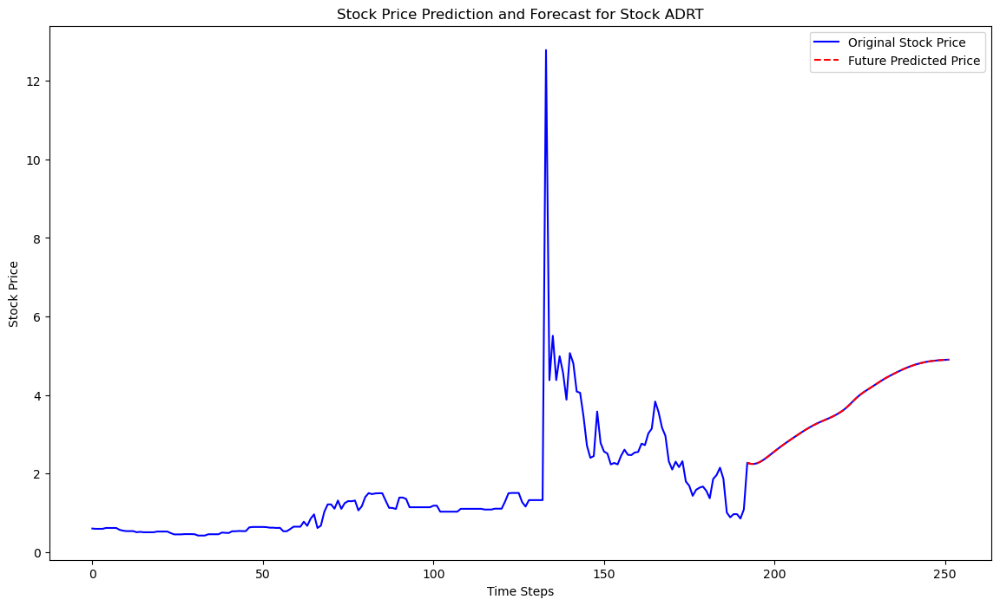

8/9 [=========================>....] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 21ms/step


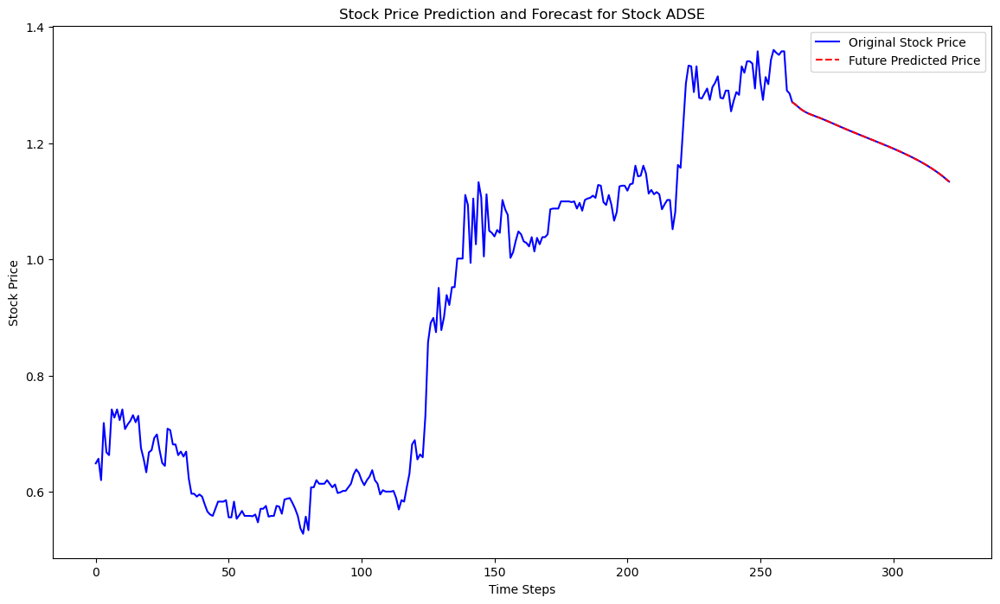

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 23ms/step


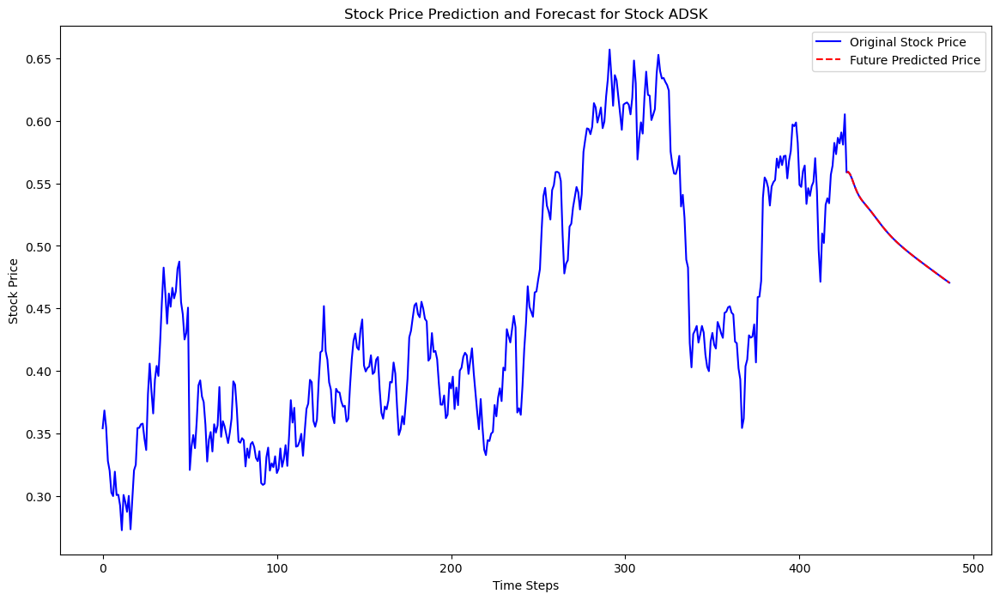

 9/14 [==================>...........] - ETA: 0s

C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_close['Close'] = scaler.fit_transform(train_close[['Close']])
C:\Users\Mohamed Aziz\AppData\Local\Temp\ipykernel_4712\186629988.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_close['Close'] = scaler.transform(test_close[['Close']])


1/1 [==============================] - 0s 19ms/step


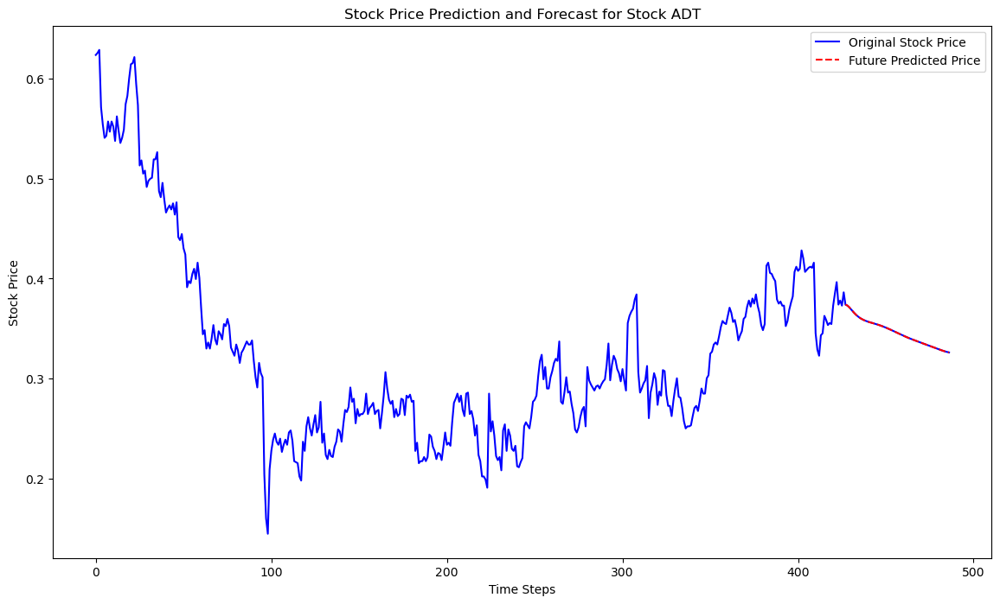

Number of stocks skipped: 1
Skipped stocks: ['ABVE']


In [48]:
num_symbols_to_take = len(dfs_yf)  
future_predictions_dict = {}
skipped_stocks_count = 0  
skipped_stocks_title = []

for j in range(num_symbols_to_take):
    
    dfs_yf[j].reset_index(inplace=True)
    
    data = dfs_yf[j]
    data['Date'] = pd.to_datetime(data['Date'])
    
    train = data[0:int(len(data) * 0.70)]
    test = data[int(len(data) * 0.70):]

    scaler = MinMaxScaler(feature_range=(0, 1))
    train_close = train[['Date', 'Close']]
    test_close = test[['Date', 'Close']]

    train_close['Close'] = scaler.fit_transform(train_close[['Close']])
    test_close['Close'] = scaler.transform(test_close[['Close']])

    x_train = []
    y_train = []
    for i in range(50, len(train_close)):
        x_train.append(train_close[['Close']].iloc[i - 50:i].values)
        y_train.append(train_close['Close'].iloc[i])

    x_train, y_train = np.array(x_train), np.array(y_train)

    past_50_days = train_close[['Close']].iloc[-50:]
    final_df = pd.concat([past_50_days, test_close[['Close']]], ignore_index=True)
    input_data = scaler.fit_transform(final_df)
    x_test = []
    y_test = []

    for i in range(50, input_data.shape[0]):
        x_test.append(input_data[i - 50:i])
        y_test.append(input_data[i, 0])
    x_test, y_test = np.array(x_test), np.array(y_test)

    
    if len(x_test) == 0:
        print(f"No data available for prediction for Stock {selected_stocks[j]}. Skipping this stock.")
        skipped_stocks_count += 1 
        skipped_stocks_title.append(selected_stocks[j])
        continue  

    test_predict = model.predict(x_test)
    test_predict = scaler.inverse_transform(test_predict)

    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    if len(y_test) >= 50:
        
        last_sequence = y_test[-50:]

        future_predictions = []
        current_sequence = last_sequence

        for _ in range(60):  
            current_sequence = current_sequence.reshape((1, 50, 1))
            next_pred = model.predict(current_sequence)
            future_predictions.append(next_pred[0, 0])
            next_pred = next_pred.reshape((1, 1, 1))
            current_sequence = np.append(current_sequence[:, 1:, :], next_pred, axis=1)

        future_predictions = np.array(future_predictions).reshape(-1, 1)
        future_predictions = scaler.inverse_transform(future_predictions)

        future_predictions_dict[f'{selected_stocks[j]}'] = future_predictions

        plt.figure(figsize=(14, 8))

        combined_actual_predicted = np.concatenate((y_test_inv, future_predictions))
        plt.plot(combined_actual_predicted, color='blue', label='Original Stock Price')

        plt.plot(range(len(y_test_inv), len(y_test_inv) + len(future_predictions)), 
                 future_predictions, color='red', linestyle='--', label='Future Predicted Price')

        plt.title(f'Stock Price Prediction and Forecast for Stock {selected_stocks[j]}')
        plt.xlabel('Time Steps')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()
    else:
        print(f"Skipping stock {selected_stocks[j]} due to insufficient data points.")
        skipped_stocks_count += 1  
        skipped_stocks_title.append(selected_stocks[j])
        


print(f"Number of stocks skipped: {skipped_stocks_count}")
print("Skipped stocks:", skipped_stocks_title)


In [49]:
print("-" * 80)
for j in range(num_symbols_to_take):
    stock_symbol = selected_stocks[j]
    if stock_symbol in future_predictions_dict:
        print(f"Future values for stock: {stock_symbol}")
        display(future_predictions_dict[stock_symbol])
    else:
        print(f"Removed stock : {stock_symbol}")
    print("-" * 80)

--------------------------------------------------------------------------------
Future values for stock: A


array([[0.6436303 ],
       [0.6427862 ],
       [0.6399642 ],
       [0.6358955 ],
       [0.63142073],
       [0.62715757],
       [0.62344265],
       [0.62037176],
       [0.61789405],
       [0.6159017 ],
       [0.6142821 ],
       [0.612938  ],
       [0.61178565],
       [0.61075413],
       [0.6097847 ],
       [0.60883373],
       [0.60786796],
       [0.60686386],
       [0.60580736],
       [0.604693  ],
       [0.6035216 ],
       [0.602297  ],
       [0.60102546],
       [0.59971625],
       [0.59837675],
       [0.59701836],
       [0.59565014],
       [0.59427816],
       [0.5929058 ],
       [0.5915394 ],
       [0.5901806 ],
       [0.58883274],
       [0.5874939 ],
       [0.5861683 ],
       [0.5848556 ],
       [0.5835561 ],
       [0.5822681 ],
       [0.58098805],
       [0.5797178 ],
       [0.57845706],
       [0.57720655],
       [0.5759659 ],
       [0.57473236],
       [0.5735076 ],
       [0.57229155],
       [0.57109183],
       [0.5699113 ],
       [0.568

--------------------------------------------------------------------------------
Future values for stock: AA


array([[0.30540553],
       [0.30732805],
       [0.30836636],
       [0.30875316],
       [0.30882114],
       [0.30882627],
       [0.30903244],
       [0.309491  ],
       [0.31015685],
       [0.3110004 ],
       [0.31205496],
       [0.31332868],
       [0.31473213],
       [0.31615886],
       [0.31756863],
       [0.31895614],
       [0.3203257 ],
       [0.32168984],
       [0.3230038 ],
       [0.3242237 ],
       [0.32531476],
       [0.32627162],
       [0.32708806],
       [0.3277738 ],
       [0.32833293],
       [0.3287732 ],
       [0.3291243 ],
       [0.3293936 ],
       [0.32959244],
       [0.3297385 ],
       [0.32985136],
       [0.32993677],
       [0.33000216],
       [0.33006683],
       [0.33013535],
       [0.33021596],
       [0.33031023],
       [0.33041456],
       [0.33052653],
       [0.33064282],
       [0.33076358],
       [0.33088478],
       [0.3310025 ],
       [0.33111283],
       [0.3312119 ],
       [0.33129892],
       [0.3313718 ],
       [0.331

--------------------------------------------------------------------------------
Future values for stock: AACG


array([[0.00679878],
       [0.00676355],
       [0.00688407],
       [0.00715737],
       [0.00755514],
       [0.00804291],
       [0.00858642],
       [0.00915852],
       [0.00974033],
       [0.01032245],
       [0.01090034],
       [0.01147956],
       [0.01206531],
       [0.01266291],
       [0.01327287],
       [0.01389861],
       [0.01453783],
       [0.01518647],
       [0.01584601],
       [0.01651657],
       [0.01718513],
       [0.01786555],
       [0.0185515 ],
       [0.01923914],
       [0.01992227],
       [0.02060227],
       [0.02127968],
       [0.02195353],
       [0.02262316],
       [0.02328319],
       [0.02392082],
       [0.02451898],
       [0.02508218],
       [0.02560684],
       [0.02609127],
       [0.02653553],
       [0.02694347],
       [0.02735461],
       [0.02779082],
       [0.028277  ],
       [0.02882179],
       [0.02944126],
       [0.0301841 ],
       [0.03105319],
       [0.03202186],
       [0.03297385],
       [0.03383739],
       [0.034

--------------------------------------------------------------------------------
Future values for stock: AACI


array([[0.4020335 ],
       [0.32767972],
       [0.2604544 ],
       [0.20698611],
       [0.16836938],
       [0.14008729],
       [0.11888762],
       [0.1034931 ],
       [0.09454296],
       [0.09118073],
       [0.09254954],
       [0.09794107],
       [0.10655429],
       [0.11726867],
       [0.12938145],
       [0.14249347],
       [0.15624975],
       [0.17002937],
       [0.18337661],
       [0.19729047],
       [0.212608  ],
       [0.22956352],
       [0.24813084],
       [0.26931667],
       [0.293532  ],
       [0.32070318],
       [0.3482652 ],
       [0.37361848],
       [0.39563054],
       [0.41440594],
       [0.43195763],
       [0.44916335],
       [0.46689662],
       [0.4848396 ],
       [0.50212526],
       [0.51817846],
       [0.5330502 ],
       [0.5470506 ],
       [0.5606581 ],
       [0.5740054 ],
       [0.5867442 ],
       [0.5988423 ],
       [0.6098922 ],
       [0.6195937 ],
       [0.6284982 ],
       [0.6363371 ],
       [0.643085  ],
       [0.648

--------------------------------------------------------------------------------
Future values for stock: AACT


array([[1.2258271],
       [1.225333 ],
       [1.223849 ],
       [1.2219276],
       [1.220023 ],
       [1.218398 ],
       [1.2171352],
       [1.2161708],
       [1.2153805],
       [1.2146503],
       [1.2139025],
       [1.2130969],
       [1.2122213],
       [1.2112749],
       [1.2102698],
       [1.2092195],
       [1.2081404],
       [1.2070454],
       [1.2059444],
       [1.2048483],
       [1.203755 ],
       [1.2026743],
       [1.2015966],
       [1.2005299],
       [1.1994611],
       [1.198395 ],
       [1.1973276],
       [1.1962532],
       [1.1951715],
       [1.1940802],
       [1.1929841],
       [1.1918722],
       [1.1907555],
       [1.1896201],
       [1.1884725],
       [1.1873062],
       [1.1861204],
       [1.1849138],
       [1.183676 ],
       [1.182414 ],
       [1.1811188],
       [1.1797795],
       [1.178402 ],
       [1.1769828],
       [1.1755074],
       [1.1739873],
       [1.172414 ],
       [1.1707726],
       [1.1690761],
       [1.1673003],


--------------------------------------------------------------------------------
Future values for stock: AADI


array([[-0.07716462],
       [-0.07700107],
       [-0.07665861],
       [-0.07613277],
       [-0.07545136],
       [-0.07465664],
       [-0.07379126],
       [-0.07288712],
       [-0.07196458],
       [-0.07103419],
       [-0.07010206],
       [-0.0691643 ],
       [-0.06821553],
       [-0.06725033],
       [-0.06626347],
       [-0.06524986],
       [-0.06421013],
       [-0.06314425],
       [-0.0620554 ],
       [-0.06094372],
       [-0.05981465],
       [-0.05867034],
       [-0.05751663],
       [-0.05635678],
       [-0.05519471],
       [-0.054031  ],
       [-0.05287541],
       [-0.05172732],
       [-0.05058536],
       [-0.04944912],
       [-0.04831851],
       [-0.04719716],
       [-0.04609805],
       [-0.04504432],
       [-0.04405685],
       [-0.04312839],
       [-0.04226657],
       [-0.04147317],
       [-0.0407479 ],
       [-0.04006518],
       [-0.03936999],
       [-0.03861483],
       [-0.03777039],
       [-0.03683184],
       [-0.03574268],
       [-0

--------------------------------------------------------------------------------
Future values for stock: AAGR


array([[-7.949984 ],
       [-7.9454117],
       [-7.9329634],
       [-7.9122834],
       [-7.8844776],
       [-7.851309 ],
       [-7.814779 ],
       [-7.7765245],
       [-7.737622 ],
       [-7.6986628],
       [-7.659849 ],
       [-7.6210575],
       [-7.582067 ],
       [-7.5425935],
       [-7.5023656],
       [-7.4611945],
       [-7.4189377],
       [-7.375501 ],
       [-7.3308897],
       [-7.2851844],
       [-7.2385416],
       [-7.191273 ],
       [-7.1435018],
       [-7.0952234],
       [-7.046581 ],
       [-6.9979467],
       [-6.949322 ],
       [-6.9006963],
       [-6.8524117],
       [-6.804455 ],
       [-6.7567825],
       [-6.7093906],
       [-6.6624365],
       [-6.6164484],
       [-6.5724244],
       [-6.531172 ],
       [-6.4924116],
       [-6.456433 ],
       [-6.423318 ],
       [-6.393053 ],
       [-6.364476 ],
       [-6.335361 ],
       [-6.303667 ],
       [-6.26821  ],
       [-6.228843 ],
       [-6.18304  ],
       [-6.128126 ],
       [-6.06

--------------------------------------------------------------------------------
Future values for stock: AAL


array([[0.05618045],
       [0.0572609 ],
       [0.05855069],
       [0.06002459],
       [0.06163577],
       [0.06333273],
       [0.06507012],
       [0.06681499],
       [0.06854636],
       [0.07025472],
       [0.07193782],
       [0.07359878],
       [0.07524475],
       [0.0768774 ],
       [0.0784995 ],
       [0.08010083],
       [0.08165527],
       [0.08312166],
       [0.08450552],
       [0.08580036],
       [0.08699982],
       [0.08810246],
       [0.08911133],
       [0.09011933],
       [0.09117961],
       [0.09236024],
       [0.09368567],
       [0.09518234],
       [0.09696606],
       [0.09905973],
       [0.10143432],
       [0.10382475],
       [0.10601627],
       [0.10792197],
       [0.10959093],
       [0.11113828],
       [0.11266901],
       [0.11426444],
       [0.11586212],
       [0.11739583],
       [0.11881296],
       [0.1201295 ],
       [0.12138174],
       [0.12259163],
       [0.12377274],
       [0.12489878],
       [0.12594876],
       [0.126

--------------------------------------------------------------------------------
Future values for stock: AAMC


array([[ 2.7761277e-04],
       [-9.0275280e-05],
       [-1.9669249e-04],
       [-7.7040473e-05],
       [ 2.1053443e-04],
       [ 6.0484017e-04],
       [ 1.0572872e-03],
       [ 1.5323134e-03],
       [ 2.0070754e-03],
       [ 2.4692132e-03],
       [ 2.9112853e-03],
       [ 3.3284219e-03],
       [ 3.7157016e-03],
       [ 4.0751384e-03],
       [ 4.4095651e-03],
       [ 4.7194189e-03],
       [ 5.0046048e-03],
       [ 5.2652904e-03],
       [ 5.5241846e-03],
       [ 5.7950909e-03],
       [ 6.0944296e-03],
       [ 6.4274673e-03],
       [ 6.8003112e-03],
       [ 7.2416784e-03],
       [ 7.7585895e-03],
       [ 8.3455276e-03],
       [ 8.9383060e-03],
       [ 9.4831865e-03],
       [ 9.9570341e-03],
       [ 1.0371261e-02],
       [ 1.0754725e-02],
       [ 1.1133091e-02],
       [ 1.1526942e-02],
       [ 1.1922685e-02],
       [ 1.2303667e-02],
       [ 1.2655781e-02],
       [ 1.2982500e-02],
       [ 1.3293173e-02],
       [ 1.3593111e-02],
       [ 1.3886235e-02],


--------------------------------------------------------------------------------
Future values for stock: AAME


array([[0.03085075],
       [0.03077994],
       [0.03107199],
       [0.03172487],
       [0.03268462],
       [0.03385776],
       [0.03517992],
       [0.03657744],
       [0.03800453],
       [0.03943451],
       [0.04084709],
       [0.04225352],
       [0.04365848],
       [0.04506977],
       [0.04648982],
       [0.04792831],
       [0.0493887 ],
       [0.05086827],
       [0.05236663],
       [0.05389097],
       [0.05542223],
       [0.05696872],
       [0.05851231],
       [0.06003998],
       [0.06156635],
       [0.06309483],
       [0.06461402],
       [0.06611731],
       [0.06757688],
       [0.06895249],
       [0.07024623],
       [0.07145751],
       [0.0725771 ],
       [0.07360373],
       [0.07454042],
       [0.07547227],
       [0.07644919],
       [0.07753505],
       [0.07875339],
       [0.0801286 ],
       [0.08176489],
       [0.08368417],
       [0.08586209],
       [0.08805832],
       [0.09007534],
       [0.09182974],
       [0.09336442],
       [0.094

--------------------------------------------------------------------------------
Future values for stock: AAN


array([[0.06998982],
       [0.06989449],
       [0.06989839],
       [0.07002815],
       [0.07025337],
       [0.07051573],
       [0.07076556],
       [0.07097332],
       [0.07113019],
       [0.07124023],
       [0.07131195],
       [0.0713534 ],
       [0.07137101],
       [0.07137004],
       [0.07135532],
       [0.07133166],
       [0.07130383],
       [0.07127628],
       [0.07125291],
       [0.07123658],
       [0.07122914],
       [0.07123151],
       [0.07124344],
       [0.07126392],
       [0.07129115],
       [0.0713231 ],
       [0.07135773],
       [0.07139317],
       [0.07142738],
       [0.07145888],
       [0.07148635],
       [0.07150894],
       [0.0715263 ],
       [0.07153849],
       [0.07154565],
       [0.07154827],
       [0.07154734],
       [0.07154367],
       [0.07153824],
       [0.07153203],
       [0.07152591],
       [0.07152051],
       [0.07151638],
       [0.07151397],
       [0.07151327],
       [0.0715142 ],
       [0.07151673],
       [0.071

--------------------------------------------------------------------------------
Future values for stock: AAOI


array([[0.45856187],
       [0.46743235],
       [0.47314048],
       [0.4755604 ],
       [0.4757212 ],
       [0.4747294 ],
       [0.4735545 ],
       [0.47271106],
       [0.47242048],
       [0.47269663],
       [0.47353086],
       [0.47487736],
       [0.4766243 ],
       [0.47861955],
       [0.48076534],
       [0.48301902],
       [0.48522562],
       [0.48732996],
       [0.48922396],
       [0.49086004],
       [0.49218243],
       [0.4931729 ],
       [0.49384275],
       [0.49422425],
       [0.4943318 ],
       [0.49422687],
       [0.49396062],
       [0.4935905 ],
       [0.49318537],
       [0.49279147],
       [0.4924386 ],
       [0.49215686],
       [0.49196726],
       [0.49187547],
       [0.49189112],
       [0.49199966],
       [0.49218604],
       [0.4924298 ],
       [0.49271184],
       [0.49300992],
       [0.49330947],
       [0.49358934],
       [0.49383563],
       [0.49403682],
       [0.4941875 ],
       [0.49428883],
       [0.49434084],
       [0.494

--------------------------------------------------------------------------------
Future values for stock: AAON


array([[1.9661392],
       [1.9708996],
       [1.9692107],
       [1.9632688],
       [1.9555786],
       [1.9481659],
       [1.9421098],
       [1.9376875],
       [1.9345396],
       [1.9321501],
       [1.930047 ],
       [1.927912 ],
       [1.9255953],
       [1.923011 ],
       [1.9201586],
       [1.9170771],
       [1.9138165],
       [1.9104362],
       [1.9069775],
       [1.9034661],
       [1.899928 ],
       [1.8964024],
       [1.8928708],
       [1.8893695],
       [1.8858587],
       [1.8823344],
       [1.8787875],
       [1.875204 ],
       [1.8716037],
       [1.867962 ],
       [1.8642603],
       [1.860498 ],
       [1.8566815],
       [1.8527843],
       [1.8488129],
       [1.8447541],
       [1.8405926],
       [1.8363109],
       [1.8318937],
       [1.8273271],
       [1.8225892],
       [1.8176537],
       [1.8125112],
       [1.8071635],
       [1.801573 ],
       [1.7957633],
       [1.7896727],
       [1.7832946],
       [1.7765425],
       [1.7694432],


--------------------------------------------------------------------------------
Future values for stock: AAP


array([[-0.04247992],
       [-0.04244925],
       [-0.04144314],
       [-0.03932152],
       [-0.03621953],
       [-0.0323962 ],
       [-0.02811716],
       [-0.02361217],
       [-0.01904855],
       [-0.01452903],
       [-0.01010713],
       [-0.0057967 ],
       [-0.00158051],
       [ 0.00255754],
       [ 0.00665493],
       [ 0.01072113],
       [ 0.01477203],
       [ 0.01878964],
       [ 0.02271493],
       [ 0.0264454 ],
       [ 0.02996259],
       [ 0.03326254],
       [ 0.03632162],
       [ 0.03913262],
       [ 0.04170071],
       [ 0.04421523],
       [ 0.04682593],
       [ 0.04971762],
       [ 0.05296569],
       [ 0.0566052 ],
       [ 0.06091265],
       [ 0.0659907 ],
       [ 0.07181922],
       [ 0.07783701],
       [ 0.08342137],
       [ 0.08829455],
       [ 0.09253884],
       [ 0.09643639],
       [ 0.10023816],
       [ 0.10418385],
       [ 0.10818355],
       [ 0.11205045],
       [ 0.11563651],
       [ 0.11895752],
       [ 0.12210757],
       [ 0

--------------------------------------------------------------------------------
Future values for stock: AAPL


array([[1.2558568],
       [1.2553686],
       [1.2533686],
       [1.2506429],
       [1.2479117],
       [1.2456536],
       [1.2439905],
       [1.2428141],
       [1.2419335],
       [1.2411655],
       [1.2403767],
       [1.239499 ],
       [1.2384894],
       [1.2373418],
       [1.236075 ],
       [1.234709 ],
       [1.2332641],
       [1.2317718],
       [1.2302381],
       [1.2286848],
       [1.2271106],
       [1.225518 ],
       [1.2239145],
       [1.2223008],
       [1.2206675],
       [1.2190006],
       [1.2173012],
       [1.2155615],
       [1.2137831],
       [1.2119524],
       [1.2100652],
       [1.2081147],
       [1.2060924],
       [1.2039881],
       [1.2018119],
       [1.19954  ],
       [1.1971754],
       [1.1946987],
       [1.1920929],
       [1.1893392],
       [1.1864166],
       [1.183337 ],
       [1.1801025],
       [1.1767392],
       [1.1732525],
       [1.169674 ],
       [1.1660156],
       [1.1622726],
       [1.1584407],
       [1.1545357],


--------------------------------------------------------------------------------
Future values for stock: AAT


array([[0.1554995 ],
       [0.15770224],
       [0.1566222 ],
       [0.1531938 ],
       [0.14858055],
       [0.14379133],
       [0.13942897],
       [0.13572715],
       [0.13268931],
       [0.1302102 ],
       [0.12816325],
       [0.1264375 ],
       [0.12494294],
       [0.12360711],
       [0.12237099],
       [0.12118635],
       [0.1200164 ],
       [0.11883729],
       [0.11763307],
       [0.11639567],
       [0.11512347],
       [0.11381928],
       [0.11248907],
       [0.11114331],
       [0.10978988],
       [0.10843445],
       [0.10708138],
       [0.10573632],
       [0.10440303],
       [0.10308257],
       [0.1017749 ],
       [0.10047968],
       [0.09919403],
       [0.09791649],
       [0.09664691],
       [0.09538621],
       [0.09413432],
       [0.09288786],
       [0.09164678],
       [0.09040973],
       [0.08917493],
       [0.08794422],
       [0.08671606],
       [0.08549286],
       [0.08427403],
       [0.08306079],
       [0.08185149],
       [0.080

--------------------------------------------------------------------------------
Future values for stock: AB


array([[0.46773362],
       [0.46827728],
       [0.46725333],
       [0.46524423],
       [0.46284413],
       [0.4604612 ],
       [0.45830294],
       [0.45643315],
       [0.45483926],
       [0.453483  ],
       [0.45232928],
       [0.45134357],
       [0.450493  ],
       [0.44974434],
       [0.4490636 ],
       [0.44842198],
       [0.44779885],
       [0.44718012],
       [0.4465579 ],
       [0.44592717],
       [0.44528538],
       [0.44463283],
       [0.44397202],
       [0.44330493],
       [0.44263393],
       [0.44196233],
       [0.44129264],
       [0.44062725],
       [0.43997428],
       [0.4393374 ],
       [0.4387185 ],
       [0.4381192 ],
       [0.43753904],
       [0.43697664],
       [0.43643537],
       [0.43591666],
       [0.43541336],
       [0.43491563],
       [0.4344172 ],
       [0.43391383],
       [0.433402  ],
       [0.432879  ],
       [0.4323435 ],
       [0.43179423],
       [0.43123046],
       [0.43065315],
       [0.43006298],
       [0.429

--------------------------------------------------------------------------------
Future values for stock: ABAT


array([[0.03222401],
       [0.03238552],
       [0.03278377],
       [0.03342885],
       [0.03428868],
       [0.03530862],
       [0.03642909],
       [0.03760176],
       [0.03879445],
       [0.03998955],
       [0.04118217],
       [0.04237433],
       [0.04357361],
       [0.0447882 ],
       [0.04602624],
       [0.04729285],
       [0.04859101],
       [0.04992644],
       [0.05129856],
       [0.05270687],
       [0.05414045],
       [0.05559369],
       [0.05706317],
       [0.05855091],
       [0.06004774],
       [0.06154519],
       [0.06304146],
       [0.06453749],
       [0.06602193],
       [0.0674964 ],
       [0.06896211],
       [0.07041915],
       [0.07186197],
       [0.07327346],
       [0.07462189],
       [0.07588588],
       [0.07707221],
       [0.07817291],
       [0.07918535],
       [0.08011018],
       [0.08098947],
       [0.08188709],
       [0.08286954],
       [0.08397037],
       [0.08519131],
       [0.08661936],
       [0.08832664],
       [0.090

--------------------------------------------------------------------------------
Future values for stock: ABBV


array([[1.1298405],
       [1.1314081],
       [1.1306908],
       [1.1285837],
       [1.1260045],
       [1.1236647],
       [1.121926 ],
       [1.1207978],
       [1.120095 ],
       [1.1195983],
       [1.1191367],
       [1.1186084],
       [1.1179687],
       [1.1172105],
       [1.1163416],
       [1.1153796],
       [1.1143482],
       [1.1132692],
       [1.1121631],
       [1.1110449],
       [1.109925 ],
       [1.1088096],
       [1.1076988],
       [1.1065893],
       [1.1054827],
       [1.104373 ],
       [1.103258 ],
       [1.1021326],
       [1.1009935],
       [1.0998408],
       [1.0986688],
       [1.0974854],
       [1.0962766],
       [1.0950519],
       [1.0938017],
       [1.0925244],
       [1.091224 ],
       [1.0898886],
       [1.0885144],
       [1.0870924],
       [1.0856215],
       [1.0840935],
       [1.0825075],
       [1.0808555],
       [1.0791348],
       [1.0773482],
       [1.0754871],
       [1.0735455],
       [1.0715047],
       [1.069371 ],


--------------------------------------------------------------------------------
Future values for stock: ABCB


array([[0.96439683],
       [0.966807  ],
       [0.9664625 ],
       [0.96414137],
       [0.96095616],
       [0.95779735],
       [0.9551919 ],
       [0.9532501 ],
       [0.9518437 ],
       [0.9507634 ],
       [0.949818  ],
       [0.948873  ],
       [0.94784725],
       [0.94670373],
       [0.9454358 ],
       [0.9440541 ],
       [0.9425742 ],
       [0.9410059 ],
       [0.9393779 ],
       [0.93769294],
       [0.93596876],
       [0.93420976],
       [0.9324075 ],
       [0.9305693 ],
       [0.9286908 ],
       [0.92677265],
       [0.9248109 ],
       [0.92278755],
       [0.92071784],
       [0.9185857 ],
       [0.91638446],
       [0.914108  ],
       [0.91175014],
       [0.9093038 ],
       [0.9067688 ],
       [0.90412855],
       [0.9013707 ],
       [0.89846545],
       [0.89541   ],
       [0.8921698 ],
       [0.88876456],
       [0.8852101 ],
       [0.8815065 ],
       [0.87767446],
       [0.87373334],
       [0.86969846],
       [0.8655709 ],
       [0.861

--------------------------------------------------------------------------------
Future values for stock: ABCL


array([[-0.04761748],
       [-0.04776845],
       [-0.04773695],
       [-0.04753156],
       [-0.04718762],
       [-0.04674646],
       [-0.04624692],
       [-0.04571965],
       [-0.04518655],
       [-0.04466121],
       [-0.044149  ],
       [-0.0436497 ],
       [-0.04315967],
       [-0.04267543],
       [-0.0421933 ],
       [-0.04171085],
       [-0.04122697],
       [-0.04074131],
       [-0.04025454],
       [-0.03976792],
       [-0.03928034],
       [-0.03879348],
       [-0.03830681],
       [-0.03782421],
       [-0.03735232],
       [-0.03690147],
       [-0.03647723],
       [-0.03607745],
       [-0.03570459],
       [-0.03535994],
       [-0.03504501],
       [-0.03474576],
       [-0.03443966],
       [-0.03410408],
       [-0.03372643],
       [-0.03330661],
       [-0.03281497],
       [-0.03222708],
       [-0.03154722],
       [-0.03082023],
       [-0.03013585],
       [-0.02952899],
       [-0.02900189],
       [-0.02852771],
       [-0.02807239],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ABEO


array([[0.01141293],
       [0.01152415],
       [0.01152451],
       [0.01143368],
       [0.01129157],
       [0.01113559],
       [0.01099054],
       [0.01086482],
       [0.0107604 ],
       [0.0106762 ],
       [0.01060966],
       [0.01055623],
       [0.01051192],
       [0.01047369],
       [0.01043905],
       [0.01040593],
       [0.01037276],
       [0.01033845],
       [0.01030217],
       [0.01026385],
       [0.0102235 ],
       [0.01018124],
       [0.0101373 ],
       [0.01009249],
       [0.01004716],
       [0.01000154],
       [0.0099555 ],
       [0.00990926],
       [0.00986302],
       [0.00981708],
       [0.00977159],
       [0.00972678],
       [0.00968254],
       [0.00963876],
       [0.00959567],
       [0.0095532 ],
       [0.00951138],
       [0.00946995],
       [0.00942829],
       [0.00938623],
       [0.00934388],
       [0.009302  ],
       [0.00926156],
       [0.00922348],
       [0.00918856],
       [0.00915727],
       [0.00912995],
       [0.009

--------------------------------------------------------------------------------
Future values for stock: ABEV


array([[0.11585466],
       [0.11803971],
       [0.11892351],
       [0.11886608],
       [0.1183493 ],
       [0.1177737 ],
       [0.11741842],
       [0.11749431],
       [0.11811909],
       [0.11934335],
       [0.12114238],
       [0.12338226],
       [0.12579131],
       [0.12805232],
       [0.1300323 ],
       [0.13176388],
       [0.133354  ],
       [0.1349081 ],
       [0.13652942],
       [0.13817222],
       [0.1397583 ],
       [0.14122395],
       [0.14257547],
       [0.14385459],
       [0.14508693],
       [0.14628634],
       [0.14743054],
       [0.14849879],
       [0.14947705],
       [0.15035747],
       [0.1511439 ],
       [0.15183617],
       [0.1524332 ],
       [0.15293746],
       [0.15335426],
       [0.15369344],
       [0.15396936],
       [0.15418977],
       [0.15435944],
       [0.15449347],
       [0.154597  ],
       [0.15467533],
       [0.15474845],
       [0.15481628],
       [0.15490036],
       [0.15498307],
       [0.15507023],
       [0.155

--------------------------------------------------------------------------------
Future values for stock: ABG


array([[1.0020359 ],
       [1.0030673 ],
       [1.0017368 ],
       [0.9982102 ],
       [0.99335814],
       [0.98800105],
       [0.98266774],
       [0.9776471 ],
       [0.9730433 ],
       [0.9688556 ],
       [0.96504605],
       [0.961567  ],
       [0.9583697 ],
       [0.95540947],
       [0.9526449 ],
       [0.95003676],
       [0.9475503 ],
       [0.945151  ],
       [0.94282   ],
       [0.94053036],
       [0.9382748 ],
       [0.93604964],
       [0.9338427 ],
       [0.9316616 ],
       [0.92950374],
       [0.92737275],
       [0.9252638 ],
       [0.9231808 ],
       [0.92112863],
       [0.9191076 ],
       [0.91711664],
       [0.9151558 ],
       [0.9132242 ],
       [0.9113141 ],
       [0.9094272 ],
       [0.90756553],
       [0.9057192 ],
       [0.903884  ],
       [0.9020584 ],
       [0.9002368 ],
       [0.89841723],
       [0.89660424],
       [0.8947951 ],
       [0.89298946],
       [0.8911834 ],
       [0.88938123],
       [0.8875811 ],
       [0.885

--------------------------------------------------------------------------------
Future values for stock: ABIO


array([[0.09531268],
       [0.09999821],
       [0.10165002],
       [0.10126952],
       [0.09975035],
       [0.09772925],
       [0.09565409],
       [0.09381473],
       [0.09230594],
       [0.09109936],
       [0.09011202],
       [0.08926357],
       [0.08849522],
       [0.08776901],
       [0.08706394],
       [0.08637046],
       [0.08568402],
       [0.08500329],
       [0.08432847],
       [0.08366089],
       [0.08300257],
       [0.08235627],
       [0.08172447],
       [0.08110893],
       [0.0805112 ],
       [0.07993179],
       [0.07937028],
       [0.07882644],
       [0.07829919],
       [0.0777873 ],
       [0.07728907],
       [0.07680359],
       [0.07633015],
       [0.07586735],
       [0.07541389],
       [0.074969  ],
       [0.07453179],
       [0.07410207],
       [0.07367885],
       [0.07326155],
       [0.0728495 ],
       [0.07244177],
       [0.07203771],
       [0.07163635],
       [0.07123701],
       [0.07083935],
       [0.07044119],
       [0.070

--------------------------------------------------------------------------------
Future values for stock: ABL


array([[ 0.3949851 ],
       [ 0.32979423],
       [ 0.2672959 ],
       [ 0.21233946],
       [ 0.16667639],
       [ 0.12985326],
       [ 0.10043865],
       [ 0.07672961],
       [ 0.0571559 ],
       [ 0.04038403],
       [ 0.02533217],
       [ 0.01112573],
       [-0.00284739],
       [-0.01704061],
       [-0.03175298],
       [-0.04714588],
       [-0.06327104],
       [-0.08006974],
       [-0.09743113],
       [-0.11524285],
       [-0.13337773],
       [-0.1517086 ],
       [-0.17012191],
       [-0.18852977],
       [-0.20687619],
       [-0.22515962],
       [-0.24329565],
       [-0.26133758],
       [-0.27924535],
       [-0.29698357],
       [-0.31456158],
       [-0.33200076],
       [-0.3493326 ],
       [-0.36656177],
       [-0.3837124 ],
       [-0.40077826],
       [-0.41776946],
       [-0.43468988],
       [-0.45154262],
       [-0.46835065],
       [-0.48511356],
       [-0.50181234],
       [-0.51846325],
       [-0.5349928 ],
       [-0.5514221 ],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ABLLL


array([[0.7795264 ],
       [0.79940873],
       [0.8135862 ],
       [0.82011575],
       [0.82056475],
       [0.8178554 ],
       [0.8142373 ],
       [0.8109478 ],
       [0.8083639 ],
       [0.80641484],
       [0.8049061 ],
       [0.80366045],
       [0.80258054],
       [0.80162406],
       [0.8007604 ],
       [0.7999455 ],
       [0.79917204],
       [0.7984372 ],
       [0.79774684],
       [0.7971101 ],
       [0.79652405],
       [0.7959846 ],
       [0.7954823 ],
       [0.7950156 ],
       [0.7945754 ],
       [0.7941455 ],
       [0.79374444],
       [0.79336476],
       [0.7930005 ],
       [0.79265285],
       [0.7923274 ],
       [0.79202485],
       [0.7917381 ],
       [0.7914696 ],
       [0.7912137 ],
       [0.7909801 ],
       [0.79077625],
       [0.7905923 ],
       [0.7904256 ],
       [0.790275  ],
       [0.79013884],
       [0.7900163 ],
       [0.789896  ],
       [0.78980315],
       [0.78971493],
       [0.7896298 ],
       [0.78955144],
       [0.789

--------------------------------------------------------------------------------
Future values for stock: ABLV


array([[0.0632672 ],
       [0.07620745],
       [0.08449607],
       [0.08871237],
       [0.08972268],
       [0.08682202],
       [0.08108954],
       [0.07412469],
       [0.06745569],
       [0.0621895 ],
       [0.05882379],
       [0.05733215],
       [0.05756968],
       [0.05937294],
       [0.06266828],
       [0.06725439],
       [0.07284985],
       [0.07861072],
       [0.08405447],
       [0.08890708],
       [0.09326167],
       [0.09742369],
       [0.10169133],
       [0.10621774],
       [0.11075684],
       [0.11509344],
       [0.11910341],
       [0.12283   ],
       [0.12637992],
       [0.12981485],
       [0.13315387],
       [0.13631974],
       [0.13926035],
       [0.14192854],
       [0.14431643],
       [0.14644544],
       [0.14831163],
       [0.14992008],
       [0.15128915],
       [0.15240723],
       [0.15328085],
       [0.1539926 ],
       [0.15452631],
       [0.15494561],
       [0.1552854 ],
       [0.15557994],
       [0.15584925],
       [0.156

--------------------------------------------------------------------------------
Future values for stock: ABM


array([[0.99787414],
       [0.9984665 ],
       [0.99751276],
       [0.99559665],
       [0.9933842 ],
       [0.99134535],
       [0.98973846],
       [0.9885871 ],
       [0.98776686],
       [0.98712444],
       [0.986537  ],
       [0.98592657],
       [0.9852537 ],
       [0.9845023 ],
       [0.9836739 ],
       [0.982781  ],
       [0.9818362 ],
       [0.9808562 ],
       [0.97985154],
       [0.9788313 ],
       [0.9777999 ],
       [0.97676647],
       [0.97572684],
       [0.9746815 ],
       [0.9736261 ],
       [0.9725599 ],
       [0.971478  ],
       [0.9703858 ],
       [0.9692781 ],
       [0.9681563 ],
       [0.96701485],
       [0.96585923],
       [0.96468115],
       [0.96348083],
       [0.9622566 ],
       [0.96099967],
       [0.9597143 ],
       [0.95838547],
       [0.95700663],
       [0.95557326],
       [0.95407665],
       [0.95251715],
       [0.95088464],
       [0.9491797 ],
       [0.9473828 ],
       [0.9455031 ],
       [0.94352275],
       [0.941

--------------------------------------------------------------------------------
Future values for stock: ABNB


array([[0.25461185],
       [0.2555694 ],
       [0.2571776 ],
       [0.259164  ],
       [0.26130107],
       [0.2634508 ],
       [0.26554435],
       [0.26755682],
       [0.26948604],
       [0.27134463],
       [0.2731187 ],
       [0.27478895],
       [0.27640882],
       [0.27808952],
       [0.2799262 ],
       [0.28193346],
       [0.2841354 ],
       [0.2866872 ],
       [0.28962845],
       [0.2929312 ],
       [0.296246  ],
       [0.2992854 ],
       [0.30192682],
       [0.30423453],
       [0.30636716],
       [0.3084631 ],
       [0.31064004],
       [0.31282833],
       [0.31494144],
       [0.31690064],
       [0.31872022],
       [0.32045233],
       [0.32212526],
       [0.32376748],
       [0.32534832],
       [0.32682708],
       [0.3281815 ],
       [0.32939795],
       [0.33049074],
       [0.33145428],
       [0.33228478],
       [0.33298543],
       [0.33356276],
       [0.3340287 ],
       [0.33439803],
       [0.3346856 ],
       [0.33490792],
       [0.335

--------------------------------------------------------------------------------
Future values for stock: ABOS


array([[0.00247063],
       [0.00348743],
       [0.00497772],
       [0.0068621 ],
       [0.00902559],
       [0.01135371],
       [0.01374919],
       [0.01614327],
       [0.0185026 ],
       [0.02081124],
       [0.023069  ],
       [0.0252689 ],
       [0.02738734],
       [0.02938101],
       [0.03125443],
       [0.03300703],
       [0.03463244],
       [0.03612786],
       [0.03749436],
       [0.03885455],
       [0.04028015],
       [0.04186184],
       [0.04363269],
       [0.04562506],
       [0.04799112],
       [0.05076604],
       [0.05392128],
       [0.05711566],
       [0.06005294],
       [0.06261033],
       [0.06484623],
       [0.06691463],
       [0.06895286],
       [0.07107586],
       [0.07320772],
       [0.07526113],
       [0.07715969],
       [0.07892155],
       [0.08059742],
       [0.0822145 ],
       [0.08379524],
       [0.08530549],
       [0.08671544],
       [0.08800518],
       [0.08916344],
       [0.0901971 ],
       [0.09110588],
       [0.091

--------------------------------------------------------------------------------
Future values for stock: ABR


array([[0.54300207],
       [0.5404579 ],
       [0.53974783],
       [0.53992677],
       [0.54027325],
       [0.5404559 ],
       [0.5404466 ],
       [0.540341  ],
       [0.54023314],
       [0.54016656],
       [0.5401355 ],
       [0.5401097 ],
       [0.54005724],
       [0.53995746],
       [0.5398028 ],
       [0.5395974 ],
       [0.5393524 ],
       [0.53907984],
       [0.53879213],
       [0.5385005 ],
       [0.53821814],
       [0.5379522 ],
       [0.5377108 ],
       [0.5375002 ],
       [0.53732336],
       [0.53718126],
       [0.53707296],
       [0.5369955 ],
       [0.5369443 ],
       [0.53691417],
       [0.5368996 ],
       [0.53689563],
       [0.53689665],
       [0.53689796],
       [0.5368963 ],
       [0.5368883 ],
       [0.5368726 ],
       [0.5368483 ],
       [0.5368167 ],
       [0.53677875],
       [0.53673583],
       [0.5366894 ],
       [0.53664106],
       [0.53659236],
       [0.53654516],
       [0.5365026 ],
       [0.5364651 ],
       [0.536

--------------------------------------------------------------------------------
Future values for stock: ABSI


array([[0.10172216],
       [0.10274092],
       [0.10266718],
       [0.10180673],
       [0.1005487 ],
       [0.0992012 ],
       [0.09793661],
       [0.09682282],
       [0.09586765],
       [0.09505299],
       [0.09435638],
       [0.09375682],
       [0.09323565],
       [0.09277572],
       [0.09236144],
       [0.0919769 ],
       [0.09160863],
       [0.09124633],
       [0.09088266],
       [0.0905159 ],
       [0.09014534],
       [0.08977058],
       [0.08939178],
       [0.08900815],
       [0.08862094],
       [0.08823113],
       [0.08783989],
       [0.08744934],
       [0.08706183],
       [0.08667791],
       [0.08629816],
       [0.08592363],
       [0.0855552 ],
       [0.08519334],
       [0.08483911],
       [0.08449219],
       [0.08415224],
       [0.08381892],
       [0.08349416],
       [0.08317932],
       [0.08287475],
       [0.08258019],
       [0.08229534],
       [0.08202004],
       [0.08175397],
       [0.08149766],
       [0.08124883],
       [0.081

--------------------------------------------------------------------------------
Future values for stock: ABT


array([[0.6002691 ],
       [0.60145265],
       [0.60011464],
       [0.59703785],
       [0.5931444 ],
       [0.589225  ],
       [0.5857422 ],
       [0.58287156],
       [0.5805895 ],
       [0.5787909 ],
       [0.5773598 ],
       [0.57619566],
       [0.5752169 ],
       [0.57436055],
       [0.5735748 ],
       [0.57281685],
       [0.57205427],
       [0.57126355],
       [0.5704336 ],
       [0.5695585 ],
       [0.5686374 ],
       [0.5676733 ],
       [0.56667185],
       [0.5656415 ],
       [0.5645885 ],
       [0.56351936],
       [0.56244016],
       [0.5613551 ],
       [0.56026834],
       [0.5591866 ],
       [0.55811185],
       [0.5570447 ],
       [0.5559857 ],
       [0.5549348 ],
       [0.55389047],
       [0.55285454],
       [0.55182797],
       [0.5508096 ],
       [0.54979867],
       [0.5487936 ],
       [0.5477937 ],
       [0.5467982 ],
       [0.54580796],
       [0.54482335],
       [0.54384524],
       [0.54287374],
       [0.5419078 ],
       [0.540

--------------------------------------------------------------------------------
Future values for stock: ABTS


array([[0.00333521],
       [0.00333197],
       [0.00338682],
       [0.00350006],
       [0.00366232],
       [0.00386019],
       [0.00407961],
       [0.0043094 ],
       [0.00454148],
       [0.0047712 ],
       [0.0049963 ],
       [0.00521664],
       [0.00543206],
       [0.00564514],
       [0.00585599],
       [0.00606673],
       [0.00627719],
       [0.00648769],
       [0.00669783],
       [0.0069067 ],
       [0.0071114 ],
       [0.00730747],
       [0.00749157],
       [0.00766485],
       [0.00782602],
       [0.0079747 ],
       [0.00811092],
       [0.00823954],
       [0.00837086],
       [0.00851385],
       [0.00867403],
       [0.00885223],
       [0.00905937],
       [0.00930818],
       [0.00959684],
       [0.00990895],
       [0.01020594],
       [0.01047063],
       [0.01070045],
       [0.01090591],
       [0.01110219],
       [0.01130193],
       [0.01150884],
       [0.0117111 ],
       [0.01190142],
       [0.01207729],
       [0.01224231],
       [0.012

--------------------------------------------------------------------------------
Future values for stock: ABUS


array([[0.52492326],
       [0.52522945],
       [0.52436393],
       [0.52280486],
       [0.5210343 ],
       [0.51940304],
       [0.51807773],
       [0.5170836 ],
       [0.51633877],
       [0.5157329 ],
       [0.51517403],
       [0.5146043 ],
       [0.51399374],
       [0.5133323 ],
       [0.5126205 ],
       [0.51186514],
       [0.51107746],
       [0.51026773],
       [0.5094478 ],
       [0.5086221 ],
       [0.5077964 ],
       [0.50697076],
       [0.5061464 ],
       [0.50532776],
       [0.5045113 ],
       [0.50369614],
       [0.5028765 ],
       [0.5020522 ],
       [0.5012225 ],
       [0.5003893 ],
       [0.49955055],
       [0.49870875],
       [0.4978566 ],
       [0.49699607],
       [0.4961226 ],
       [0.49523482],
       [0.49433446],
       [0.49341252],
       [0.49247417],
       [0.4915083 ],
       [0.49050966],
       [0.48948202],
       [0.48841146],
       [0.487309  ],
       [0.4861612 ],
       [0.48497042],
       [0.48373312],
       [0.482

--------------------------------------------------------------------------------
Future values for stock: ABVC


array([[-0.01012852],
       [-0.0101158 ],
       [-0.010081  ],
       [-0.01002324],
       [-0.00994576],
       [-0.00985368],
       [-0.00975244],
       [-0.00964642],
       [-0.00953836],
       [-0.00942972],
       [-0.00932091],
       [-0.00921201],
       [-0.00910252],
       [-0.00899161],
       [-0.00887865],
       [-0.00876308],
       [-0.0086445 ],
       [-0.00852236],
       [-0.00839684],
       [-0.00826884],
       [-0.00813875],
       [-0.00800695],
       [-0.00787332],
       [-0.00773886],
       [-0.00760384],
       [-0.00746861],
       [-0.00733337],
       [-0.00719835],
       [-0.0070643 ],
       [-0.00693097],
       [-0.00679858],
       [-0.00666692],
       [-0.00653677],
       [-0.00641007],
       [-0.00628995],
       [-0.00617715],
       [-0.00607159],
       [-0.00597394],
       [-0.00588433],
       [-0.00580262],
       [-0.00572287],
       [-0.00564026],
       [-0.00554891],
       [-0.00544638],
       [-0.0053316 ],
       [-0

--------------------------------------------------------------------------------
Removed stock : ABVE
--------------------------------------------------------------------------------
Future values for stock: ABVX


array([[0.44593996],
       [0.44916105],
       [0.4529252 ],
       [0.45688125],
       [0.460797  ],
       [0.46455017],
       [0.46809933],
       [0.4714611 ],
       [0.4746715 ],
       [0.47778168],
       [0.48084414],
       [0.483882  ],
       [0.48690453],
       [0.4898935 ],
       [0.4928038 ],
       [0.49555448],
       [0.4981629 ],
       [0.50060284],
       [0.5028628 ],
       [0.5049391 ],
       [0.5068429 ],
       [0.5087564 ],
       [0.5107748 ],
       [0.5130247 ],
       [0.51554954],
       [0.5184128 ],
       [0.52183765],
       [0.5258537 ],
       [0.5303696 ],
       [0.5348585 ],
       [0.5389537 ],
       [0.5425145 ],
       [0.54563826],
       [0.54855156],
       [0.5514514 ],
       [0.554469  ],
       [0.5574855 ],
       [0.56037   ],
       [0.5630327 ],
       [0.56550926],
       [0.5678686 ],
       [0.5701531 ],
       [0.5723834 ],
       [0.5745042 ],
       [0.5764795 ],
       [0.5782791 ],
       [0.5798917 ],
       [0.581

--------------------------------------------------------------------------------
Future values for stock: AC


array([[0.17666285],
       [0.17784396],
       [0.17967448],
       [0.18177533],
       [0.18384297],
       [0.1857522 ],
       [0.1875612 ],
       [0.18945102],
       [0.19155112],
       [0.19384825],
       [0.19608296],
       [0.19812384],
       [0.19991441],
       [0.20152076],
       [0.20305826],
       [0.2046193 ],
       [0.20624901],
       [0.20785336],
       [0.20936966],
       [0.21076821],
       [0.21207365],
       [0.21331643],
       [0.21452446],
       [0.21571429],
       [0.21683647],
       [0.2178773 ],
       [0.2188202 ],
       [0.21966133],
       [0.22041067],
       [0.22106618],
       [0.22162841],
       [0.22210123],
       [0.2224914 ],
       [0.22280592],
       [0.22305603],
       [0.22325534],
       [0.22340937],
       [0.22352998],
       [0.22363262],
       [0.22372274],
       [0.22380877],
       [0.2238897 ],
       [0.22397226],
       [0.22405809],
       [0.22414796],
       [0.22424187],
       [0.2243381 ],
       [0.224

--------------------------------------------------------------------------------
Future values for stock: ACA


array([[1.414095 ],
       [1.4192802],
       [1.4189317],
       [1.4144591],
       [1.4078764],
       [1.4010816],
       [1.3952188],
       [1.3905818],
       [1.386967 ],
       [1.383967 ],
       [1.3812135],
       [1.3784013],
       [1.3753556],
       [1.3719842],
       [1.3682561],
       [1.3641928],
       [1.3598161],
       [1.3551819],
       [1.350319 ],
       [1.3452334],
       [1.3399767],
       [1.3345797],
       [1.3290105],
       [1.3233323],
       [1.317566 ],
       [1.3117781],
       [1.3060172],
       [1.3002539],
       [1.2945421],
       [1.2888513],
       [1.283186 ],
       [1.277559 ],
       [1.2720073],
       [1.2665286],
       [1.2611661],
       [1.2559632],
       [1.2509233],
       [1.2460514],
       [1.2413616],
       [1.2368482],
       [1.2325075],
       [1.2283396],
       [1.224318 ],
       [1.2204441],
       [1.2166885],
       [1.2130563],
       [1.2095193],
       [1.206071 ],
       [1.2026978],
       [1.1994069],


--------------------------------------------------------------------------------
Future values for stock: ACAB


array([[1.5684878],
       [1.5819553],
       [1.5921786],
       [1.599919 ],
       [1.6062613],
       [1.6120663],
       [1.6181817],
       [1.6250855],
       [1.6329039],
       [1.641397 ],
       [1.6503092],
       [1.6594508],
       [1.668699 ],
       [1.6780697],
       [1.6871588],
       [1.6956996],
       [1.7035007],
       [1.7104584],
       [1.7165412],
       [1.7216883],
       [1.7259425],
       [1.7292616],
       [1.7313938],
       [1.7331021],
       [1.734212 ],
       [1.7348739],
       [1.7354038],
       [1.7354848],
       [1.7354311],
       [1.7353661],
       [1.7353766],
       [1.7354927],
       [1.7357465],
       [1.7361332],
       [1.7366617],
       [1.7373046],
       [1.738037 ],
       [1.738834 ],
       [1.7396603],
       [1.7404748],
       [1.7412378],
       [1.74193  ],
       [1.7425336],
       [1.7430266],
       [1.743423 ],
       [1.7437063],
       [1.7438813],
       [1.7439715],
       [1.7439921],
       [1.7439601],


--------------------------------------------------------------------------------
Future values for stock: ACAC


array([[1.3373595],
       [1.345056 ],
       [1.34688  ],
       [1.3444687],
       [1.3397797],
       [1.3343997],
       [1.329551 ],
       [1.3257074],
       [1.3227806],
       [1.3204511],
       [1.318394 ],
       [1.3163748],
       [1.314247 ],
       [1.3119439],
       [1.3094318],
       [1.306718 ],
       [1.3038001],
       [1.3007011],
       [1.2974452],
       [1.2940376],
       [1.2905143],
       [1.2869124],
       [1.2832913],
       [1.2796663],
       [1.2760491],
       [1.2724453],
       [1.2688577],
       [1.2652825],
       [1.2617176],
       [1.2581806],
       [1.2546965],
       [1.2512888],
       [1.2479712],
       [1.2447624],
       [1.2416642],
       [1.2386862],
       [1.2358263],
       [1.2330809],
       [1.2304454],
       [1.2279099],
       [1.2254643],
       [1.2230997],
       [1.220806 ],
       [1.2185736],
       [1.2163963],
       [1.2142655],
       [1.2121817],
       [1.2101352],
       [1.2081231],
       [1.2061532],


--------------------------------------------------------------------------------
Future values for stock: ACAD


array([[0.09578916],
       [0.09498147],
       [0.09518939],
       [0.09628325],
       [0.09803696],
       [0.10021529],
       [0.10261519],
       [0.10508441],
       [0.10752481],
       [0.10988594],
       [0.11215328],
       [0.11433429],
       [0.11644794],
       [0.11852065],
       [0.12056636],
       [0.1225991 ],
       [0.12461236],
       [0.12657644],
       [0.12843898],
       [0.13020167],
       [0.13185318],
       [0.13338232],
       [0.13478528],
       [0.13606617],
       [0.13734148],
       [0.13867818],
       [0.14016283],
       [0.14182812],
       [0.14370586],
       [0.14593996],
       [0.14856444],
       [0.15154806],
       [0.15456486],
       [0.15733819],
       [0.15975077],
       [0.16185956],
       [0.16381094],
       [0.16573311],
       [0.16774383],
       [0.16975974],
       [0.17169882],
       [0.1734909 ],
       [0.17515452],
       [0.17673698],
       [0.17826463],
       [0.17975716],
       [0.18118179],
       [0.182

--------------------------------------------------------------------------------
Future values for stock: ACB


array([[-0.00302821],
       [-0.00309373],
       [-0.00313674],
       [-0.00314309],
       [-0.00311746],
       [-0.00307561],
       [-0.00302449],
       [-0.00296902],
       [-0.00291498],
       [-0.00286443],
       [-0.00281752],
       [-0.00277318],
       [-0.00273112],
       [-0.00269195],
       [-0.00265667],
       [-0.00262519],
       [-0.00259802],
       [-0.00257601],
       [-0.00255865],
       [-0.00254412],
       [-0.00253348],
       [-0.00252568],
       [-0.00252024],
       [-0.00251696],
       [-0.00251501],
       [-0.00251397],
       [-0.00251288],
       [-0.00251211],
       [-0.002511  ],
       [-0.00250941],
       [-0.00250726],
       [-0.00250457],
       [-0.0025013 ],
       [-0.00249774],
       [-0.00249388],
       [-0.0024899 ],
       [-0.00248589],
       [-0.00248215],
       [-0.00247876],
       [-0.00247576],
       [-0.00247319],
       [-0.0024711 ],
       [-0.00246952],
       [-0.00246845],
       [-0.00246781],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ACCD


array([[0.07060651],
       [0.07103483],
       [0.07159652],
       [0.0722902 ],
       [0.07309217],
       [0.07397306],
       [0.07490843],
       [0.07587267],
       [0.07685024],
       [0.07782324],
       [0.07877357],
       [0.0798182 ],
       [0.08086208],
       [0.08190686],
       [0.0829488 ],
       [0.08398958],
       [0.08503192],
       [0.0860795 ],
       [0.08712697],
       [0.08817226],
       [0.08921507],
       [0.09026007],
       [0.09129927],
       [0.0923355 ],
       [0.09335899],
       [0.09434819],
       [0.0952759 ],
       [0.09614762],
       [0.09696148],
       [0.09771332],
       [0.09840251],
       [0.09903428],
       [0.09967001],
       [0.10034307],
       [0.10109336],
       [0.10193456],
       [0.1028891 ],
       [0.10403108],
       [0.10536849],
       [0.10686728],
       [0.10835014],
       [0.1096986 ],
       [0.11087085],
       [0.11190013],
       [0.11286308],
       [0.11382389],
       [0.11482535],
       [0.115

--------------------------------------------------------------------------------
Future values for stock: ACCO


array([[0.18364763],
       [0.19169386],
       [0.1947394 ],
       [0.19392435],
       [0.19127089],
       [0.1881062 ],
       [0.18509261],
       [0.18219866],
       [0.17974153],
       [0.17789473],
       [0.17670989],
       [0.17630531],
       [0.17666256],
       [0.17762262],
       [0.17888123],
       [0.18022415],
       [0.18162997],
       [0.18317446],
       [0.18485776],
       [0.1866035 ],
       [0.18834198],
       [0.19001879],
       [0.19152367],
       [0.19278155],
       [0.19378251],
       [0.1945224 ],
       [0.19503   ],
       [0.19533557],
       [0.1954679 ],
       [0.19546661],
       [0.1953606 ],
       [0.19518802],
       [0.19497772],
       [0.19475812],
       [0.19455749],
       [0.19440345],
       [0.19430341],
       [0.19426179],
       [0.19428085],
       [0.19435082],
       [0.19447143],
       [0.19462904],
       [0.19480819],
       [0.19500242],
       [0.19519454],
       [0.1953752 ],
       [0.1955364 ],
       [0.195

--------------------------------------------------------------------------------
Future values for stock: ACDC


array([[-0.06281681],
       [-0.0629646 ],
       [-0.06257253],
       [-0.06181953],
       [-0.06084906],
       [-0.05975825],
       [-0.05861012],
       [-0.05744474],
       [-0.05628863],
       [-0.05516512],
       [-0.05409493],
       [-0.05309267],
       [-0.0521478 ],
       [-0.05126635],
       [-0.05045149],
       [-0.04970525],
       [-0.04901725],
       [-0.04832622],
       [-0.04759384],
       [-0.04678268],
       [-0.04587991],
       [-0.04485537],
       [-0.0436253 ],
       [-0.04218965],
       [-0.04060191],
       [-0.03905365],
       [-0.03765349],
       [-0.03643814],
       [-0.0353647 ],
       [-0.03435291],
       [-0.0333369 ],
       [-0.03227781],
       [-0.03122956],
       [-0.03023178],
       [-0.02931056],
       [-0.02845071],
       [-0.02763032],
       [-0.02683473],
       [-0.02606051],
       [-0.02532551],
       [-0.02464187],
       [-0.02402106],
       [-0.0234652 ],
       [-0.0229698 ],
       [-0.0225372 ],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ACEL


array([[0.59408945],
       [0.5949158 ],
       [0.5927273 ],
       [0.58845425],
       [0.5832292 ],
       [0.5780138 ],
       [0.5733641 ],
       [0.56944126],
       [0.56615126],
       [0.5633065 ],
       [0.56072843],
       [0.5582786 ],
       [0.55586815],
       [0.55345166],
       [0.55101246],
       [0.5485498 ],
       [0.5460717 ],
       [0.5435918 ],
       [0.5411253 ],
       [0.5386886 ],
       [0.53629804],
       [0.5339665 ],
       [0.53170305],
       [0.5295114 ],
       [0.52739304],
       [0.52534544],
       [0.5233645 ],
       [0.521446  ],
       [0.5195847 ],
       [0.5177724 ],
       [0.51600343],
       [0.51428086],
       [0.51260114],
       [0.5109462 ],
       [0.5093242 ],
       [0.50773185],
       [0.50616574],
       [0.50462127],
       [0.50309706],
       [0.501588  ],
       [0.5000925 ],
       [0.49861085],
       [0.49713656],
       [0.49567157],
       [0.4942113 ],
       [0.49275598],
       [0.49130172],
       [0.489

--------------------------------------------------------------------------------
Future values for stock: ACET


array([[-0.04627458],
       [-0.04608607],
       [-0.0456889 ],
       [-0.04507681],
       [-0.04428009],
       [-0.04334756],
       [-0.04232705],
       [-0.04125703],
       [-0.04016242],
       [-0.03905615],
       [-0.03794419],
       [-0.03682461],
       [-0.03569326],
       [-0.03454405],
       [-0.03337202],
       [-0.03217157],
       [-0.03093432],
       [-0.02966123],
       [-0.02835469],
       [-0.02702388],
       [-0.02566872],
       [-0.024305  ],
       [-0.02293855],
       [-0.02156487],
       [-0.02019425],
       [-0.01882946],
       [-0.01747253],
       [-0.01612324],
       [-0.01477951],
       [-0.01344379],
       [-0.01211511],
       [-0.01080222],
       [-0.00952764],
       [-0.00832469],
       [-0.00719375],
       [-0.00613766],
       [-0.00516156],
       [-0.00426662],
       [-0.00345108],
       [-0.00264201],
       [-0.00179515],
       [-0.00085489],
       [ 0.00020021],
       [ 0.00138907],
       [ 0.0028021 ],
       [ 0

--------------------------------------------------------------------------------
Future values for stock: ACGL


array([[2.0177524],
       [2.0260026],
       [2.02633  ],
       [2.0212884],
       [2.0138142],
       [2.0063958],
       [2.0005732],
       [1.9966635],
       [1.9942422],
       [1.9926698],
       [1.9913819],
       [1.9900224],
       [1.9883935],
       [1.9864124],
       [1.9840798],
       [1.9814271],
       [1.9785134],
       [1.9753994],
       [1.9721435],
       [1.9687827],
       [1.96535  ],
       [1.96186  ],
       [1.958326 ],
       [1.9547459],
       [1.9511024],
       [1.9474063],
       [1.9436256],
       [1.9397534],
       [1.9357618],
       [1.9316629],
       [1.9274077],
       [1.9230056],
       [1.9184188],
       [1.9136627],
       [1.9087209],
       [1.9035563],
       [1.8981748],
       [1.8925251],
       [1.8865753],
       [1.8802896],
       [1.8736434],
       [1.866654 ],
       [1.8593595],
       [1.8517642],
       [1.8439353],
       [1.8359193],
       [1.8277289],
       [1.8193448],
       [1.8107418],
       [1.8019847],


--------------------------------------------------------------------------------
Future values for stock: ACGLN


array([[0.26816612],
       [0.2680823 ],
       [0.26555088],
       [0.2613489 ],
       [0.2564529 ],
       [0.2516818 ],
       [0.24748503],
       [0.24400067],
       [0.24117455],
       [0.23887101],
       [0.23694883],
       [0.2352896 ],
       [0.23380172],
       [0.2324159 ],
       [0.23108032],
       [0.2297576 ],
       [0.2284216 ],
       [0.22705738],
       [0.22565702],
       [0.22422192],
       [0.22275965],
       [0.22127724],
       [0.21978414],
       [0.21828808],
       [0.21679707],
       [0.21532053],
       [0.21386409],
       [0.21243097],
       [0.21102175],
       [0.20963605],
       [0.20827268],
       [0.20693047],
       [0.20560686],
       [0.20429952],
       [0.20300317],
       [0.20171645],
       [0.20043595],
       [0.19915648],
       [0.19788077],
       [0.19660823],
       [0.19533765],
       [0.19406775],
       [0.19279782],
       [0.19152752],
       [0.19026051],
       [0.18899547],
       [0.18773627],
       [0.186

--------------------------------------------------------------------------------
Future values for stock: ACGLO


array([[0.61538863],
       [0.6157624 ],
       [0.6131943 ],
       [0.60871035],
       [0.6034851 ],
       [0.5984253 ],
       [0.5939883 ],
       [0.5902662 ],
       [0.5871579 ],
       [0.58450305],
       [0.58215296],
       [0.5799958 ],
       [0.5779539 ],
       [0.5759755 ],
       [0.57402784],
       [0.57209146],
       [0.570157  ],
       [0.5682214 ],
       [0.56628567],
       [0.5643571 ],
       [0.562442  ],
       [0.5605495 ],
       [0.5586857 ],
       [0.5568553 ],
       [0.5550619 ],
       [0.553308  ],
       [0.55159634],
       [0.54992753],
       [0.54829985],
       [0.54671   ],
       [0.5451549 ],
       [0.54363275],
       [0.5421417 ],
       [0.5406771 ],
       [0.53923666],
       [0.53781563],
       [0.5364121 ],
       [0.5350227 ],
       [0.5336439 ],
       [0.5322734 ],
       [0.53090817],
       [0.5295468 ],
       [0.52818555],
       [0.5268236 ],
       [0.5254624 ],
       [0.524104  ],
       [0.5227474 ],
       [0.521

--------------------------------------------------------------------------------
Future values for stock: ACHC


array([[0.8158438 ],
       [0.8234274 ],
       [0.8264892 ],
       [0.825963  ],
       [0.8234102 ],
       [0.82020634],
       [0.8171131 ],
       [0.8145136 ],
       [0.81247675],
       [0.8109337 ],
       [0.8097855 ],
       [0.8089465 ],
       [0.8083465 ],
       [0.8079252 ],
       [0.8076312 ],
       [0.8074236 ],
       [0.80726874],
       [0.8071206 ],
       [0.8069482 ],
       [0.8067328 ],
       [0.806466  ],
       [0.8061459 ],
       [0.8057664 ],
       [0.805336  ],
       [0.80485857],
       [0.8043416 ],
       [0.80379194],
       [0.8032169 ],
       [0.8026231 ],
       [0.8020203 ],
       [0.80141294],
       [0.8008126 ],
       [0.80022293],
       [0.799651  ],
       [0.79909545],
       [0.79856306],
       [0.79805297],
       [0.7975605 ],
       [0.7970792 ],
       [0.79660684],
       [0.7961407 ],
       [0.79567957],
       [0.795221  ],
       [0.7947662 ],
       [0.79431355],
       [0.7938623 ],
       [0.79341054],
       [0.792

--------------------------------------------------------------------------------
Future values for stock: ACHL


array([[0.00194096],
       [0.00187321],
       [0.00189007],
       [0.0019876 ],
       [0.00214988],
       [0.00235791],
       [0.00259345],
       [0.00284203],
       [0.00309368],
       [0.00334239],
       [0.00358597],
       [0.00382396],
       [0.004058  ],
       [0.00428932],
       [0.0045202 ],
       [0.00475124],
       [0.00498327],
       [0.00521645],
       [0.00545044],
       [0.00568503],
       [0.00592004],
       [0.00615556],
       [0.00639051],
       [0.00662475],
       [0.0068565 ],
       [0.00708168],
       [0.00729471],
       [0.00749521],
       [0.0076833 ],
       [0.00785709],
       [0.00801687],
       [0.008163  ],
       [0.00830844],
       [0.00846087],
       [0.00863075],
       [0.0088217 ],
       [0.00903736],
       [0.00929402],
       [0.00959516],
       [0.00993675],
       [0.01028116],
       [0.01059731],
       [0.0108722 ],
       [0.01111263],
       [0.01133533],
       [0.01155534],
       [0.01178462],
       [0.012

--------------------------------------------------------------------------------
Future values for stock: ACHR


array([[0.14170407],
       [0.14338116],
       [0.14477773],
       [0.1459137 ],
       [0.14681473],
       [0.14748938],
       [0.14794916],
       [0.14821023],
       [0.14829215],
       [0.14822204],
       [0.14803442],
       [0.14777055],
       [0.14746755],
       [0.1471562 ],
       [0.14686593],
       [0.14661984],
       [0.14643325],
       [0.1463146 ],
       [0.14626402],
       [0.14627756],
       [0.14634827],
       [0.14646834],
       [0.14662887],
       [0.14680502],
       [0.146979  ],
       [0.14714393],
       [0.14729829],
       [0.1474321 ],
       [0.14753723],
       [0.14760977],
       [0.14764777],
       [0.14765662],
       [0.14764081],
       [0.14760453],
       [0.14755438],
       [0.14749624],
       [0.14743558],
       [0.14737801],
       [0.14732742],
       [0.14728612],
       [0.14725552],
       [0.14723743],
       [0.1472316 ],
       [0.14723702],
       [0.14725122],
       [0.14727204],
       [0.1472975 ],
       [0.147

--------------------------------------------------------------------------------
Future values for stock: ACHV


array([[0.03034534],
       [0.03044178],
       [0.03059055],
       [0.03083363],
       [0.03115409],
       [0.03151905],
       [0.03189154],
       [0.03222676],
       [0.03250107],
       [0.0327094 ],
       [0.03285798],
       [0.03295693],
       [0.03301657],
       [0.0330464 ],
       [0.03305136],
       [0.03303841],
       [0.03301379],
       [0.032984  ],
       [0.03295505],
       [0.03293011],
       [0.0329143 ],
       [0.03290986],
       [0.03291565],
       [0.03293075],
       [0.03295469],
       [0.03298709],
       [0.0330253 ],
       [0.03306725],
       [0.03311036],
       [0.03315208],
       [0.0331906 ],
       [0.03322427],
       [0.03325219],
       [0.03327383],
       [0.03328898],
       [0.03329779],
       [0.03330128],
       [0.03330018],
       [0.03329567],
       [0.0332887 ],
       [0.03328053],
       [0.03327216],
       [0.03326453],
       [0.03325841],
       [0.03325417],
       [0.03325206],
       [0.03325206],
       [0.033

--------------------------------------------------------------------------------
Future values for stock: ACI


array([[0.30835122],
       [0.31067297],
       [0.31230327],
       [0.31325224],
       [0.31356835],
       [0.31322905],
       [0.3125558 ],
       [0.31183368],
       [0.31133598],
       [0.311214  ],
       [0.31155655],
       [0.3122765 ],
       [0.31315875],
       [0.3140559 ],
       [0.3148835 ],
       [0.31563282],
       [0.31634757],
       [0.31709135],
       [0.3178995 ],
       [0.31873706],
       [0.3195599 ],
       [0.32033247],
       [0.32105842],
       [0.32175478],
       [0.32243037],
       [0.32309082],
       [0.32371756],
       [0.32430008],
       [0.32482782],
       [0.32529932],
       [0.3257179 ],
       [0.32608354],
       [0.32639626],
       [0.32665735],
       [0.32687116],
       [0.32704252],
       [0.32717842],
       [0.32728493],
       [0.32736865],
       [0.32743543],
       [0.32749298],
       [0.3275459 ],
       [0.32759205],
       [0.32762972],
       [0.32767218],
       [0.32772055],
       [0.327773  ],
       [0.327

--------------------------------------------------------------------------------
Future values for stock: ACIC


array([[0.65054095],
       [0.64831156],
       [0.6454244 ],
       [0.64210135],
       [0.6385842 ],
       [0.6350097 ],
       [0.6314437 ],
       [0.6278768 ],
       [0.6242907 ],
       [0.620643  ],
       [0.61691433],
       [0.6130849 ],
       [0.60913396],
       [0.60506105],
       [0.6008527 ],
       [0.59651715],
       [0.5920442 ],
       [0.5874822 ],
       [0.58288   ],
       [0.57826215],
       [0.57364374],
       [0.5690318 ],
       [0.5644255 ],
       [0.55983317],
       [0.55524385],
       [0.5506803 ],
       [0.54616684],
       [0.5417374 ],
       [0.5374188 ],
       [0.5332312 ],
       [0.5291859 ],
       [0.52529174],
       [0.52155316],
       [0.5179699 ],
       [0.514533  ],
       [0.5112349 ],
       [0.50806206],
       [0.5050003 ],
       [0.5020361 ],
       [0.49916396],
       [0.49636146],
       [0.4936291 ],
       [0.4909532 ],
       [0.4883315 ],
       [0.48575887],
       [0.4832296 ],
       [0.48074093],
       [0.478

--------------------------------------------------------------------------------
Future values for stock: ACIU


array([[0.13106337],
       [0.12653613],
       [0.12307284],
       [0.12119909],
       [0.12057541],
       [0.12061353],
       [0.12082382],
       [0.12093616],
       [0.12086239],
       [0.12061253],
       [0.1202315 ],
       [0.11976326],
       [0.11923809],
       [0.11867479],
       [0.11808635],
       [0.11748527],
       [0.11687995],
       [0.11627862],
       [0.11568772],
       [0.11511313],
       [0.11455925],
       [0.1140283 ],
       [0.11352145],
       [0.11303221],
       [0.1125529 ],
       [0.11207778],
       [0.11160215],
       [0.11112322],
       [0.11063895],
       [0.11014536],
       [0.10964091],
       [0.10912602],
       [0.10859893],
       [0.10806058],
       [0.107511  ],
       [0.10695142],
       [0.10638276],
       [0.10580596],
       [0.10522598],
       [0.10464496],
       [0.10407095],
       [0.1035084 ],
       [0.10295951],
       [0.10242472],
       [0.10190518],
       [0.10140206],
       [0.10091086],
       [0.100

--------------------------------------------------------------------------------
Future values for stock: ACIW


array([[1.1069893 ],
       [1.1109903 ],
       [1.1101205 ],
       [1.1061577 ],
       [1.1010761 ],
       [1.0963266 ],
       [1.0926943 ],
       [1.0902385 ],
       [1.0886151 ],
       [1.0874064 ],
       [1.0862818 ],
       [1.0850397 ],
       [1.0835874 ],
       [1.0818957 ],
       [1.0799747 ],
       [1.0778577 ],
       [1.075591  ],
       [1.0732199 ],
       [1.070783  ],
       [1.0683072 ],
       [1.0658143 ],
       [1.0633162 ],
       [1.0608118 ],
       [1.0583074 ],
       [1.0557951 ],
       [1.053273  ],
       [1.0507315 ],
       [1.0481534 ],
       [1.0455493 ],
       [1.0429012 ],
       [1.0402086 ],
       [1.0374602 ],
       [1.0346513 ],
       [1.0317887 ],
       [1.0288391 ],
       [1.0258098 ],
       [1.0227077 ],
       [1.0194817 ],
       [1.0161518 ],
       [1.0126909 ],
       [1.0090775 ],
       [1.005333  ],
       [1.0014126 ],
       [0.997328  ],
       [0.99305636],
       [0.98858136],
       [0.9838913 ],
       [0.978

--------------------------------------------------------------------------------
Future values for stock: ACLS


array([[1.4467016],
       [1.4355485],
       [1.4266173],
       [1.4200745],
       [1.4152775],
       [1.4114872],
       [1.4081386],
       [1.4049579],
       [1.4018922],
       [1.3989621],
       [1.3961833],
       [1.3935267],
       [1.390946 ],
       [1.3883982],
       [1.385846 ],
       [1.3832657],
       [1.3806504],
       [1.3780138],
       [1.3753103],
       [1.3725263],
       [1.3696679],
       [1.3667583],
       [1.3638636],
       [1.3610752],
       [1.3584442],
       [1.3560289],
       [1.3538725],
       [1.3519971],
       [1.3504027],
       [1.3490711],
       [1.347976 ],
       [1.3470894],
       [1.3463739],
       [1.3457983],
       [1.3453274],
       [1.344922 ],
       [1.3445511],
       [1.3441885],
       [1.3438132],
       [1.3434148],
       [1.3429894],
       [1.3425342],
       [1.342054 ],
       [1.341557 ],
       [1.3410523],
       [1.3405522],
       [1.3400685],
       [1.3396109],
       [1.3391875],
       [1.3388046],


--------------------------------------------------------------------------------
Future values for stock: ACLX


array([[1.3065066],
       [1.3099868],
       [1.306332 ],
       [1.2978178],
       [1.2870381],
       [1.2760973],
       [1.2663575],
       [1.2583008],
       [1.251831 ],
       [1.2465236],
       [1.2419171],
       [1.2376547],
       [1.2334957],
       [1.2292923],
       [1.2249604],
       [1.2204748],
       [1.2158551],
       [1.2111428],
       [1.2063873],
       [1.2016382],
       [1.1969416],
       [1.1923388],
       [1.187856 ],
       [1.1835176],
       [1.1793408],
       [1.1753256],
       [1.1714708],
       [1.1677674],
       [1.1642063],
       [1.160771 ],
       [1.1574447],
       [1.154215 ],
       [1.1510713],
       [1.1479971],
       [1.1449912],
       [1.1420468],
       [1.1391504],
       [1.1362977],
       [1.1334852],
       [1.1307071],
       [1.1279553],
       [1.1252328],
       [1.1225288],
       [1.1198484],
       [1.1171798],
       [1.1145272],
       [1.1118869],
       [1.1092556],
       [1.1066294],
       [1.1040078],


--------------------------------------------------------------------------------
Future values for stock: ACM


array([[1.1304805],
       [1.1321095],
       [1.1317875],
       [1.1302652],
       [1.1283637],
       [1.1266928],
       [1.1255364],
       [1.1248649],
       [1.1245061],
       [1.124277 ],
       [1.1240418],
       [1.1237226],
       [1.123287 ],
       [1.1227272],
       [1.1220529],
       [1.1212837],
       [1.1204407],
       [1.1195437],
       [1.1186095],
       [1.1176511],
       [1.1166769],
       [1.1156968],
       [1.1147045],
       [1.1137041],
       [1.1126897],
       [1.1116616],
       [1.1106157],
       [1.109552 ],
       [1.1084692],
       [1.107361 ],
       [1.1062185],
       [1.1050398],
       [1.1038189],
       [1.1025547],
       [1.1012418],
       [1.0998747],
       [1.0984515],
       [1.0969543],
       [1.0953894],
       [1.0937284],
       [1.0919818],
       [1.0901445],
       [1.0881996],
       [1.0861586],
       [1.0840192],
       [1.0818068],
       [1.0795264],
       [1.0771992],
       [1.0748056],
       [1.0723755],


--------------------------------------------------------------------------------
Future values for stock: ACMR


array([[0.37404317],
       [0.36960462],
       [0.3655235 ],
       [0.36209244],
       [0.35931173],
       [0.35706922],
       [0.3552444 ],
       [0.35374835],
       [0.35251555],
       [0.35148832],
       [0.35061553],
       [0.34985125],
       [0.34915885],
       [0.3485115 ],
       [0.34788933],
       [0.34727556],
       [0.34663597],
       [0.3459531 ],
       [0.3452179 ],
       [0.34443077],
       [0.34359   ],
       [0.3426931 ],
       [0.3417533 ],
       [0.34077638],
       [0.339764  ],
       [0.33872232],
       [0.33765644],
       [0.3365757 ],
       [0.33548328],
       [0.33438343],
       [0.3332779 ],
       [0.33217305],
       [0.3310737 ],
       [0.32999197],
       [0.3289369 ],
       [0.3279107 ],
       [0.32691288],
       [0.32594508],
       [0.3250078 ],
       [0.32409364],
       [0.32319304],
       [0.32230204],
       [0.32141876],
       [0.3205407 ],
       [0.31966624],
       [0.31879732],
       [0.31793162],
       [0.317

--------------------------------------------------------------------------------
Future values for stock: ACN


array([[0.6854067 ],
       [0.68669343],
       [0.68530566],
       [0.6822221 ],
       [0.67842525],
       [0.6746138 ],
       [0.6711502 ],
       [0.6681495 ],
       [0.66559756],
       [0.6634343 ],
       [0.6615989 ],
       [0.66003025],
       [0.6586713 ],
       [0.65746754],
       [0.65637124],
       [0.6553441 ],
       [0.6543513 ],
       [0.6533628 ],
       [0.652356  ],
       [0.6513162 ],
       [0.6502371 ],
       [0.64911854],
       [0.64796585],
       [0.646784  ],
       [0.64557785],
       [0.64435303],
       [0.64311934],
       [0.64188784],
       [0.6406684 ],
       [0.6394666 ],
       [0.6382877 ],
       [0.6371345 ],
       [0.6360001 ],
       [0.6348842 ],
       [0.633788  ],
       [0.6327122 ],
       [0.6316566 ],
       [0.6306198 ],
       [0.62960136],
       [0.6285996 ],
       [0.62761617],
       [0.62665117],
       [0.6257036 ],
       [0.6247733 ],
       [0.6238594 ],
       [0.6229613 ],
       [0.62208116],
       [0.621

--------------------------------------------------------------------------------
Future values for stock: ACNB


array([[0.95041746],
       [0.9563915 ],
       [0.9566297 ],
       [0.95202076],
       [0.94458234],
       [0.93630666],
       [0.9285068 ],
       [0.9217883 ],
       [0.91625166],
       [0.91175365],
       [0.9080881 ],
       [0.9050638 ],
       [0.90251654],
       [0.9003115 ],
       [0.89833736],
       [0.89649475],
       [0.8947104 ],
       [0.8929196 ],
       [0.89107287],
       [0.8891395 ],
       [0.88710755],
       [0.8849726 ],
       [0.8827419 ],
       [0.88043314],
       [0.8780569 ],
       [0.8756215 ],
       [0.873146  ],
       [0.87064636],
       [0.86815196],
       [0.8656677 ],
       [0.8632004 ],
       [0.860754  ],
       [0.8583362 ],
       [0.8559459 ],
       [0.85360247],
       [0.8513151 ],
       [0.84907997],
       [0.8468966 ],
       [0.84475803],
       [0.8426552 ],
       [0.8405855 ],
       [0.83854663],
       [0.8365376 ],
       [0.83456075],
       [0.8326131 ],
       [0.83069444],
       [0.82880324],
       [0.826

--------------------------------------------------------------------------------
Future values for stock: ACNT


array([[0.39214876],
       [0.39166245],
       [0.39208457],
       [0.39308223],
       [0.39437667],
       [0.395745  ],
       [0.39705995],
       [0.39826885],
       [0.3993374 ],
       [0.40024558],
       [0.4009729 ],
       [0.40150464],
       [0.4018353 ],
       [0.4019676 ],
       [0.40191907],
       [0.40172008],
       [0.40140817],
       [0.40102553],
       [0.40061426],
       [0.40020785],
       [0.39983636],
       [0.39952135],
       [0.39927873],
       [0.399117  ],
       [0.3990353 ],
       [0.39902875],
       [0.39908737],
       [0.399199  ],
       [0.3993482 ],
       [0.39951903],
       [0.39969757],
       [0.39987043],
       [0.40002522],
       [0.40015247],
       [0.4002468 ],
       [0.40030724],
       [0.40033317],
       [0.40032747],
       [0.40029442],
       [0.40024063],
       [0.40017292],
       [0.4000987 ],
       [0.40002376],
       [0.39995292],
       [0.39989057],
       [0.39984038],
       [0.39980426],
       [0.399

--------------------------------------------------------------------------------
Future values for stock: ACON


array([[-0.06576053],
       [-0.06566586],
       [-0.065386  ],
       [-0.06491359],
       [-0.0642743 ],
       [-0.06351079],
       [-0.06266916],
       [-0.06178602],
       [-0.06088578],
       [-0.059982  ],
       [-0.05907949],
       [-0.05817631],
       [-0.05726706],
       [-0.05634577],
       [-0.0554068 ],
       [-0.05444556],
       [-0.05345923],
       [-0.05244362],
       [-0.05139953],
       [-0.05033405],
       [-0.049251  ],
       [-0.04815332],
       [-0.04704063],
       [-0.04591959],
       [-0.04479747],
       [-0.04367422],
       [-0.04254968],
       [-0.04143054],
       [-0.04031916],
       [-0.0392133 ],
       [-0.03811471],
       [-0.03702224],
       [-0.03594185],
       [-0.03489012],
       [-0.03389315],
       [-0.032957  ],
       [-0.03208105],
       [-0.03127074],
       [-0.03052709],
       [-0.02984892],
       [-0.02918696],
       [-0.02850112],
       [-0.02774263],
       [-0.0268913 ],
       [-0.02593826],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ACP


array([[0.09463294],
       [0.09710457],
       [0.09898965],
       [0.1005213 ],
       [0.10189827],
       [0.10325025],
       [0.10470121],
       [0.1063446 ],
       [0.10814813],
       [0.11000524],
       [0.11182533],
       [0.11356337],
       [0.11523956],
       [0.11686292],
       [0.11846241],
       [0.1199938 ],
       [0.12142157],
       [0.12271822],
       [0.12387316],
       [0.12489177],
       [0.12577438],
       [0.12651722],
       [0.1271304 ],
       [0.12762636],
       [0.12802267],
       [0.12832582],
       [0.12855262],
       [0.1287154 ],
       [0.12884785],
       [0.12895799],
       [0.129055  ],
       [0.12915021],
       [0.1292489 ],
       [0.12936097],
       [0.12948601],
       [0.12961008],
       [0.12974535],
       [0.12988567],
       [0.13002735],
       [0.13016725],
       [0.13029929],
       [0.13041997],
       [0.13052739],
       [0.13062029],
       [0.13069755],
       [0.13075814],
       [0.13080412],
       [0.130

--------------------------------------------------------------------------------
Future values for stock: ACR


array([[0.3431955 ],
       [0.343421  ],
       [0.34291717],
       [0.34200752],
       [0.34098887],
       [0.3400624 ],
       [0.339302  ],
       [0.3387159 ],
       [0.33825797],
       [0.33786792],
       [0.33749625],
       [0.33711153],
       [0.33669913],
       [0.3362562 ],
       [0.3357854 ],
       [0.33529213],
       [0.33478293],
       [0.33426446],
       [0.33374172],
       [0.33321983],
       [0.33270052],
       [0.33218682],
       [0.33167788],
       [0.33117372],
       [0.330674  ],
       [0.33017677],
       [0.32968128],
       [0.32918656],
       [0.32869107],
       [0.32819375],
       [0.32769436],
       [0.32719177],
       [0.3266835 ],
       [0.32617134],
       [0.3256524 ],
       [0.3251263 ],
       [0.32459292],
       [0.32405418],
       [0.32350525],
       [0.32294878],
       [0.3223788 ],
       [0.3217935 ],
       [0.3211968 ],
       [0.3205852 ],
       [0.31996006],
       [0.31931585],
       [0.3186513 ],
       [0.317

--------------------------------------------------------------------------------
Future values for stock: ACRE


array([[0.22819367],
       [0.22813861],
       [0.22890307],
       [0.23037718],
       [0.23237406],
       [0.23469967],
       [0.23718874],
       [0.23971948],
       [0.24221627],
       [0.2446424 ],
       [0.24698977],
       [0.24926703],
       [0.2514902 ],
       [0.2536806 ],
       [0.25585318],
       [0.25801697],
       [0.26016742],
       [0.26227874],
       [0.26430297],
       [0.2662091 ],
       [0.2680023 ],
       [0.26966783],
       [0.27120104],
       [0.27260333],
       [0.2739443 ],
       [0.2753171 ],
       [0.2768251 ],
       [0.27851808],
       [0.28039527],
       [0.28259498],
       [0.28522477],
       [0.28826505],
       [0.29151043],
       [0.29456183],
       [0.2972668 ],
       [0.29961923],
       [0.3017405 ],
       [0.3037789 ],
       [0.30586633],
       [0.3080154 ],
       [0.31010836],
       [0.31206957],
       [0.3138833 ],
       [0.3155906 ],
       [0.31722468],
       [0.31882146],
       [0.32036394],
       [0.321

--------------------------------------------------------------------------------
Future values for stock: ACRS


array([[0.05122238],
       [0.05156602],
       [0.05242747],
       [0.05382216],
       [0.0556733 ],
       [0.05787124],
       [0.06029866],
       [0.06285497],
       [0.06547737],
       [0.06814387],
       [0.07083157],
       [0.07354178],
       [0.07628389],
       [0.07906215],
       [0.08188314],
       [0.08474895],
       [0.08765659],
       [0.09060276],
       [0.09358865],
       [0.09659984],
       [0.09963205],
       [0.10268024],
       [0.10573086],
       [0.10877984],
       [0.11181549],
       [0.11483694],
       [0.11784627],
       [0.12084057],
       [0.12381365],
       [0.12673366],
       [0.12954067],
       [0.13216975],
       [0.13464613],
       [0.13694955],
       [0.13907415],
       [0.14101972],
       [0.14283137],
       [0.14467084],
       [0.1466523 ],
       [0.14886352],
       [0.15133204],
       [0.15416943],
       [0.15758327],
       [0.16156055],
       [0.16590995],
       [0.17009221],
       [0.17385073],
       [0.177

--------------------------------------------------------------------------------
Future values for stock: ACRV


array([[0.24003646],
       [0.24562423],
       [0.24651517],
       [0.24421278],
       [0.2401602 ],
       [0.23548476],
       [0.23103784],
       [0.22723259],
       [0.22413698],
       [0.22165647],
       [0.21965106],
       [0.21799709],
       [0.21660025],
       [0.21538971],
       [0.21430874],
       [0.21331078],
       [0.21235818],
       [0.21142101],
       [0.210478  ],
       [0.20951727],
       [0.20853351],
       [0.20752472],
       [0.20649213],
       [0.20544174],
       [0.20437932],
       [0.20331247],
       [0.20224638],
       [0.20118567],
       [0.20013325],
       [0.19909261],
       [0.19806382],
       [0.19704764],
       [0.19604415],
       [0.19505055],
       [0.1940667 ],
       [0.19309081],
       [0.19212036],
       [0.1911551 ],
       [0.19019525],
       [0.18923892],
       [0.18828458],
       [0.18733257],
       [0.18638268],
       [0.1854348 ],
       [0.18448807],
       [0.18354306],
       [0.1826011 ],
       [0.181

--------------------------------------------------------------------------------
Future values for stock: ACST


array([[0.00277997],
       [0.00284514],
       [0.00289929],
       [0.00294866],
       [0.00299817],
       [0.00305619],
       [0.00312781],
       [0.00321592],
       [0.00332028],
       [0.00344582],
       [0.00359125],
       [0.00375333],
       [0.0039143 ],
       [0.00406089],
       [0.0041879 ],
       [0.00429844],
       [0.0044004 ],
       [0.00450152],
       [0.00460704],
       [0.00471222],
       [0.00481262],
       [0.00490509],
       [0.00499091],
       [0.0050725 ],
       [0.00515146],
       [0.00522875],
       [0.0053024 ],
       [0.00537111],
       [0.00543377],
       [0.00549003],
       [0.00554049],
       [0.00558498],
       [0.00562341],
       [0.00565587],
       [0.00568272],
       [0.00570452],
       [0.00572185],
       [0.00573551],
       [0.00574619],
       [0.00575457],
       [0.00576128],
       [0.00576687],
       [0.00577185],
       [0.00577664],
       [0.00578157],
       [0.00578669],
       [0.00579214],
       [0.005

--------------------------------------------------------------------------------
Future values for stock: ACT


array([[1.4036378],
       [1.4102004],
       [1.4110979],
       [1.408143 ],
       [1.4033581],
       [1.398431 ],
       [1.3945351],
       [1.3919866],
       [1.3905374],
       [1.3897433],
       [1.3892004],
       [1.388631 ],
       [1.3878773],
       [1.3868774],
       [1.3856231],
       [1.3841311],
       [1.3824306],
       [1.3805531],
       [1.3785261],
       [1.3763725],
       [1.3741051],
       [1.3717334],
       [1.3692565],
       [1.366675 ],
       [1.363991 ],
       [1.3611982],
       [1.3582821],
       [1.3552147],
       [1.3519949],
       [1.3486012],
       [1.3450425],
       [1.3413582],
       [1.3375401],
       [1.3336139],
       [1.3295939],
       [1.3254834],
       [1.3212895],
       [1.3169779],
       [1.3125656],
       [1.3080446],
       [1.3033918],
       [1.2986732],
       [1.293904 ],
       [1.289132 ],
       [1.284348 ],
       [1.279581 ],
       [1.2748203],
       [1.2700889],
       [1.26535  ],
       [1.2606598],


--------------------------------------------------------------------------------
Future values for stock: ACTG


array([[0.42882994],
       [0.42847073],
       [0.42803404],
       [0.42748666],
       [0.4267424 ],
       [0.42575487],
       [0.4245345 ],
       [0.42313597],
       [0.42162985],
       [0.42008367],
       [0.41855153],
       [0.4170706 ],
       [0.4156663 ],
       [0.41434988],
       [0.41311944],
       [0.411976  ],
       [0.41090614],
       [0.4099004 ],
       [0.40894434],
       [0.40802374],
       [0.40713248],
       [0.40625644],
       [0.4053934 ],
       [0.40453503],
       [0.40367654],
       [0.4028158 ],
       [0.4019488 ],
       [0.40107635],
       [0.40020424],
       [0.39933032],
       [0.39845458],
       [0.39757934],
       [0.39670515],
       [0.39583382],
       [0.394971  ],
       [0.39411533],
       [0.3932652 ],
       [0.39242166],
       [0.39158598],
       [0.39076352],
       [0.38995793],
       [0.38916865],
       [0.38839585],
       [0.3876366 ],
       [0.38688818],
       [0.38615003],
       [0.38542247],
       [0.384

--------------------------------------------------------------------------------
Future values for stock: ACU


array([[0.81203765],
       [0.81696236],
       [0.8149583 ],
       [0.8081379 ],
       [0.79880095],
       [0.7889872 ],
       [0.7799722 ],
       [0.772265  ],
       [0.7659118 ],
       [0.76072276],
       [0.7564529 ],
       [0.7528813 ],
       [0.7498262 ],
       [0.74713767],
       [0.7446925 ],
       [0.7423881 ],
       [0.7401439 ],
       [0.7379007 ],
       [0.73562217],
       [0.7332875 ],
       [0.7308896 ],
       [0.7284291 ],
       [0.72591496],
       [0.72336316],
       [0.7207879 ],
       [0.71820205],
       [0.71561843],
       [0.7130471 ],
       [0.71049553],
       [0.7079693 ],
       [0.70546806],
       [0.7029917 ],
       [0.7005404 ],
       [0.6981085 ],
       [0.6956953 ],
       [0.6932976 ],
       [0.6909161 ],
       [0.68854827],
       [0.6861932 ],
       [0.68384624],
       [0.6815056 ],
       [0.6791706 ],
       [0.6768403 ],
       [0.674518  ],
       [0.6722005 ],
       [0.66989386],
       [0.6675953 ],
       [0.665

--------------------------------------------------------------------------------
Future values for stock: ACV


array([[0.3432289 ],
       [0.34334734],
       [0.34261423],
       [0.34126824],
       [0.33965003],
       [0.33801964],
       [0.3365228 ],
       [0.33521053],
       [0.3340786 ],
       [0.33310583],
       [0.33226568],
       [0.3315332 ],
       [0.33088455],
       [0.33029553],
       [0.32974285],
       [0.32921147],
       [0.3286907 ],
       [0.32817364],
       [0.32765543],
       [0.32713386],
       [0.32660705],
       [0.32607675],
       [0.32554412],
       [0.3250102 ],
       [0.32447627],
       [0.32394433],
       [0.32341608],
       [0.32289648],
       [0.32238883],
       [0.32189474],
       [0.32141465],
       [0.32094947],
       [0.32049942],
       [0.32006535],
       [0.31964764],
       [0.3192452 ],
       [0.31884885],
       [0.3184532 ],
       [0.31805423],
       [0.31764904],
       [0.3172357 ],
       [0.31681284],
       [0.3163793 ],
       [0.31593475],
       [0.31547865],
       [0.31501225],
       [0.31453604],
       [0.314

--------------------------------------------------------------------------------
Future values for stock: ACVA


array([[0.38209468],
       [0.38184533],
       [0.38087013],
       [0.37947854],
       [0.37802538],
       [0.3767829 ],
       [0.37585256],
       [0.37519264],
       [0.3747055 ],
       [0.37428686],
       [0.37385675],
       [0.37336263],
       [0.3727838 ],
       [0.3721113 ],
       [0.37134936],
       [0.37050602],
       [0.36959586],
       [0.36863098],
       [0.367621  ],
       [0.36656976],
       [0.365486  ],
       [0.36437216],
       [0.36322674],
       [0.36206788],
       [0.36090654],
       [0.35974863],
       [0.3585972 ],
       [0.35744986],
       [0.35631096],
       [0.35517886],
       [0.35404962],
       [0.35292944],
       [0.35182226],
       [0.3507352 ],
       [0.34967518],
       [0.3486481 ],
       [0.34765613],
       [0.34669966],
       [0.34577727],
       [0.34487978],
       [0.3440175 ],
       [0.34318838],
       [0.34238625],
       [0.34161434],
       [0.34086293],
       [0.34013465],
       [0.33942723],
       [0.338

--------------------------------------------------------------------------------
Future values for stock: ACXP


array([[0.0990413 ],
       [0.10399163],
       [0.10850681],
       [0.11231433],
       [0.11530875],
       [0.11757018],
       [0.11929665],
       [0.12071674],
       [0.12215131],
       [0.12383013],
       [0.12596935],
       [0.12860583],
       [0.13185707],
       [0.1358709 ],
       [0.14057766],
       [0.14570145],
       [0.15059434],
       [0.15496607],
       [0.15875028],
       [0.16211823],
       [0.16531798],
       [0.16855644],
       [0.17191409],
       [0.17520405],
       [0.17830417],
       [0.18116543],
       [0.18384336],
       [0.18640016],
       [0.18888953],
       [0.19130474],
       [0.19358338],
       [0.19569844],
       [0.19761567],
       [0.19933213],
       [0.20086059],
       [0.20219353],
       [0.20333321],
       [0.20428559],
       [0.20506683],
       [0.20569511],
       [0.20619212],
       [0.20658268],
       [0.20688757],
       [0.2071261 ],
       [0.20731878],
       [0.20748448],
       [0.20763686],
       [0.207

--------------------------------------------------------------------------------
Future values for stock: ADAG


array([[0.05732213],
       [0.05859336],
       [0.0591432 ],
       [0.059029  ],
       [0.05853619],
       [0.05789945],
       [0.0572651 ],
       [0.05670301],
       [0.05623008],
       [0.05583826],
       [0.05551323],
       [0.05524211],
       [0.05501397],
       [0.05482092],
       [0.05465585],
       [0.05451196],
       [0.05438311],
       [0.05426427],
       [0.05415156],
       [0.05404239],
       [0.05393492],
       [0.05382569],
       [0.05371177],
       [0.0535914 ],
       [0.05346405],
       [0.05332938],
       [0.05318749],
       [0.05303888],
       [0.05288422],
       [0.05272509],
       [0.05256175],
       [0.05239509],
       [0.05222523],
       [0.05205292],
       [0.05187878],
       [0.05170315],
       [0.05152667],
       [0.05135053],
       [0.05117495],
       [0.05100274],
       [0.05083456],
       [0.05067057],
       [0.05051107],
       [0.05035626],
       [0.05020638],
       [0.05005981],
       [0.04991503],
       [0.049

--------------------------------------------------------------------------------
Future values for stock: ADAP


array([[0.03311491],
       [0.03517083],
       [0.03622967],
       [0.03639771],
       [0.03606776],
       [0.03558815],
       [0.03517308],
       [0.03492858],
       [0.03487832],
       [0.03499525],
       [0.03526147],
       [0.03563474],
       [0.03609604],
       [0.03662756],
       [0.03721218],
       [0.0378341 ],
       [0.03846956],
       [0.03910119],
       [0.03968817],
       [0.04020049],
       [0.04062473],
       [0.0409588 ],
       [0.04120388],
       [0.04136795],
       [0.0414615 ],
       [0.04149459],
       [0.04147906],
       [0.04143014],
       [0.04136186],
       [0.04128649],
       [0.04121644],
       [0.04115962],
       [0.0411208 ],
       [0.04110408],
       [0.04110928],
       [0.04113681],
       [0.04118342],
       [0.04124512],
       [0.04131805],
       [0.04139714],
       [0.04147695],
       [0.04155269],
       [0.04162155],
       [0.04168064],
       [0.04172787],
       [0.04176271],
       [0.04178496],
       [0.041

--------------------------------------------------------------------------------
Future values for stock: ADBE


array([[0.68407875],
       [0.6820693 ],
       [0.6769297 ],
       [0.66999304],
       [0.66264254],
       [0.6558197 ],
       [0.6499191 ],
       [0.6449416 ],
       [0.640678  ],
       [0.6368852 ],
       [0.6333491 ],
       [0.62993556],
       [0.6265673 ],
       [0.6232049 ],
       [0.61983275],
       [0.6164495 ],
       [0.61306566],
       [0.60969794],
       [0.6063642 ],
       [0.6030849 ],
       [0.59987515],
       [0.5967468 ],
       [0.59370947],
       [0.59076566],
       [0.5879129 ],
       [0.5851483 ],
       [0.58246666],
       [0.5798621 ],
       [0.57732904],
       [0.5748642 ],
       [0.5724594 ],
       [0.57010955],
       [0.5678065 ],
       [0.5655447 ],
       [0.5633221 ],
       [0.56113666],
       [0.55898327],
       [0.55685616],
       [0.55475134],
       [0.55266404],
       [0.5505906 ],
       [0.5485307 ],
       [0.54647905],
       [0.54443455],
       [0.54239243],
       [0.54035383],
       [0.5383147 ],
       [0.536

--------------------------------------------------------------------------------
Future values for stock: ADC


array([[0.7067652 ],
       [0.70931196],
       [0.708954  ],
       [0.70672506],
       [0.703847  ],
       [0.7011753 ],
       [0.6990516 ],
       [0.6974599 ],
       [0.69621974],
       [0.6951271 ],
       [0.6940179 ],
       [0.6927841 ],
       [0.69136906],
       [0.6897475 ],
       [0.6879117 ],
       [0.6858662 ],
       [0.68361926],
       [0.6811757 ],
       [0.67854965],
       [0.67576534],
       [0.6728491 ],
       [0.66982317],
       [0.6667138 ],
       [0.6635307 ],
       [0.6602807 ],
       [0.6569619 ],
       [0.65357035],
       [0.6501062 ],
       [0.646558  ],
       [0.6429263 ],
       [0.6392365 ],
       [0.6355319 ],
       [0.631812  ],
       [0.6281031 ],
       [0.62438774],
       [0.62067294],
       [0.61697507],
       [0.6132754 ],
       [0.6095974 ],
       [0.6059668 ],
       [0.60239977],
       [0.59892404],
       [0.59555846],
       [0.59231144],
       [0.5891884 ],
       [0.586194  ],
       [0.58331895],
       [0.580

--------------------------------------------------------------------------------
Future values for stock: ADCT


array([[0.02010175],
       [0.02016473],
       [0.02010703],
       [0.01992457],
       [0.01965368],
       [0.01933572],
       [0.0190032 ],
       [0.01867608],
       [0.01836407],
       [0.01807078],
       [0.01779597],
       [0.01753853],
       [0.01729703],
       [0.01706996],
       [0.01685514],
       [0.01665017],
       [0.01645343],
       [0.01626352],
       [0.01607931],
       [0.0158993 ],
       [0.01572279],
       [0.01554858],
       [0.01537677],
       [0.01520799],
       [0.01504303],
       [0.01488253],
       [0.01472612],
       [0.01457391],
       [0.01442645],
       [0.01428369],
       [0.01414566],
       [0.01401232],
       [0.01388155],
       [0.01375149],
       [0.01362078],
       [0.0134884 ],
       [0.01335345],
       [0.01321551],
       [0.01307437],
       [0.01292978],
       [0.01278164],
       [0.01262995],
       [0.01247502],
       [0.01231703],
       [0.01215628],
       [0.01199321],
       [0.01182814],
       [0.011

--------------------------------------------------------------------------------
Future values for stock: ADD


array([[-1.89812083e-04],
       [-2.76656410e-05],
       [ 1.00578065e-04],
       [ 1.84872115e-04],
       [ 2.23678348e-04],
       [ 2.31912476e-04],
       [ 2.25705327e-04],
       [ 2.17449531e-04],
       [ 2.13254345e-04],
       [ 2.19211608e-04],
       [ 2.39473622e-04],
       [ 2.75064114e-04],
       [ 3.24120163e-04],
       [ 3.87662178e-04],
       [ 4.65075282e-04],
       [ 5.54064696e-04],
       [ 6.49017398e-04],
       [ 7.37965049e-04],
       [ 8.16683169e-04],
       [ 8.84917390e-04],
       [ 9.46118962e-04],
       [ 1.00465817e-03],
       [ 1.06425234e-03],
       [ 1.12565444e-03],
       [ 1.18540192e-03],
       [ 1.24144729e-03],
       [ 1.29319925e-03],
       [ 1.34174689e-03],
       [ 1.38817308e-03],
       [ 1.43350358e-03],
       [ 1.47754909e-03],
       [ 1.51916279e-03],
       [ 1.55785936e-03],
       [ 1.59298617e-03],
       [ 1.62447139e-03],
       [ 1.65254471e-03],
       [ 1.67705689e-03],
       [ 1.69806997e-03],
       [ 1.7

--------------------------------------------------------------------------------
Future values for stock: ADEA


array([[0.9707322 ],
       [0.9704899 ],
       [0.9652079 ],
       [0.9567525 ],
       [0.9471163 ],
       [0.9378933 ],
       [0.9298535 ],
       [0.9231455 ],
       [0.9175017 ],
       [0.91258734],
       [0.9080816 ],
       [0.9037324 ],
       [0.89937717],
       [0.89492035],
       [0.8903129 ],
       [0.8855326 ],
       [0.8805814 ],
       [0.87550044],
       [0.8703494 ],
       [0.8651916 ],
       [0.86008656],
       [0.85508776],
       [0.8502228 ],
       [0.845522  ],
       [0.8409995 ],
       [0.83666605],
       [0.83251715],
       [0.82853997],
       [0.824731  ],
       [0.8210695 ],
       [0.8175434 ],
       [0.814127  ],
       [0.81081337],
       [0.8075797 ],
       [0.8044259 ],
       [0.8013393 ],
       [0.79831105],
       [0.7953298 ],
       [0.79238707],
       [0.7894815 ],
       [0.7866139 ],
       [0.7837839 ],
       [0.7809768 ],
       [0.77820116],
       [0.7754452 ],
       [0.7727115 ],
       [0.7699977 ],
       [0.767

--------------------------------------------------------------------------------
Future values for stock: ADI


array([[1.2815897],
       [1.2801602],
       [1.275215 ],
       [1.2679751],
       [1.260039 ],
       [1.2525526],
       [1.2459934],
       [1.2403723],
       [1.2354411],
       [1.2309169],
       [1.2265472],
       [1.2221348],
       [1.2175753],
       [1.2128291],
       [1.2079163],
       [1.2028528],
       [1.1976434],
       [1.1923352],
       [1.1869326],
       [1.1814935],
       [1.1760089],
       [1.1705441],
       [1.1651334],
       [1.1598481],
       [1.1546929],
       [1.1497173],
       [1.1449205],
       [1.140328 ],
       [1.1359328],
       [1.1317317],
       [1.1277099],
       [1.1238575],
       [1.1201615],
       [1.1165934],
       [1.1131451],
       [1.1097986],
       [1.1065358],
       [1.103342 ],
       [1.1002169],
       [1.0971409],
       [1.0941147],
       [1.0911353],
       [1.0881897],
       [1.0852926],
       [1.0824312],
       [1.0796086],
       [1.0768178],
       [1.0740602],
       [1.0713259],
       [1.068621 ],


--------------------------------------------------------------------------------
Future values for stock: ADIL


array([[-0.01795108],
       [-0.0179227 ],
       [-0.01783987],
       [-0.01770103],
       [-0.017514  ],
       [-0.01729147],
       [-0.01704681],
       [-0.01679003],
       [-0.01652766],
       [-0.01626392],
       [-0.0160003 ],
       [-0.01573605],
       [-0.01546912],
       [-0.01519817],
       [-0.01492143],
       [-0.01463652],
       [-0.01434389],
       [-0.01404392],
       [-0.01373739],
       [-0.01342409],
       [-0.01310608],
       [-0.01278428],
       [-0.01245991],
       [-0.012134  ],
       [-0.01180771],
       [-0.01148095],
       [-0.01115579],
       [-0.01083337],
       [-0.01051201],
       [-0.01019222],
       [-0.00987391],
       [-0.00955851],
       [-0.00924964],
       [-0.00895406],
       [-0.00867709],
       [-0.00841685],
       [-0.00817525],
       [-0.00795288],
       [-0.00774965],
       [-0.00755761],
       [-0.00736189],
       [-0.00714871],
       [-0.00691015],
       [-0.00664537],
       [-0.00633712],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ADM


array([[0.45566246],
       [0.4578558 ],
       [0.46043816],
       [0.46328762],
       [0.46623716],
       [0.46921426],
       [0.47209048],
       [0.47476915],
       [0.4771998 ],
       [0.4793717 ],
       [0.48143664],
       [0.48350388],
       [0.48573697],
       [0.48822308],
       [0.49100143],
       [0.49430034],
       [0.49822438],
       [0.50275475],
       [0.50749916],
       [0.5119202 ],
       [0.51579523],
       [0.5191677 ],
       [0.5222474 ],
       [0.525236  ],
       [0.528324  ],
       [0.53147143],
       [0.53451973],
       [0.53735477],
       [0.5399794 ],
       [0.5424628 ],
       [0.54484797],
       [0.5471799 ],
       [0.5494229 ],
       [0.55152655],
       [0.55346286],
       [0.5552089 ],
       [0.55676895],
       [0.55814916],
       [0.55934346],
       [0.5603552 ],
       [0.5611954 ],
       [0.5618796 ],
       [0.5624256 ],
       [0.56285524],
       [0.56319046],
       [0.5634524 ],
       [0.56365883],
       [0.563

--------------------------------------------------------------------------------
Future values for stock: ADMA


array([[3.463652 ],
       [3.4721591],
       [3.4655612],
       [3.4501731],
       [3.432667 ],
       [3.418235 ],
       [3.4091673],
       [3.4048421],
       [3.4034379],
       [3.4031425],
       [3.4026685],
       [3.4013004],
       [3.3987603],
       [3.3949997],
       [3.390116 ],
       [3.3842876],
       [3.3777218],
       [3.3706172],
       [3.3631425],
       [3.3554199],
       [3.3475254],
       [3.3395047],
       [3.3313694],
       [3.3231275],
       [3.3147504],
       [3.3061988],
       [3.2974286],
       [3.2884014],
       [3.2791042],
       [3.2695162],
       [3.2595887],
       [3.2492938],
       [3.2386203],
       [3.2275252],
       [3.2159584],
       [3.203864 ],
       [3.1911554],
       [3.1777031],
       [3.163469 ],
       [3.1484108],
       [3.1323771],
       [3.115648 ],
       [3.0982754],
       [3.0804346],
       [3.0621037],
       [3.0433755],
       [3.0242543],
       [3.0047574],
       [2.9847996],
       [2.964522 ],


--------------------------------------------------------------------------------
Future values for stock: ADN


array([[-0.04885539],
       [-0.0488048 ],
       [-0.04862117],
       [-0.04830059],
       [-0.04786311],
       [-0.04733921],
       [-0.04676059],
       [-0.0461522 ],
       [-0.04553184],
       [-0.04490924],
       [-0.04428754],
       [-0.04366541],
       [-0.04303963],
       [-0.04240609],
       [-0.04175828],
       [-0.04109099],
       [-0.04040584],
       [-0.03970167],
       [-0.03898146],
       [-0.03824829],
       [-0.03750198],
       [-0.0367457 ],
       [-0.03598316],
       [-0.03521806],
       [-0.03445173],
       [-0.03368364],
       [-0.03291726],
       [-0.03215551],
       [-0.0313988 ],
       [-0.03064585],
       [-0.02989667],
       [-0.0291528 ],
       [-0.02842114],
       [-0.0277153 ],
       [-0.02705362],
       [-0.02643042],
       [-0.02585026],
       [-0.02531488],
       [-0.02482453],
       [-0.02437266],
       [-0.02391655],
       [-0.0234311 ],
       [-0.02289014],
       [-0.02228433],
       [-0.02159473],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ADNT


array([[0.37381148],
       [0.37297603],
       [0.3732394 ],
       [0.37453225],
       [0.37663835],
       [0.37930185],
       [0.38228023],
       [0.38538423],
       [0.38848704],
       [0.39152   ],
       [0.39445883],
       [0.39730775],
       [0.40008643],
       [0.40281725],
       [0.40552083],
       [0.40821245],
       [0.4109025 ],
       [0.4135992 ],
       [0.41629967],
       [0.4189883 ],
       [0.42163306],
       [0.42418274],
       [0.42657486],
       [0.42883286],
       [0.43093768],
       [0.43287992],
       [0.43466482],
       [0.43631992],
       [0.43799937],
       [0.43979573],
       [0.44180194],
       [0.44405124],
       [0.44661477],
       [0.44969824],
       [0.45330724],
       [0.45730993],
       [0.4612175 ],
       [0.464753  ],
       [0.46782127],
       [0.470529  ],
       [0.4730835 ],
       [0.4756467 ],
       [0.4783151 ],
       [0.48095232],
       [0.48345742],
       [0.48577118],
       [0.48792896],
       [0.489

--------------------------------------------------------------------------------
Future values for stock: ADP


array([[0.94541436],
       [0.9476735 ],
       [0.9479036 ],
       [0.94679433],
       [0.9450744 ],
       [0.9433721 ],
       [0.94205195],
       [0.94119436],
       [0.9406925 ],
       [0.94038767],
       [0.94014454],
       [0.9398765 ],
       [0.93954015],
       [0.93911874],
       [0.93861306],
       [0.9380333 ],
       [0.93739367],
       [0.9367094 ],
       [0.9359942 ],
       [0.9352584 ],
       [0.93450946],
       [0.9337522 ],
       [0.9329894 ],
       [0.9322204 ],
       [0.93144435],
       [0.9306584 ],
       [0.9298593 ],
       [0.9290454 ],
       [0.9282143 ],
       [0.9273596 ],
       [0.92648035],
       [0.92557263],
       [0.92463565],
       [0.9236625 ],
       [0.92266   ],
       [0.92161524],
       [0.9205359 ],
       [0.91940916],
       [0.91823655],
       [0.9170075 ],
       [0.91571647],
       [0.9143628 ],
       [0.9129269 ],
       [0.9114077 ],
       [0.90981317],
       [0.908151  ],
       [0.9064274 ],
       [0.904

--------------------------------------------------------------------------------
Future values for stock: ADPT


array([[-0.02293063],
       [-0.02308546],
       [-0.02310882],
       [-0.02294562],
       [-0.02260078],
       [-0.02213666],
       [-0.02161972],
       [-0.02108747],
       [-0.02057523],
       [-0.02010262],
       [-0.01967818],
       [-0.0193014 ],
       [-0.01897373],
       [-0.01869544],
       [-0.01846605],
       [-0.01828376],
       [-0.01814546],
       [-0.01804687],
       [-0.01798218],
       [-0.01794456],
       [-0.01792747],
       [-0.01792388],
       [-0.01792742],
       [-0.01793338],
       [-0.01793685],
       [-0.01793355],
       [-0.01792343],
       [-0.01790525],
       [-0.01787815],
       [-0.01784339],
       [-0.01780252],
       [-0.01775783],
       [-0.01771108],
       [-0.01766477],
       [-0.01762064],
       [-0.01758011],
       [-0.01754478],
       [-0.01751571],
       [-0.01749262],
       [-0.01747629],
       [-0.017466  ],
       [-0.01746085],
       [-0.01746005],
       [-0.01746231],
       [-0.01746666],
       [-0

--------------------------------------------------------------------------------
Future values for stock: ADRT


array([[2.2767353],
       [2.2502398],
       [2.2477403],
       [2.2695768],
       [2.3113732],
       [2.367232 ],
       [2.4314644],
       [2.4994817],
       [2.5680146],
       [2.6351755],
       [2.7001455],
       [2.7628417],
       [2.8236778],
       [2.883269 ],
       [2.942029 ],
       [3.000158 ],
       [3.0572693],
       [3.1122677],
       [3.164124 ],
       [3.2131047],
       [3.2587245],
       [3.3008285],
       [3.3393815],
       [3.3757887],
       [3.412887 ],
       [3.4531481],
       [3.498136 ],
       [3.5481355],
       [3.606141 ],
       [3.6758037],
       [3.7566636],
       [3.8442202],
       [3.927578 ],
       [4.0020056],
       [4.066615 ],
       [4.124344 ],
       [4.1794457],
       [4.2354712],
       [4.2935395],
       [4.3503604],
       [4.40391  ],
       [4.4533896],
       [4.499775 ],
       [4.5440807],
       [4.5873213],
       [4.629259 ],
       [4.668776 ],
       [4.705387 ],
       [4.73851  ],
       [4.768115 ],


--------------------------------------------------------------------------------
Future values for stock: ADSE


array([[1.2704843],
       [1.2671303],
       [1.263197 ],
       [1.2593962],
       [1.2560894],
       [1.2533504],
       [1.2510904],
       [1.2491727],
       [1.247427 ],
       [1.2457283],
       [1.2439922],
       [1.2421848],
       [1.2403034],
       [1.2383573],
       [1.2363704],
       [1.2343513],
       [1.2323272],
       [1.2303113],
       [1.2283136],
       [1.2263392],
       [1.2243942],
       [1.2224721],
       [1.2205769],
       [1.2186998],
       [1.21684  ],
       [1.2149913],
       [1.2131492],
       [1.2113062],
       [1.2094698],
       [1.2076288],
       [1.2057793],
       [1.2039316],
       [1.2020692],
       [1.2002002],
       [1.1983205],
       [1.1964316],
       [1.1945149],
       [1.1925862],
       [1.1906167],
       [1.1886183],
       [1.1865951],
       [1.1845256],
       [1.1824174],
       [1.1802605],
       [1.1780555],
       [1.1757964],
       [1.1734731],
       [1.1710832],
       [1.168611 ],
       [1.1660658],


--------------------------------------------------------------------------------
Future values for stock: ADSK


array([[0.5587908 ],
       [0.55912125],
       [0.55733895],
       [0.5541248 ],
       [0.55028623],
       [0.54651207],
       [0.543175  ],
       [0.54039717],
       [0.5381052 ],
       [0.53615   ],
       [0.5343882 ],
       [0.5327097 ],
       [0.5310444 ],
       [0.52934664],
       [0.5275986 ],
       [0.5258022 ],
       [0.5239681 ],
       [0.5221152 ],
       [0.52025914],
       [0.51841956],
       [0.51661026],
       [0.5148462 ],
       [0.5131359 ],
       [0.511485  ],
       [0.50989604],
       [0.5083679 ],
       [0.5068982 ],
       [0.5054823 ],
       [0.5041173 ],
       [0.5027957 ],
       [0.5015131 ],
       [0.50026304],
       [0.49904436],
       [0.49785212],
       [0.49668416],
       [0.4955372 ],
       [0.49440745],
       [0.4932934 ],
       [0.49219483],
       [0.49110797],
       [0.49003217],
       [0.4889664 ],
       [0.48790747],
       [0.48685655],
       [0.4858103 ],
       [0.48477012],
       [0.48373315],
       [0.482

--------------------------------------------------------------------------------
Future values for stock: ADT


array([[0.3739296 ],
       [0.3731666 ],
       [0.37163562],
       [0.36968383],
       [0.36761436],
       [0.36563128],
       [0.36384103],
       [0.36228338],
       [0.36095718],
       [0.35983804],
       [0.3588922 ],
       [0.35808536],
       [0.35738617],
       [0.35676992],
       [0.35621658],
       [0.35570702],
       [0.35520864],
       [0.3546989 ],
       [0.3541641 ],
       [0.3535963 ],
       [0.3529913 ],
       [0.3523466 ],
       [0.35166165],
       [0.35094085],
       [0.35018808],
       [0.34940794],
       [0.3486049 ],
       [0.3477875 ],
       [0.34695834],
       [0.34612072],
       [0.34528086],
       [0.34444255],
       [0.34362015],
       [0.34282014],
       [0.34204397],
       [0.3412917 ],
       [0.3405641 ],
       [0.33986247],
       [0.33917442],
       [0.3384965 ],
       [0.33782688],
       [0.33716366],
       [0.33650392],
       [0.33584875],
       [0.33519605],
       [0.33454475],
       [0.33389464],
       [0.333

--------------------------------------------------------------------------------


To calculate the <b>future rate</b> for each stock, we will subtract the <b>first</b> predicted future value from the <b>last</b> predicted future value and then divide the result by <b>60 days</b>, as our predictions extend <b>two months</b> into the future.

In [50]:
future_rate = []

for i in range(0,num_symbols_to_take):
    stock_symbol = selected_stocks[i]
    if stock_symbol in future_predictions_dict and len(future_predictions_dict[stock_symbol]) > 0:
        value = (future_predictions_dict[stock_symbol][-1] - future_predictions_dict[stock_symbol][0])/60
        df = pd.DataFrame({'Future change Rate': value }, index=[selected_stocks[i]])
        future_rate.append(df)

future_rate

[   Future change Rate
 A           -0.001457,
     Future change Rate
 AA            0.000436,
       Future change Rate
 AACG            0.000576,
       Future change Rate
 AACI              0.0045,
       Future change Rate
 AACT           -0.001357,
       Future change Rate
 AADI            0.000983,
       Future change Rate
 AAGR            0.041107,
      Future change Rate
 AAL            0.001261,
       Future change Rate
 AAMC            0.000262,
       Future change Rate
 AAME            0.001307,
      Future change Rate
 AAN            0.000026,
       Future change Rate
 AAOI            0.000588,
       Future change Rate
 AAON            -0.00471,
      Future change Rate
 AAP            0.003178,
       Future change Rate
 AAPL           -0.002378,
      Future change Rate
 AAT           -0.001475,
     Future change Rate
 AB            -0.00076,
       Future change Rate
 ABAT            0.001264,
       Future change Rate
 ABBV           -0.001452,
       Future c

In [51]:
future_rate[0]

,Future change Rate
A,-0.001457


-  Now we add this new column to our dataset.

In [52]:
future_rate_dict = pd.concat(future_rate).to_dict(orient='index')

combined_future = []

for i in range(0,num_symbols_to_take):
    stock_symbol = dfs_merge_roc[i].index[0]
    if stock_symbol in future_rate_dict:
        future_change_rate = future_rate_dict[stock_symbol]['Future change Rate']
        dfs_merge_roc[i]['Future Change Rate'] = future_change_rate
        combined_future.append(dfs_merge_roc[i])

combined_future[0]

,Percentage Return,Volatility percentage,Beta,Sharpe ratio,WR3,WR7,WR14,ROC5,ROC10,Future Change Rate
A,123.030717,29.112214,0.974865,4.226086,-62.739725,-58.793399,-38.945612,0.592689,2.899928,-0.001457


 - Let's see how our dataset looks when it's combined.

In [53]:
combined_df = pd.concat(combined_future)
combined_df

,Percentage Return,Volatility percentage,Beta,Sharpe ratio,WR3,WR7,WR14,ROC5,ROC10,Future Change Rate
A,123.030717,29.112214,0.974865,4.226086,-62.739725,-58.793399,-38.945612,0.592689,2.899928,-0.001457
AA,33.302421,60.573356,1.554146,0.549787,-10.374677,-26.948112,-12.671785,5.603983,10.994760,0.000436
AACG,-31.914895,416.759152,0.741773,-0.076579,-15.384640,-22.222233,-22.222233,6.666660,-3.030309,0.000576
AACI,0.000000,34.988394,-0.007480,0.000000,-0.000000,-85.910647,-81.896862,0.000000,-14.398598,0.004500
AACT,6.330370,2.050964,0.005158,3.086534,-85.713896,-85.713896,-59.999237,-0.092939,0.093112,-0.001357
...,...,...,...,...,...,...,...,...,...,...
ADPT,-87.940446,76.494141,1.623331,-1.149636,-8.928521,-26.086929,-19.889490,0.621122,8.724840,0.000092
ADRT,30.456852,154.907983,0.169922,0.196613,-63.888861,-77.124175,-83.064513,1.741887,-5.722669,0.043743
ADSE,24.974818,58.762661,0.247239,0.425012,-20.996444,-23.183391,-30.625008,-4.391369,0.730521,-0.002280
ADSK,97.937330,38.428886,1.354116,2.548534,-8.534614,-5.602529,-2.002263,2.832050,6.163697,-0.001472


- To see the correlation between our features, we will plot a <b>correlation matrix</b>.

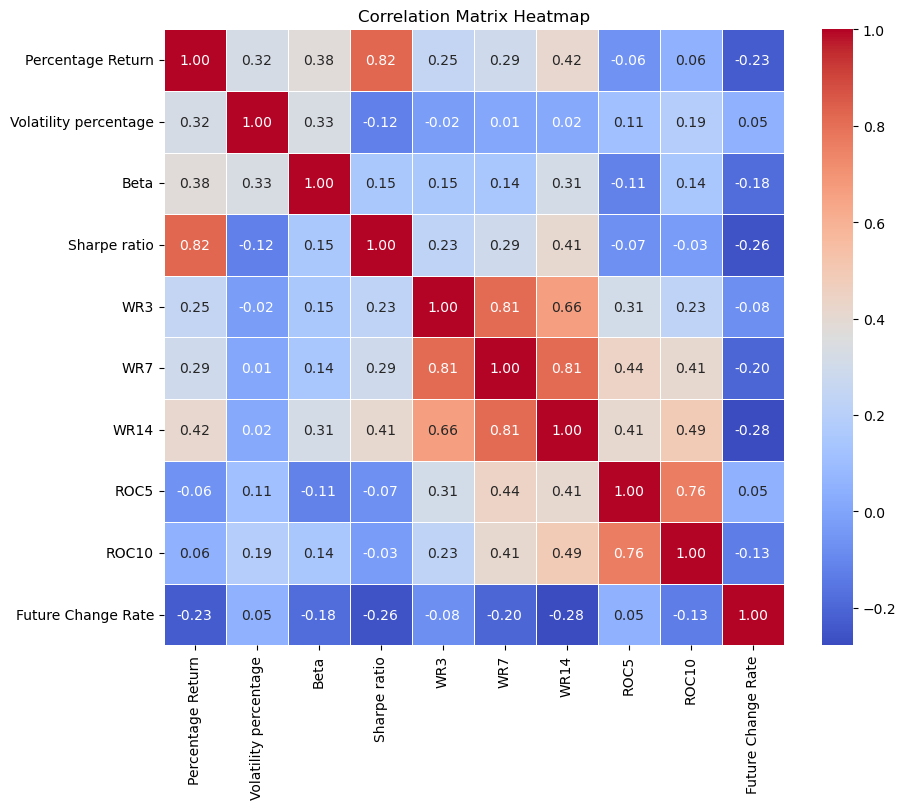

In [54]:
correlation_matrix = combined_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

- We will remove the <b>'Percentage Return'</b> and <b>'Volatility Percentage'</b> columns because they have already been used in the calculations of the beta and Sharpe ratio values.

In [55]:
combined_df2 = combined_df[['Beta','Sharpe ratio','WR3','WR7','WR14','ROC5','ROC10','Future Change Rate']]

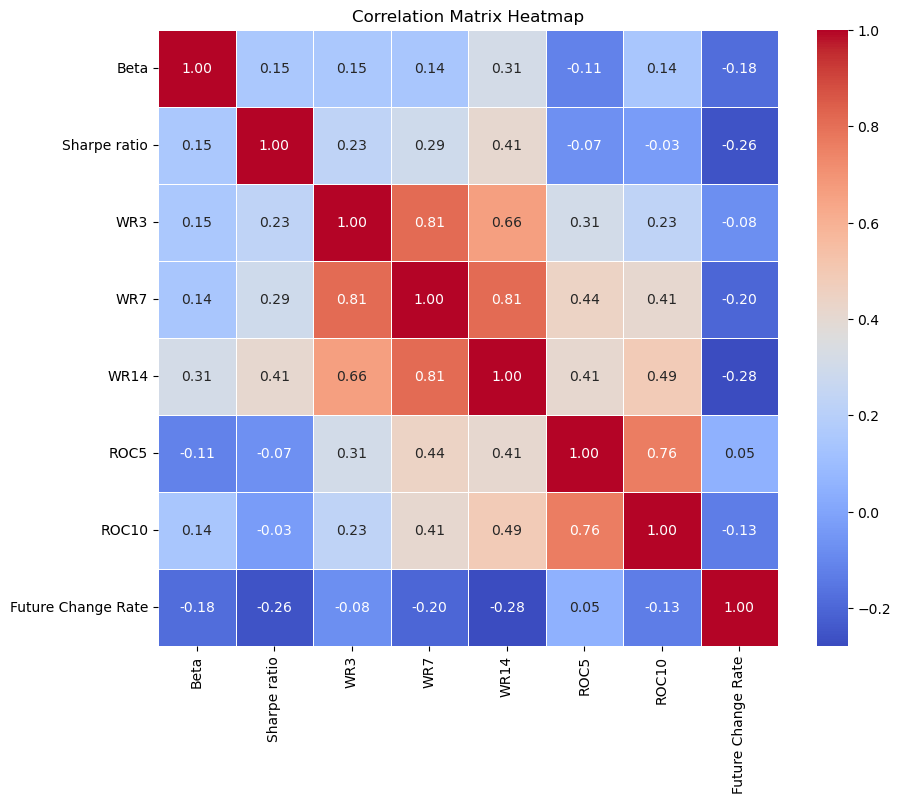

In [56]:
correlation_matrix2 = combined_df2.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [57]:
df_combined_clust = combined_df2.reset_index().rename(columns={'index': 'stock_name'})

In [58]:
df_combined_clust

,stock_name,Beta,Sharpe ratio,WR3,WR7,WR14,ROC5,ROC10,Future Change Rate
0,A,0.974865,4.226086,-62.739725,-58.793399,-38.945612,0.592689,2.899928,-0.001457
1,AA,1.554146,0.549787,-10.374677,-26.948112,-12.671785,5.603983,10.994760,0.000436
2,AACG,0.741773,-0.076579,-15.384640,-22.222233,-22.222233,6.666660,-3.030309,0.000576
3,AACI,-0.007480,0.000000,-0.000000,-85.910647,-81.896862,0.000000,-14.398598,0.004500
4,AACT,0.005158,3.086534,-85.713896,-85.713896,-59.999237,-0.092939,0.093112,-0.001357
...,...,...,...,...,...,...,...,...,...
94,ADPT,1.623331,-1.149636,-8.928521,-26.086929,-19.889490,0.621122,8.724840,0.000092
95,ADRT,0.169922,0.196613,-63.888861,-77.124175,-83.064513,1.741887,-5.722669,0.043743
96,ADSE,0.247239,0.425012,-20.996444,-23.183391,-30.625008,-4.391369,0.730521,-0.002280
97,ADSK,1.354116,2.548534,-8.534614,-5.602529,-2.002263,2.832050,6.163697,-0.001472


- This is the final dataset that we will use in the final notebook

In [59]:
df_combined_clust.to_excel("stocks_Real_Time.xlsx", index=False)